<center><b>CLASIFICACIÓN: LEAGUE OF LEGENDS DIAMOND RANKED GAMES (10 MIN)</b></center>

Este conjunto de datos contiene los primeros 10 minutos. estadísticas de aprox. 10k juegos clasificados (SOLO QUEUE) de un ELO alto (DIAMOND I a MASTER). Los jugadores tienen aproximadamente el mismo nivel.

Cada juego es único. El gameId puede ayudarlo a obtener más atributos de la API de Riot.

Hay 19 funciones por equipo (38 en total) recopiladas después de 10 minutos en el juego. Esto incluye asesinatos, muertes, oro, experiencia, nivel... Depende de usted hacer un poco de ingeniería de funciones para obtener más información.

La columna blueWins es el valor objetivo (el valor que intentamos predecir). Un valor de 1 significa que el equipo azul ha ganado. 0 de lo contrario.

![Texto alternativo de la imagen](https://fotos.perfil.com/2022/02/01/trim/1280/720/conoce-todos-los-detalles-acerca-de-lol-y-enterate-como-se-juega-1306879.jpg)



<b>Objetivos del presente proyecto</b>

* Efectuar una red neuronal sobre un dataset propio a poder ser siguiendo cualquiera de los tutoriales de la documentación de Tensorflow. El objetivo del ejercicio es poner en práctica el concepto de "prototipado rápido" y cruzar la línea para empezar a trabajar en un problema real.<br>

* Se requiere probar 2 arquitecturas. Es decir, 2 funciones de creación de modelo dinámicas como las vistas en clase que serán las usadas en el grid search de hiper parámetros. <br>

* Se requiere una búsqueda de hiperparámetros. <br>

* Una vez elegido un modelo, hacer un grid search cambiando únicamente uno de los hyper parámetros. Estudiar cuál es su efecto y comprobar que sea el esperado a corde a los notebooks vistos en clase "nn_architecture". Se requiere estudiar 3 parámetros (learning rate, batch size, drop_out, activaciones, escalado de variables, etc. a elegir 3)
Hacer un cambio sobre las las variables (feature engineering) y ver cúal es el efecto sobre el modelo. <br>

<b>Guia </b>

A continuación se describen los pasos y la estrucutura del presente proyecto:
<br>
1- <b>Eliminación de valores atípicos y estandarización de los datos. </b>
<br>
2- <b> Creación del Modelo lineal </b> para saber el feedback y si con una red neuronal predice la victoria del equipo Rojo y Azul.
<br>
3- <b>Creación de una red neuronal con varias capas densas en forma de limon</b>, es decir, el número de neuronas ira aumentado hasta llegar al "climactic moment" y a partir de este momento las neuronas en cada capa densa irán disminuyendo.
<br>
4- <b>Creación de una red neuronal con varias capas densas en forma decreciente</b>, es decir, el número de neuronas ira disminuyendo hasta llegar al "climactic moment" que se cree oportuno.
<br>
5- Con las 3 arquitecturas creadas realizar <b>grid search inicial.</b>
<br>
6- Elección del modelo, <b>tipo de forma de la arquitectura de la Red Neuronal.</b>
<br>
7- <b>Cambiar 3 hiper parámetros</b> y comparar los resultados con la red anterior: <i>Regularización</i>; <i>Activación y Función de Pérdida</i>; <i>Batch Size</i> y <i>Dense Layers</i>.
<br>
8- Realizar una <b>selección de variables y aplicar la red neuronal óptima anterior</b> y comparar los resultados.
<br>
9- Conclusión y <b>elección de la red neuronal óptima.</b>

<b>Importación de librerías</b>

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras import optimizers
from tensorflow.keras import layers, initializers
from sklearn.metrics import confusion_matrix, f1_score

from sklearn.model_selection import GridSearchCV
from keras.wrappers.scikit_learn import KerasClassifier

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.ensemble import RandomForestRegressor

from keras import backend as K
from keras import regularizers

import shap
import ipywidgets as widgets
import matplotlib.pyplot as plt
import matplotlib as mpl
import itertools
%matplotlib inline

2023-05-10 17:30:16.929099: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


<b>Lectura de los datos</b>

In [2]:
df= pd.read_csv('/Users/raulartiguesfemenia/Desktop/Deep Learning/Entrega1/high_diamond_ranked_10min.csv')
df.head(5)

,gameId,blueWins,blueWardsPlaced,blueWardsDestroyed,blueFirstBlood,blueKills,blueDeaths,blueAssists,blueEliteMonsters,blueDragons,...,redTowersDestroyed,redTotalGold,redAvgLevel,redTotalExperience,redTotalMinionsKilled,redTotalJungleMinionsKilled,redGoldDiff,redExperienceDiff,redCSPerMin,redGoldPerMin
0,4519157822,0,28,2,1,9,6,11,0,0,...,0,16567,6.8,17047,197,55,-643,8,19.7,1656.7
1,4523371949,0,12,1,0,5,5,5,0,0,...,1,17620,6.8,17438,240,52,2908,1173,24.0,1762.0
2,4521474530,0,15,0,0,7,11,4,1,1,...,0,17285,6.8,17254,203,28,1172,1033,20.3,1728.5
3,4524384067,0,43,1,0,4,5,5,1,0,...,0,16478,7.0,17961,235,47,1321,7,23.5,1647.8
4,4436033771,0,75,4,0,6,6,6,0,0,...,0,17404,7.0,18313,225,67,1004,-230,22.5,1740.4


<center><b>1 - ELIMINACIÓN DE VALORES ATÍPICOS Y ESTANDARIZACIÓN DE LOS DATOS</b> <center>

<b>Procesamiento y limpieza de datos</b>

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9879 entries, 0 to 9878
Data columns (total 40 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   gameId                        9879 non-null   int64  
 1   blueWins                      9879 non-null   int64  
 2   blueWardsPlaced               9879 non-null   int64  
 3   blueWardsDestroyed            9879 non-null   int64  
 4   blueFirstBlood                9879 non-null   int64  
 5   blueKills                     9879 non-null   int64  
 6   blueDeaths                    9879 non-null   int64  
 7   blueAssists                   9879 non-null   int64  
 8   blueEliteMonsters             9879 non-null   int64  
 9   blueDragons                   9879 non-null   int64  
 10  blueHeralds                   9879 non-null   int64  
 11  blueTowersDestroyed           9879 non-null   int64  
 12  blueTotalGold                 9879 non-null   int64  
 13  blu

No existe valores nulos y todas las variables del conjunto de datos son numéricas por lo que no hay que hacer ningún método de codificación.

In [4]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
gameId,9879.0,4.500084e+09,2.757328e+07,4.295358e+09,4.483301e+09,4.510920e+09,4.521733e+09,4.527991e+09
blueWins,9879.0,4.990384e-01,5.000244e-01,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00
blueWardsPlaced,9879.0,2.228829e+01,1.801918e+01,5.000000e+00,1.400000e+01,1.600000e+01,2.000000e+01,2.500000e+02
blueWardsDestroyed,9879.0,2.824881e+00,2.174998e+00,0.000000e+00,1.000000e+00,3.000000e+00,4.000000e+00,2.700000e+01
blueFirstBlood,9879.0,5.048082e-01,5.000022e-01,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
blueKills,9879.0,6.183925e+00,3.011028e+00,0.000000e+00,4.000000e+00,6.000000e+00,8.000000e+00,2.200000e+01
blueDeaths,9879.0,6.137666e+00,2.933818e+00,0.000000e+00,4.000000e+00,6.000000e+00,8.000000e+00,2.200000e+01
blueAssists,9879.0,6.645106e+00,4.064520e+00,0.000000e+00,4.000000e+00,6.000000e+00,9.000000e+00,2.900000e+01
blueEliteMonsters,9879.0,5.499544e-01,6.255265e-01,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,2.000000e+00
blueDragons,9879.0,3.619800e-01,4.805974e-01,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00


In [5]:
df.columns

Index(['gameId', 'blueWins', 'blueWardsPlaced', 'blueWardsDestroyed',
       'blueFirstBlood', 'blueKills', 'blueDeaths', 'blueAssists',
       'blueEliteMonsters', 'blueDragons', 'blueHeralds',
       'blueTowersDestroyed', 'blueTotalGold', 'blueAvgLevel',
       'blueTotalExperience', 'blueTotalMinionsKilled',
       'blueTotalJungleMinionsKilled', 'blueGoldDiff', 'blueExperienceDiff',
       'blueCSPerMin', 'blueGoldPerMin', 'redWardsPlaced', 'redWardsDestroyed',
       'redFirstBlood', 'redKills', 'redDeaths', 'redAssists',
       'redEliteMonsters', 'redDragons', 'redHeralds', 'redTowersDestroyed',
       'redTotalGold', 'redAvgLevel', 'redTotalExperience',
       'redTotalMinionsKilled', 'redTotalJungleMinionsKilled', 'redGoldDiff',
       'redExperienceDiff', 'redCSPerMin', 'redGoldPerMin'],
      dtype='object')

<b>Renombrar la variable objetivo <i>(blueWins)</i> a <i>Target</i></b>

In [6]:
df = df.rename(columns={'blueWins': 'Target'})

<b>Matriz de correlación</b>

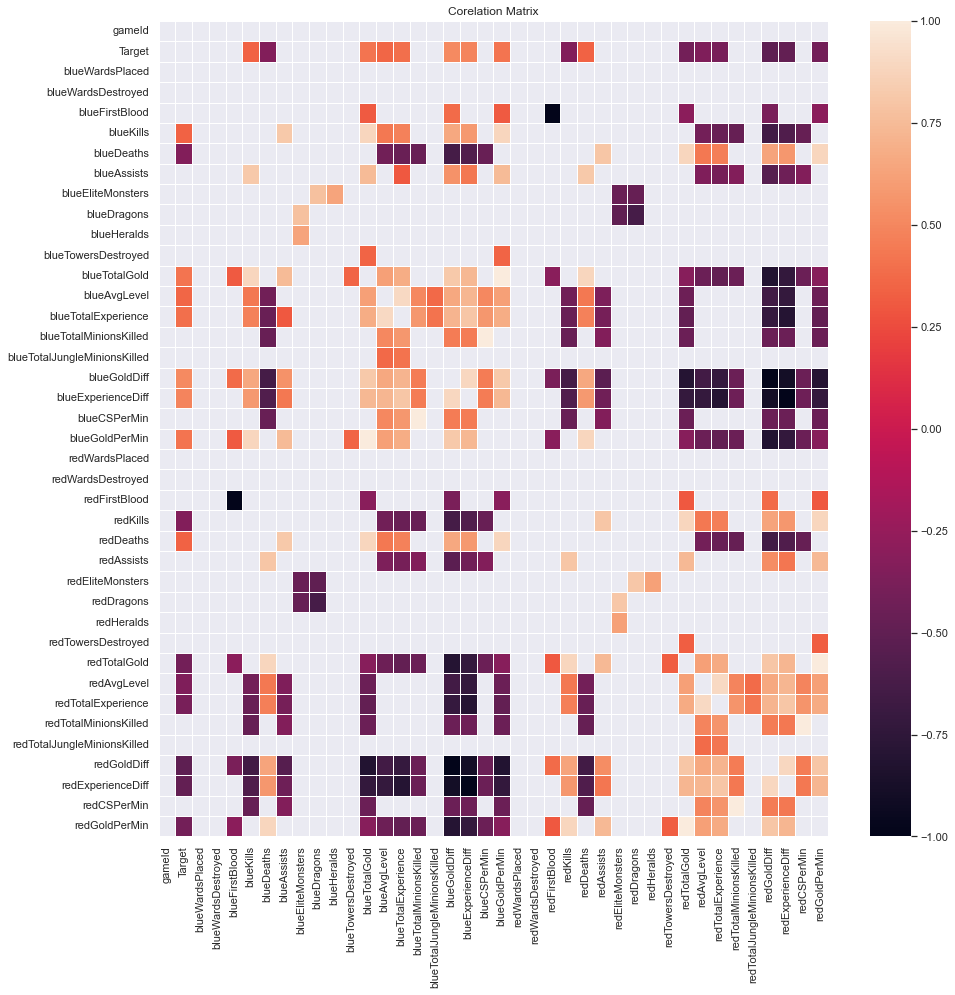

In [7]:
sns.set(rc={'figure.figsize':(15,15)})
corr = df.corr()
sns.heatmap(corr[((corr >= 0.3) | (corr <= -0.3)) & (corr != 1)], annot=False, linewidths=.5, fmt= '.2f')
plt.title('Corelation Matrix');

<b>Dispersión de la variable <i>Target</i></b>

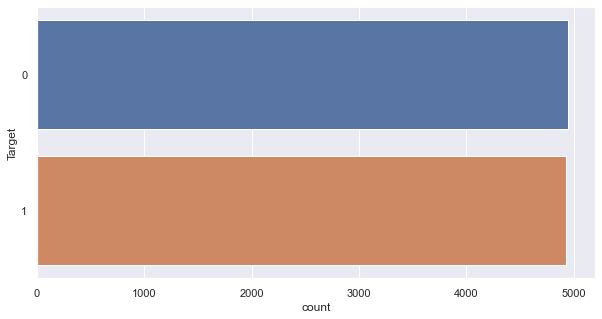

In [8]:
sns.set(rc={'figure.figsize':(10,5)})
sns.countplot(y=df['Target'])
plt.show()

Se puede osbervar que existe la misma cantidad de victorias del equipo azul (1) y rojo (0), es decir, no existe asimetria en las categorias de la variable objetivo.

Observando las correlaciones de las variables y el nombre de las variables más adelante se aplicán técncias de selección de variables ya que hay algunas que no estan correlacioandas y este puede provocar un peso al modelo innecesario. En un primer momento, se tendrán en cuenta todas las variables para ver en que situación se inicializá.

<b>Valores atípicos</b>

Se procede a eliminar aquellos valores de todas las variables, excepto la varibale Target, que sobrepasan un rango intercuartílico de 1.5 (valores atípicos).

In [9]:
def get_outlier(df=None, column=None, weight=1.5):
    new_col = df[df['Target'] == 1][column] # Detect the outlier separately when the blueWins is 0 or 1
    quantile_25 = np.percentile(new_col.values, 25)
    quantile_75 = np.percentile(new_col.values, 75)

    IQR = quantile_75 - quantile_25
    IQR_weight = IQR * weight
  
    lowest = quantile_25 - IQR_weight
    highest = quantile_75 + IQR_weight
  
    outlier_idx = new_col[(new_col < lowest) | (new_col > highest)].index
    return outlier_idx

In [10]:
new_df = df.copy()

for col in new_df.columns[2:]:
    outlier_idx = get_outlier(df=new_df, column=col, weight=1.5)
    
    new_df.drop(outlier_idx, axis=0, inplace=True)

print('Removed outliers: %d' % (df.shape[0] - new_df.shape[0]))

Removed outliers: 3082


In [11]:
print(df.shape)
print(new_df.shape)

(9879, 40)
(6797, 40)


Se han eliminado 3082 valores atípicos. Por tanto la dimensión del nuevo conjunto de datos es 6797 registros y 40 variables.

<b>Estandarización</b>

Estandarizamos todas las variables numéricas entre los valores 0 y 1

In [12]:
scaler_dict = {}
# data normalization
for col_name in new_df.columns.difference(['Target']):
    if(new_df[col_name].dtype == 'int64') or (new_df[col_name].dtype == 'float64'):
        print(col_name + ' ' + str(new_df[col_name].dtype))
        scaler = MinMaxScaler(feature_range=(0, 1))
        scaler = scaler.fit(new_df[col_name].values.reshape(-1, 1))
        new_df[col_name] = scaler.transform(new_df[col_name].values.reshape(-1, 1))
        scaler_dict[col_name] = scaler
scaler_dict

blueAssists int64
blueAvgLevel float64
blueCSPerMin float64
blueDeaths int64
blueDragons int64
blueEliteMonsters int64
blueExperienceDiff int64
blueFirstBlood int64
blueGoldDiff int64
blueGoldPerMin float64
blueHeralds int64
blueKills int64
blueTotalExperience int64
blueTotalGold int64
blueTotalJungleMinionsKilled int64
blueTotalMinionsKilled int64
blueTowersDestroyed int64
blueWardsDestroyed int64
blueWardsPlaced int64
gameId int64
redAssists int64
redAvgLevel float64
redCSPerMin float64
redDeaths int64
redDragons int64
redEliteMonsters int64
redExperienceDiff int64
redFirstBlood int64
redGoldDiff int64
redGoldPerMin float64
redHeralds int64
redKills int64
redTotalExperience int64
redTotalGold int64
redTotalJungleMinionsKilled int64
redTotalMinionsKilled int64
redTowersDestroyed int64
redWardsDestroyed int64
redWardsPlaced int64


{'blueAssists': MinMaxScaler(),
 'blueAvgLevel': MinMaxScaler(),
 'blueCSPerMin': MinMaxScaler(),
 'blueDeaths': MinMaxScaler(),
 'blueDragons': MinMaxScaler(),
 'blueEliteMonsters': MinMaxScaler(),
 'blueExperienceDiff': MinMaxScaler(),
 'blueFirstBlood': MinMaxScaler(),
 'blueGoldDiff': MinMaxScaler(),
 'blueGoldPerMin': MinMaxScaler(),
 'blueHeralds': MinMaxScaler(),
 'blueKills': MinMaxScaler(),
 'blueTotalExperience': MinMaxScaler(),
 'blueTotalGold': MinMaxScaler(),
 'blueTotalJungleMinionsKilled': MinMaxScaler(),
 'blueTotalMinionsKilled': MinMaxScaler(),
 'blueTowersDestroyed': MinMaxScaler(),
 'blueWardsDestroyed': MinMaxScaler(),
 'blueWardsPlaced': MinMaxScaler(),
 'gameId': MinMaxScaler(),
 'redAssists': MinMaxScaler(),
 'redAvgLevel': MinMaxScaler(),
 'redCSPerMin': MinMaxScaler(),
 'redDeaths': MinMaxScaler(),
 'redDragons': MinMaxScaler(),
 'redEliteMonsters': MinMaxScaler(),
 'redExperienceDiff': MinMaxScaler(),
 'redFirstBlood': MinMaxScaler(),
 'redGoldDiff': MinMaxSc

In [13]:
new_df.describe().T

,count,mean,std,min,25%,50%,75%,max
gameId,6797.0,0.878797,0.119718,0.0,0.802674,0.926150,0.972938,1.0
Target,6797.0,0.271885,0.444964,0.0,0.000000,0.000000,1.000000,1.0
blueWardsPlaced,6797.0,0.072325,0.074259,0.0,0.041667,0.050926,0.064815,1.0
blueWardsDestroyed,6797.0,0.100562,0.075804,0.0,0.037037,0.074074,0.148148,1.0
blueFirstBlood,6797.0,0.452553,0.497780,0.0,0.000000,0.000000,1.000000,1.0
blueKills,6797.0,0.353667,0.172185,0.0,0.250000,0.312500,0.437500,1.0
blueDeaths,6797.0,0.298260,0.134013,0.0,0.181818,0.272727,0.363636,1.0
blueAssists,6797.0,0.232127,0.142212,0.0,0.115385,0.230769,0.307692,1.0
blueEliteMonsters,6797.0,0.213256,0.273844,0.0,0.000000,0.000000,0.500000,1.0
blueDragons,6797.0,0.315875,0.464897,0.0,0.000000,0.000000,1.000000,1.0


<b>Creación del train y test del conjunto de datos del Train, Test y Validación</b>

In [14]:
# parametrization
test_size = 0.3
val_size = 0.3
epochs = 200
batch_size = 512

In [15]:
new_df= new_df.sample(frac=1)
train_df, test_df = train_test_split(new_df
                                     , test_size = test_size, random_state=0)
train_df, val_df = train_test_split(train_df
                                    , test_size = val_size, random_state=0)

# Form np arrays of labels and features.
train_features = np.array(train_df[train_df.columns.difference(['Target'])])
val_features = np.array(val_df[val_df.columns.difference(['Target'])])
test_features = np.array(test_df[test_df.columns.difference(['Target'])])

train_labels = np.array(train_df[['Target']])
val_labels = np.array(val_df[['Target']])
test_labels = np.array(test_df[['Target']])

input_len = train_features.shape[1]

shap_test_df = test_df.copy(deep = True)

In [16]:
print("La longitud del Train es:", len(train_features),"registros")
print("La longitud de la Validación es:", len(val_features),"registros")
print("La longitud del Test es:", len(test_features),"registros")

La longitud del Train es: 3329 registros
La longitud de la Validación es: 1428 registros
La longitud del Test es: 2040 registros


<center><b>2 - CREACIÓN DE LA RED NEURONAL LINEAL</b></center>

In [17]:
def recall(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

In [122]:
def make_model_Lineal(dense_layers = 12
               , dense_dropout = 0.0
               ,epochs=4
               , verbose = True):
    
    # create model
    model = Sequential()
    # Hidden Layers
    #____________________________________________________________________________
    for i in range(0,dense_layers):
            model.add(Dense(units = input_len
                        , input_dim = input_len
                        , kernel_initializer='normal'
                        , activation='relu'))

    #model.add(Dropout(dense_dropout))
        
    # Cost function Layer
    #____________________________________________________________________________
    model.add(Dense(2, activation='softmax', kernel_initializer='normal'))
    
    # Compile model
    optimizer = keras.optimizers.Adam(lr=1e-3)
    model.compile(optimizer = optimizer,
                  loss='sparse_categorical_crossentropy' 
                  ,metrics = ['accuracy',precision, recall])
    if verbose:
        print('dense_layers :' + str(dense_layers))
        print(model.summary())
        
    return model

model = make_model_Lineal()

dense_layers :12
Model: "sequential_378"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5948 (Dense)          (None, 39)                1560      
                                                                 
 dense_5949 (Dense)          (None, 39)                1560      
                                                                 
 dense_5950 (Dense)          (None, 39)                1560      
                                                                 
 dense_5951 (Dense)          (None, 39)                1560      
                                                                 
 dense_5952 (Dense)          (None, 39)                1560      
                                                                 
 dense_5953 (Dense)          (None, 39)                1560      
                                                                 
 dense_5954 (Dense)          (None,

Características de la arquitectura de la <i>red neuronal lineal</i>. 
<br><br>
Se trata de una red neuronal con 12 capas densas. Todas ellas tiene 39 neuronas ya que son los inputs o el número de variables predictoras. La última capa tiene 2 neuronas, para el valor de 1 y otra para el 0. Además, se han utlizado una activaciones relu y softmax, respectivamente.
<br><br>
El optimizador utilziado ha sido Adam (el que mejor funciona para casos de clasificación) y la función de coste/pérdida "sparse categorical crossentropy".

In [59]:
history = model.fit(train_features,
                    train_labels,
                    batch_size = batch_size,
                    epochs = epochs,
                    validation_data = (val_features, val_labels), 
                    verbose = 1)

Epoch 1/200
7/7 [==============================] - 2s 81ms/step - loss: 0.6913 - accuracy: 0.7302 - precision: 0.2328 - recall: 0.8571 - val_loss: 0.6886 - val_accuracy: 0.7115 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 2/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6857 - accuracy: 0.7302 - precision: 0.2708 - recall: 1.0000 - val_loss: 0.6827 - val_accuracy: 0.7115 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 3/200
7/7 [==============================] - 0s 11ms/step - loss: 0.6785 - accuracy: 0.7302 - precision: 0.2719 - recall: 1.0000 - val_loss: 0.6747 - val_accuracy: 0.7115 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 4/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6685 - accuracy: 0.7302 - precision: 0.2716 - recall: 1.0000 - val_loss: 0.6637 - val_accuracy: 0.7115 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 5/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6547 - accuracy: 0.7302 - precision: 0.27

Epoch 38/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3456 - accuracy: 0.8282 - precision: 0.2722 - recall: 1.0000 - val_loss: 0.3300 - val_accuracy: 0.8375 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 39/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3399 - accuracy: 0.8312 - precision: 0.2705 - recall: 1.0000 - val_loss: 0.3319 - val_accuracy: 0.8389 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 40/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3396 - accuracy: 0.8345 - precision: 0.2719 - recall: 1.0000 - val_loss: 0.3279 - val_accuracy: 0.8410 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 41/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3351 - accuracy: 0.8351 - precision: 0.2691 - recall: 1.0000 - val_loss: 0.3304 - val_accuracy: 0.8396 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 42/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3359 - accuracy: 0.8372 - precision: 0

Epoch 75/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3189 - accuracy: 0.8429 - precision: 0.2697 - recall: 1.0000 - val_loss: 0.3134 - val_accuracy: 0.8403 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 76/200
7/7 [==============================] - 0s 9ms/step - loss: 0.3184 - accuracy: 0.8411 - precision: 0.2702 - recall: 1.0000 - val_loss: 0.3139 - val_accuracy: 0.8396 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 77/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3230 - accuracy: 0.8393 - precision: 0.2705 - recall: 1.0000 - val_loss: 0.3190 - val_accuracy: 0.8361 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 78/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3232 - accuracy: 0.8390 - precision: 0.2716 - recall: 1.0000 - val_loss: 0.3194 - val_accuracy: 0.8396 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 79/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3200 - accuracy: 0.8399 - precision: 0

Epoch 112/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3133 - accuracy: 0.8468 - precision: 0.2686 - recall: 1.0000 - val_loss: 0.3160 - val_accuracy: 0.8410 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 113/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3132 - accuracy: 0.8441 - precision: 0.2708 - recall: 1.0000 - val_loss: 0.3112 - val_accuracy: 0.8403 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 114/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3120 - accuracy: 0.8474 - precision: 0.2688 - recall: 1.0000 - val_loss: 0.3104 - val_accuracy: 0.8438 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 115/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3106 - accuracy: 0.8453 - precision: 0.2705 - recall: 1.0000 - val_loss: 0.3117 - val_accuracy: 0.8375 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 116/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3101 - accuracy: 0.8450 - precisi

Epoch 149/200
7/7 [==============================] - 0s 10ms/step - loss: 0.3066 - accuracy: 0.8453 - precision: 0.2713 - recall: 1.0000 - val_loss: 0.3085 - val_accuracy: 0.8473 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 150/200
7/7 [==============================] - 0s 10ms/step - loss: 0.3040 - accuracy: 0.8447 - precision: 0.2683 - recall: 1.0000 - val_loss: 0.3109 - val_accuracy: 0.8382 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 151/200
7/7 [==============================] - 0s 9ms/step - loss: 0.3038 - accuracy: 0.8450 - precision: 0.2705 - recall: 1.0000 - val_loss: 0.3126 - val_accuracy: 0.8375 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 152/200
7/7 [==============================] - 0s 11ms/step - loss: 0.3046 - accuracy: 0.8468 - precision: 0.2716 - recall: 1.0000 - val_loss: 0.3109 - val_accuracy: 0.8473 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 153/200
7/7 [==============================] - 0s 10ms/step - loss: 0.3063 - accuracy: 0.8477 - pre

Epoch 186/200
7/7 [==============================] - 0s 11ms/step - loss: 0.3011 - accuracy: 0.8450 - precision: 0.2702 - recall: 1.0000 - val_loss: 0.3149 - val_accuracy: 0.8375 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 187/200
7/7 [==============================] - 0s 9ms/step - loss: 0.3026 - accuracy: 0.8468 - precision: 0.2697 - recall: 1.0000 - val_loss: 0.3124 - val_accuracy: 0.8375 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 188/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3081 - accuracy: 0.8423 - precision: 0.2733 - recall: 1.0000 - val_loss: 0.3080 - val_accuracy: 0.8445 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 189/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3060 - accuracy: 0.8468 - precision: 0.2710 - recall: 1.0000 - val_loss: 0.3226 - val_accuracy: 0.8382 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 190/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3080 - accuracy: 0.8456 - precis

In [19]:
def plot_history_train(history, string):
    plt.plot(history.history[string])
    plt.plot(history.history['val_'+string])
    plt.xlabel("Epochs")
    plt.ylabel(string)
    plt.legend([string, 'val_'+string])
    plt.show()

In [20]:
mpl.rcParams['figure.figsize'] = (12, 10)
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

def plot_history(history):
    metrics =  ['loss', 'accuracy', 'precision', 'recall']
    for n, metric in enumerate(metrics):
        name = metric.replace("_"," ").capitalize()
        plt.subplot(2,2,n+1)
        plt.plot(history.epoch,  history.history[metric], color=colors[0], label='Train')
        plt.plot(history.epoch, history.history['val_'+metric], color=colors[1]
                 #, linestyle="-"
                 , label='Val')
        plt.xlabel('Epoch')
        plt.ylabel(name)
        if metric == 'loss':
            plt.ylim([0, plt.ylim()[1]])
        elif metric == 'auc':
            plt.ylim([0.0,1])
        else:
            plt.ylim([0,1])

    plt.legend()

In [21]:
# function to plot confussion matrix
def plot_confussion_matrix(labels, predictions, classes, figsize = 3):
    
    con_mat = tf.math.confusion_matrix(labels, predictions).numpy()

    con_mat_norm = np.around(con_mat.astype('float') / con_mat.sum(axis = 1)[:, np.newaxis], decimals = 3)

    con_mat_df = pd.DataFrame(con_mat_norm,
                         index = classes, 
                         columns = classes)

    figure = plt.figure(figsize=(figsize, figsize))
    sns.heatmap(con_mat_df
                , annot=True
                , xticklabels=classes
                , yticklabels=classes
                #, cmap=plt.cm.Blues
                )
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.xlim(-0.0, len(classes))
    plt.ylim(len(classes), -0.0)
    plt.show()

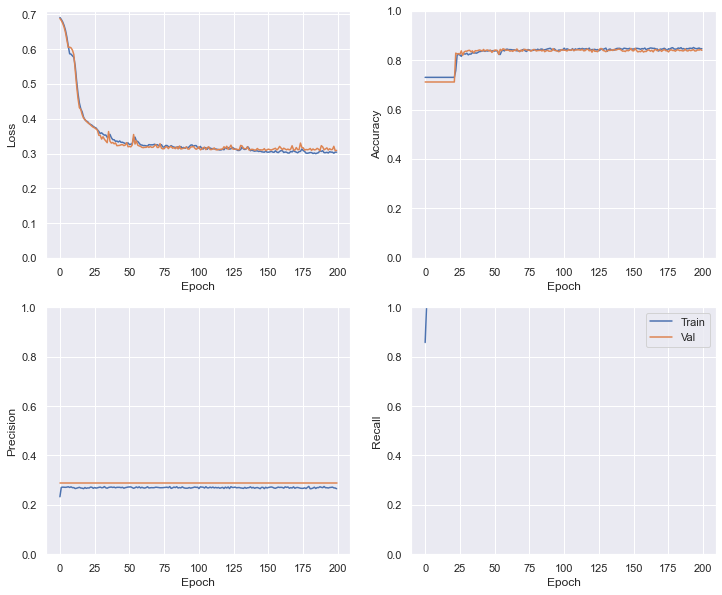

In [60]:
plot_history(history)

In [61]:
Win_dict = {'BlueWin':1, 'RedWin':0}
new_df['Target'] = new_df['Target'].map(Win_dict)
classes = Win_dict
y_pred = model.predict(val_features)

45/45 [==============================] - 0s 1ms/step


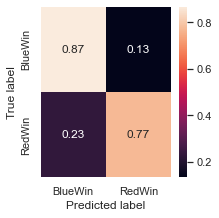

In [62]:
y_pred=np.argmax(y_pred,axis=1)
plot_confussion_matrix(labels = val_labels, predictions = y_pred, classes = classes, figsize = 3)

<b>Conclusiones del Modelo lineal</b>

Mirando los gráficos anteriores se puede observar que la primera red neuronal creada tiene buena pinta. Se parte de una posición adecuada. Sin embargo se observa que es a partri de la época 25/30 que existe un sobre ajuste. Sin embargo se van a probar más arquitecturas en el modelo para internar mejor los scores tanto de Loss como de Accuracy.

Por el otra lado, la matriz de confusión indica que a la hora de predecir las victorias del equipo Rojo el error es mayor o dicho de otra forma, la precisión empeora.

En conclusión, las métricas generales de la red neuronal son bastante buenas pero si se hace enfásis en las dos categorias de la variable Objetivo hay un problema ya que no identifica bien cuando gana el equipo Rojo. Es por ese motivo que se van a implantar/crear nuevas arquitecturas en la red neuronal.

<center><b>3 - CREACIÓN DE UNA RED NEURONAL CON VARIAS CAPAS DENSAS EN FORMA DE LIMÓN</b></center>

In [22]:
# define the model as much dynamic as possible to perform the grid search
def make_model_Limon(dense_layers = 12
               , dense_dropout = 0.0
               , verbose = True):
    
    # create model
    model = Sequential()
    # Hidden Layers
    #____________________________________________________________________________
    for i in range(0,dense_layers):
        if i==0:
            model.add(Dense(units = input_len
                        , input_dim = input_len
                        , kernel_initializer='normal'
                        , activation='relu'))
            
        elif i>=1 and i<=6:
            model.add(Dense(units = input_len+i
                        , input_dim = input_len
                        , kernel_initializer='normal'
                        , activation='relu'))
        
        else: 
            model.add(Dense(units = input_len-(i-4)
                        , input_dim = input_len
                        , kernel_initializer='normal'
                        , activation='relu'))
    #model.add(Dropout(dense_dropout))
        
    # Cost function Layer
    #____________________________________________________________________________
    model.add(Dense(2, activation='softmax', kernel_initializer='normal'))
    
    # Compile model
    optimizer = keras.optimizers.Adam(lr=1e-3)
    model.compile(optimizer = optimizer
                  ,loss='sparse_categorical_crossentropy' 
                  ,metrics = ['accuracy', precision, recall])
    if verbose:
        print('dense_layers :' + str(dense_layers))
        print(model.summary())
        
    return model

model = make_model_Limon()

dense_layers :12
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_13 (Dense)            (None, 39)                1560      
                                                                 
 dense_14 (Dense)            (None, 40)                1600      
                                                                 
 dense_15 (Dense)            (None, 41)                1681      
                                                                 
 dense_16 (Dense)            (None, 42)                1764      
                                                                 
 dense_17 (Dense)            (None, 43)                1849      
                                                                 
 dense_18 (Dense)            (None, 44)                1936      
                                                                 
 dense_19 (Dense)            (None, 4

Características de la arquitectura de la <i>red neuronal en forma de limón</i>. 
<br><br>
Se trata de una red neuronal con 12 capas densas. La característica del presente modelo es que el número de neuronas va creciento, concretamento, por cada capa que aumenta, el número de neuronas crece i veces hasta llegar al "climactic moment", el cual se establece en la 6 capa. Una vez se llega a este punto el número de capas disminuye i-4 veces. Con esta implementación se consigue crear una estrucutra neuronal con forma de limón.
<br><br>
La última capa tiene 2 neuronas, para el valor de 1 y otra para el 0. Además, se han utlizado una activaciones relu y softmax, respectivamente.
<br><br>
El optimizador utilziado ha sido Adam (el que mejor funciona para casos de clasificación) y la función de coste/pérdida "sparse categorical crossentropy".

In [53]:
history = model.fit(train_features,
                    train_labels,
                    batch_size = batch_size,
                    epochs = epochs,
                    validation_data = (val_features, val_labels), 
                    verbose = 1)

Epoch 1/200
7/7 [==============================] - 2s 39ms/step - loss: 0.6915 - accuracy: 0.7302 - precision: 0.2342 - recall: 0.8571 - val_loss: 0.6892 - val_accuracy: 0.7115 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 2/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6869 - accuracy: 0.7302 - precision: 0.2702 - recall: 1.0000 - val_loss: 0.6845 - val_accuracy: 0.7115 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 3/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6813 - accuracy: 0.7302 - precision: 0.2655 - recall: 1.0000 - val_loss: 0.6787 - val_accuracy: 0.7115 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 4/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6742 - accuracy: 0.7302 - precision: 0.2669 - recall: 1.0000 - val_loss: 0.6711 - val_accuracy: 0.7115 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 5/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6644 - accuracy: 0.7302 - precision: 0.269

Epoch 38/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3442 - accuracy: 0.8291 - precision: 0.2713 - recall: 1.0000 - val_loss: 0.3383 - val_accuracy: 0.8333 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 39/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3387 - accuracy: 0.8342 - precision: 0.2705 - recall: 1.0000 - val_loss: 0.3280 - val_accuracy: 0.8410 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 40/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3377 - accuracy: 0.8330 - precision: 0.2713 - recall: 1.0000 - val_loss: 0.3273 - val_accuracy: 0.8382 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 41/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3336 - accuracy: 0.8348 - precision: 0.2694 - recall: 1.0000 - val_loss: 0.3249 - val_accuracy: 0.8431 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 42/200
7/7 [==============================] - 0s 9ms/step - loss: 0.3324 - accuracy: 0.8357 - precision: 0

Epoch 75/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3177 - accuracy: 0.8399 - precision: 0.2663 - recall: 1.0000 - val_loss: 0.3201 - val_accuracy: 0.8410 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 76/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3184 - accuracy: 0.8411 - precision: 0.2727 - recall: 1.0000 - val_loss: 0.3145 - val_accuracy: 0.8424 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 77/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3157 - accuracy: 0.8405 - precision: 0.2710 - recall: 1.0000 - val_loss: 0.3142 - val_accuracy: 0.8410 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 78/200
7/7 [==============================] - 0s 9ms/step - loss: 0.3156 - accuracy: 0.8402 - precision: 0.2661 - recall: 1.0000 - val_loss: 0.3192 - val_accuracy: 0.8368 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 79/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3160 - accuracy: 0.8387 - precision: 0

Epoch 112/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3090 - accuracy: 0.8396 - precision: 0.2713 - recall: 1.0000 - val_loss: 0.3177 - val_accuracy: 0.8396 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 113/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3080 - accuracy: 0.8435 - precision: 0.2658 - recall: 1.0000 - val_loss: 0.3185 - val_accuracy: 0.8375 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 114/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3119 - accuracy: 0.8390 - precision: 0.2677 - recall: 1.0000 - val_loss: 0.3135 - val_accuracy: 0.8354 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 115/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3060 - accuracy: 0.8468 - precision: 0.2705 - recall: 1.0000 - val_loss: 0.3159 - val_accuracy: 0.8403 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 116/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3124 - accuracy: 0.8420 - precisi

Epoch 149/200
7/7 [==============================] - 0s 9ms/step - loss: 0.3089 - accuracy: 0.8411 - precision: 0.2738 - recall: 1.0000 - val_loss: 0.3113 - val_accuracy: 0.8410 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 150/200
7/7 [==============================] - 0s 9ms/step - loss: 0.3102 - accuracy: 0.8372 - precision: 0.2688 - recall: 1.0000 - val_loss: 0.3325 - val_accuracy: 0.8389 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 151/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3049 - accuracy: 0.8468 - precision: 0.2713 - recall: 1.0000 - val_loss: 0.3144 - val_accuracy: 0.8375 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 152/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3000 - accuracy: 0.8474 - precision: 0.2683 - recall: 1.0000 - val_loss: 0.3141 - val_accuracy: 0.8375 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 153/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3000 - accuracy: 0.8474 - precisi

Epoch 186/200
7/7 [==============================] - 0s 9ms/step - loss: 0.2926 - accuracy: 0.8489 - precision: 0.2702 - recall: 1.0000 - val_loss: 0.3327 - val_accuracy: 0.8452 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 187/200
7/7 [==============================] - 0s 8ms/step - loss: 0.2977 - accuracy: 0.8468 - precision: 0.2697 - recall: 1.0000 - val_loss: 0.3124 - val_accuracy: 0.8494 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 188/200
7/7 [==============================] - 0s 8ms/step - loss: 0.2951 - accuracy: 0.8486 - precision: 0.2716 - recall: 1.0000 - val_loss: 0.3206 - val_accuracy: 0.8396 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 189/200
7/7 [==============================] - 0s 8ms/step - loss: 0.2907 - accuracy: 0.8549 - precision: 0.2713 - recall: 1.0000 - val_loss: 0.3142 - val_accuracy: 0.8410 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 190/200
7/7 [==============================] - 0s 8ms/step - loss: 0.2907 - accuracy: 0.8513 - precisi

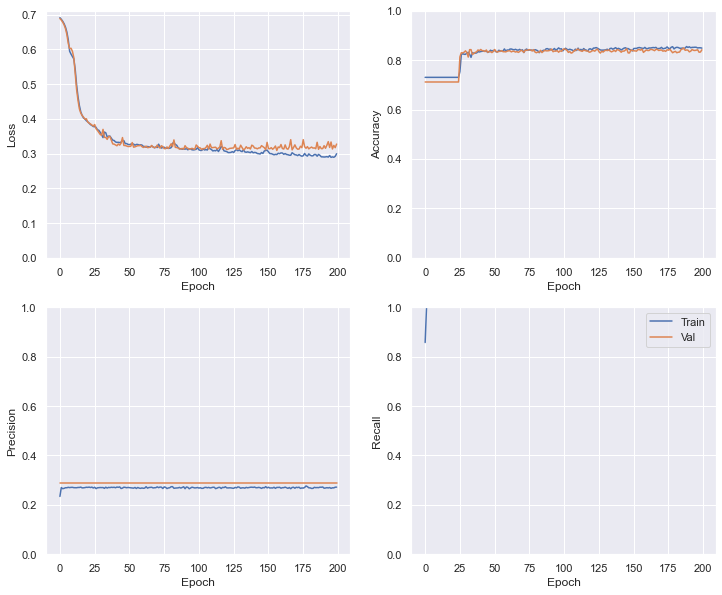

In [54]:
plot_history(history)

In [56]:
Win_dict = {'BlueWin':1, 'RedWin':0}
new_df['Target'] = new_df['Target'].map(Win_dict)
classes = Win_dict
y_pred = model.predict(val_features)

45/45 [==============================] - 0s 2ms/step


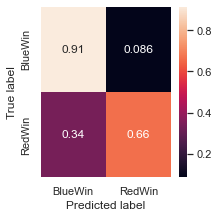

In [57]:
y_pred=np.argmax(y_pred,axis=1)
plot_confussion_matrix(labels = val_labels, predictions = y_pred, classes = classes, figsize = 3)

<b>Conclusiones del Modelo en forma de limón</b>

Mirando los gráficos anteriores se puede observar que la segunda arquitectura de red neuronal creada tiene buena pinta. Se parte de una posición adecuada. Sin embargo se observa que es a partri de la época 25/30 que existe un sobre ajuste. Sin embargo se van a probar más arquitecturas en el modelo para internar mejor los scores tanto de Loss como de Accuracy.
<br><br>
Por el otra lado, la matriz de confusión indica que a la hora de predecir las victorias del equipo Rojo el error es mayor o dicho de otra forma, la precisión empeora.
<br><br>
En conclusión, las métricas generales de la red neuronal son bastante buenas pero si se hace enfásis en las dos categorias de la variable Objetivo hay un problema ya que no identifica bien cuando gana el equipo Rojo. Es por ese motivo que se van a implantar/crear nuevas arquitecturas en la red neuronal. Esta arquitectura de forma de limón es mejor que la lineal o constante. Por tanto se está yendo por el buen camino

<center><b>4 - CREACIÓN DE UNA RED NEURONAL CON VARIAS CAPAS DENSAS EN FORMA DECRECIENTE </b></center>

In [23]:
# define the model as much dynamic as possible to perform the grid search
def make_model_Decreciente(dense_layers = 12
               , dense_dropout = 0.0
               , verbose = True):
    
    # create model
    model = Sequential()
    # Hidden Layers
    #____________________________________________________________________________
    for i in range(0,dense_layers):
        if i==0:
            model.add(Dense(units = input_len
                        , input_dim = input_len
                        , kernel_initializer='normal'
                        , activation='relu'))
        
        else: 
            model.add(Dense(units = input_len-(i-4)
                        , input_dim = input_len
                        , kernel_initializer='normal'
                        , activation='relu'))
        
    # Cost function Layer
    #____________________________________________________________________________
    model.add(Dense(2, activation='softmax', kernel_initializer='normal'))
    
    # Compile model
    optimizer = keras.optimizers.Adam(lr=1e-3)
    model.compile(optimizer = optimizer
                  ,loss='sparse_categorical_crossentropy' 
                  ,metrics = ['accuracy', precision, recall])
    if verbose:
        print('dense_layers :' + str(dense_layers))
        print(model.summary())
        
    return model

model = make_model_Decreciente()

dense_layers :12
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_26 (Dense)            (None, 39)                1560      
                                                                 
 dense_27 (Dense)            (None, 42)                1680      
                                                                 
 dense_28 (Dense)            (None, 41)                1763      
                                                                 
 dense_29 (Dense)            (None, 40)                1680      
                                                                 
 dense_30 (Dense)            (None, 39)                1599      
                                                                 
 dense_31 (Dense)            (None, 38)                1520      
                                                                 
 dense_32 (Dense)            (None, 3

Características de la arquitectura de la <i>red neuronal en forma decreciente</i>. 
<br><br>
Se trata de una red neuronal con 12 capas densas. La característica del presente modelo es que el número de neuronas va disminuyendo, concretamento, por cada capa que aumenta, el número de neuronas decreve i-4 veces hasta llegar a la última capa. Con esta implementación se consigue crear una estrucutra neuronal con forma de limón.
<br><br>
La última capa tiene 2 neuronas, para el valor de 1 y otra para el 0. Además, se han utlizado una activaciones relu y softmax, respectivamente.
<br><br>
El optimizador utilziado ha sido Adam (el que mejor funciona para casos de clasificación) y la función de coste/pérdida "sparse categorical crossentropy".

In [48]:
history = model.fit(train_features,
                    train_labels,
                    batch_size = batch_size,
                    epochs = epochs,
                    validation_data = (val_features, val_labels), 
                    verbose = 1)

Epoch 1/200
7/7 [==============================] - 2s 41ms/step - loss: 0.6913 - accuracy: 0.7302 - precision: 0.2348 - recall: 0.8571 - val_loss: 0.6887 - val_accuracy: 0.7115 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 2/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6860 - accuracy: 0.7302 - precision: 0.2686 - recall: 1.0000 - val_loss: 0.6831 - val_accuracy: 0.7115 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 3/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6792 - accuracy: 0.7302 - precision: 0.2694 - recall: 1.0000 - val_loss: 0.6758 - val_accuracy: 0.7115 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 4/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6701 - accuracy: 0.7302 - precision: 0.2688 - recall: 1.0000 - val_loss: 0.6656 - val_accuracy: 0.7115 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 5/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6570 - accuracy: 0.7302 - precision: 0.270

Epoch 38/200
7/7 [==============================] - 0s 9ms/step - loss: 0.3440 - accuracy: 0.8336 - precision: 0.2691 - recall: 1.0000 - val_loss: 0.3405 - val_accuracy: 0.8347 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 39/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3441 - accuracy: 0.8312 - precision: 0.2680 - recall: 1.0000 - val_loss: 0.3346 - val_accuracy: 0.8382 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 40/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3407 - accuracy: 0.8348 - precision: 0.2708 - recall: 1.0000 - val_loss: 0.3330 - val_accuracy: 0.8382 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 41/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3390 - accuracy: 0.8354 - precision: 0.2702 - recall: 1.0000 - val_loss: 0.3315 - val_accuracy: 0.8417 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 42/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3381 - accuracy: 0.8333 - precision: 0

Epoch 75/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3201 - accuracy: 0.8438 - precision: 0.2697 - recall: 1.0000 - val_loss: 0.3150 - val_accuracy: 0.8403 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 76/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3192 - accuracy: 0.8435 - precision: 0.2688 - recall: 1.0000 - val_loss: 0.3133 - val_accuracy: 0.8396 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 77/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3193 - accuracy: 0.8414 - precision: 0.2683 - recall: 1.0000 - val_loss: 0.3188 - val_accuracy: 0.8361 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 78/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3208 - accuracy: 0.8387 - precision: 0.2708 - recall: 1.0000 - val_loss: 0.3173 - val_accuracy: 0.8389 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 79/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3261 - accuracy: 0.8393 - precision: 0

Epoch 112/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3143 - accuracy: 0.8465 - precision: 0.2688 - recall: 1.0000 - val_loss: 0.3146 - val_accuracy: 0.8389 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 113/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3143 - accuracy: 0.8450 - precision: 0.2691 - recall: 1.0000 - val_loss: 0.3124 - val_accuracy: 0.8396 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 114/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3137 - accuracy: 0.8453 - precision: 0.2727 - recall: 1.0000 - val_loss: 0.3134 - val_accuracy: 0.8403 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 115/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3148 - accuracy: 0.8459 - precision: 0.2730 - recall: 1.0000 - val_loss: 0.3225 - val_accuracy: 0.8305 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 116/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3282 - accuracy: 0.8345 - precisi

Epoch 149/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3116 - accuracy: 0.8471 - precision: 0.2674 - recall: 1.0000 - val_loss: 0.3121 - val_accuracy: 0.8431 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 150/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3132 - accuracy: 0.8459 - precision: 0.2688 - recall: 1.0000 - val_loss: 0.3119 - val_accuracy: 0.8403 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 151/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3112 - accuracy: 0.8453 - precision: 0.2697 - recall: 1.0000 - val_loss: 0.3137 - val_accuracy: 0.8396 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 152/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3151 - accuracy: 0.8474 - precision: 0.2680 - recall: 1.0000 - val_loss: 0.3184 - val_accuracy: 0.8340 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 153/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3189 - accuracy: 0.8366 - precisi

Epoch 186/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3116 - accuracy: 0.8471 - precision: 0.2708 - recall: 1.0000 - val_loss: 0.3171 - val_accuracy: 0.8403 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 187/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3120 - accuracy: 0.8423 - precision: 0.2655 - recall: 1.0000 - val_loss: 0.3105 - val_accuracy: 0.8438 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 188/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3087 - accuracy: 0.8498 - precision: 0.2677 - recall: 1.0000 - val_loss: 0.3105 - val_accuracy: 0.8410 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 189/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3088 - accuracy: 0.8468 - precision: 0.2705 - recall: 1.0000 - val_loss: 0.3106 - val_accuracy: 0.8431 - val_precision: 0.2869 - val_recall: 1.0000
Epoch 190/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3088 - accuracy: 0.8489 - precisi

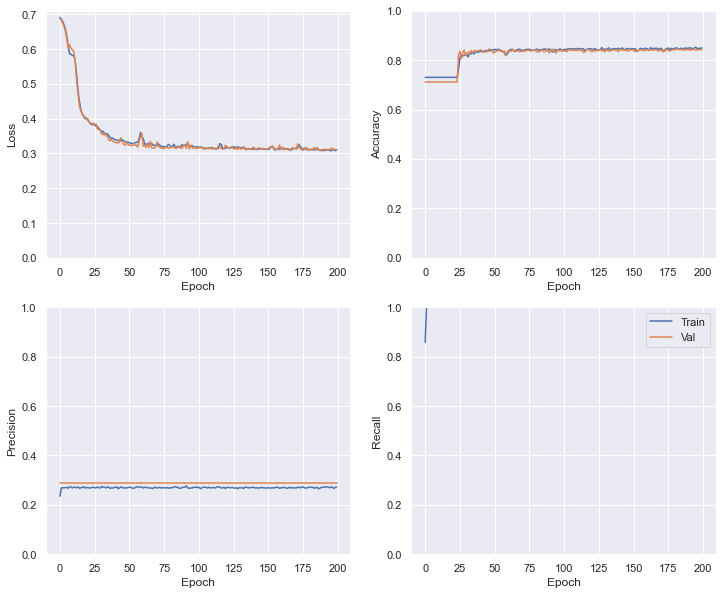

In [49]:
plot_history(history)

In [50]:
Win_dict = {'BlueWin':1, 'RedWin':0}
new_df['Target'] = new_df['Target'].map(Win_dict)
classes = Win_dict
y_pred = model.predict(val_features)

45/45 [==============================] - 0s 1ms/step


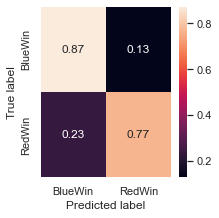

In [51]:
y_pred=np.argmax(y_pred,axis=1)
plot_confussion_matrix(labels = val_labels, predictions = y_pred, classes = classes, figsize = 3)

<b>Conclusiones del Modelo en forma decreciente</b>

Mirando los gráficos anteriores se puede observar que la tercera arquitectura de red neuronal creada es la que mejor pinta tiene. Se parte de una posición adecuada. Sin embargo se van a probar más arquitecturas en el modelo para internar mejor los scores tanto de Loss como de Accuracy. 
<br><br>
Por el otra lado, la matriz de confusión indica que a la hora de predecir las victorias del equipo Rojo el error es mayor o dicho de otra forma, la precisión empeora. (Mejor resultado hasta el momento).
<br><br>
En conclusión, las métricas generales de la red neuronal son bastante buenas pero si se hace enfásis en las dos categorias de la variable Objetivo hay un problema ya que no identifica bien cuando gana el equipo Rojo. Este tipo de forma del modelo (número de neuronas decrecientes) es la mejor hasta la fecha con los mismos parametros.

<center><b>5 - CON LAS 3 ARQUITECTURAS CREADAS REALIZAR UN GRID SEARCH INICIAL</b></center>

En este apartado se va a realizar un grid search para las 3 arquitecturas creadas: lineal, en forma de limón y decreciente y la que de mejores resultados con los mismos hiper parámetros será la elegida para ser optimizada cambiando los parametros.

Para el grid search se van a elegir los siguientes hiper parámetros:

* <b>Batch Size:</b> Los tamaños de lote a probar son <i>64</i> y <i>128</i> ya que el conjunto de datos del Train es relativamente pequeño, únicamente 3329 registros.

* <b>Epochs:</b> Debido a la poca cantidad de datos que se posee se ha decidido utilizar <i>20</i> y <i>50</i> épocas ya que se cree que si se indican más los modelos pueden sobreajusterse a los datos del Train.

* <b>Dense Layers:</b> En cuanto a las capas densas se han elegido 3 opciones: <i>10</i>,<i>15</i> y <i>20</i>. Como se van a probar 3 tipos de arquitecturas de redes neuronales es mejor que haya variedad en el número de capas densas.

* <b>Dense DropOut:</b> Las capas Dropout se utilizan para evitar el sobreajuste en el modelo. Por ese motivo se introducen 2 parámetros: el <i>0%</i> y el <i>30%</i>. Con estos valores se podrá observar si apagando el 30% de las neuronas de las capas densas de forma aleatoria provoca un mejor rendimiento en el modelo.

Por otro lado, se definen de una forma breve las métricas que se van a analizar y comparar entre las 3 arquitecturas:

* <b>Loss:</b> Es una medida que se utiliza para cuantificar el error entre la salida predicha por el modelo y la salida real esperada. La función de pérdida se utiliza para entrenar y ajustar el modelo, y el objetivo es minimizar esta pérdida.

* <b>Accuracy:</b> Es la proporción de predicciones correctas en comparación con el total de predicciones realizadas.

* <b>Sensitivity:</b> Es una medida de cuántos de los verdaderos positivos de un conjunto de datos positivos se identifican correctamente como positivos por el modelo. Se calcula como TP / (TP + FN)*.

* <b>Specificity:</b> Mide la capacidad del modelo para evitar falsos positivos, es decir, muestras negativas que son identificadas incorrectamente como positivas. Se calcula como TN / (TN + FP)*.

* <b>F1-score:</b> Es una medida útil cuando se desea equilibrar la precisión y la sensibilidad del modelo. Un F1-score alto indica que el modelo tiene un buen equilibrio entre la precisión y la sensibilidad. Se calcula como  2 * (precision * Sensitivity) / (precision + Sensitivity)
<br><br>
Cabe destacar que se van a aplicar los mismos hiper parámetros en las 3 arquitecturas para poder comparar de forma justa y correcta los rendimientos y score.

*<i>TP: True Positive, FN: False Negative, TN: True Negative, FN: False Positive </i>

In [29]:
batch_size = [64, 128]
epochs = [20,50]
dense_layers = [10, 15, 20]
dense_dropout = [0.0, 0.3]

<b>ARQUITECTURA LINEAL</b>

Proposed 24 models
dense_layers :10
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_39 (Dense)            (None, 39)                1560      
                                                                 
 dense_40 (Dense)            (None, 39)                1560      
                                                                 
 dense_41 (Dense)            (None, 39)                1560      
                                                                 
 dense_42 (Dense)            (None, 39)                1560      
                                                                 
 dense_43 (Dense)            (None, 39)                1560      
                                                                 
 dense_44 (Dense)            (None, 39)                1560      
                                                                 
 dense_45 (Dense) 

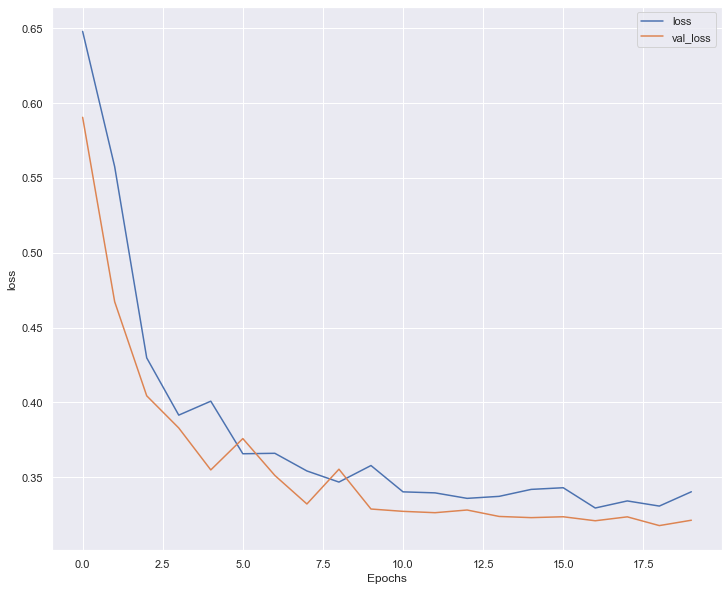

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_50 (Dense)            (None, 39)                1560      
                                                                 
 dense_51 (Dense)            (None, 39)                1560      
                                                                 
 dense_52 (Dense)            (None, 39)                1560      
                                                                 
 dense_53 (Dense)            (None, 39)                1560      
                                                                 
 dense_54 (Dense)            (None, 39)                1560      
                                                                 
 dense_55 (Dense)            (None, 39)                1560      
                                                                 
 dense_56 (Dense)            (None, 3

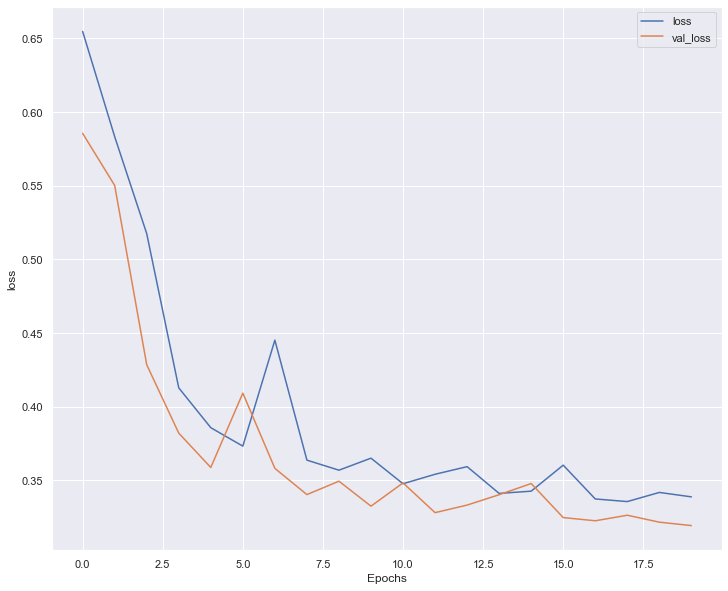

45/45 [==============================] - 0s 988us/step


dense_layers :10
Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_61 (Dense)            (None, 39)                1560      
                                                                 
 dense_62 (Dense)            (None, 39)                1560      
                                                                 
 dense_63 (Dense)            (None, 39)                1560      
                                                                 
 dense_64 (Dense)            (None, 39)                1560      
                                                                 
 dense_65 (Dense)            (None, 39)                1560      
                                                                 
 dense_66 (Dense)            (None, 39)                1560      
                                                                 
 dense_67 (Dense)            (None, 3

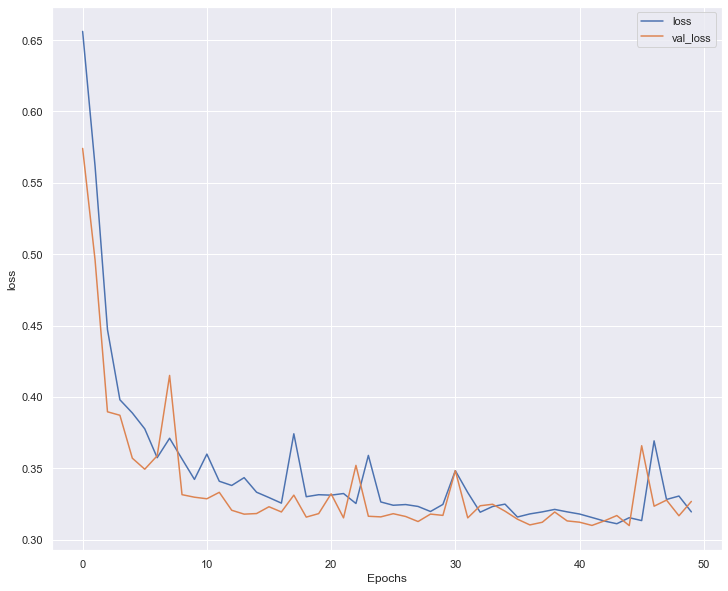

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_72 (Dense)            (None, 39)                1560      
                                                                 
 dense_73 (Dense)            (None, 39)                1560      
                                                                 
 dense_74 (Dense)            (None, 39)                1560      
                                                                 
 dense_75 (Dense)            (None, 39)                1560      
                                                                 
 dense_76 (Dense)            (None, 39)                1560      
                                                                 
 dense_77 (Dense)            (None, 39)                1560      
                                                                 
 dense_78 (Dense)            (None, 3

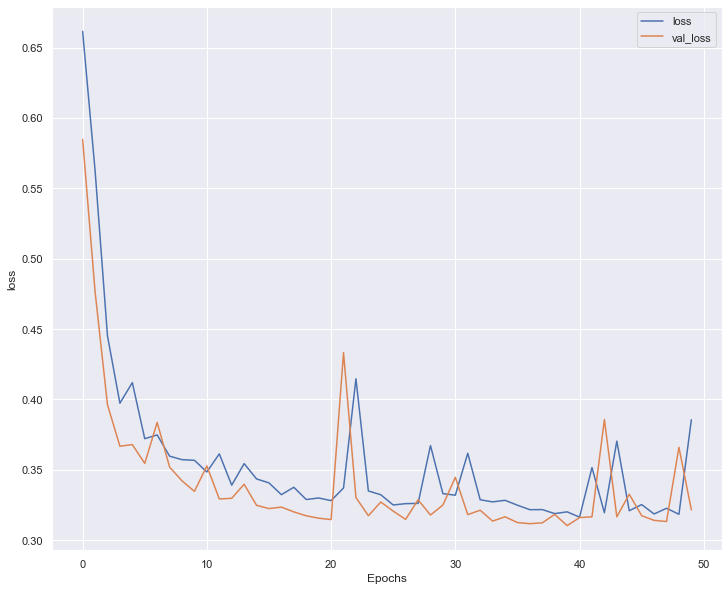

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_83 (Dense)            (None, 39)                1560      
                                                                 
 dense_84 (Dense)            (None, 39)                1560      
                                                                 
 dense_85 (Dense)            (None, 39)                1560      
                                                                 
 dense_86 (Dense)            (None, 39)                1560      
                                                                 
 dense_87 (Dense)            (None, 39)                1560      
                                                                 
 dense_88 (Dense)            (None, 39)                1560      
                                                                 
 dense_89 (Dense)            (None, 3

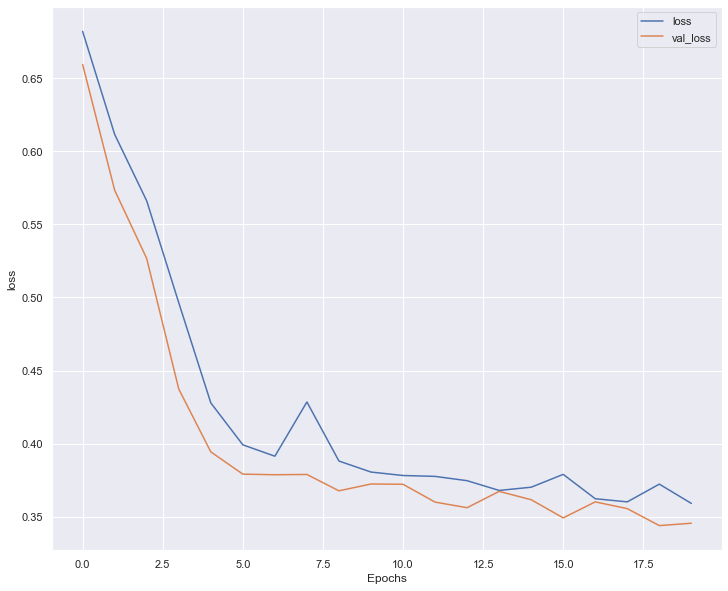

45/45 [==============================] - 0s 998us/step


dense_layers :10
Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_94 (Dense)            (None, 39)                1560      
                                                                 
 dense_95 (Dense)            (None, 39)                1560      
                                                                 
 dense_96 (Dense)            (None, 39)                1560      
                                                                 
 dense_97 (Dense)            (None, 39)                1560      
                                                                 
 dense_98 (Dense)            (None, 39)                1560      
                                                                 
 dense_99 (Dense)            (None, 39)                1560      
                                                                 
 dense_100 (Dense)           (None, 3

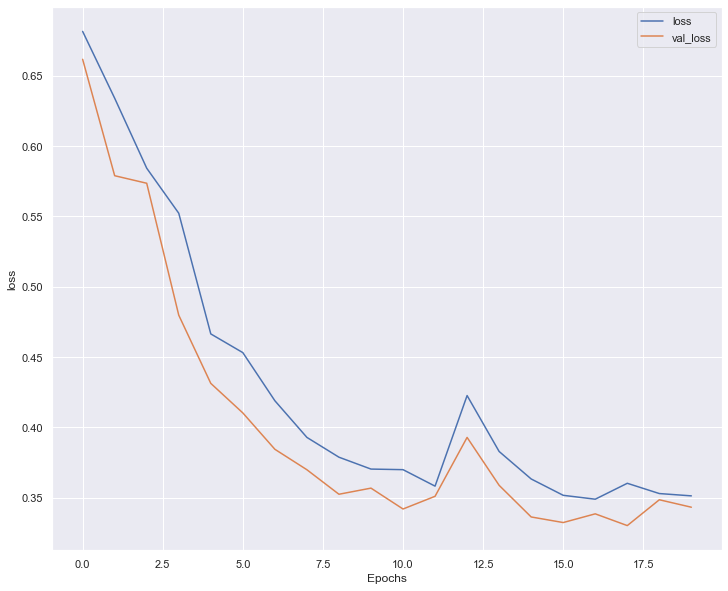

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_105 (Dense)           (None, 39)                1560      
                                                                 
 dense_106 (Dense)           (None, 39)                1560      
                                                                 
 dense_107 (Dense)           (None, 39)                1560      
                                                                 
 dense_108 (Dense)           (None, 39)                1560      
                                                                 
 dense_109 (Dense)           (None, 39)                1560      
                                                                 
 dense_110 (Dense)           (None, 39)                1560      
                                                                 
 dense_111 (Dense)           (None, 3

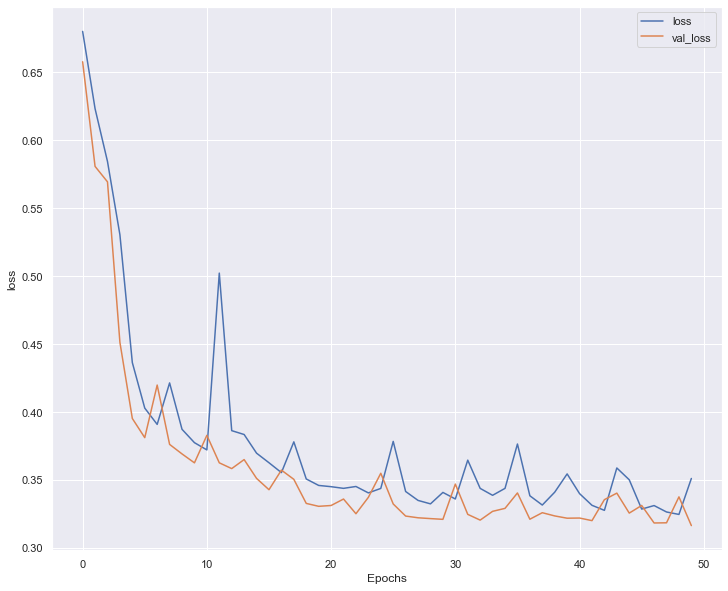

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_116 (Dense)           (None, 39)                1560      
                                                                 
 dense_117 (Dense)           (None, 39)                1560      
                                                                 
 dense_118 (Dense)           (None, 39)                1560      
                                                                 
 dense_119 (Dense)           (None, 39)                1560      
                                                                 
 dense_120 (Dense)           (None, 39)                1560      
                                                                 
 dense_121 (Dense)           (None, 39)                1560      
                                                                 
 dense_122 (Dense)           (None, 

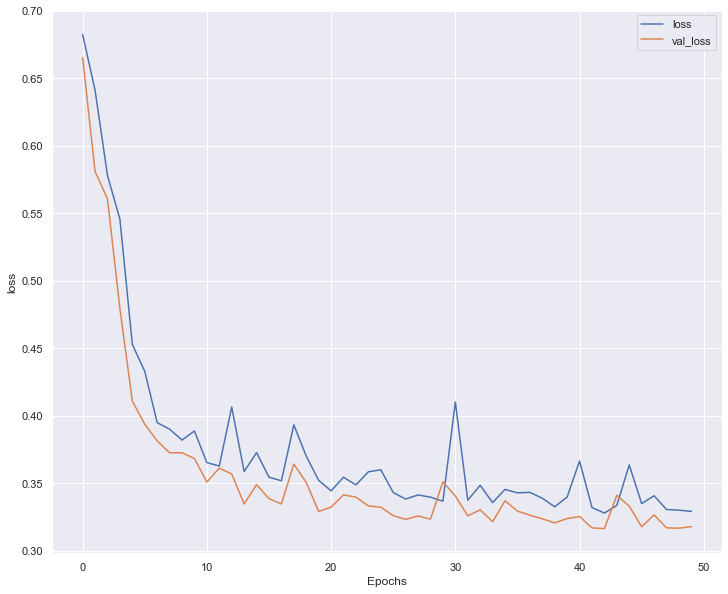

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_127 (Dense)           (None, 39)                1560      
                                                                 
 dense_128 (Dense)           (None, 39)                1560      
                                                                 
 dense_129 (Dense)           (None, 39)                1560      
                                                                 
 dense_130 (Dense)           (None, 39)                1560      
                                                                 
 dense_131 (Dense)           (None, 39)                1560      
                                                                 
 dense_132 (Dense)           (None, 39)                1560      
                                                                 
 dense_133 (Dense)           (None, 

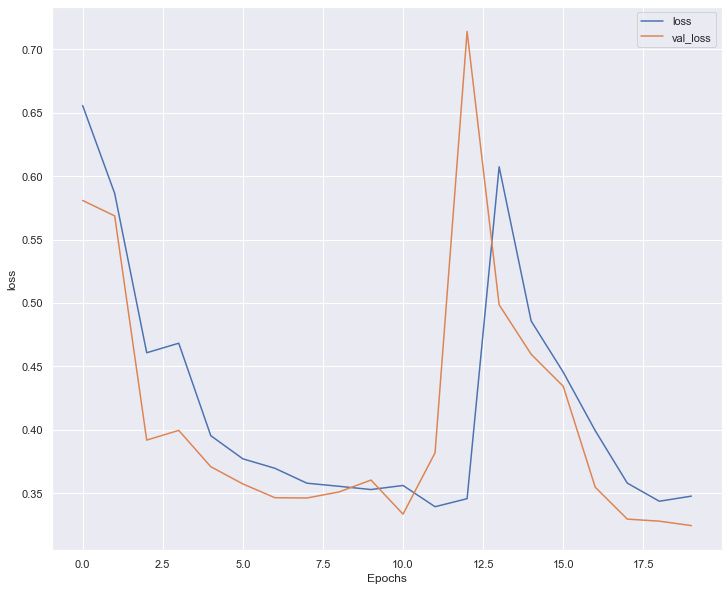

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_143 (Dense)           (None, 39)                1560      
                                                                 
 dense_144 (Dense)           (None, 39)                1560      
                                                                 
 dense_145 (Dense)           (None, 39)                1560      
                                                                 
 dense_146 (Dense)           (None, 39)                1560      
                                                                 
 dense_147 (Dense)           (None, 39)                1560      
                                                                 
 dense_148 (Dense)           (None, 39)                1560      
                                                                 
 dense_149 (Dense)           (None, 

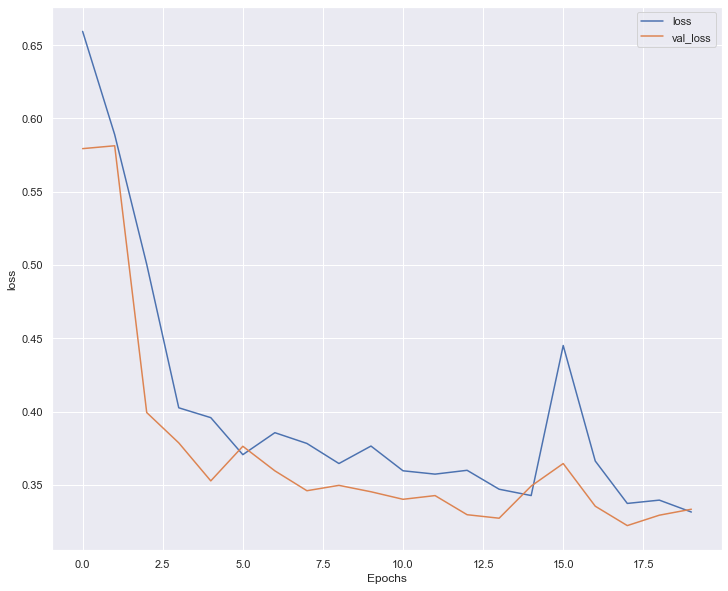

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_159 (Dense)           (None, 39)                1560      
                                                                 
 dense_160 (Dense)           (None, 39)                1560      
                                                                 
 dense_161 (Dense)           (None, 39)                1560      
                                                                 
 dense_162 (Dense)           (None, 39)                1560      
                                                                 
 dense_163 (Dense)           (None, 39)                1560      
                                                                 
 dense_164 (Dense)           (None, 39)                1560      
                                                                 
 dense_165 (Dense)           (None, 

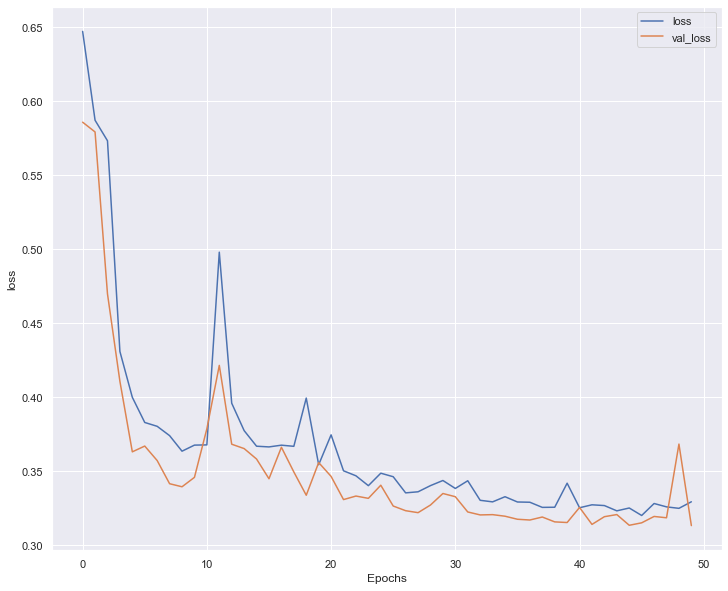

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_175 (Dense)           (None, 39)                1560      
                                                                 
 dense_176 (Dense)           (None, 39)                1560      
                                                                 
 dense_177 (Dense)           (None, 39)                1560      
                                                                 
 dense_178 (Dense)           (None, 39)                1560      
                                                                 
 dense_179 (Dense)           (None, 39)                1560      
                                                                 
 dense_180 (Dense)           (None, 39)                1560      
                                                                 
 dense_181 (Dense)           (None, 

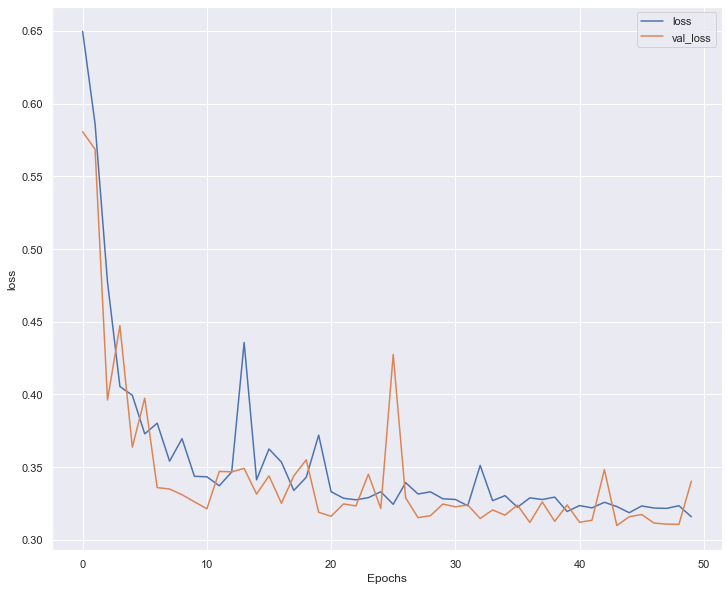

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_191 (Dense)           (None, 39)                1560      
                                                                 
 dense_192 (Dense)           (None, 39)                1560      
                                                                 
 dense_193 (Dense)           (None, 39)                1560      
                                                                 
 dense_194 (Dense)           (None, 39)                1560      
                                                                 
 dense_195 (Dense)           (None, 39)                1560      
                                                                 
 dense_196 (Dense)           (None, 39)                1560      
                                                                 
 dense_197 (Dense)           (None, 

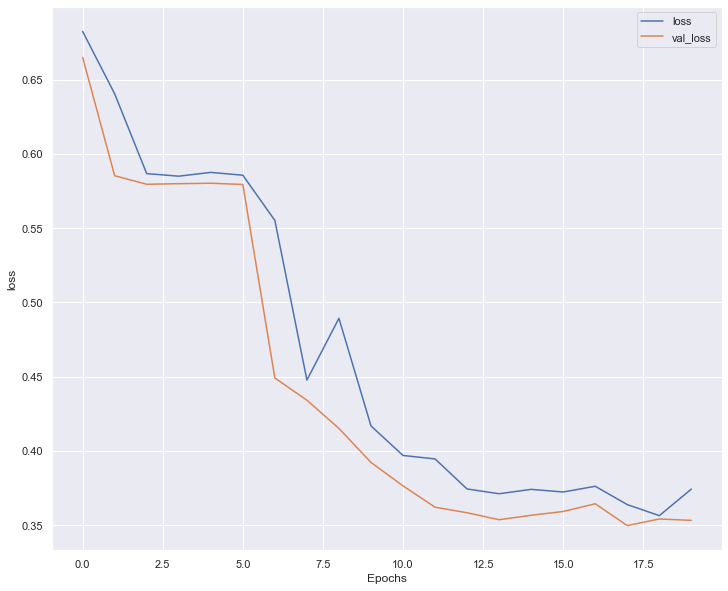

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_207 (Dense)           (None, 39)                1560      
                                                                 
 dense_208 (Dense)           (None, 39)                1560      
                                                                 
 dense_209 (Dense)           (None, 39)                1560      
                                                                 
 dense_210 (Dense)           (None, 39)                1560      
                                                                 
 dense_211 (Dense)           (None, 39)                1560      
                                                                 
 dense_212 (Dense)           (None, 39)                1560      
                                                                 
 dense_213 (Dense)           (None, 

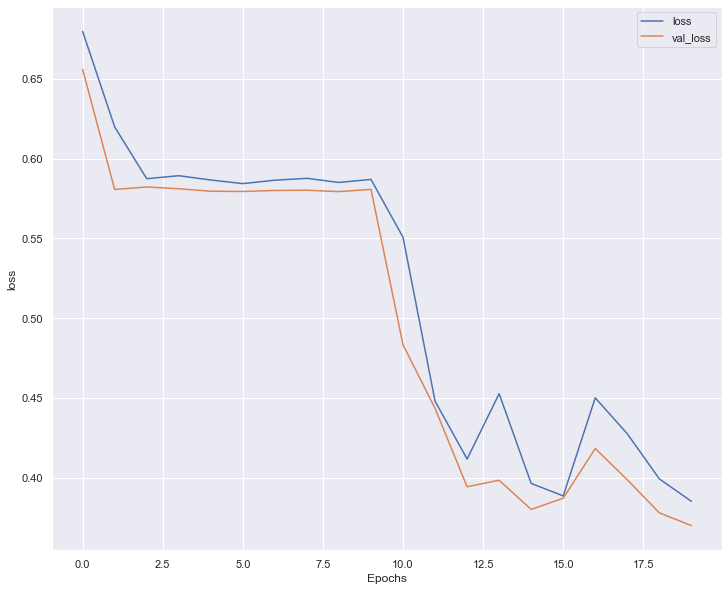

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_223 (Dense)           (None, 39)                1560      
                                                                 
 dense_224 (Dense)           (None, 39)                1560      
                                                                 
 dense_225 (Dense)           (None, 39)                1560      
                                                                 
 dense_226 (Dense)           (None, 39)                1560      
                                                                 
 dense_227 (Dense)           (None, 39)                1560      
                                                                 
 dense_228 (Dense)           (None, 39)                1560      
                                                                 
 dense_229 (Dense)           (None, 

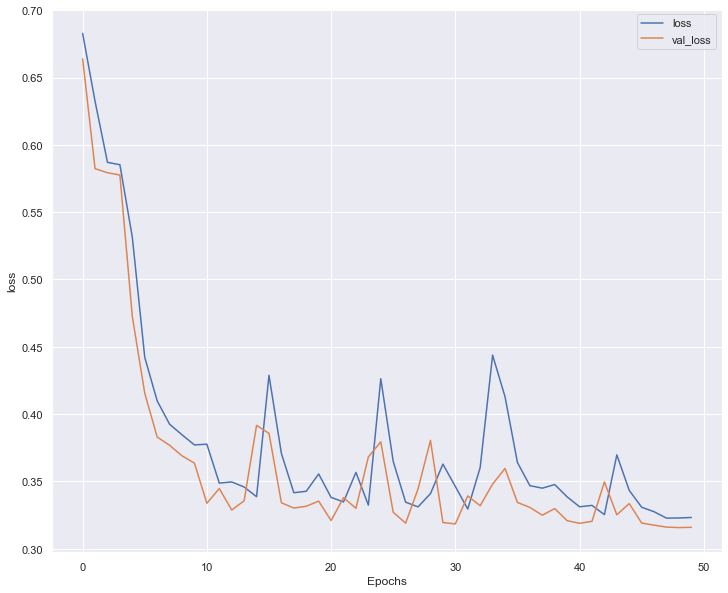

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_239 (Dense)           (None, 39)                1560      
                                                                 
 dense_240 (Dense)           (None, 39)                1560      
                                                                 
 dense_241 (Dense)           (None, 39)                1560      
                                                                 
 dense_242 (Dense)           (None, 39)                1560      
                                                                 
 dense_243 (Dense)           (None, 39)                1560      
                                                                 
 dense_244 (Dense)           (None, 39)                1560      
                                                                 
 dense_245 (Dense)           (None, 

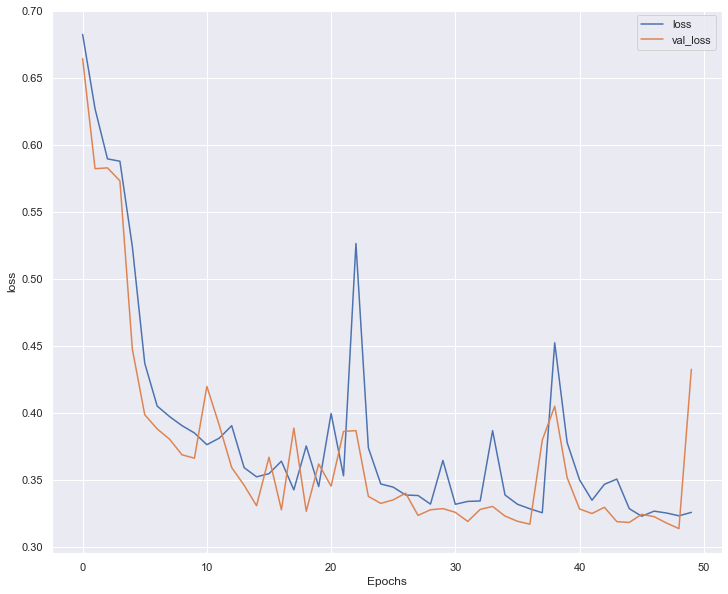

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_255 (Dense)           (None, 39)                1560      
                                                                 
 dense_256 (Dense)           (None, 39)                1560      
                                                                 
 dense_257 (Dense)           (None, 39)                1560      
                                                                 
 dense_258 (Dense)           (None, 39)                1560      
                                                                 
 dense_259 (Dense)           (None, 39)                1560      
                                                                 
 dense_260 (Dense)           (None, 39)                1560      
                                                                 
 dense_261 (Dense)           (None, 

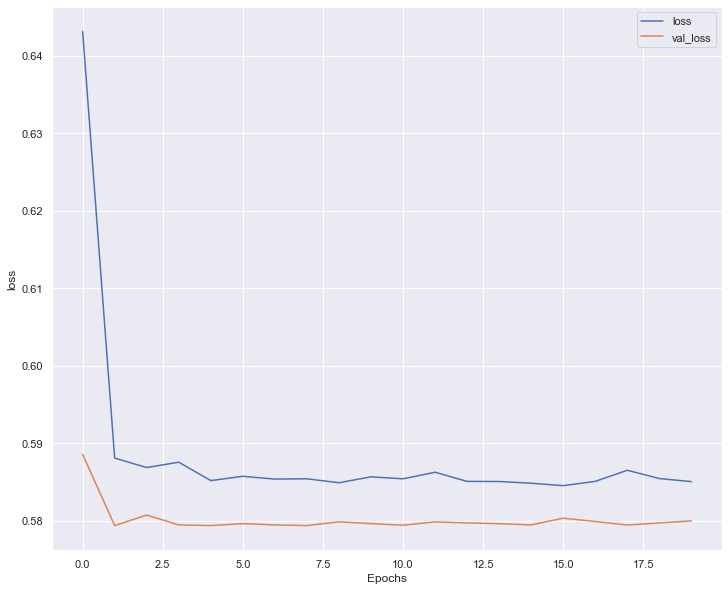

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_276 (Dense)           (None, 39)                1560      
                                                                 
 dense_277 (Dense)           (None, 39)                1560      
                                                                 
 dense_278 (Dense)           (None, 39)                1560      
                                                                 
 dense_279 (Dense)           (None, 39)                1560      
                                                                 
 dense_280 (Dense)           (None, 39)                1560      
                                                                 
 dense_281 (Dense)           (None, 39)                1560      
                                                                 
 dense_282 (Dense)           (None, 

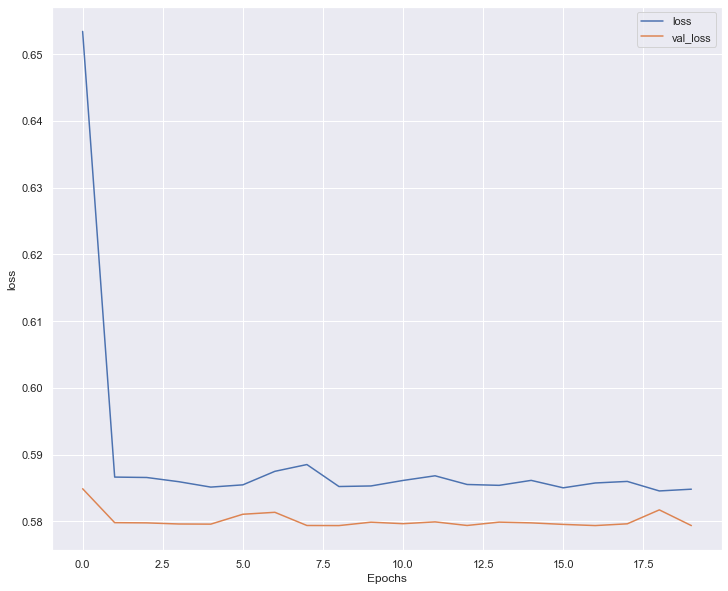

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_297 (Dense)           (None, 39)                1560      
                                                                 
 dense_298 (Dense)           (None, 39)                1560      
                                                                 
 dense_299 (Dense)           (None, 39)                1560      
                                                                 
 dense_300 (Dense)           (None, 39)                1560      
                                                                 
 dense_301 (Dense)           (None, 39)                1560      
                                                                 
 dense_302 (Dense)           (None, 39)                1560      
                                                                 
 dense_303 (Dense)           (None, 

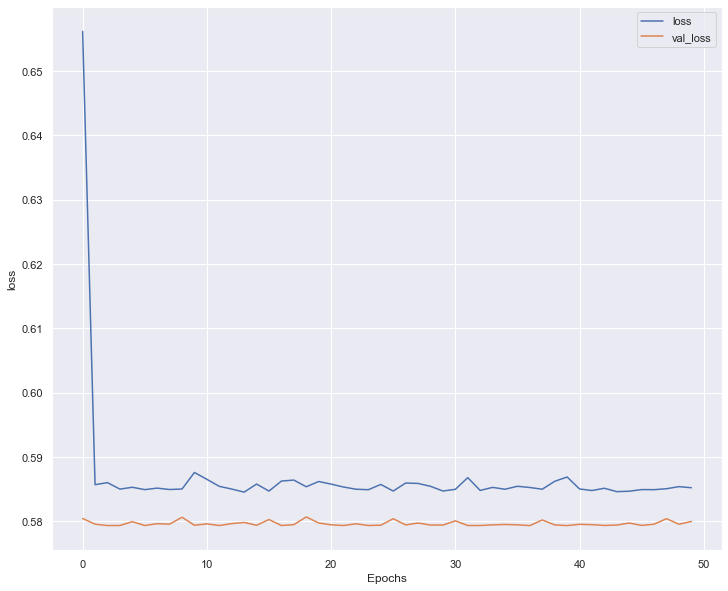

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_318 (Dense)           (None, 39)                1560      
                                                                 
 dense_319 (Dense)           (None, 39)                1560      
                                                                 
 dense_320 (Dense)           (None, 39)                1560      
                                                                 
 dense_321 (Dense)           (None, 39)                1560      
                                                                 
 dense_322 (Dense)           (None, 39)                1560      
                                                                 
 dense_323 (Dense)           (None, 39)                1560      
                                                                 
 dense_324 (Dense)           (None, 

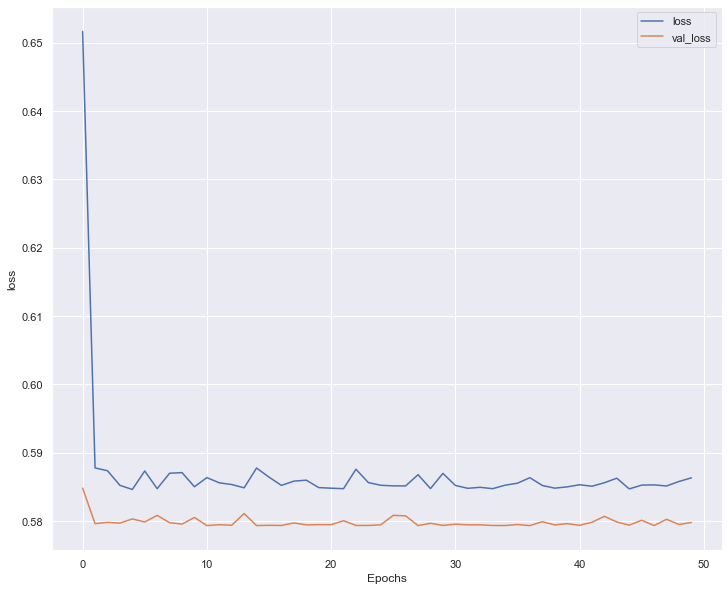

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_23"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_339 (Dense)           (None, 39)                1560      
                                                                 
 dense_340 (Dense)           (None, 39)                1560      
                                                                 
 dense_341 (Dense)           (None, 39)                1560      
                                                                 
 dense_342 (Dense)           (None, 39)                1560      
                                                                 
 dense_343 (Dense)           (None, 39)                1560      
                                                                 
 dense_344 (Dense)           (None, 39)                1560      
                                                                 
 dense_345 (Dense)           (None, 

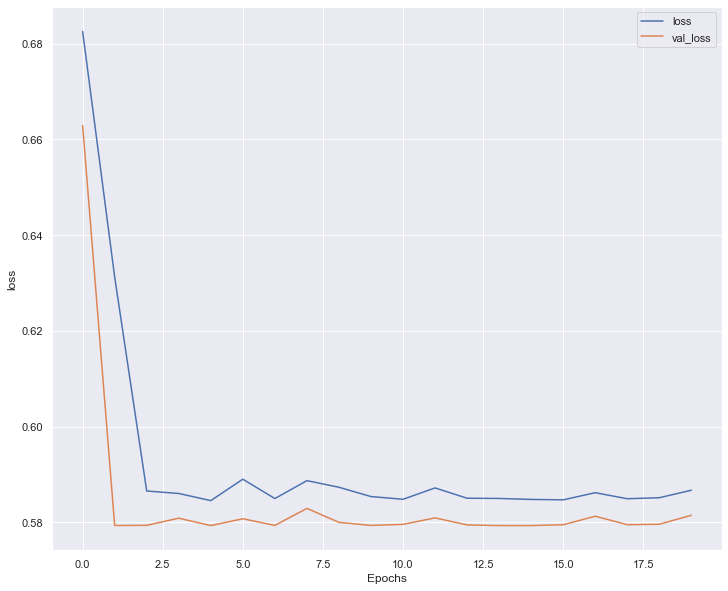

45/45 [==============================] - 0s 2ms/step


dense_layers :20
Model: "sequential_24"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_360 (Dense)           (None, 39)                1560      
                                                                 
 dense_361 (Dense)           (None, 39)                1560      
                                                                 
 dense_362 (Dense)           (None, 39)                1560      
                                                                 
 dense_363 (Dense)           (None, 39)                1560      
                                                                 
 dense_364 (Dense)           (None, 39)                1560      
                                                                 
 dense_365 (Dense)           (None, 39)                1560      
                                                                 
 dense_366 (Dense)           (None, 

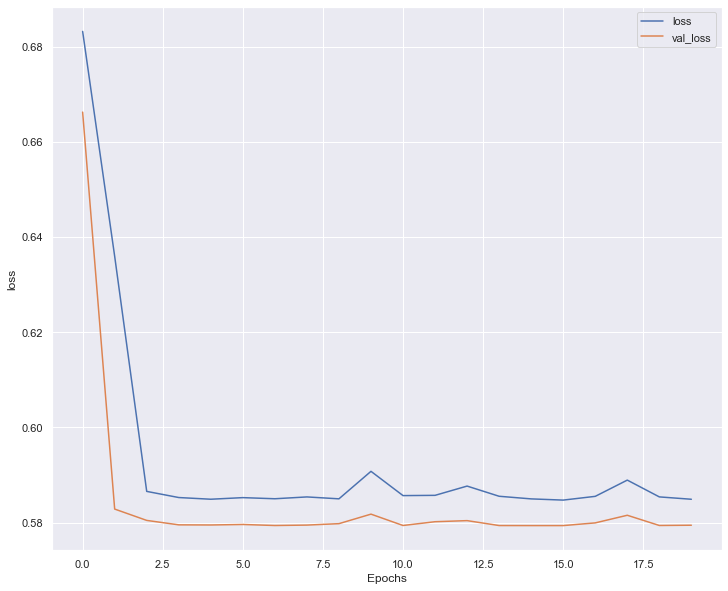

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_25"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_381 (Dense)           (None, 39)                1560      
                                                                 
 dense_382 (Dense)           (None, 39)                1560      
                                                                 
 dense_383 (Dense)           (None, 39)                1560      
                                                                 
 dense_384 (Dense)           (None, 39)                1560      
                                                                 
 dense_385 (Dense)           (None, 39)                1560      
                                                                 
 dense_386 (Dense)           (None, 39)                1560      
                                                                 
 dense_387 (Dense)           (None, 

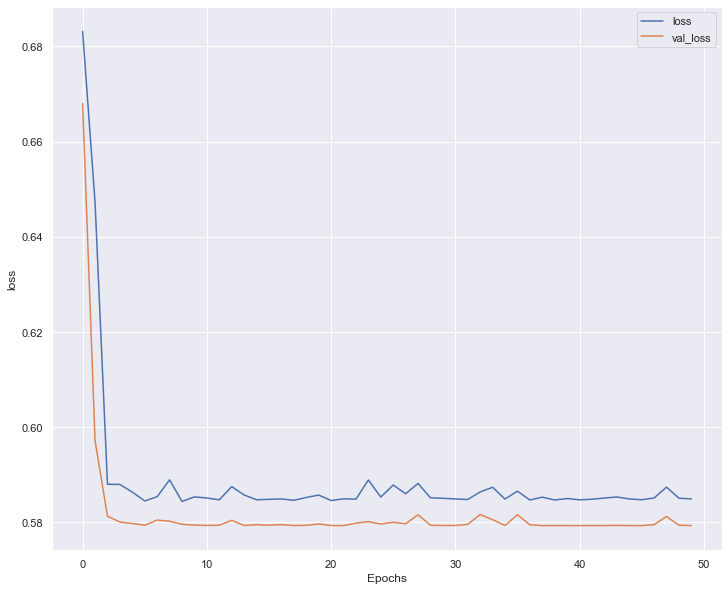

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_26"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_402 (Dense)           (None, 39)                1560      
                                                                 
 dense_403 (Dense)           (None, 39)                1560      
                                                                 
 dense_404 (Dense)           (None, 39)                1560      
                                                                 
 dense_405 (Dense)           (None, 39)                1560      
                                                                 
 dense_406 (Dense)           (None, 39)                1560      
                                                                 
 dense_407 (Dense)           (None, 39)                1560      
                                                                 
 dense_408 (Dense)           (None, 

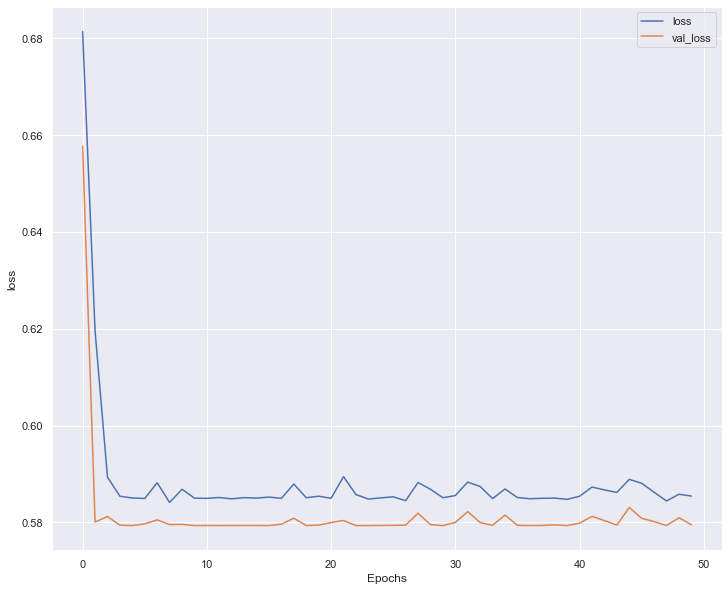

45/45 [==============================] - 0s 2ms/step


In [26]:
param_grid = dict(dense_layers = dense_layers
                    , batch_size = batch_size
                    , epochs = epochs
                   , dense_dropout = dense_dropout
                 )

keys = param_grid.keys()
values = (param_grid[key] for key in keys)
param_grid = [dict(zip(keys, param_grid)) for param_grid in itertools.product(*values)]

print('Proposed ' + str(len(param_grid)) + ' models')

for j in range(0, len(param_grid)):
    
    dense_layers = param_grid[j].get("dense_layers")
    batch_size = param_grid[j].get("batch_size")
    epochs = param_grid[j].get("epochs")
    dense_dropout = param_grid[j].get("dense_dropout")
    
    model = make_model_Lineal(dense_layers = dense_layers
                   , dense_dropout = dense_dropout
                   , verbose = 1)
    print('batch_size :' + str(batch_size))
    
    history = model.fit(train_features,
                        train_labels,
                        batch_size = batch_size,
                        epochs = epochs,
                        validation_data = (val_features, val_labels), 
                        verbose = 1)
    
    plot_history_train(history, 'loss')
    
    # Calculate validation metrics
    y_val_pred = model.predict(val_features)
    y_val_pred = np.argmax(y_val_pred, axis=1)
    val_conf_mat = confusion_matrix(val_labels, y_val_pred)
    tn, fp, fn, tp = val_conf_mat.ravel()
    val_sensitivity = tp / (tp + fn)
    val_specificity = tn / (tn + fp)
    val_f1_score = f1_score(val_labels, y_val_pred, average='macro')
    
    # Update results
    val_loss = pd.DataFrame.from_dict(history.history)['val_loss'].iloc[-1]
    val_accuracy = pd.DataFrame.from_dict(history.history)['val_accuracy'].iloc[-1]
    loss = pd.DataFrame.from_dict(history.history)['loss'].iloc[-1]
    accuracy = pd.DataFrame.from_dict(history.history)['accuracy'].iloc[-1]
    param_grid[j].update({"loss": loss})
    param_grid[j].update({"accuracy": accuracy})
    param_grid[j].update({"val_loss": val_loss})
    param_grid[j].update({"val_accuracy": val_accuracy})
    param_grid[j].update({"val_sensitivity": val_sensitivity})
    param_grid[j].update({"val_specificity": val_specificity})
    param_grid[j].update({"val_f1_score": val_f1_score})

results_Lineal = pd.DataFrame(param_grid)

In [27]:
results_Lineal.sort_values(['val_loss'],ascending = True)

,dense_layers,batch_size,epochs,dense_dropout,loss,accuracy,val_loss,val_accuracy,val_sensitivity,val_specificity,val_f1_score
10,15,64,50,0.0,0.329470,0.839892,0.313380,0.848740,0.723684,0.894084,0.807333
14,15,128,50,0.0,0.323185,0.841995,0.315864,0.847339,0.673684,0.910305,0.799415
6,10,128,50,0.0,0.351124,0.820667,0.316458,0.843838,0.642105,0.916985,0.791197
7,10,128,50,0.3,0.329011,0.839291,0.317764,0.843137,0.610526,0.927481,0.785549
1,10,64,20,0.3,0.338870,0.836287,0.319363,0.845938,0.628947,0.924618,0.791434
0,10,64,20,0.0,0.340357,0.829979,0.321341,0.844538,0.705263,0.895038,0.800654
3,10,64,50,0.3,0.385532,0.809252,0.321478,0.851541,0.744737,0.890267,0.812743
8,15,64,20,0.0,0.347663,0.835086,0.324427,0.842437,0.678947,0.901718,0.794987
2,10,64,50,0.0,0.319434,0.842896,0.326760,0.839636,0.778947,0.861641,0.804271
9,15,64,20,0.3,0.331446,0.837489,0.333362,0.841036,0.560526,0.942748,0.774666


Gracias a la tabla anterior se puede extraer la información que los mejores hiper parámetros del grid search de la <b>arquitectura lineal</b> se han conseguido en la <i>10</i> red neuronal:
* Dense Layers: 15
					
* Batch Size: 64

* Epochs: 50

* Dense Dropout: 0%

obteniendo unas métricas bastante favorables en test:
				
* Loss: 0.313380
				
* Accuracy: 0.848740
				
* Sensitivity: 0.723684

* Specificity: 0.894084

* F1-score: 0.807333

<b>ARQUITECTURA EN FORMA DE LIMÓN</b>

Proposed 24 models
dense_layers :10
Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_50 (Dense)            (None, 39)                1560      
                                                                 
 dense_51 (Dense)            (None, 40)                1600      
                                                                 
 dense_52 (Dense)            (None, 41)                1681      
                                                                 
 dense_53 (Dense)            (None, 42)                1764      
                                                                 
 dense_54 (Dense)            (None, 43)                1849      
                                                                 
 dense_55 (Dense)            (None, 44)                1936      
                                                                 
 dense_56 (Dense) 

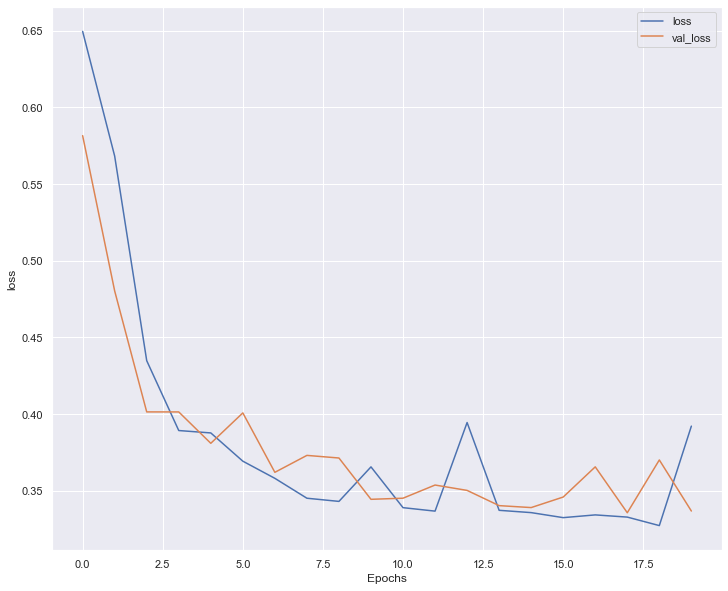

45/45 [==============================] - 0s 2ms/step


dense_layers :10
Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_61 (Dense)            (None, 39)                1560      
                                                                 
 dense_62 (Dense)            (None, 40)                1600      
                                                                 
 dense_63 (Dense)            (None, 41)                1681      
                                                                 
 dense_64 (Dense)            (None, 42)                1764      
                                                                 
 dense_65 (Dense)            (None, 43)                1849      
                                                                 
 dense_66 (Dense)            (None, 44)                1936      
                                                                 
 dense_67 (Dense)            (None, 4

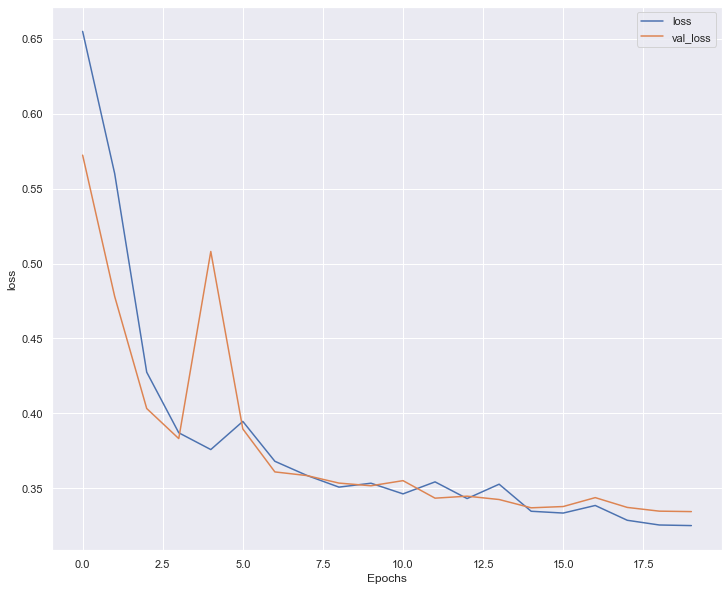

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_72 (Dense)            (None, 39)                1560      
                                                                 
 dense_73 (Dense)            (None, 40)                1600      
                                                                 
 dense_74 (Dense)            (None, 41)                1681      
                                                                 
 dense_75 (Dense)            (None, 42)                1764      
                                                                 
 dense_76 (Dense)            (None, 43)                1849      
                                                                 
 dense_77 (Dense)            (None, 44)                1936      
                                                                 
 dense_78 (Dense)            (None, 4

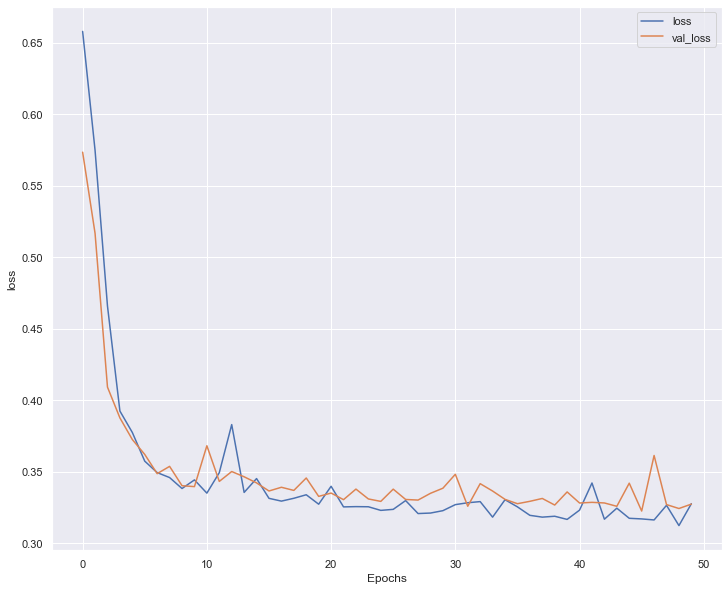

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_83 (Dense)            (None, 39)                1560      
                                                                 
 dense_84 (Dense)            (None, 40)                1600      
                                                                 
 dense_85 (Dense)            (None, 41)                1681      
                                                                 
 dense_86 (Dense)            (None, 42)                1764      
                                                                 
 dense_87 (Dense)            (None, 43)                1849      
                                                                 
 dense_88 (Dense)            (None, 44)                1936      
                                                                 
 dense_89 (Dense)            (None, 4

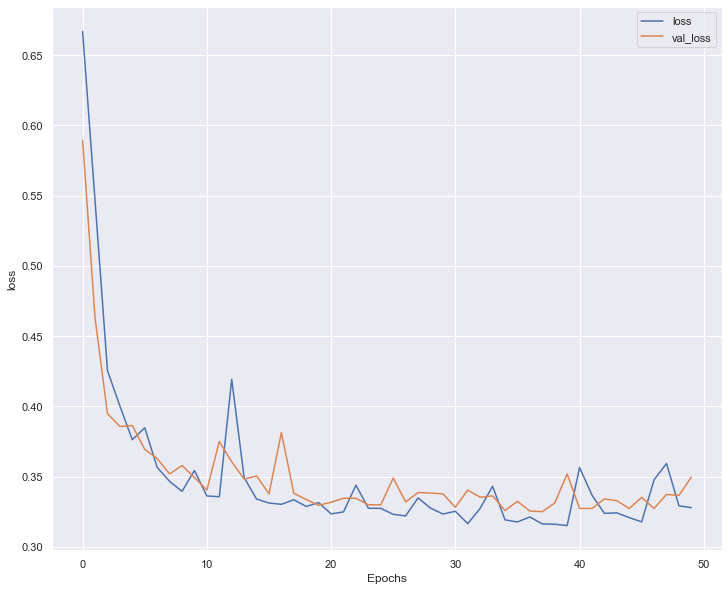

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_94 (Dense)            (None, 39)                1560      
                                                                 
 dense_95 (Dense)            (None, 40)                1600      
                                                                 
 dense_96 (Dense)            (None, 41)                1681      
                                                                 
 dense_97 (Dense)            (None, 42)                1764      
                                                                 
 dense_98 (Dense)            (None, 43)                1849      
                                                                 
 dense_99 (Dense)            (None, 44)                1936      
                                                                 
 dense_100 (Dense)           (None, 4

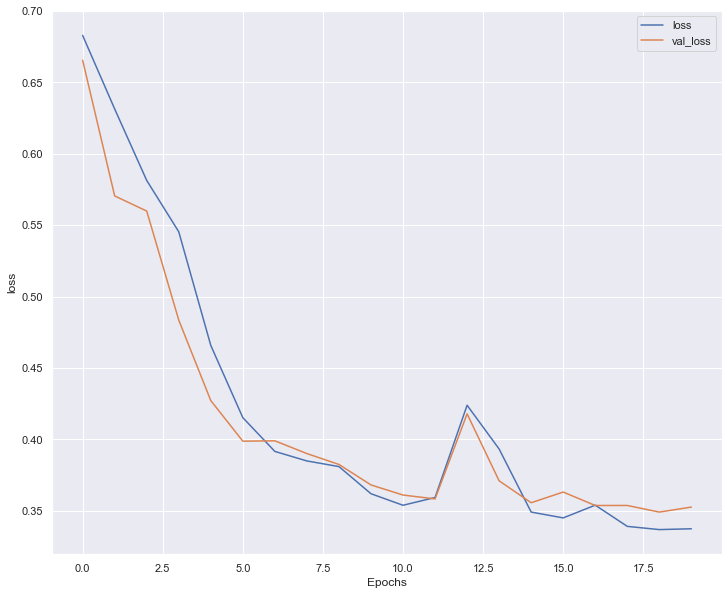

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_105 (Dense)           (None, 39)                1560      
                                                                 
 dense_106 (Dense)           (None, 40)                1600      
                                                                 
 dense_107 (Dense)           (None, 41)                1681      
                                                                 
 dense_108 (Dense)           (None, 42)                1764      
                                                                 
 dense_109 (Dense)           (None, 43)                1849      
                                                                 
 dense_110 (Dense)           (None, 44)                1936      
                                                                 
 dense_111 (Dense)           (None, 4

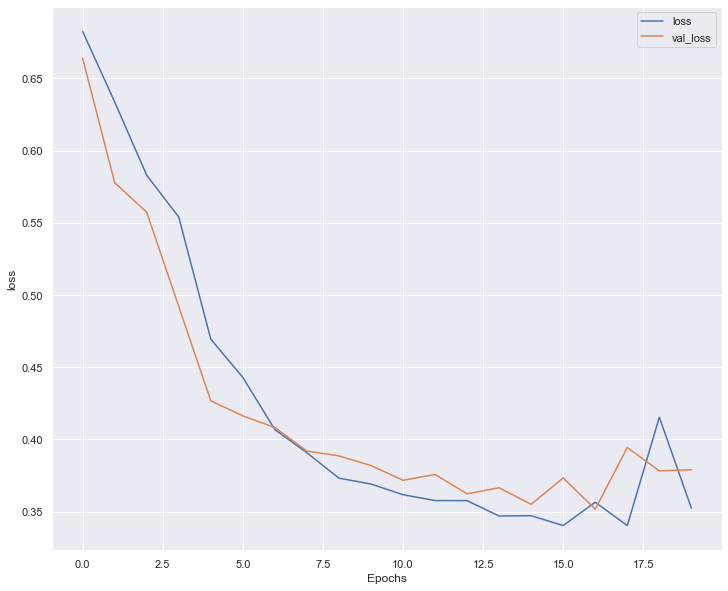

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_116 (Dense)           (None, 39)                1560      
                                                                 
 dense_117 (Dense)           (None, 40)                1600      
                                                                 
 dense_118 (Dense)           (None, 41)                1681      
                                                                 
 dense_119 (Dense)           (None, 42)                1764      
                                                                 
 dense_120 (Dense)           (None, 43)                1849      
                                                                 
 dense_121 (Dense)           (None, 44)                1936      
                                                                 
 dense_122 (Dense)           (None, 

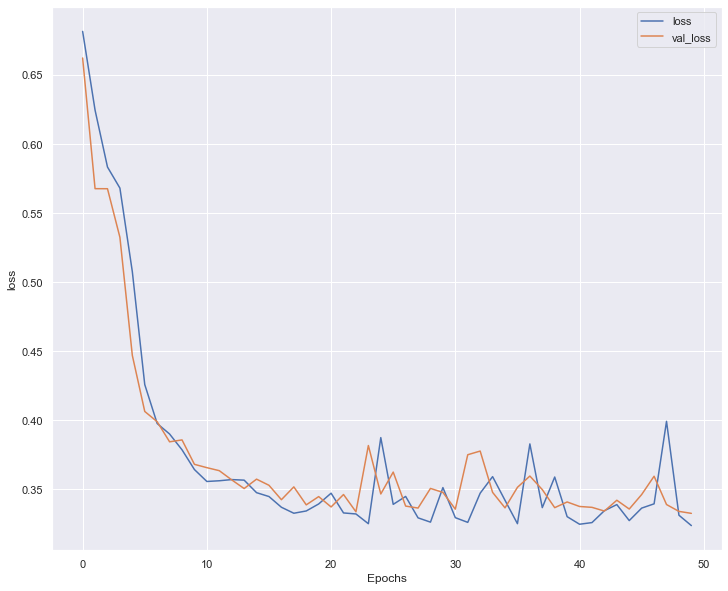

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_127 (Dense)           (None, 39)                1560      
                                                                 
 dense_128 (Dense)           (None, 40)                1600      
                                                                 
 dense_129 (Dense)           (None, 41)                1681      
                                                                 
 dense_130 (Dense)           (None, 42)                1764      
                                                                 
 dense_131 (Dense)           (None, 43)                1849      
                                                                 
 dense_132 (Dense)           (None, 44)                1936      
                                                                 
 dense_133 (Dense)           (None, 

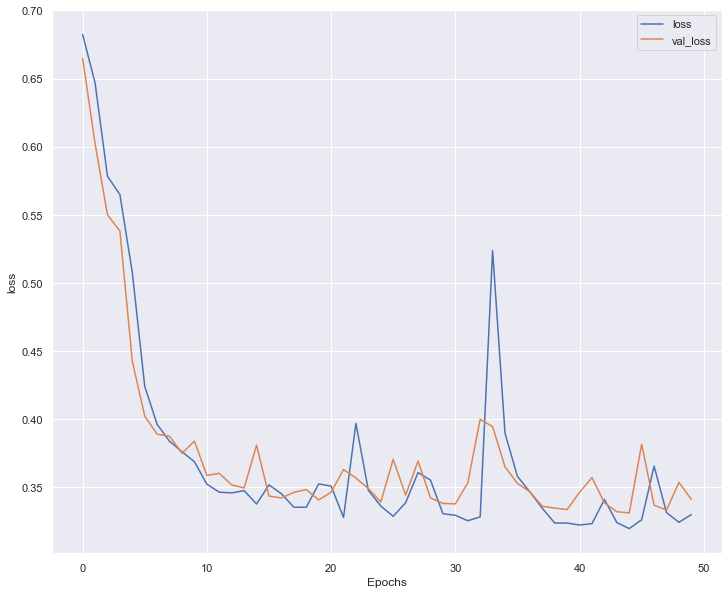

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_138 (Dense)           (None, 39)                1560      
                                                                 
 dense_139 (Dense)           (None, 40)                1600      
                                                                 
 dense_140 (Dense)           (None, 41)                1681      
                                                                 
 dense_141 (Dense)           (None, 42)                1764      
                                                                 
 dense_142 (Dense)           (None, 43)                1849      
                                                                 
 dense_143 (Dense)           (None, 44)                1936      
                                                                 
 dense_144 (Dense)           (None, 

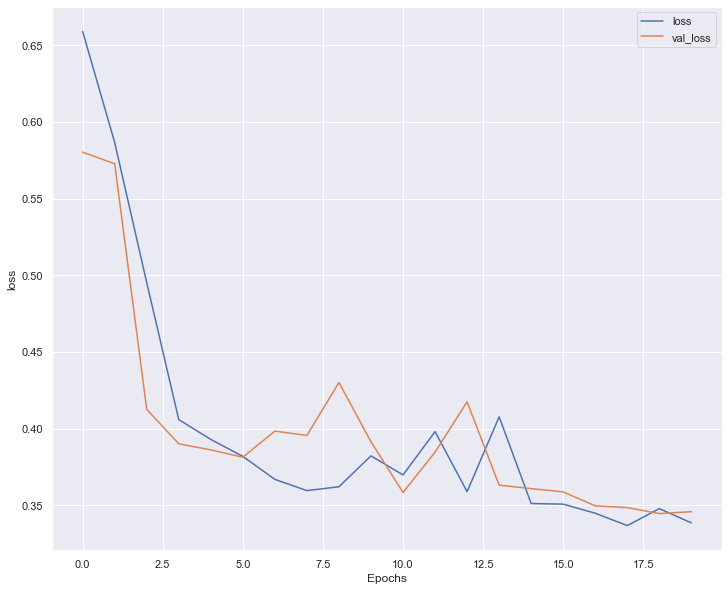

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_154 (Dense)           (None, 39)                1560      
                                                                 
 dense_155 (Dense)           (None, 40)                1600      
                                                                 
 dense_156 (Dense)           (None, 41)                1681      
                                                                 
 dense_157 (Dense)           (None, 42)                1764      
                                                                 
 dense_158 (Dense)           (None, 43)                1849      
                                                                 
 dense_159 (Dense)           (None, 44)                1936      
                                                                 
 dense_160 (Dense)           (None, 

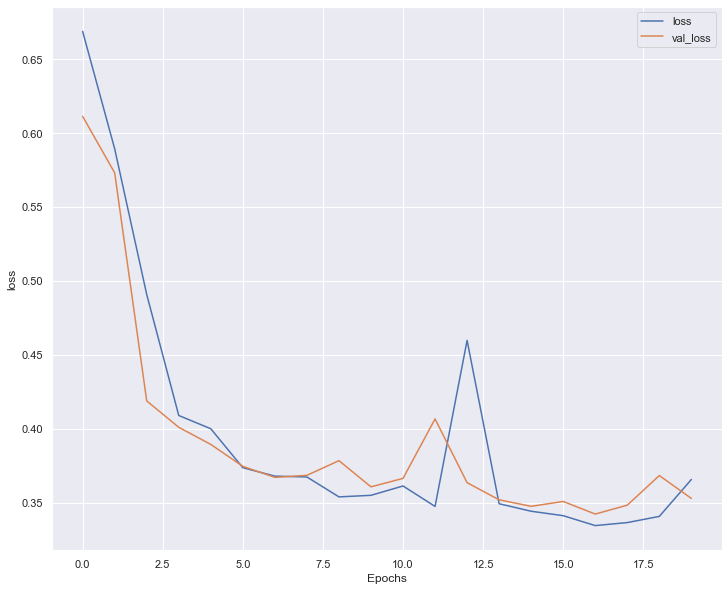

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_170 (Dense)           (None, 39)                1560      
                                                                 
 dense_171 (Dense)           (None, 40)                1600      
                                                                 
 dense_172 (Dense)           (None, 41)                1681      
                                                                 
 dense_173 (Dense)           (None, 42)                1764      
                                                                 
 dense_174 (Dense)           (None, 43)                1849      
                                                                 
 dense_175 (Dense)           (None, 44)                1936      
                                                                 
 dense_176 (Dense)           (None, 

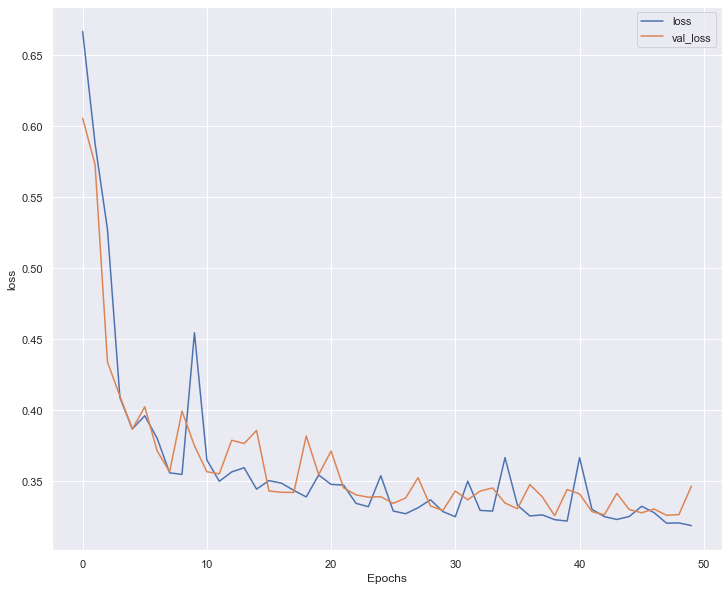

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_186 (Dense)           (None, 39)                1560      
                                                                 
 dense_187 (Dense)           (None, 40)                1600      
                                                                 
 dense_188 (Dense)           (None, 41)                1681      
                                                                 
 dense_189 (Dense)           (None, 42)                1764      
                                                                 
 dense_190 (Dense)           (None, 43)                1849      
                                                                 
 dense_191 (Dense)           (None, 44)                1936      
                                                                 
 dense_192 (Dense)           (None, 

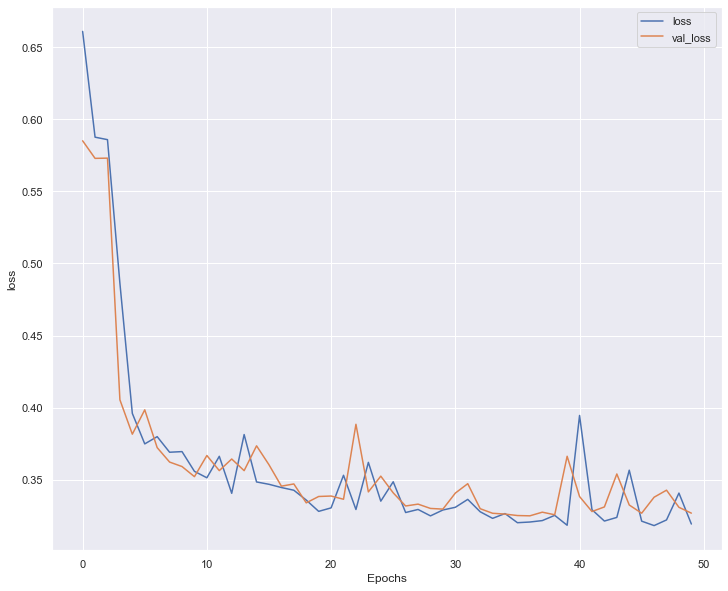

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_202 (Dense)           (None, 39)                1560      
                                                                 
 dense_203 (Dense)           (None, 40)                1600      
                                                                 
 dense_204 (Dense)           (None, 41)                1681      
                                                                 
 dense_205 (Dense)           (None, 42)                1764      
                                                                 
 dense_206 (Dense)           (None, 43)                1849      
                                                                 
 dense_207 (Dense)           (None, 44)                1936      
                                                                 
 dense_208 (Dense)           (None, 

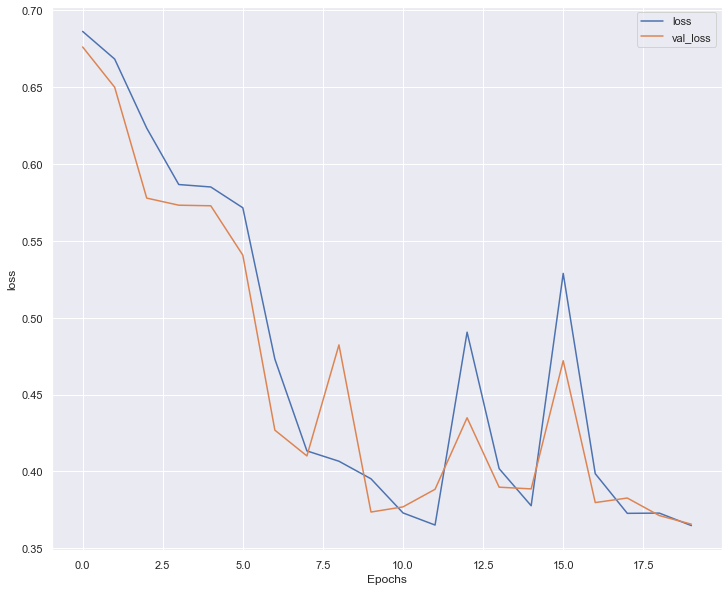

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_218 (Dense)           (None, 39)                1560      
                                                                 
 dense_219 (Dense)           (None, 40)                1600      
                                                                 
 dense_220 (Dense)           (None, 41)                1681      
                                                                 
 dense_221 (Dense)           (None, 42)                1764      
                                                                 
 dense_222 (Dense)           (None, 43)                1849      
                                                                 
 dense_223 (Dense)           (None, 44)                1936      
                                                                 
 dense_224 (Dense)           (None, 

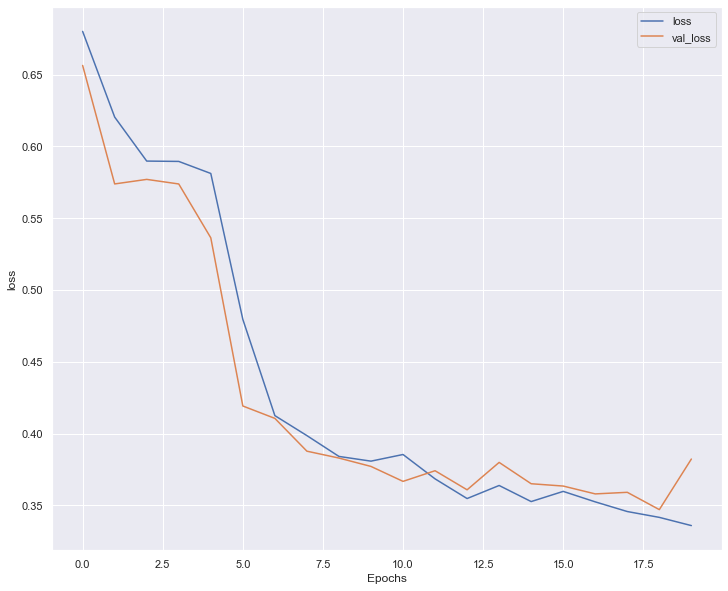

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_234 (Dense)           (None, 39)                1560      
                                                                 
 dense_235 (Dense)           (None, 40)                1600      
                                                                 
 dense_236 (Dense)           (None, 41)                1681      
                                                                 
 dense_237 (Dense)           (None, 42)                1764      
                                                                 
 dense_238 (Dense)           (None, 43)                1849      
                                                                 
 dense_239 (Dense)           (None, 44)                1936      
                                                                 
 dense_240 (Dense)           (None, 

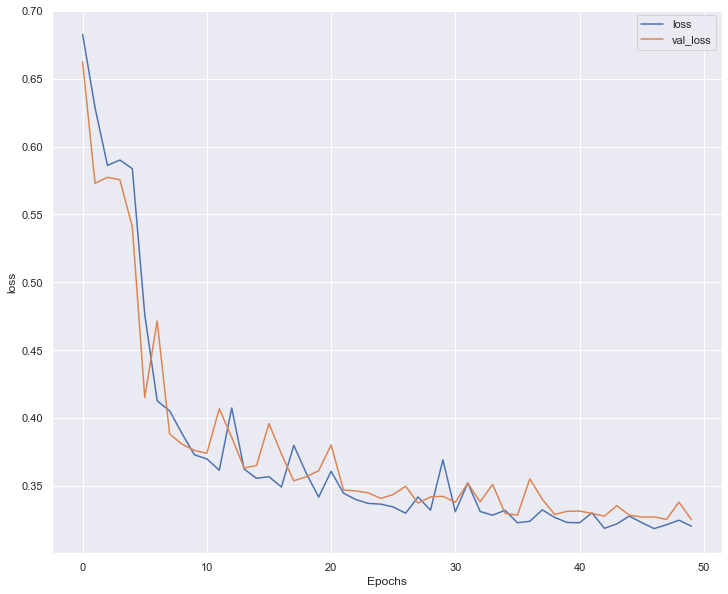

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_250 (Dense)           (None, 39)                1560      
                                                                 
 dense_251 (Dense)           (None, 40)                1600      
                                                                 
 dense_252 (Dense)           (None, 41)                1681      
                                                                 
 dense_253 (Dense)           (None, 42)                1764      
                                                                 
 dense_254 (Dense)           (None, 43)                1849      
                                                                 
 dense_255 (Dense)           (None, 44)                1936      
                                                                 
 dense_256 (Dense)           (None, 

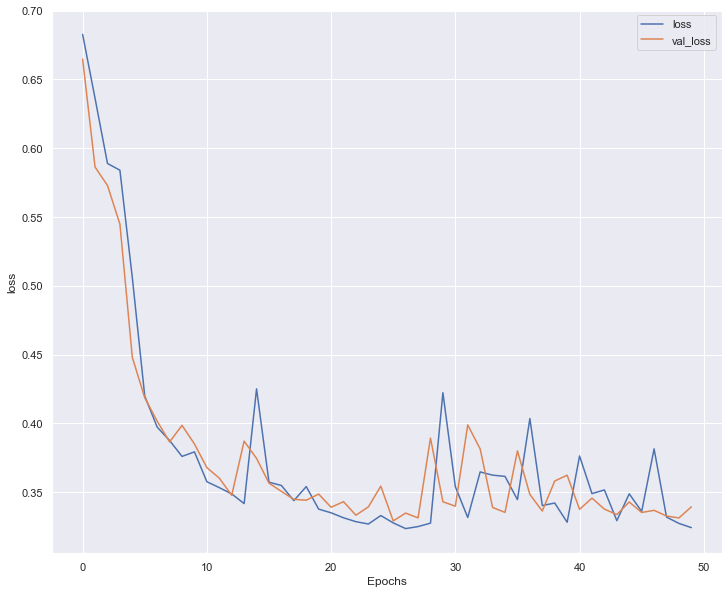

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_266 (Dense)           (None, 39)                1560      
                                                                 
 dense_267 (Dense)           (None, 40)                1600      
                                                                 
 dense_268 (Dense)           (None, 41)                1681      
                                                                 
 dense_269 (Dense)           (None, 42)                1764      
                                                                 
 dense_270 (Dense)           (None, 43)                1849      
                                                                 
 dense_271 (Dense)           (None, 44)                1936      
                                                                 
 dense_272 (Dense)           (None, 

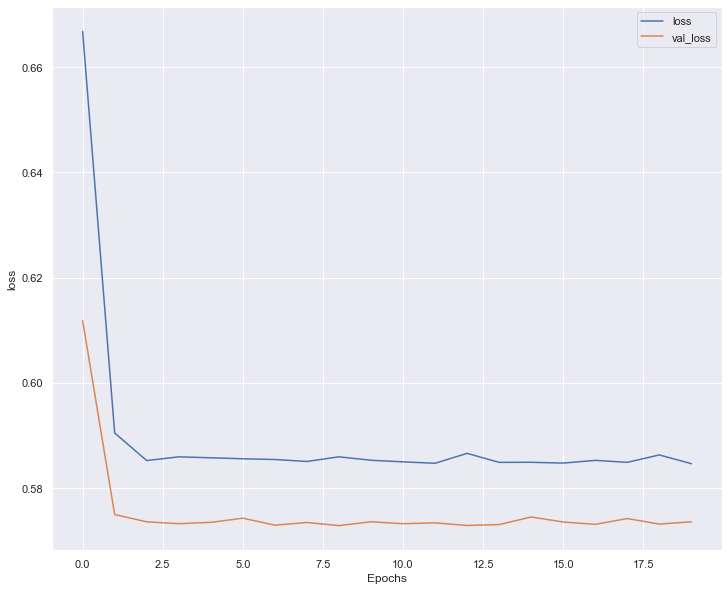

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_287 (Dense)           (None, 39)                1560      
                                                                 
 dense_288 (Dense)           (None, 40)                1600      
                                                                 
 dense_289 (Dense)           (None, 41)                1681      
                                                                 
 dense_290 (Dense)           (None, 42)                1764      
                                                                 
 dense_291 (Dense)           (None, 43)                1849      
                                                                 
 dense_292 (Dense)           (None, 44)                1936      
                                                                 
 dense_293 (Dense)           (None, 

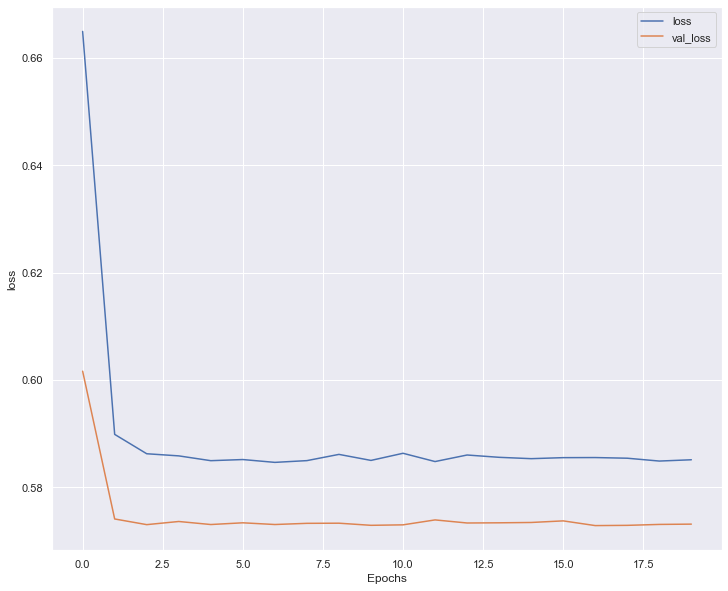

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_308 (Dense)           (None, 39)                1560      
                                                                 
 dense_309 (Dense)           (None, 40)                1600      
                                                                 
 dense_310 (Dense)           (None, 41)                1681      
                                                                 
 dense_311 (Dense)           (None, 42)                1764      
                                                                 
 dense_312 (Dense)           (None, 43)                1849      
                                                                 
 dense_313 (Dense)           (None, 44)                1936      
                                                                 
 dense_314 (Dense)           (None, 

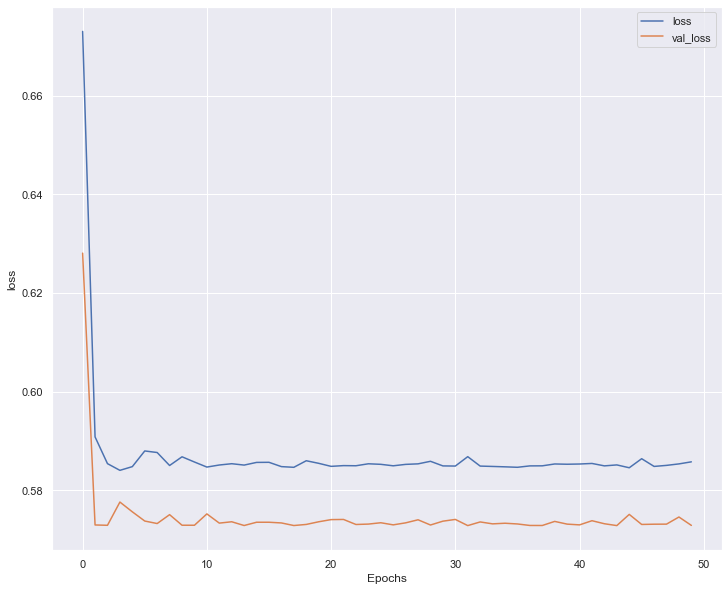

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_23"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_329 (Dense)           (None, 39)                1560      
                                                                 
 dense_330 (Dense)           (None, 40)                1600      
                                                                 
 dense_331 (Dense)           (None, 41)                1681      
                                                                 
 dense_332 (Dense)           (None, 42)                1764      
                                                                 
 dense_333 (Dense)           (None, 43)                1849      
                                                                 
 dense_334 (Dense)           (None, 44)                1936      
                                                                 
 dense_335 (Dense)           (None, 

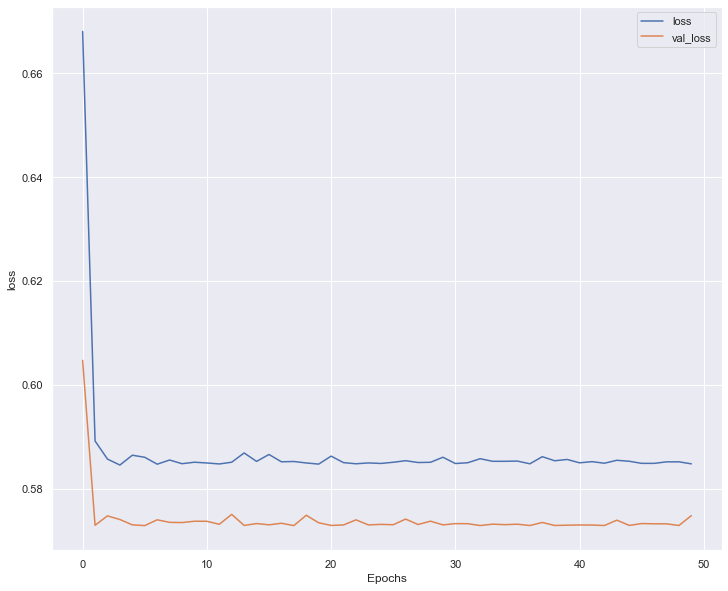

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_24"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_350 (Dense)           (None, 39)                1560      
                                                                 
 dense_351 (Dense)           (None, 40)                1600      
                                                                 
 dense_352 (Dense)           (None, 41)                1681      
                                                                 
 dense_353 (Dense)           (None, 42)                1764      
                                                                 
 dense_354 (Dense)           (None, 43)                1849      
                                                                 
 dense_355 (Dense)           (None, 44)                1936      
                                                                 
 dense_356 (Dense)           (None, 

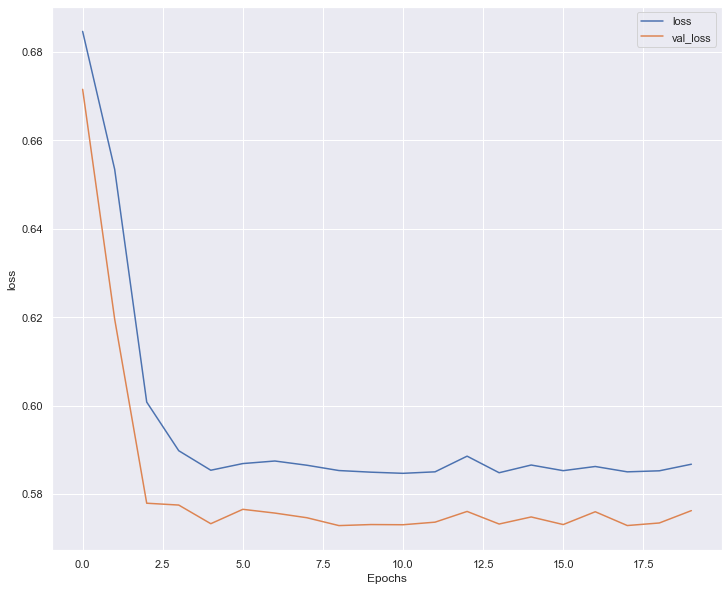

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_25"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_371 (Dense)           (None, 39)                1560      
                                                                 
 dense_372 (Dense)           (None, 40)                1600      
                                                                 
 dense_373 (Dense)           (None, 41)                1681      
                                                                 
 dense_374 (Dense)           (None, 42)                1764      
                                                                 
 dense_375 (Dense)           (None, 43)                1849      
                                                                 
 dense_376 (Dense)           (None, 44)                1936      
                                                                 
 dense_377 (Dense)           (None, 

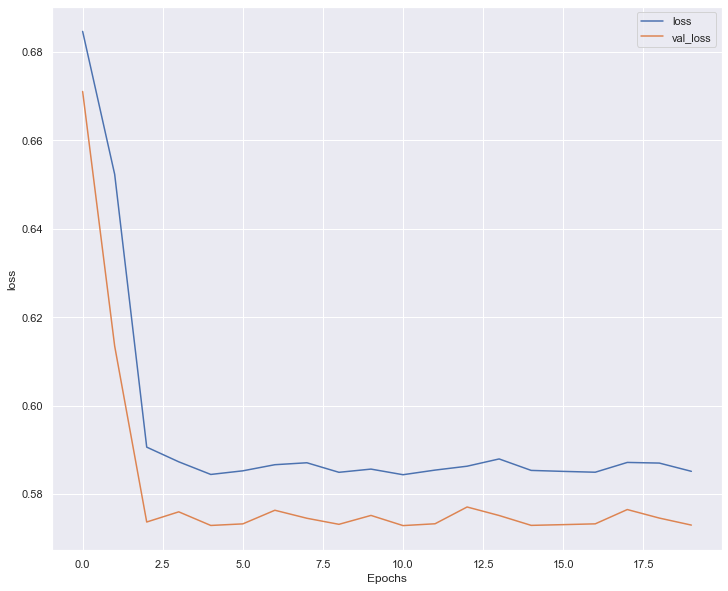

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_26"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_392 (Dense)           (None, 39)                1560      
                                                                 
 dense_393 (Dense)           (None, 40)                1600      
                                                                 
 dense_394 (Dense)           (None, 41)                1681      
                                                                 
 dense_395 (Dense)           (None, 42)                1764      
                                                                 
 dense_396 (Dense)           (None, 43)                1849      
                                                                 
 dense_397 (Dense)           (None, 44)                1936      
                                                                 
 dense_398 (Dense)           (None, 

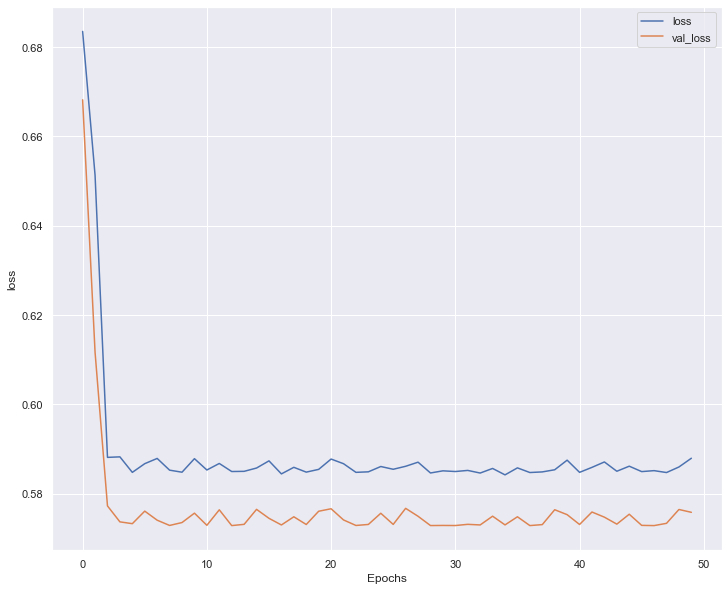

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_27"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_413 (Dense)           (None, 39)                1560      
                                                                 
 dense_414 (Dense)           (None, 40)                1600      
                                                                 
 dense_415 (Dense)           (None, 41)                1681      
                                                                 
 dense_416 (Dense)           (None, 42)                1764      
                                                                 
 dense_417 (Dense)           (None, 43)                1849      
                                                                 
 dense_418 (Dense)           (None, 44)                1936      
                                                                 
 dense_419 (Dense)           (None, 

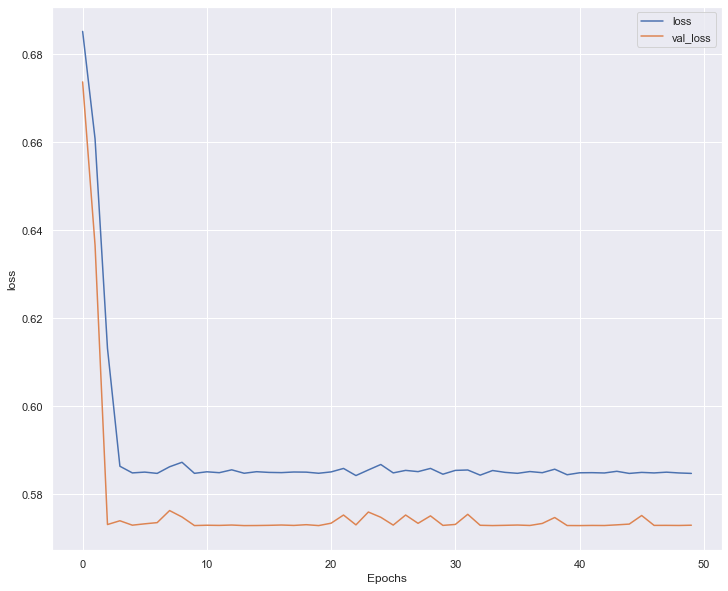

45/45 [==============================] - 0s 1ms/step


In [27]:
param_grid = dict(dense_layers = dense_layers
                    , batch_size = batch_size
                    , epochs = epochs
                   , dense_dropout = dense_dropout
                 )

keys = param_grid.keys()
values = (param_grid[key] for key in keys)
param_grid = [dict(zip(keys, param_grid)) for param_grid in itertools.product(*values)]

print('Proposed ' + str(len(param_grid)) + ' models')

for j in range(0, len(param_grid)):
    
    dense_layers = param_grid[j].get("dense_layers")
    batch_size = param_grid[j].get("batch_size")
    epochs = param_grid[j].get("epochs")
    dense_dropout = param_grid[j].get("dense_dropout")
    
    model = make_model_Limon(dense_layers = dense_layers
                   , dense_dropout = dense_dropout
                   , verbose = 1)
    print('batch_size :' + str(batch_size))
    
    history = model.fit(train_features,
                        train_labels,
                        batch_size = batch_size,
                        epochs = epochs,
                        validation_data = (val_features, val_labels), 
                        verbose = 1)
    
    plot_history_train(history, 'loss')
    
    # Calculate validation metrics
    y_val_pred = model.predict(val_features)
    y_val_pred = np.argmax(y_val_pred, axis=1)
    val_conf_mat = confusion_matrix(val_labels, y_val_pred)
    tn, fp, fn, tp = val_conf_mat.ravel()
    val_sensitivity = tp / (tp + fn)
    val_specificity = tn / (tn + fp)
    val_f1_score = f1_score(val_labels, y_val_pred, average='macro')
    
    # Update results
    val_loss = pd.DataFrame.from_dict(history.history)['val_loss'].iloc[-1]
    val_accuracy = pd.DataFrame.from_dict(history.history)['val_accuracy'].iloc[-1]
    loss = pd.DataFrame.from_dict(history.history)['loss'].iloc[-1]
    accuracy = pd.DataFrame.from_dict(history.history)['accuracy'].iloc[-1]
    param_grid[j].update({"loss": loss})
    param_grid[j].update({"accuracy": accuracy})
    param_grid[j].update({"val_loss": val_loss})
    param_grid[j].update({"val_accuracy": val_accuracy})
    param_grid[j].update({"val_sensitivity": val_sensitivity})
    param_grid[j].update({"val_specificity": val_specificity})
    param_grid[j].update({"val_f1_score": val_f1_score})

results_Limon = pd.DataFrame(param_grid)

In [28]:
results_Limon.sort_values(['val_loss'],ascending = True)

,dense_layers,batch_size,epochs,dense_dropout,loss,accuracy,val_loss,val_accuracy,val_sensitivity,val_specificity,val_f1_score
14,15,128,50,0.0,0.320254,0.848603,0.325114,0.838235,0.665768,0.898770,0.786490
11,15,64,50,0.3,0.319437,0.846500,0.326975,0.827731,0.714286,0.867550,0.782360
2,10,64,50,0.0,0.327700,0.835386,0.327410,0.839636,0.638814,0.910123,0.783945
6,10,128,50,0.0,0.323831,0.844398,0.332682,0.837535,0.625337,0.912015,0.779630
1,10,64,20,0.3,0.325122,0.842896,0.334460,0.824230,0.711590,0.863765,0.778472
0,10,64,20,0.0,0.392143,0.791529,0.336768,0.832633,0.582210,0.920530,0.767217
15,15,128,50,0.3,0.324142,0.839591,0.339253,0.831933,0.514825,0.943236,0.753359
7,10,128,50,0.3,0.329975,0.843196,0.341121,0.817927,0.749326,0.842006,0.776961
8,15,64,20,0.0,0.338553,0.832082,0.345830,0.826331,0.566038,0.917692,0.757698
10,15,64,50,0.0,0.318750,0.845900,0.346516,0.815126,0.787062,0.824976,0.778603


Gracias a la tabla anterior se puede extraer la información que los mejores hiper parámetros del grid search de la <b>arquitectura en forma de limón</b> se han conseguido en la <i>14</i> red neuronal:
* Dense Layers: 15

* Batch Size: 128

* Epochs: 50

* Dense Dropout: 0%

obteniendo unas métricas bastante favorables en test:
				
* Loss: 0.325114
				
* Accuracy: 0.838235
				
* Sensitivity: 0.665768

* Specificity: 0.898770

* F1-score: 0.786490

<b>ARQUITECTURA EN FORMA DECRECIENTE</b>

Proposed 24 models
dense_layers :10
Model: "sequential_28"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_434 (Dense)           (None, 39)                1560      
                                                                 
 dense_435 (Dense)           (None, 42)                1680      
                                                                 
 dense_436 (Dense)           (None, 41)                1763      
                                                                 
 dense_437 (Dense)           (None, 40)                1680      
                                                                 
 dense_438 (Dense)           (None, 39)                1599      
                                                                 
 dense_439 (Dense)           (None, 38)                1520      
                                                                 
 dense_440 (Dense

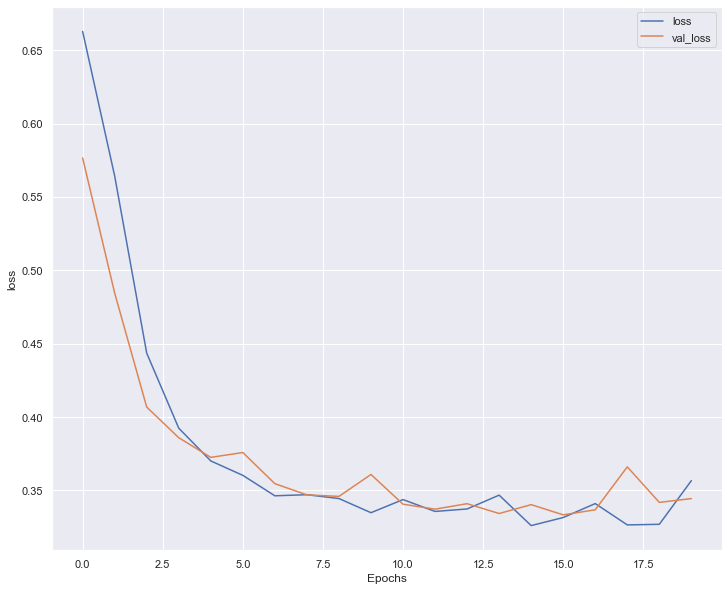

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_29"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_445 (Dense)           (None, 39)                1560      
                                                                 
 dense_446 (Dense)           (None, 42)                1680      
                                                                 
 dense_447 (Dense)           (None, 41)                1763      
                                                                 
 dense_448 (Dense)           (None, 40)                1680      
                                                                 
 dense_449 (Dense)           (None, 39)                1599      
                                                                 
 dense_450 (Dense)           (None, 38)                1520      
                                                                 
 dense_451 (Dense)           (None, 

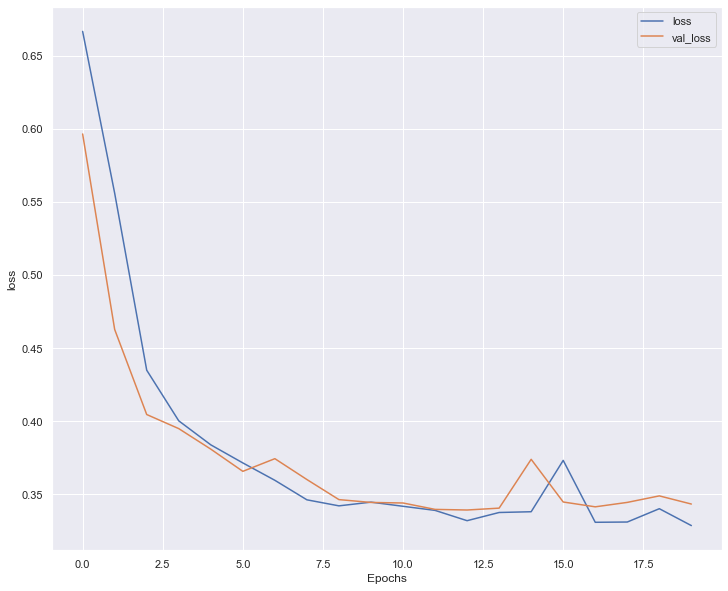

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_30"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_456 (Dense)           (None, 39)                1560      
                                                                 
 dense_457 (Dense)           (None, 42)                1680      
                                                                 
 dense_458 (Dense)           (None, 41)                1763      
                                                                 
 dense_459 (Dense)           (None, 40)                1680      
                                                                 
 dense_460 (Dense)           (None, 39)                1599      
                                                                 
 dense_461 (Dense)           (None, 38)                1520      
                                                                 
 dense_462 (Dense)           (None, 

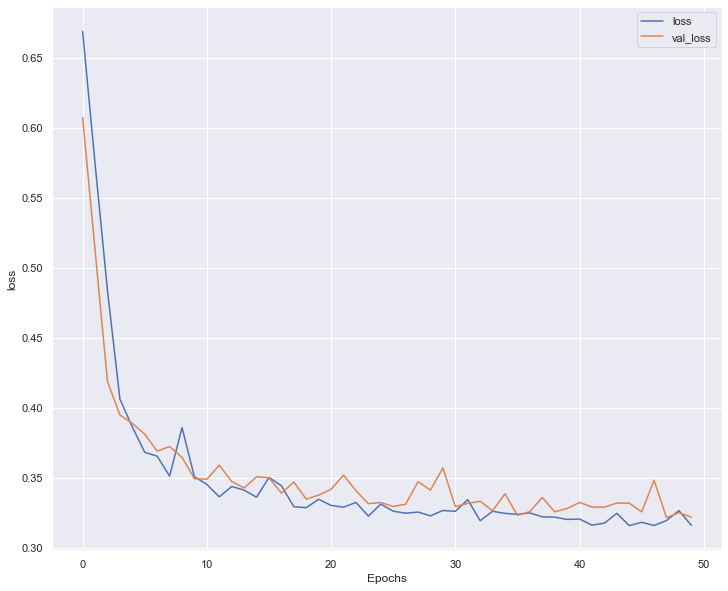

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_31"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_467 (Dense)           (None, 39)                1560      
                                                                 
 dense_468 (Dense)           (None, 42)                1680      
                                                                 
 dense_469 (Dense)           (None, 41)                1763      
                                                                 
 dense_470 (Dense)           (None, 40)                1680      
                                                                 
 dense_471 (Dense)           (None, 39)                1599      
                                                                 
 dense_472 (Dense)           (None, 38)                1520      
                                                                 
 dense_473 (Dense)           (None, 

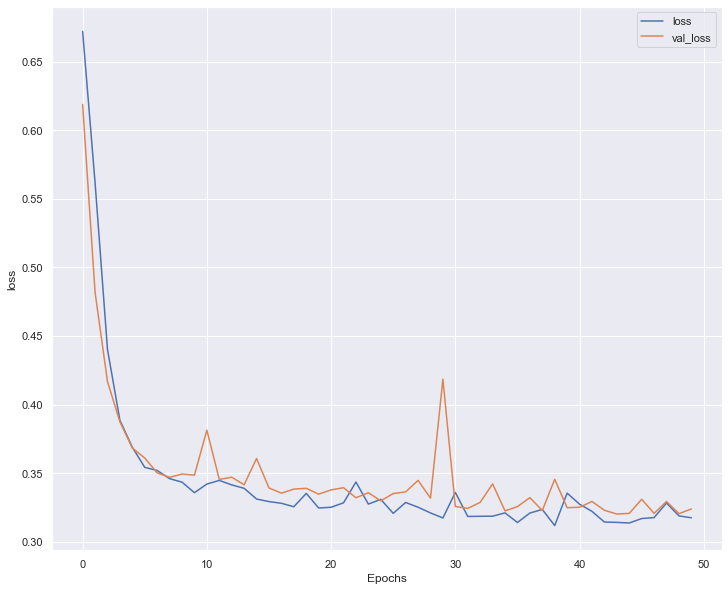

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_32"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_478 (Dense)           (None, 39)                1560      
                                                                 
 dense_479 (Dense)           (None, 42)                1680      
                                                                 
 dense_480 (Dense)           (None, 41)                1763      
                                                                 
 dense_481 (Dense)           (None, 40)                1680      
                                                                 
 dense_482 (Dense)           (None, 39)                1599      
                                                                 
 dense_483 (Dense)           (None, 38)                1520      
                                                                 
 dense_484 (Dense)           (None, 

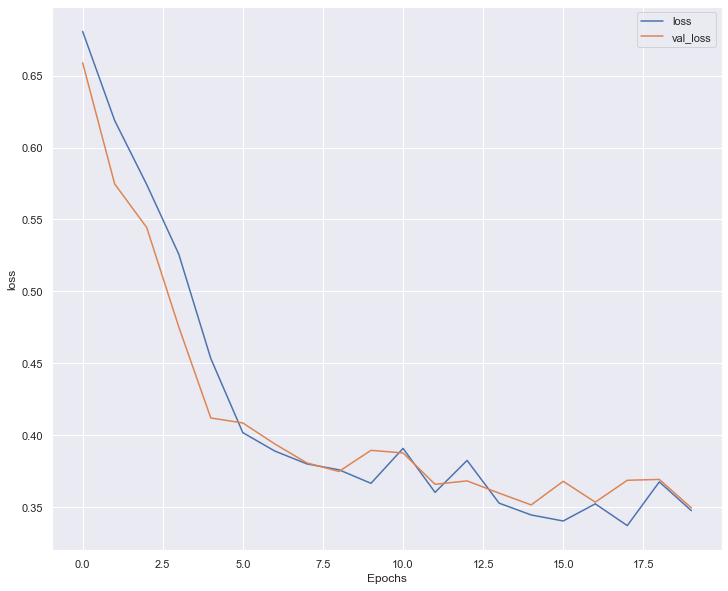

45/45 [==============================] - 0s 996us/step


dense_layers :10
Model: "sequential_33"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_489 (Dense)           (None, 39)                1560      
                                                                 
 dense_490 (Dense)           (None, 42)                1680      
                                                                 
 dense_491 (Dense)           (None, 41)                1763      
                                                                 
 dense_492 (Dense)           (None, 40)                1680      
                                                                 
 dense_493 (Dense)           (None, 39)                1599      
                                                                 
 dense_494 (Dense)           (None, 38)                1520      
                                                                 
 dense_495 (Dense)           (None, 

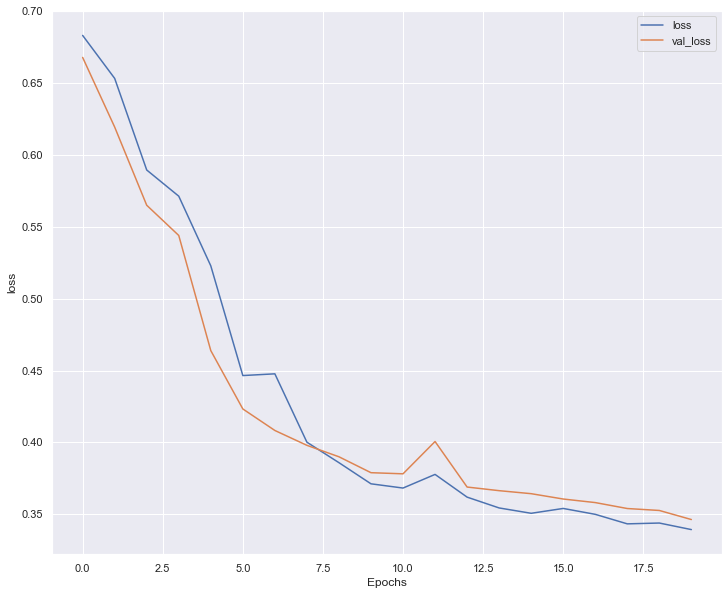

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_34"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_500 (Dense)           (None, 39)                1560      
                                                                 
 dense_501 (Dense)           (None, 42)                1680      
                                                                 
 dense_502 (Dense)           (None, 41)                1763      
                                                                 
 dense_503 (Dense)           (None, 40)                1680      
                                                                 
 dense_504 (Dense)           (None, 39)                1599      
                                                                 
 dense_505 (Dense)           (None, 38)                1520      
                                                                 
 dense_506 (Dense)           (None, 

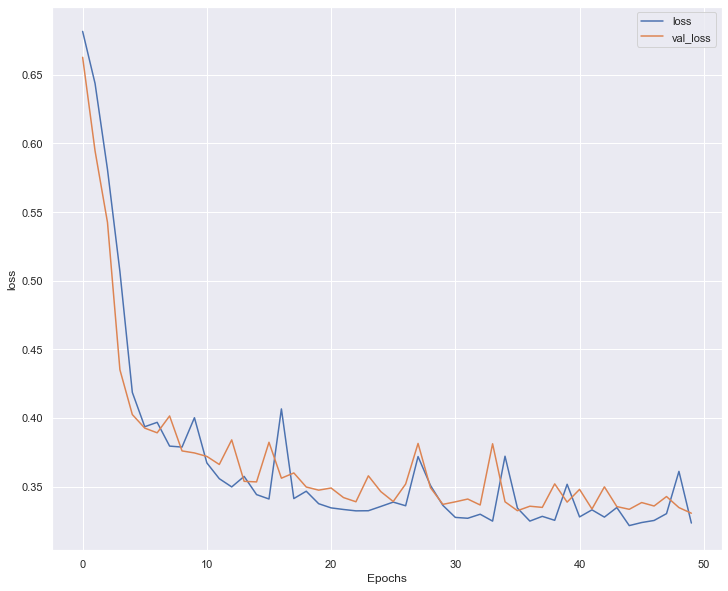

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_35"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_511 (Dense)           (None, 39)                1560      
                                                                 
 dense_512 (Dense)           (None, 42)                1680      
                                                                 
 dense_513 (Dense)           (None, 41)                1763      
                                                                 
 dense_514 (Dense)           (None, 40)                1680      
                                                                 
 dense_515 (Dense)           (None, 39)                1599      
                                                                 
 dense_516 (Dense)           (None, 38)                1520      
                                                                 
 dense_517 (Dense)           (None, 

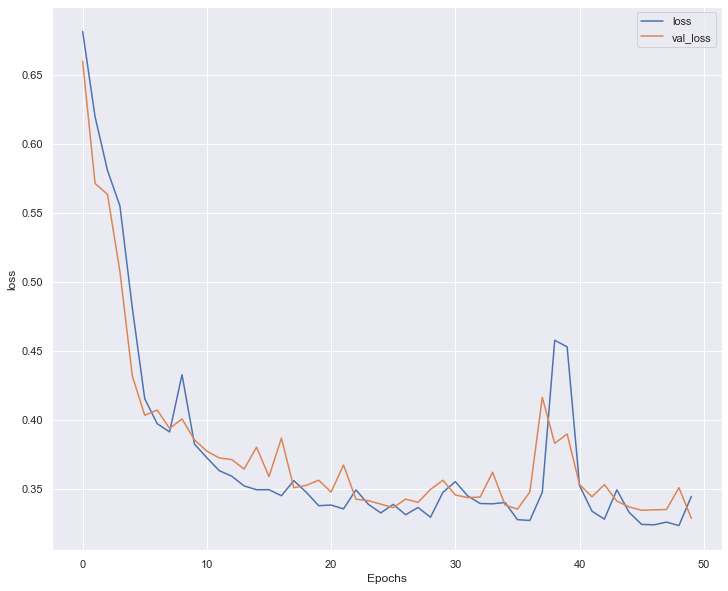

45/45 [==============================] - 0s 988us/step


dense_layers :15
Model: "sequential_36"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_522 (Dense)           (None, 39)                1560      
                                                                 
 dense_523 (Dense)           (None, 42)                1680      
                                                                 
 dense_524 (Dense)           (None, 41)                1763      
                                                                 
 dense_525 (Dense)           (None, 40)                1680      
                                                                 
 dense_526 (Dense)           (None, 39)                1599      
                                                                 
 dense_527 (Dense)           (None, 38)                1520      
                                                                 
 dense_528 (Dense)           (None, 

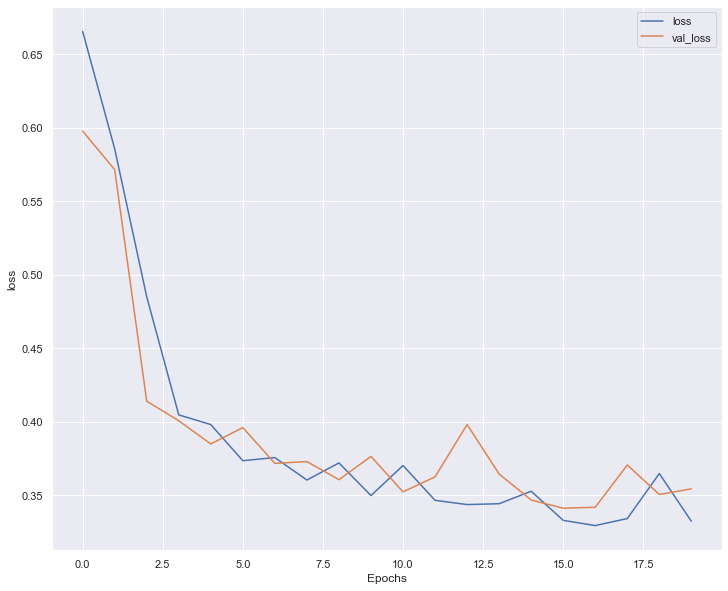

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_37"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_538 (Dense)           (None, 39)                1560      
                                                                 
 dense_539 (Dense)           (None, 42)                1680      
                                                                 
 dense_540 (Dense)           (None, 41)                1763      
                                                                 
 dense_541 (Dense)           (None, 40)                1680      
                                                                 
 dense_542 (Dense)           (None, 39)                1599      
                                                                 
 dense_543 (Dense)           (None, 38)                1520      
                                                                 
 dense_544 (Dense)           (None, 

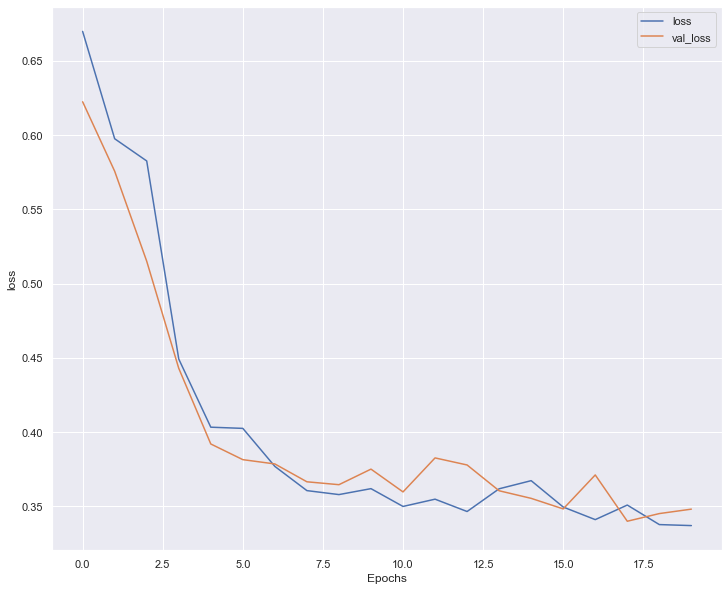

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_38"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_554 (Dense)           (None, 39)                1560      
                                                                 
 dense_555 (Dense)           (None, 42)                1680      
                                                                 
 dense_556 (Dense)           (None, 41)                1763      
                                                                 
 dense_557 (Dense)           (None, 40)                1680      
                                                                 
 dense_558 (Dense)           (None, 39)                1599      
                                                                 
 dense_559 (Dense)           (None, 38)                1520      
                                                                 
 dense_560 (Dense)           (None, 

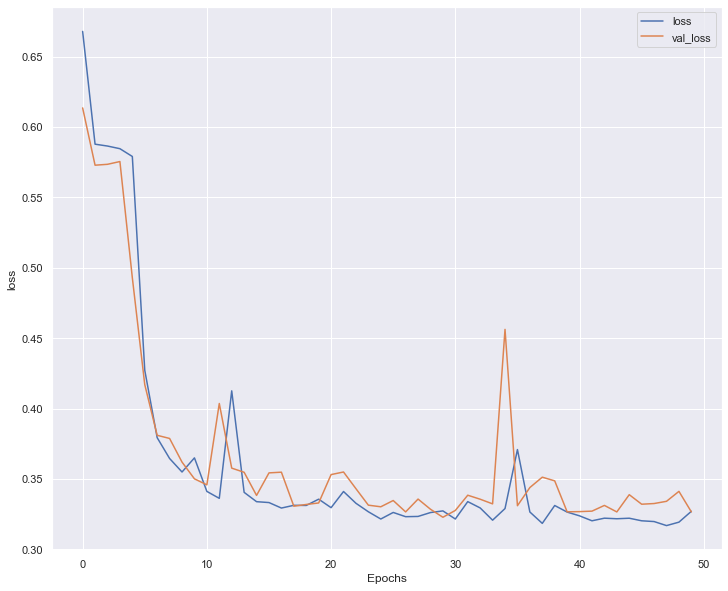

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_39"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_570 (Dense)           (None, 39)                1560      
                                                                 
 dense_571 (Dense)           (None, 42)                1680      
                                                                 
 dense_572 (Dense)           (None, 41)                1763      
                                                                 
 dense_573 (Dense)           (None, 40)                1680      
                                                                 
 dense_574 (Dense)           (None, 39)                1599      
                                                                 
 dense_575 (Dense)           (None, 38)                1520      
                                                                 
 dense_576 (Dense)           (None, 

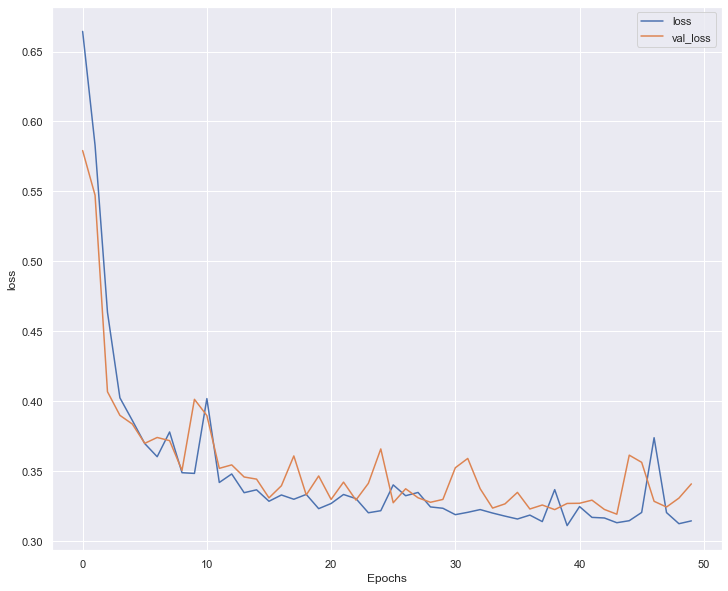

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_40"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_586 (Dense)           (None, 39)                1560      
                                                                 
 dense_587 (Dense)           (None, 42)                1680      
                                                                 
 dense_588 (Dense)           (None, 41)                1763      
                                                                 
 dense_589 (Dense)           (None, 40)                1680      
                                                                 
 dense_590 (Dense)           (None, 39)                1599      
                                                                 
 dense_591 (Dense)           (None, 38)                1520      
                                                                 
 dense_592 (Dense)           (None, 

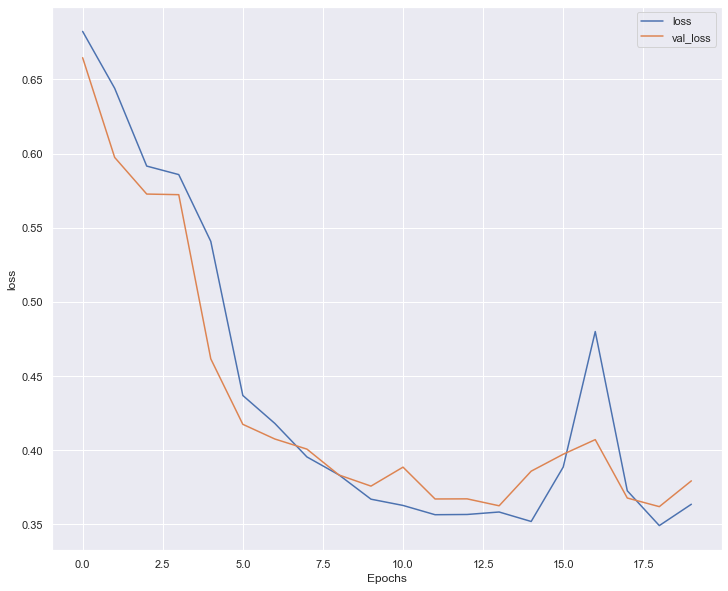

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_41"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_602 (Dense)           (None, 39)                1560      
                                                                 
 dense_603 (Dense)           (None, 42)                1680      
                                                                 
 dense_604 (Dense)           (None, 41)                1763      
                                                                 
 dense_605 (Dense)           (None, 40)                1680      
                                                                 
 dense_606 (Dense)           (None, 39)                1599      
                                                                 
 dense_607 (Dense)           (None, 38)                1520      
                                                                 
 dense_608 (Dense)           (None, 

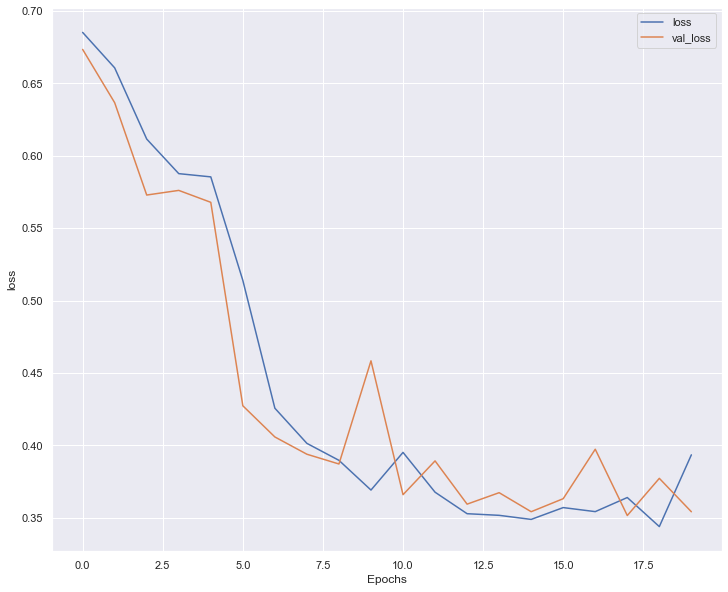

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_42"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_618 (Dense)           (None, 39)                1560      
                                                                 
 dense_619 (Dense)           (None, 42)                1680      
                                                                 
 dense_620 (Dense)           (None, 41)                1763      
                                                                 
 dense_621 (Dense)           (None, 40)                1680      
                                                                 
 dense_622 (Dense)           (None, 39)                1599      
                                                                 
 dense_623 (Dense)           (None, 38)                1520      
                                                                 
 dense_624 (Dense)           (None, 

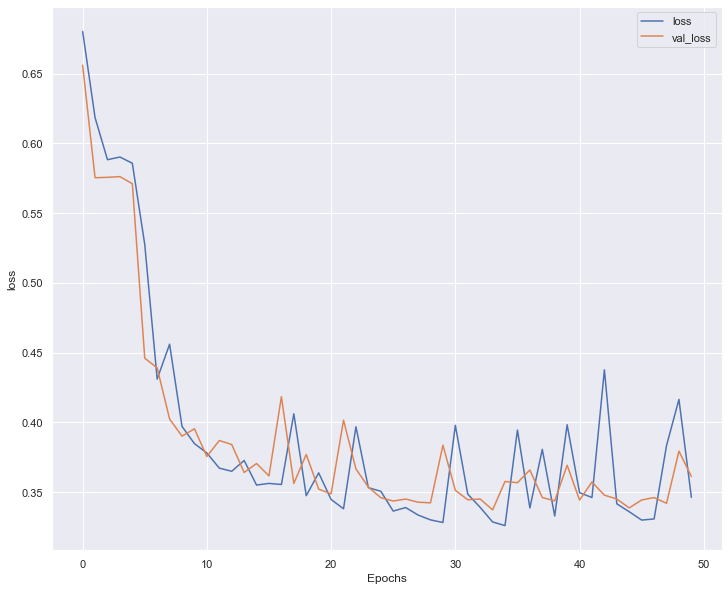

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_43"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_634 (Dense)           (None, 39)                1560      
                                                                 
 dense_635 (Dense)           (None, 42)                1680      
                                                                 
 dense_636 (Dense)           (None, 41)                1763      
                                                                 
 dense_637 (Dense)           (None, 40)                1680      
                                                                 
 dense_638 (Dense)           (None, 39)                1599      
                                                                 
 dense_639 (Dense)           (None, 38)                1520      
                                                                 
 dense_640 (Dense)           (None, 

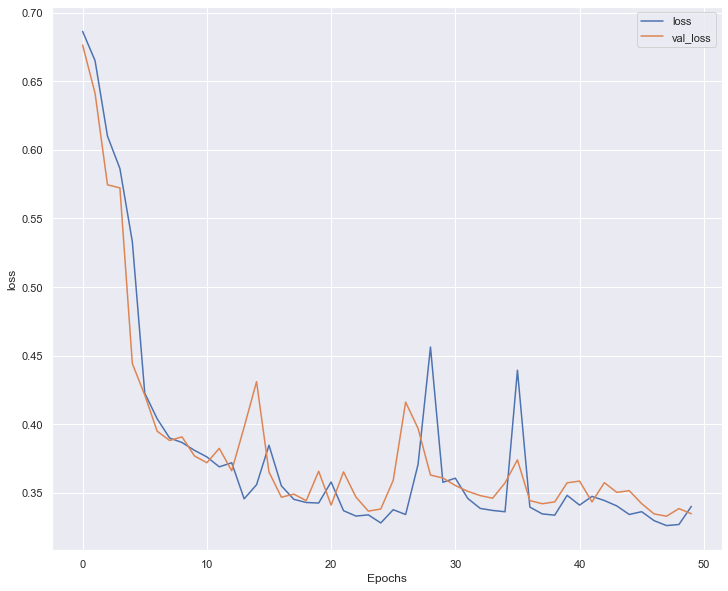

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_44"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_650 (Dense)           (None, 39)                1560      
                                                                 
 dense_651 (Dense)           (None, 42)                1680      
                                                                 
 dense_652 (Dense)           (None, 41)                1763      
                                                                 
 dense_653 (Dense)           (None, 40)                1680      
                                                                 
 dense_654 (Dense)           (None, 39)                1599      
                                                                 
 dense_655 (Dense)           (None, 38)                1520      
                                                                 
 dense_656 (Dense)           (None, 

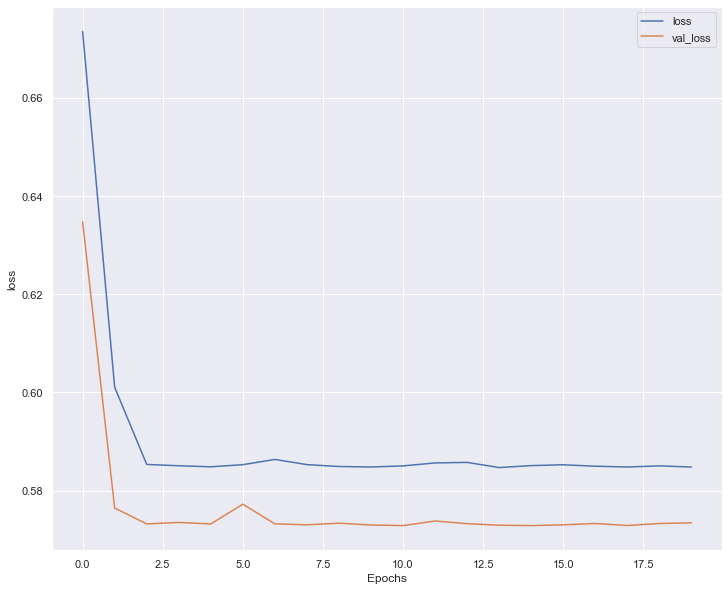

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_45"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_671 (Dense)           (None, 39)                1560      
                                                                 
 dense_672 (Dense)           (None, 42)                1680      
                                                                 
 dense_673 (Dense)           (None, 41)                1763      
                                                                 
 dense_674 (Dense)           (None, 40)                1680      
                                                                 
 dense_675 (Dense)           (None, 39)                1599      
                                                                 
 dense_676 (Dense)           (None, 38)                1520      
                                                                 
 dense_677 (Dense)           (None, 

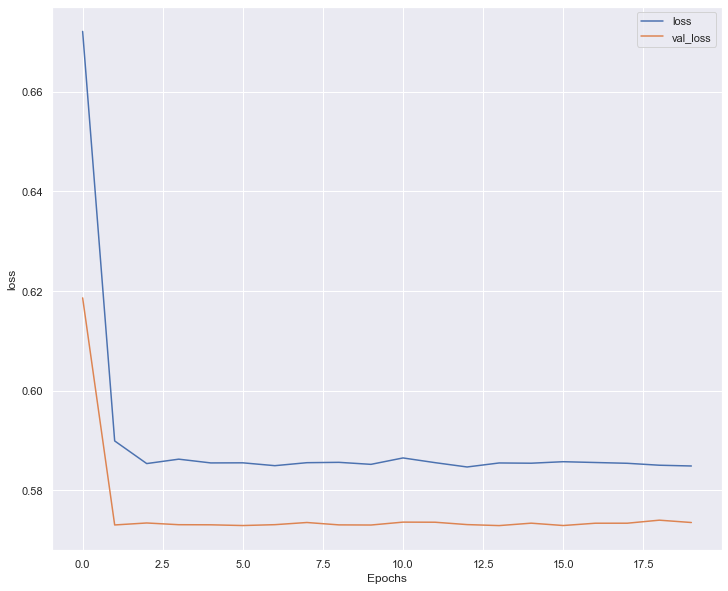

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_46"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_692 (Dense)           (None, 39)                1560      
                                                                 
 dense_693 (Dense)           (None, 42)                1680      
                                                                 
 dense_694 (Dense)           (None, 41)                1763      
                                                                 
 dense_695 (Dense)           (None, 40)                1680      
                                                                 
 dense_696 (Dense)           (None, 39)                1599      
                                                                 
 dense_697 (Dense)           (None, 38)                1520      
                                                                 
 dense_698 (Dense)           (None, 

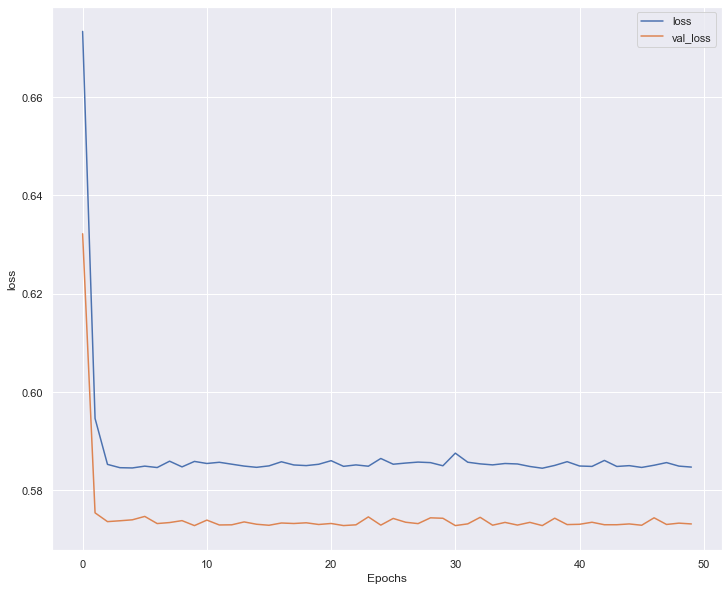

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_47"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_713 (Dense)           (None, 39)                1560      
                                                                 
 dense_714 (Dense)           (None, 42)                1680      
                                                                 
 dense_715 (Dense)           (None, 41)                1763      
                                                                 
 dense_716 (Dense)           (None, 40)                1680      
                                                                 
 dense_717 (Dense)           (None, 39)                1599      
                                                                 
 dense_718 (Dense)           (None, 38)                1520      
                                                                 
 dense_719 (Dense)           (None, 

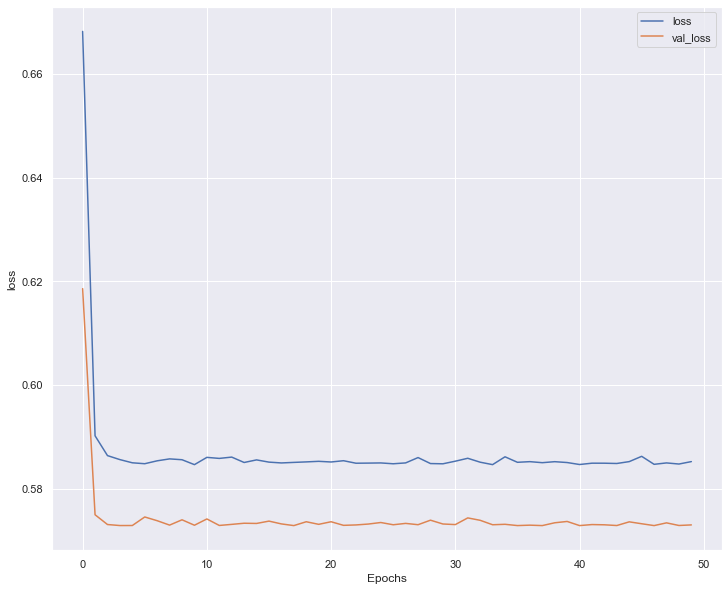

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_48"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_734 (Dense)           (None, 39)                1560      
                                                                 
 dense_735 (Dense)           (None, 42)                1680      
                                                                 
 dense_736 (Dense)           (None, 41)                1763      
                                                                 
 dense_737 (Dense)           (None, 40)                1680      
                                                                 
 dense_738 (Dense)           (None, 39)                1599      
                                                                 
 dense_739 (Dense)           (None, 38)                1520      
                                                                 
 dense_740 (Dense)           (None, 

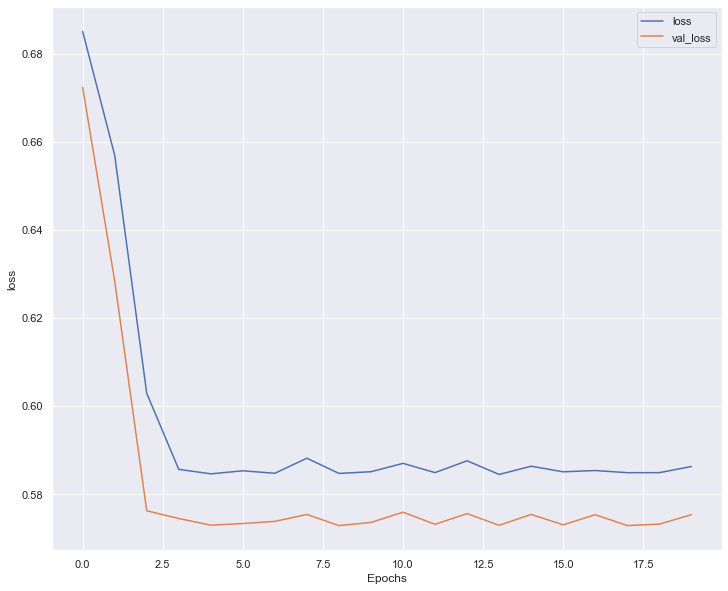

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_49"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_755 (Dense)           (None, 39)                1560      
                                                                 
 dense_756 (Dense)           (None, 42)                1680      
                                                                 
 dense_757 (Dense)           (None, 41)                1763      
                                                                 
 dense_758 (Dense)           (None, 40)                1680      
                                                                 
 dense_759 (Dense)           (None, 39)                1599      
                                                                 
 dense_760 (Dense)           (None, 38)                1520      
                                                                 
 dense_761 (Dense)           (None, 

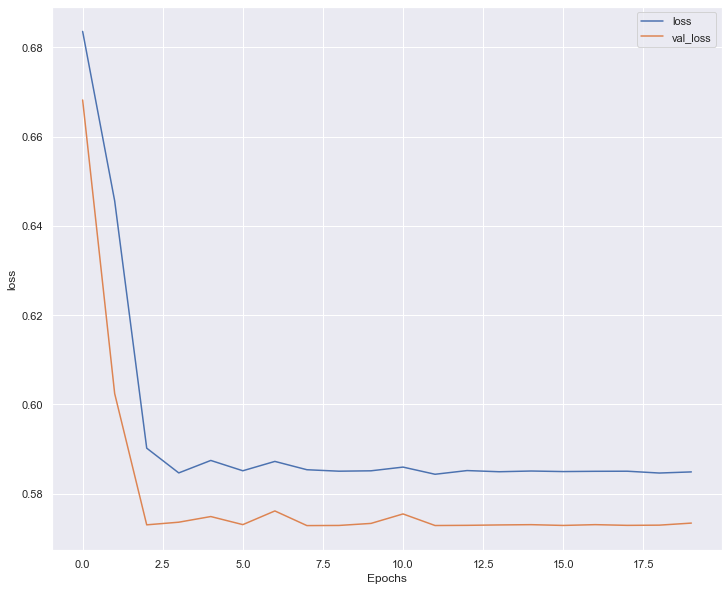

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_50"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_776 (Dense)           (None, 39)                1560      
                                                                 
 dense_777 (Dense)           (None, 42)                1680      
                                                                 
 dense_778 (Dense)           (None, 41)                1763      
                                                                 
 dense_779 (Dense)           (None, 40)                1680      
                                                                 
 dense_780 (Dense)           (None, 39)                1599      
                                                                 
 dense_781 (Dense)           (None, 38)                1520      
                                                                 
 dense_782 (Dense)           (None, 

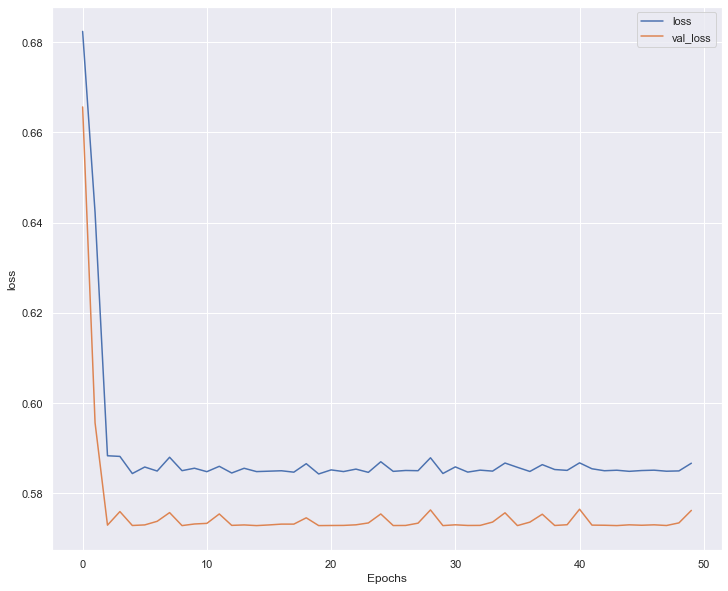

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_51"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_797 (Dense)           (None, 39)                1560      
                                                                 
 dense_798 (Dense)           (None, 42)                1680      
                                                                 
 dense_799 (Dense)           (None, 41)                1763      
                                                                 
 dense_800 (Dense)           (None, 40)                1680      
                                                                 
 dense_801 (Dense)           (None, 39)                1599      
                                                                 
 dense_802 (Dense)           (None, 38)                1520      
                                                                 
 dense_803 (Dense)           (None, 

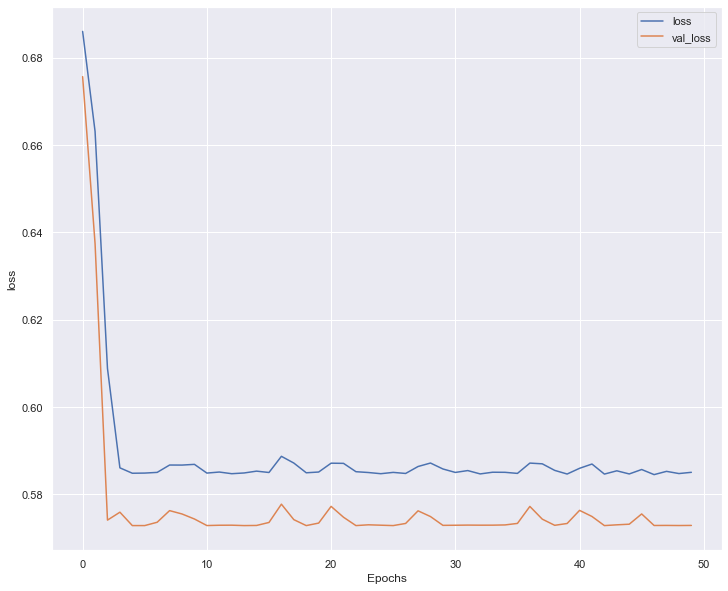

45/45 [==============================] - 0s 1ms/step


In [30]:
param_grid = dict(dense_layers = dense_layers
                    , batch_size = batch_size
                    , epochs = epochs
                   , dense_dropout = dense_dropout
                 )

keys = param_grid.keys()
values = (param_grid[key] for key in keys)
param_grid = [dict(zip(keys, param_grid)) for param_grid in itertools.product(*values)]

print('Proposed ' + str(len(param_grid)) + ' models')

for j in range(0, len(param_grid)):
    
    dense_layers = param_grid[j].get("dense_layers")
    batch_size = param_grid[j].get("batch_size")
    epochs = param_grid[j].get("epochs")
    dense_dropout = param_grid[j].get("dense_dropout")
    
    model = make_model_Decreciente(dense_layers = dense_layers
                   , dense_dropout = dense_dropout
                   , verbose = 1)
    print('batch_size :' + str(batch_size))
    
    history = model.fit(train_features,
                        train_labels,
                        batch_size = batch_size,
                        epochs = epochs,
                        validation_data = (val_features, val_labels), 
                        verbose = 1)
    
    plot_history_train(history, 'loss')
    
    # Calculate validation metrics
    y_val_pred = model.predict(val_features)
    y_val_pred = np.argmax(y_val_pred, axis=1)
    val_conf_mat = confusion_matrix(val_labels, y_val_pred)
    tn, fp, fn, tp = val_conf_mat.ravel()
    val_sensitivity = tp / (tp + fn)
    val_specificity = tn / (tn + fp)
    val_f1_score = f1_score(val_labels, y_val_pred, average='macro')
    
    # Update results
    val_loss = pd.DataFrame.from_dict(history.history)['val_loss'].iloc[-1]
    val_accuracy = pd.DataFrame.from_dict(history.history)['val_accuracy'].iloc[-1]
    loss = pd.DataFrame.from_dict(history.history)['loss'].iloc[-1]
    accuracy = pd.DataFrame.from_dict(history.history)['accuracy'].iloc[-1]
    param_grid[j].update({"loss": loss})
    param_grid[j].update({"accuracy": accuracy})
    param_grid[j].update({"val_loss": val_loss})
    param_grid[j].update({"val_accuracy": val_accuracy})
    param_grid[j].update({"val_sensitivity": val_sensitivity})
    param_grid[j].update({"val_specificity": val_specificity})
    param_grid[j].update({"val_f1_score": val_f1_score})

results_Decreciente = pd.DataFrame(param_grid)

In [31]:
results_Decreciente.sort_values(['val_loss'],ascending = True)

,dense_layers,batch_size,epochs,dense_dropout,loss,accuracy,val_loss,val_accuracy,val_sensitivity,val_specificity,val_f1_score
2,10,64,50,0.0,0.315916,0.851307,0.321789,0.835434,0.671159,0.893094,0.784354
3,10,64,50,0.3,0.317403,0.849805,0.323853,0.832633,0.671159,0.889309,0.781462
10,15,64,50,0.0,0.327047,0.842295,0.326603,0.823529,0.690027,0.870388,0.774849
7,10,128,50,0.3,0.344382,0.833584,0.328418,0.828431,0.636119,0.895932,0.771879
6,10,128,50,0.0,0.323380,0.843196,0.330541,0.831232,0.638814,0.898770,0.775186
15,15,128,50,0.3,0.340234,0.834184,0.334872,0.829832,0.665768,0.887417,0.777804
11,15,64,50,0.3,0.314547,0.849204,0.340989,0.838235,0.568733,0.932829,0.770696
1,10,64,20,0.3,0.328480,0.837789,0.343221,0.829832,0.522911,0.937559,0.752842
0,10,64,20,0.0,0.356707,0.823070,0.344481,0.817227,0.722372,0.850520,0.772881
5,10,128,20,0.3,0.339324,0.835086,0.346317,0.831232,0.628032,0.902554,0.773489


Gracias a la tabla anterior se puede extraer la información que los mejores hiper parámetros del grid search de la <b>arquitectura decreciente</b> se han conseguido en la <i>2</i> red neuronal:
* Dense Layers: 10

* Batch Size: 64

* Epochs: 50

* Dense Dropout: 0%

obteniendo unas métricas bastante favorables en test:
				
* Loss: 0.321789
				
* Accuracy: 0.835434
				
* Sensitivity: 0.671159

* Specificity: 0.893094

* F1-score: 0.784354

<center><b>6 - ELECCIÓN DEL MODELO, TIPO DE FORMA DE LA ARQUITECTURA DE LA RED NEURONAL</b></center>

En la presente sección se va a justificar la elección de la forma de la red neuronal que se utilizará a posterior para predecir cuál es el equipo que va a ganar en el juego <i>LOL</i>: equipo <b>Azul</b> (1) o equipo <b>Rojo</b> (0). Cabe matizar que para las tres formas de la red neuronal se han utilizado los mismos hiper parámetros mediante la utilización de grid search, para poder hacer una correcta comparación. Posterior a la elección de la estructura, se procederá al ajuste de estas métricas.

Para esta toma de decisión se va a tener en cuenta únicamente el mejor modelo creado de las 3 arquitecturas mediante el uso del grid search anterior el cuál nos saca por pantalla los mejores hiper parámetros introducidos y cuales han sido las métricas halladas. Los resultados obtenidos en el Test se pueden observar en la tabla siguiente. 

<table>
    
  <tr>
    <th>Modelo</th>
    <th>Loss</th>
    <th>Accuracy</th>
    <th>Sensibilidad</th>
    <th>Especificidad</th>
    <th>F1-Score</th>
  </tr>

  <tr>
    <td>Modelo lineal</td>
    <td>0.3134</td>
    <td>0.8487</td>
    <td>0.7237</td>
    <td>0.8941</td>
    <td>0.8073</td>
  </tr>

  <tr>
    <td>Modelo en forma de limón</td>
    <td>0.3251</td>
    <td>0.8384</td>
    <td>0.6658</td>
    <td>0.8988</td>
    <td>0.7865</td>
  </tr>
    
  <tr>
    <td>Modelo en forma decreciente</td>
    <td>0.3218</td>
    <td>0.8354</td>
    <td>0.6712</td>
    <td>0.8931</td>
    <td>0.7844</td>
  </tr>
</table>


Mediante la observación de la tabla anterior se puede extraer la conclusión que el modelo en forma de limón y decreciente obtienen unas scores muy similares. Por lo que en un principio daria igual cual de las dos elegir.
<br><br>
Por otra lado, el modelo lineal obtiene unos valores superiores en todas las métricas excepto el Loss, lo cual es lo correcto. Por tanto, dicho modelo es el ideal para continuar con el presente proyecto.
<br><br>
En conclusión, se obtienen unas métricas muy similares en todas las arquitecturas, por lo que "daría" igual que modelo elegir, pero en este caso, se procederá con la elección del <b> Modelo Lienal</b> ya que ofrece un valor de pérdida (0.3134) y F1-Score (0.8073) bastante mejores que las restantes siendo las diferencias de estas en los otros modelos de -0.0117 y -0.0084 , 0.0208 y 0.0229,respectivamente. Para la correcta interpretabilidad e imaginación de la estructura elegida se plotea un ejemplo de esta.

![Modelo en forma decreciente](https://www.cs.us.es/~fsancho/images/2017-02/neuralnetwork.png)


<center><b> 7 - CAMBIAR 3 HIPER PARÁMETROS Y COMPARAR LOS RESULTADOS CON LA RED ANTERIOR: REGULARIZACIÓN; ACTIVACIÓN Y FUNCIÓN DE PÉRDIDA; BATCH SIZE Y DENSE LAYERS</b></center>

<b>1 - REGULARIZACIÓN DE LASSO</b>

En el presente apartado se va a proceder a cambiar un único hiper parámetro de la red neuronal óptima anterior para ver si es posible mejor tanto el rendimiento como los score del modelo.

Dicho cambio se realizará en los parámetros de sobre ajuste del modelo, es decir, en la capa de <i>Drop Out</i>. En este momento no se tendrá la opción del apagado aletaorio de neuornas en las capas densas sinó que se generará una regularización L1: <b>Regularización de Lasso</b>.

La regularización L1 en redes neuronales consiste en agregar un término a la función de pérdida del modelo que penaliza los pesos de las conexiones de la red neuronal que tienen valores altos. Esta penalización se calcula como el valor absoluto de los pesos multiplicado por un parámetro de regularización λ, que controla la fuerza de la penalización.

<center>L1 Regularization = λ * ∑ |w|,<br>
        donde λ es el parámetro de regularización y w son los pesos de las conexiones en la red neuronal.</center>
        
Aplicando esta técnica de regularización se espera reducir la complejidad de la red neuronal y prevenir el sobreajuste. En particular, esta tiene el efecto de reducir el número de pesos significativos en la red, lo que disminuye la probabilidad de que la red se ajuste demasiado a los datos de entrenamiento. Además, la regularización de Lasso tiene la propiedad de que los pesos menos importantes se pueden establecer en cero, lo que puede simplificar aún más la red neuronal y mejorar su interpretación.

Para poder aplicar la Regularización de Lasso hay que cambiar la función make_model_Lineal, eliminando el hiper parámetro de Drop_Out e introduciendo un Kernel regularizador. Ahora la arquitectura pasa a denominarse <b>make_model_Lineal_L1</b>.

In [108]:
def make_model_Lineal_L1(dense_layers = 12
               , l1_lambda = 0.01
               , epochs=4
               , verbose = 1):
    
    # create model
    model = Sequential()
    # Hidden Layers
    #____________________________________________________________________________
    for i in range(0,dense_layers):
            model.add(Dense(units = input_len
                        , input_dim = input_len
                        , kernel_initializer='normal'
                        , activation='relu'
                        , kernel_regularizer=regularizers.l1(l1_lambda))) # Regularization
        
    # Cost function Layer
    #____________________________________________________________________________
    model.add(Dense(2, activation='softmax', kernel_initializer='normal'))
    
    # Compile model
    optimizer = keras.optimizers.Adam(lr=1e-3)
    model.compile(optimizer = optimizer,
                  loss='sparse_categorical_crossentropy' 
                  ,metrics = ['accuracy',precision, recall])
    if verbose:
        print('dense_layers :' + str(dense_layers))
        print(model.summary())
        
    return model

model = make_model_Lineal_L1()

dense_layers :12
Model: "sequential_268"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4196 (Dense)          (None, 39)                1560      
                                                                 
 dense_4197 (Dense)          (None, 39)                1560      
                                                                 
 dense_4198 (Dense)          (None, 39)                1560      
                                                                 
 dense_4199 (Dense)          (None, 39)                1560      
                                                                 
 dense_4200 (Dense)          (None, 39)                1560      
                                                                 
 dense_4201 (Dense)          (None, 39)                1560      
                                                                 
 dense_4202 (Dense)          (None,

Se realiza de nuevo un grid search con la arquitectura Lineal pero ahora con la Regularización de Lasso. Los hiper parámetros batch size, epochs y dense layers tendrán los mismos valores que en el apartado anterior, para así hacer la comparativa justa.

Para los valores de λ, se han elegido 3: <i>0.000001</i>,<i>0.00001</i> y <i>0.0001</i>. Se eligen valores pequeños debido a la característica de los datos ya que NO son ruidosos y no se posee una gran cantidad. Estos pueden ser suficiente para proporcionar cierto nivel de regularización y evitar el sobreajuste del modelo.

*Nota: Se han probado distintos valores de λ y los anteriores son lo que se han considerado óptimos. A continuación presento la lista de valores probados: 0.0001, 0.001,0.01 y 0.1.

In [119]:
batch_size = [64, 128]
epochs = [20,50]
dense_layers = [10, 15, 20]
l1_lambda = [0.000001, 0.00001, 0.0001]

<b>ARQUITECTURA LINEAL CON REGULARIZACIÓN DE LASSO</b>

Proposed 36 models
dense_layers :10
Model: "sequential_342"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5372 (Dense)          (None, 39)                1560      
                                                                 
 dense_5373 (Dense)          (None, 39)                1560      
                                                                 
 dense_5374 (Dense)          (None, 39)                1560      
                                                                 
 dense_5375 (Dense)          (None, 39)                1560      
                                                                 
 dense_5376 (Dense)          (None, 39)                1560      
                                                                 
 dense_5377 (Dense)          (None, 39)                1560      
                                                                 
 dense_5378 (Den

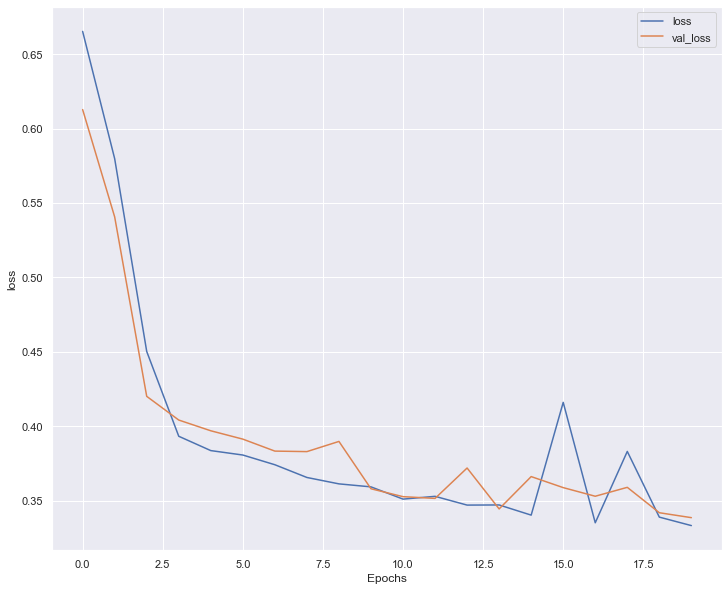

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_343"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5383 (Dense)          (None, 39)                1560      
                                                                 
 dense_5384 (Dense)          (None, 39)                1560      
                                                                 
 dense_5385 (Dense)          (None, 39)                1560      
                                                                 
 dense_5386 (Dense)          (None, 39)                1560      
                                                                 
 dense_5387 (Dense)          (None, 39)                1560      
                                                                 
 dense_5388 (Dense)          (None, 39)                1560      
                                                                 
 dense_5389 (Dense)          (None,

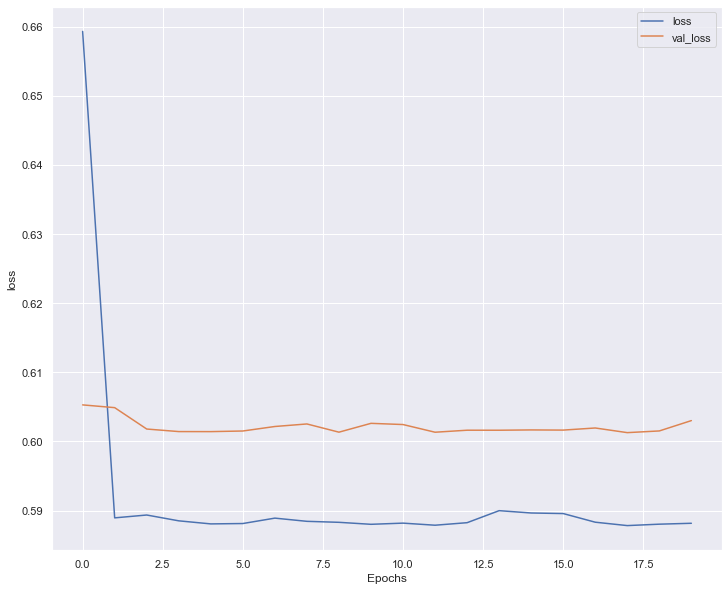

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_344"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5394 (Dense)          (None, 39)                1560      
                                                                 
 dense_5395 (Dense)          (None, 39)                1560      
                                                                 
 dense_5396 (Dense)          (None, 39)                1560      
                                                                 
 dense_5397 (Dense)          (None, 39)                1560      
                                                                 
 dense_5398 (Dense)          (None, 39)                1560      
                                                                 
 dense_5399 (Dense)          (None, 39)                1560      
                                                                 
 dense_5400 (Dense)          (None,

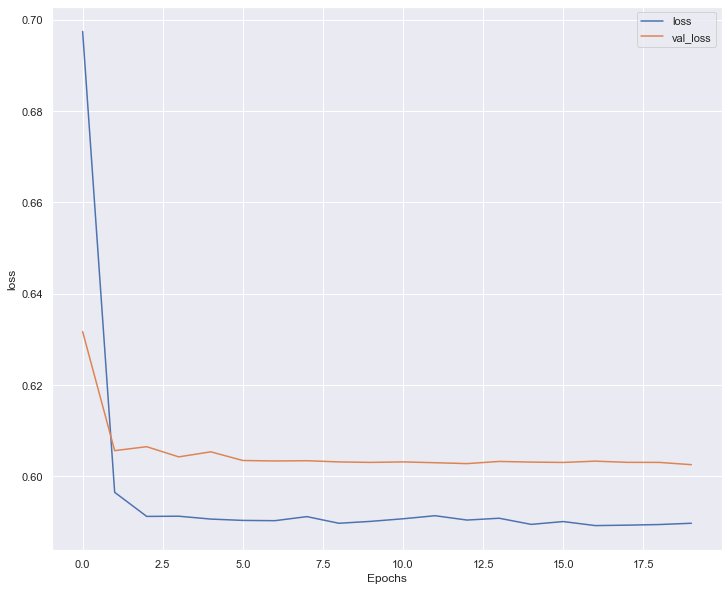

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_345"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5405 (Dense)          (None, 39)                1560      
                                                                 
 dense_5406 (Dense)          (None, 39)                1560      
                                                                 
 dense_5407 (Dense)          (None, 39)                1560      
                                                                 
 dense_5408 (Dense)          (None, 39)                1560      
                                                                 
 dense_5409 (Dense)          (None, 39)                1560      
                                                                 
 dense_5410 (Dense)          (None, 39)                1560      
                                                                 
 dense_5411 (Dense)          (None,

53/53 [==============================] - 0s 3ms/step - loss: 0.3386 - accuracy: 0.8294 - precision: 0.2689 - recall: 0.9811 - val_loss: 0.4167 - val_accuracy: 0.8228 - val_precision: 0.2918 - val_recall: 1.0000
Epoch 30/50
53/53 [==============================] - 0s 2ms/step - loss: 0.3410 - accuracy: 0.8279 - precision: 0.2874 - recall: 1.0000 - val_loss: 0.3501 - val_accuracy: 0.8277 - val_precision: 0.2918 - val_recall: 1.0000
Epoch 31/50
53/53 [==============================] - 0s 2ms/step - loss: 0.3955 - accuracy: 0.7876 - precision: 0.2689 - recall: 0.9811 - val_loss: 0.3481 - val_accuracy: 0.8298 - val_precision: 0.2918 - val_recall: 1.0000
Epoch 32/50
53/53 [==============================] - 0s 2ms/step - loss: 0.3382 - accuracy: 0.8336 - precision: 0.2689 - recall: 0.9811 - val_loss: 0.3409 - val_accuracy: 0.8410 - val_precision: 0.2918 - val_recall: 1.0000
Epoch 33/50
53/53 [==============================] - 0s 2ms/step - loss: 0.3332 - accuracy: 0.8423 - precision: 0.2689 -

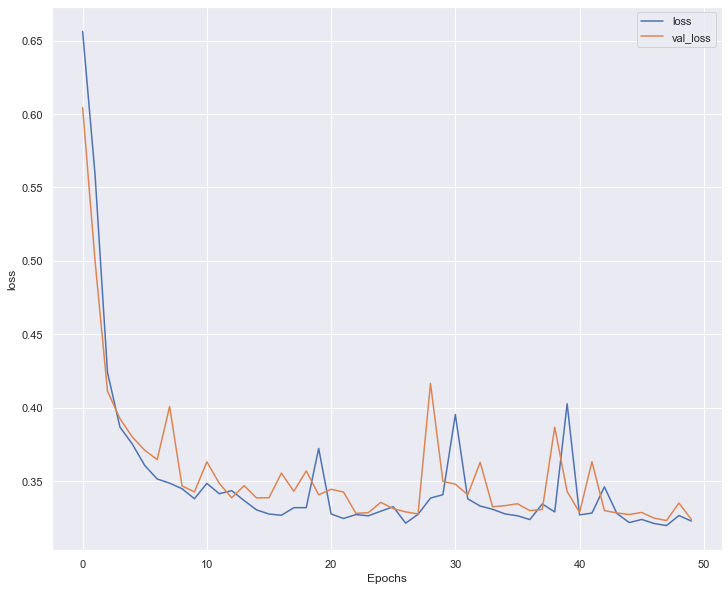

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_346"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5416 (Dense)          (None, 39)                1560      
                                                                 
 dense_5417 (Dense)          (None, 39)                1560      
                                                                 
 dense_5418 (Dense)          (None, 39)                1560      
                                                                 
 dense_5419 (Dense)          (None, 39)                1560      
                                                                 
 dense_5420 (Dense)          (None, 39)                1560      
                                                                 
 dense_5421 (Dense)          (None, 39)                1560      
                                                                 
 dense_5422 (Dense)          (None,

53/53 [==============================] - 0s 3ms/step - loss: 0.5888 - accuracy: 0.7260 - precision: 0.2874 - recall: 1.0000 - val_loss: 0.6012 - val_accuracy: 0.7115 - val_precision: 0.2918 - val_recall: 1.0000
Epoch 30/50
53/53 [==============================] - 0s 3ms/step - loss: 0.5896 - accuracy: 0.7260 - precision: 0.2874 - recall: 1.0000 - val_loss: 0.6012 - val_accuracy: 0.7115 - val_precision: 0.2918 - val_recall: 1.0000
Epoch 31/50
53/53 [==============================] - 0s 2ms/step - loss: 0.5888 - accuracy: 0.7260 - precision: 0.2689 - recall: 0.9811 - val_loss: 0.6023 - val_accuracy: 0.7115 - val_precision: 0.2918 - val_recall: 1.0000
Epoch 32/50
53/53 [==============================] - 0s 3ms/step - loss: 0.5881 - accuracy: 0.7260 - precision: 0.2689 - recall: 0.9811 - val_loss: 0.6016 - val_accuracy: 0.7115 - val_precision: 0.2918 - val_recall: 1.0000
Epoch 33/50
53/53 [==============================] - 0s 3ms/step - loss: 0.5878 - accuracy: 0.7260 - precision: 0.2689 -

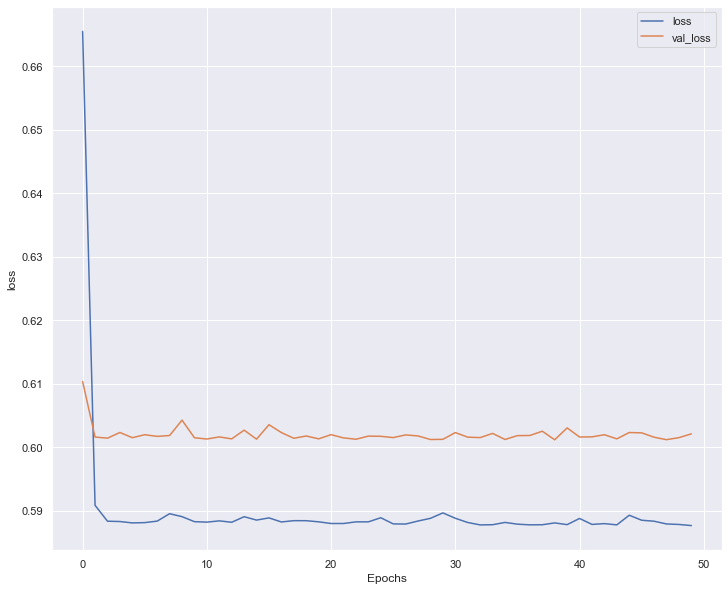

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_347"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5427 (Dense)          (None, 39)                1560      
                                                                 
 dense_5428 (Dense)          (None, 39)                1560      
                                                                 
 dense_5429 (Dense)          (None, 39)                1560      
                                                                 
 dense_5430 (Dense)          (None, 39)                1560      
                                                                 
 dense_5431 (Dense)          (None, 39)                1560      
                                                                 
 dense_5432 (Dense)          (None, 39)                1560      
                                                                 
 dense_5433 (Dense)          (None,

53/53 [==============================] - 0s 2ms/step - loss: 0.5889 - accuracy: 0.7260 - precision: 0.2689 - recall: 0.9811 - val_loss: 0.6030 - val_accuracy: 0.7115 - val_precision: 0.2918 - val_recall: 1.0000
Epoch 30/50
53/53 [==============================] - 0s 2ms/step - loss: 0.5892 - accuracy: 0.7260 - precision: 0.2689 - recall: 0.9811 - val_loss: 0.6027 - val_accuracy: 0.7115 - val_precision: 0.2918 - val_recall: 1.0000
Epoch 31/50
53/53 [==============================] - 0s 2ms/step - loss: 0.5889 - accuracy: 0.7260 - precision: 0.2689 - recall: 0.9811 - val_loss: 0.6035 - val_accuracy: 0.7115 - val_precision: 0.2918 - val_recall: 1.0000
Epoch 32/50
53/53 [==============================] - 0s 2ms/step - loss: 0.5892 - accuracy: 0.7260 - precision: 0.2689 - recall: 0.9811 - val_loss: 0.6041 - val_accuracy: 0.7115 - val_precision: 0.2918 - val_recall: 1.0000
Epoch 33/50
53/53 [==============================] - 0s 3ms/step - loss: 0.5891 - accuracy: 0.7260 - precision: 0.2874 -

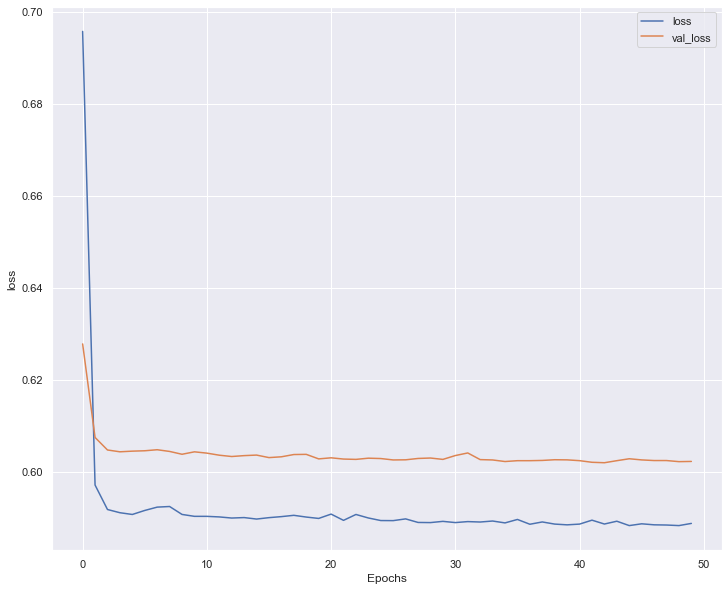

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_348"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5438 (Dense)          (None, 39)                1560      
                                                                 
 dense_5439 (Dense)          (None, 39)                1560      
                                                                 
 dense_5440 (Dense)          (None, 39)                1560      
                                                                 
 dense_5441 (Dense)          (None, 39)                1560      
                                                                 
 dense_5442 (Dense)          (None, 39)                1560      
                                                                 
 dense_5443 (Dense)          (None, 39)                1560      
                                                                 
 dense_5444 (Dense)          (None,

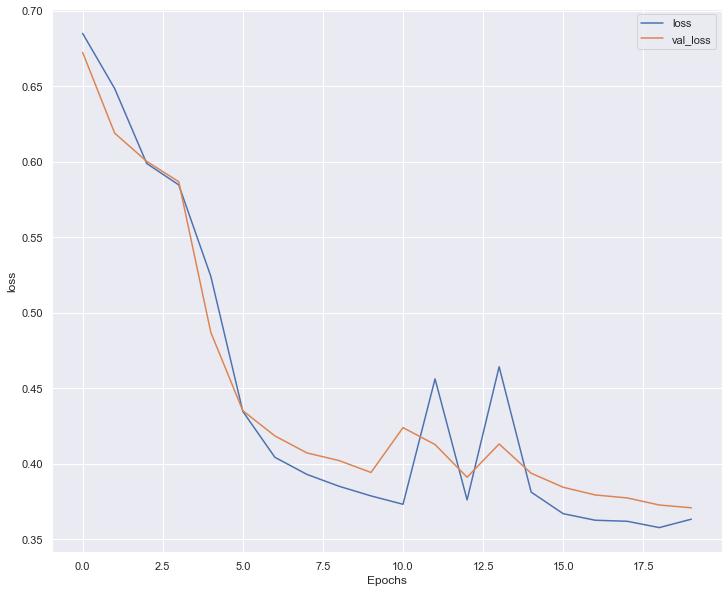

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_349"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5449 (Dense)          (None, 39)                1560      
                                                                 
 dense_5450 (Dense)          (None, 39)                1560      
                                                                 
 dense_5451 (Dense)          (None, 39)                1560      
                                                                 
 dense_5452 (Dense)          (None, 39)                1560      
                                                                 
 dense_5453 (Dense)          (None, 39)                1560      
                                                                 
 dense_5454 (Dense)          (None, 39)                1560      
                                                                 
 dense_5455 (Dense)          (None,

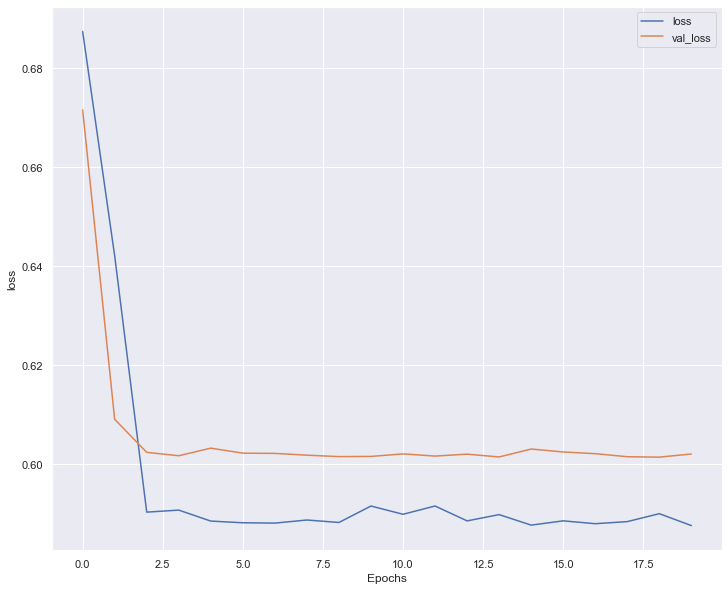

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_350"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5460 (Dense)          (None, 39)                1560      
                                                                 
 dense_5461 (Dense)          (None, 39)                1560      
                                                                 
 dense_5462 (Dense)          (None, 39)                1560      
                                                                 
 dense_5463 (Dense)          (None, 39)                1560      
                                                                 
 dense_5464 (Dense)          (None, 39)                1560      
                                                                 
 dense_5465 (Dense)          (None, 39)                1560      
                                                                 
 dense_5466 (Dense)          (None,

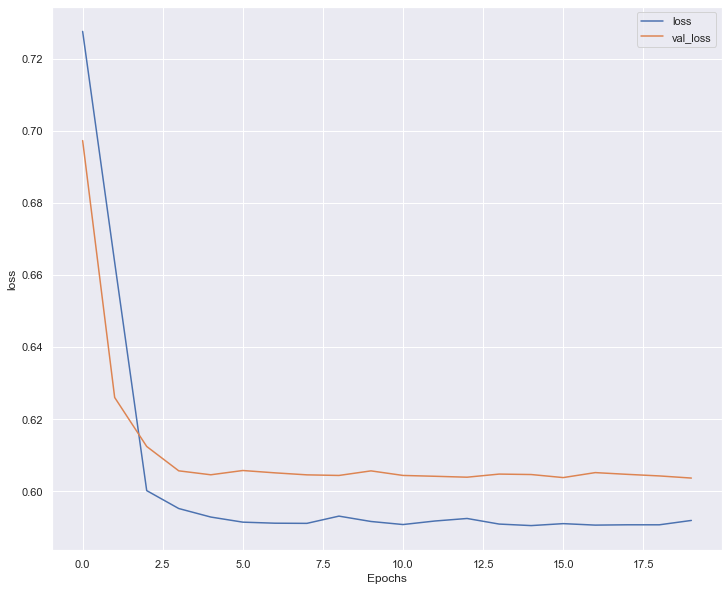

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_351"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5471 (Dense)          (None, 39)                1560      
                                                                 
 dense_5472 (Dense)          (None, 39)                1560      
                                                                 
 dense_5473 (Dense)          (None, 39)                1560      
                                                                 
 dense_5474 (Dense)          (None, 39)                1560      
                                                                 
 dense_5475 (Dense)          (None, 39)                1560      
                                                                 
 dense_5476 (Dense)          (None, 39)                1560      
                                                                 
 dense_5477 (Dense)          (None,

27/27 [==============================] - 0s 3ms/step - loss: 0.3355 - accuracy: 0.8369 - precision: 0.2639 - recall: 0.9630 - val_loss: 0.3600 - val_accuracy: 0.8396 - val_precision: 0.2964 - val_recall: 1.0000
Epoch 30/50
27/27 [==============================] - 0s 3ms/step - loss: 0.3441 - accuracy: 0.8291 - precision: 0.2639 - recall: 0.9630 - val_loss: 0.3423 - val_accuracy: 0.8354 - val_precision: 0.2964 - val_recall: 1.0000
Epoch 31/50
27/27 [==============================] - 0s 3ms/step - loss: 0.3328 - accuracy: 0.8363 - precision: 0.2639 - recall: 0.9630 - val_loss: 0.3437 - val_accuracy: 0.8459 - val_precision: 0.2964 - val_recall: 1.0000
Epoch 32/50
27/27 [==============================] - 0s 3ms/step - loss: 0.3316 - accuracy: 0.8378 - precision: 0.2639 - recall: 0.9630 - val_loss: 0.3388 - val_accuracy: 0.8431 - val_precision: 0.2964 - val_recall: 1.0000
Epoch 33/50
27/27 [==============================] - 0s 3ms/step - loss: 0.3326 - accuracy: 0.8384 - precision: 0.2639 -

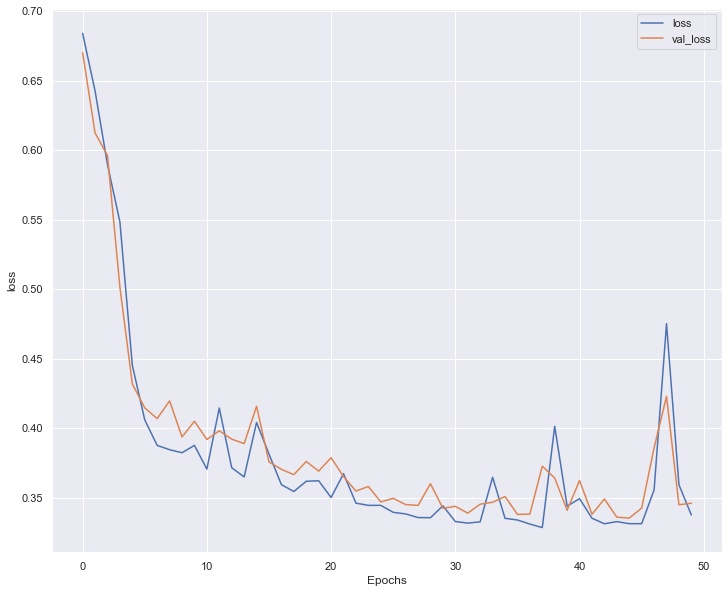

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_352"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5482 (Dense)          (None, 39)                1560      
                                                                 
 dense_5483 (Dense)          (None, 39)                1560      
                                                                 
 dense_5484 (Dense)          (None, 39)                1560      
                                                                 
 dense_5485 (Dense)          (None, 39)                1560      
                                                                 
 dense_5486 (Dense)          (None, 39)                1560      
                                                                 
 dense_5487 (Dense)          (None, 39)                1560      
                                                                 
 dense_5488 (Dense)          (None,

27/27 [==============================] - 0s 3ms/step - loss: 0.5879 - accuracy: 0.7260 - precision: 0.2639 - recall: 0.9630 - val_loss: 0.6022 - val_accuracy: 0.7115 - val_precision: 0.2964 - val_recall: 1.0000
Epoch 30/50
27/27 [==============================] - 0s 3ms/step - loss: 0.5879 - accuracy: 0.7260 - precision: 0.2639 - recall: 0.9630 - val_loss: 0.6029 - val_accuracy: 0.7115 - val_precision: 0.2964 - val_recall: 1.0000
Epoch 31/50
27/27 [==============================] - 0s 3ms/step - loss: 0.5882 - accuracy: 0.7260 - precision: 0.2639 - recall: 0.9630 - val_loss: 0.6021 - val_accuracy: 0.7115 - val_precision: 0.2964 - val_recall: 1.0000
Epoch 32/50
27/27 [==============================] - 0s 3ms/step - loss: 0.5880 - accuracy: 0.7260 - precision: 0.3006 - recall: 1.0000 - val_loss: 0.6018 - val_accuracy: 0.7115 - val_precision: 0.2964 - val_recall: 1.0000
Epoch 33/50
27/27 [==============================] - 0s 3ms/step - loss: 0.5899 - accuracy: 0.7260 - precision: 0.3006 -

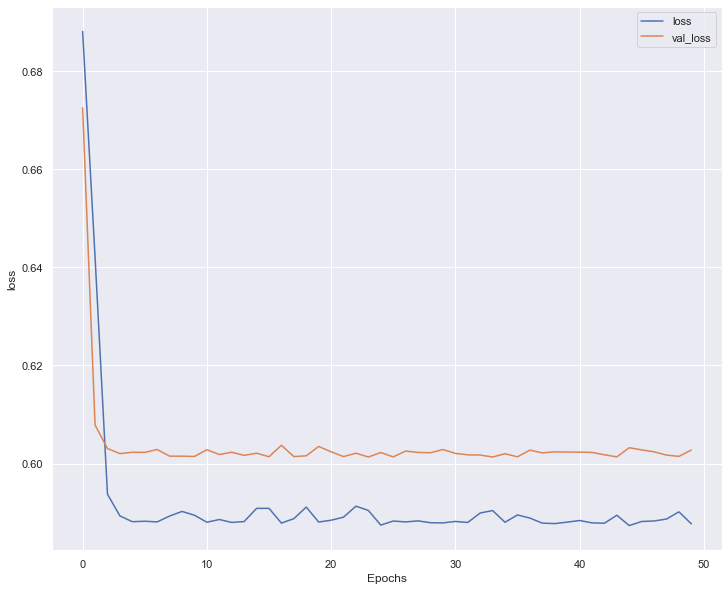

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_353"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5493 (Dense)          (None, 39)                1560      
                                                                 
 dense_5494 (Dense)          (None, 39)                1560      
                                                                 
 dense_5495 (Dense)          (None, 39)                1560      
                                                                 
 dense_5496 (Dense)          (None, 39)                1560      
                                                                 
 dense_5497 (Dense)          (None, 39)                1560      
                                                                 
 dense_5498 (Dense)          (None, 39)                1560      
                                                                 
 dense_5499 (Dense)          (None,

27/27 [==============================] - 0s 3ms/step - loss: 0.5921 - accuracy: 0.7260 - precision: 0.2639 - recall: 0.9630 - val_loss: 0.6034 - val_accuracy: 0.7115 - val_precision: 0.2964 - val_recall: 1.0000
Epoch 30/50
27/27 [==============================] - 0s 3ms/step - loss: 0.5902 - accuracy: 0.7260 - precision: 0.3006 - recall: 1.0000 - val_loss: 0.6039 - val_accuracy: 0.7115 - val_precision: 0.2964 - val_recall: 1.0000
Epoch 31/50
27/27 [==============================] - 0s 3ms/step - loss: 0.5908 - accuracy: 0.7260 - precision: 0.3006 - recall: 1.0000 - val_loss: 0.6034 - val_accuracy: 0.7115 - val_precision: 0.2964 - val_recall: 1.0000
Epoch 32/50
27/27 [==============================] - 0s 3ms/step - loss: 0.5918 - accuracy: 0.7260 - precision: 0.2639 - recall: 0.9630 - val_loss: 0.6033 - val_accuracy: 0.7115 - val_precision: 0.2964 - val_recall: 1.0000
Epoch 33/50
27/27 [==============================] - 0s 3ms/step - loss: 0.5897 - accuracy: 0.7260 - precision: 0.2639 -

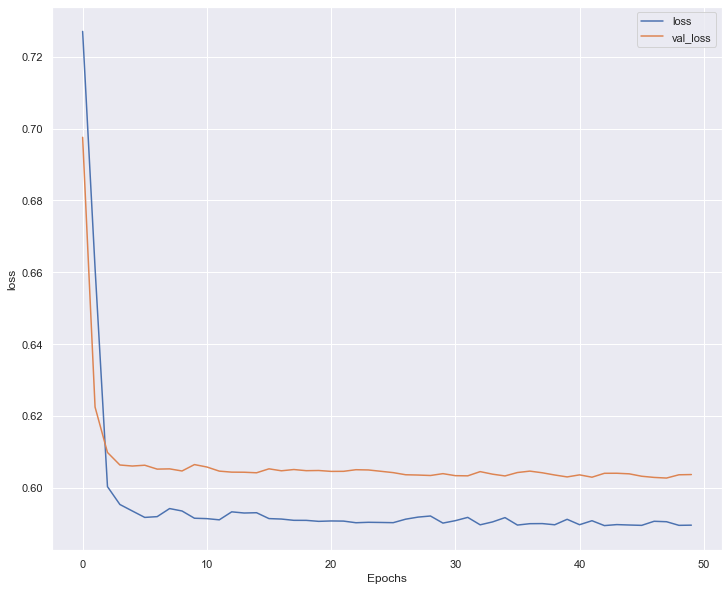

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_354"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5504 (Dense)          (None, 39)                1560      
                                                                 
 dense_5505 (Dense)          (None, 39)                1560      
                                                                 
 dense_5506 (Dense)          (None, 39)                1560      
                                                                 
 dense_5507 (Dense)          (None, 39)                1560      
                                                                 
 dense_5508 (Dense)          (None, 39)                1560      
                                                                 
 dense_5509 (Dense)          (None, 39)                1560      
                                                                 
 dense_5510 (Dense)          (None,

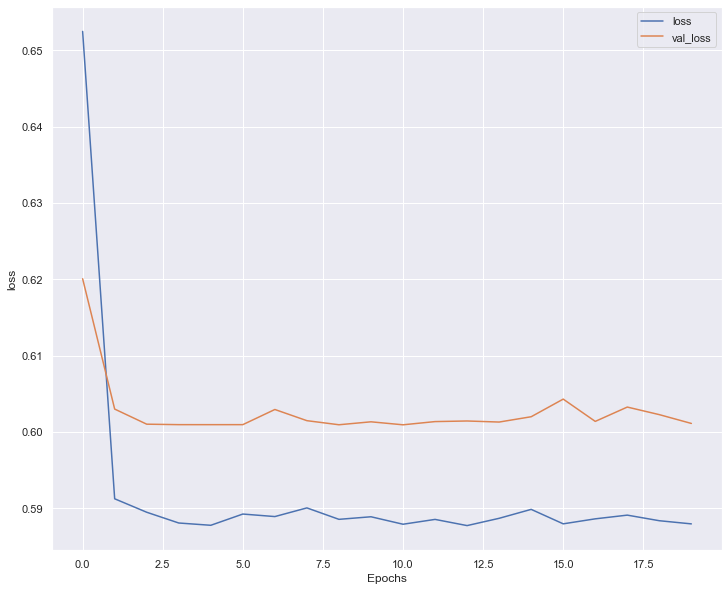

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_355"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5520 (Dense)          (None, 39)                1560      
                                                                 
 dense_5521 (Dense)          (None, 39)                1560      
                                                                 
 dense_5522 (Dense)          (None, 39)                1560      
                                                                 
 dense_5523 (Dense)          (None, 39)                1560      
                                                                 
 dense_5524 (Dense)          (None, 39)                1560      
                                                                 
 dense_5525 (Dense)          (None, 39)                1560      
                                                                 
 dense_5526 (Dense)          (None,

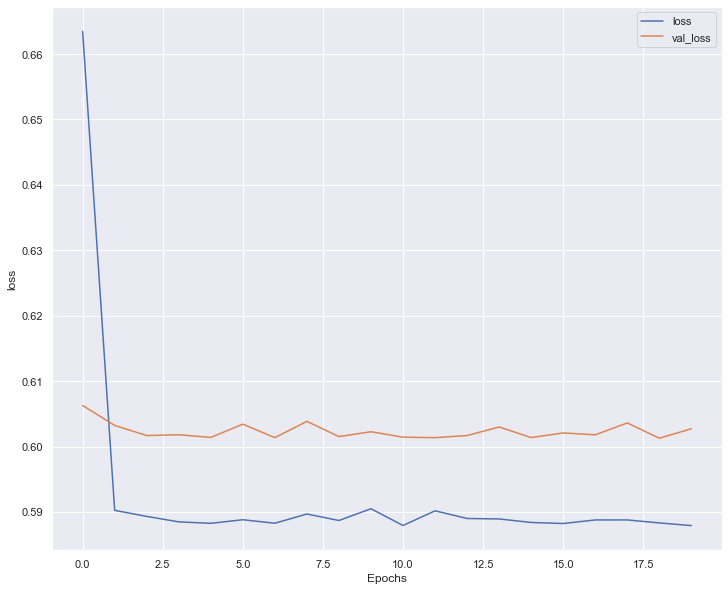

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_356"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5536 (Dense)          (None, 39)                1560      
                                                                 
 dense_5537 (Dense)          (None, 39)                1560      
                                                                 
 dense_5538 (Dense)          (None, 39)                1560      
                                                                 
 dense_5539 (Dense)          (None, 39)                1560      
                                                                 
 dense_5540 (Dense)          (None, 39)                1560      
                                                                 
 dense_5541 (Dense)          (None, 39)                1560      
                                                                 
 dense_5542 (Dense)          (None,

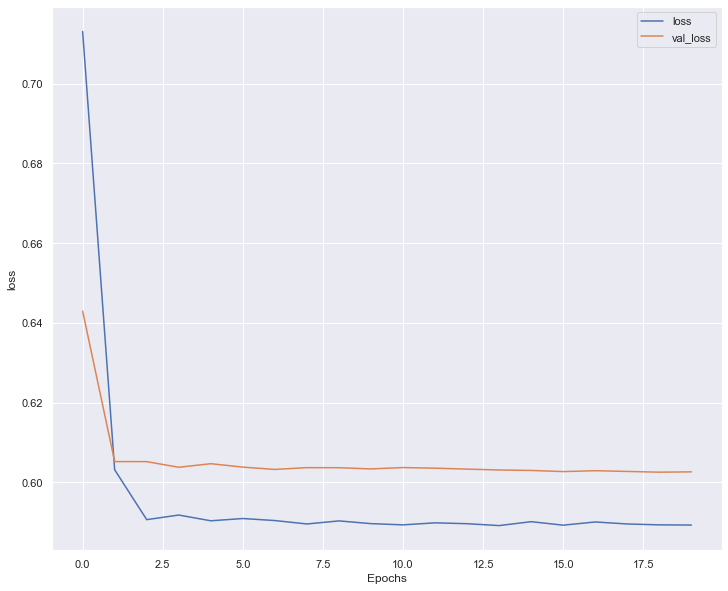

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_357"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5552 (Dense)          (None, 39)                1560      
                                                                 
 dense_5553 (Dense)          (None, 39)                1560      
                                                                 
 dense_5554 (Dense)          (None, 39)                1560      
                                                                 
 dense_5555 (Dense)          (None, 39)                1560      
                                                                 
 dense_5556 (Dense)          (None, 39)                1560      
                                                                 
 dense_5557 (Dense)          (None, 39)                1560      
                                                                 
 dense_5558 (Dense)          (None,

53/53 [==============================] - 0s 3ms/step - loss: 0.5894 - accuracy: 0.7260 - precision: 0.2689 - recall: 0.9811 - val_loss: 0.6019 - val_accuracy: 0.7115 - val_precision: 0.2918 - val_recall: 1.0000
Epoch 27/50
53/53 [==============================] - 0s 3ms/step - loss: 0.5879 - accuracy: 0.7260 - precision: 0.2689 - recall: 0.9811 - val_loss: 0.6018 - val_accuracy: 0.7115 - val_precision: 0.2918 - val_recall: 1.0000
Epoch 28/50
53/53 [==============================] - 0s 3ms/step - loss: 0.5878 - accuracy: 0.7260 - precision: 0.2689 - recall: 0.9811 - val_loss: 0.6016 - val_accuracy: 0.7115 - val_precision: 0.2918 - val_recall: 1.0000
Epoch 29/50
53/53 [==============================] - 0s 3ms/step - loss: 0.5876 - accuracy: 0.7260 - precision: 0.2689 - recall: 0.9811 - val_loss: 0.6020 - val_accuracy: 0.7115 - val_precision: 0.2918 - val_recall: 1.0000
Epoch 30/50
53/53 [==============================] - 0s 3ms/step - loss: 0.5880 - accuracy: 0.7260 - precision: 0.2689 -

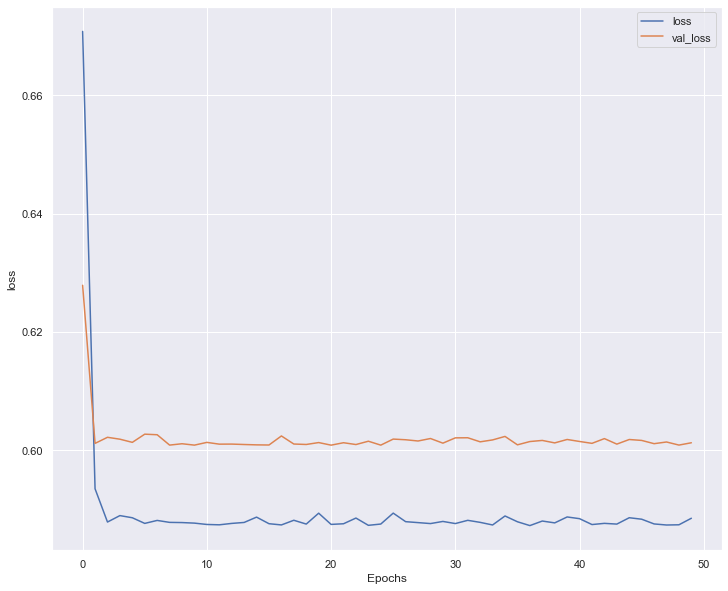

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_358"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5568 (Dense)          (None, 39)                1560      
                                                                 
 dense_5569 (Dense)          (None, 39)                1560      
                                                                 
 dense_5570 (Dense)          (None, 39)                1560      
                                                                 
 dense_5571 (Dense)          (None, 39)                1560      
                                                                 
 dense_5572 (Dense)          (None, 39)                1560      
                                                                 
 dense_5573 (Dense)          (None, 39)                1560      
                                                                 
 dense_5574 (Dense)          (None,

53/53 [==============================] - 0s 3ms/step - loss: 0.5893 - accuracy: 0.7260 - precision: 0.2874 - recall: 1.0000 - val_loss: 0.6025 - val_accuracy: 0.7115 - val_precision: 0.2918 - val_recall: 1.0000
Epoch 27/50
53/53 [==============================] - 0s 3ms/step - loss: 0.5888 - accuracy: 0.7260 - precision: 0.2874 - recall: 1.0000 - val_loss: 0.6018 - val_accuracy: 0.7115 - val_precision: 0.2918 - val_recall: 1.0000
Epoch 28/50
53/53 [==============================] - 0s 3ms/step - loss: 0.5886 - accuracy: 0.7260 - precision: 0.2874 - recall: 1.0000 - val_loss: 0.6017 - val_accuracy: 0.7115 - val_precision: 0.2918 - val_recall: 1.0000
Epoch 29/50
53/53 [==============================] - 0s 3ms/step - loss: 0.5884 - accuracy: 0.7260 - precision: 0.2874 - recall: 1.0000 - val_loss: 0.6013 - val_accuracy: 0.7115 - val_precision: 0.2918 - val_recall: 1.0000
Epoch 30/50
53/53 [==============================] - 0s 3ms/step - loss: 0.5884 - accuracy: 0.7260 - precision: 0.2689 -

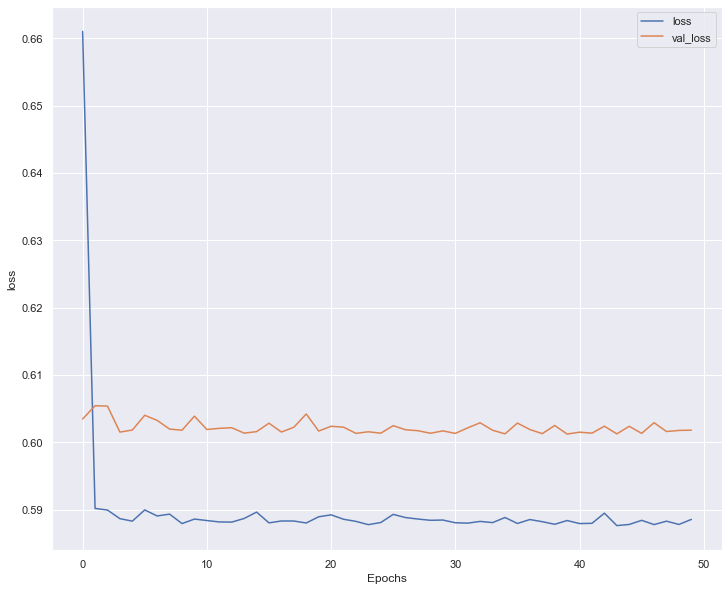

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_359"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5584 (Dense)          (None, 39)                1560      
                                                                 
 dense_5585 (Dense)          (None, 39)                1560      
                                                                 
 dense_5586 (Dense)          (None, 39)                1560      
                                                                 
 dense_5587 (Dense)          (None, 39)                1560      
                                                                 
 dense_5588 (Dense)          (None, 39)                1560      
                                                                 
 dense_5589 (Dense)          (None, 39)                1560      
                                                                 
 dense_5590 (Dense)          (None,

53/53 [==============================] - 0s 3ms/step - loss: 0.5890 - accuracy: 0.7260 - precision: 0.2874 - recall: 1.0000 - val_loss: 0.6028 - val_accuracy: 0.7115 - val_precision: 0.2918 - val_recall: 1.0000
Epoch 27/50
53/53 [==============================] - 0s 3ms/step - loss: 0.5901 - accuracy: 0.7260 - precision: 0.2689 - recall: 0.9811 - val_loss: 0.6025 - val_accuracy: 0.7115 - val_precision: 0.2918 - val_recall: 1.0000
Epoch 28/50
53/53 [==============================] - 0s 3ms/step - loss: 0.5892 - accuracy: 0.7260 - precision: 0.2689 - recall: 0.9811 - val_loss: 0.6029 - val_accuracy: 0.7115 - val_precision: 0.2918 - val_recall: 1.0000
Epoch 29/50
53/53 [==============================] - 0s 3ms/step - loss: 0.5890 - accuracy: 0.7260 - precision: 0.2689 - recall: 0.9811 - val_loss: 0.6034 - val_accuracy: 0.7115 - val_precision: 0.2918 - val_recall: 1.0000
Epoch 30/50
53/53 [==============================] - 0s 3ms/step - loss: 0.5892 - accuracy: 0.7260 - precision: 0.2689 -

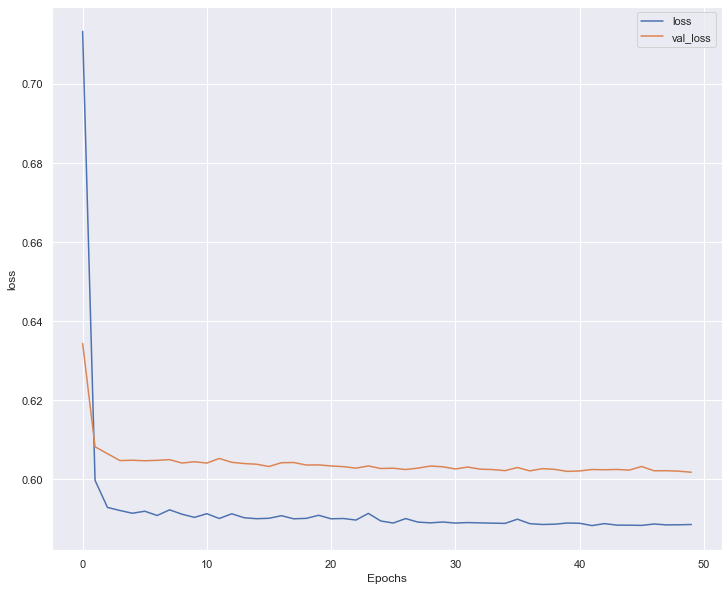

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_360"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5600 (Dense)          (None, 39)                1560      
                                                                 
 dense_5601 (Dense)          (None, 39)                1560      
                                                                 
 dense_5602 (Dense)          (None, 39)                1560      
                                                                 
 dense_5603 (Dense)          (None, 39)                1560      
                                                                 
 dense_5604 (Dense)          (None, 39)                1560      
                                                                 
 dense_5605 (Dense)          (None, 39)                1560      
                                                                 
 dense_5606 (Dense)          (None,

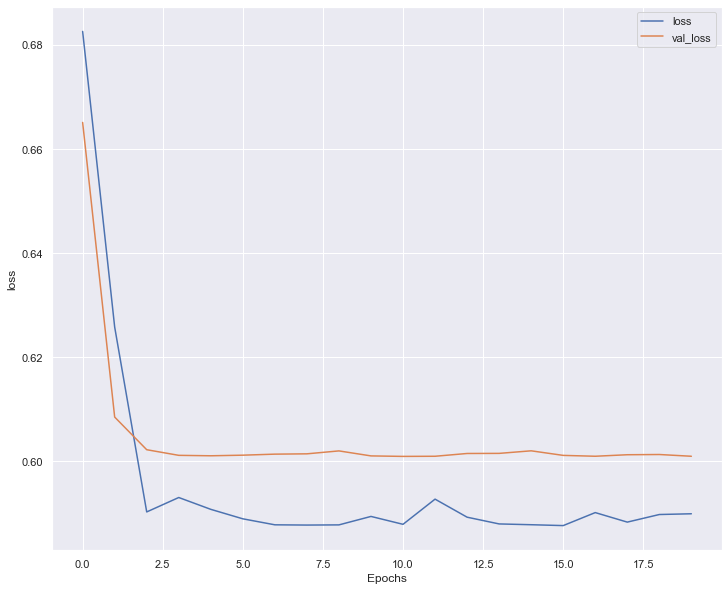

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_361"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5616 (Dense)          (None, 39)                1560      
                                                                 
 dense_5617 (Dense)          (None, 39)                1560      
                                                                 
 dense_5618 (Dense)          (None, 39)                1560      
                                                                 
 dense_5619 (Dense)          (None, 39)                1560      
                                                                 
 dense_5620 (Dense)          (None, 39)                1560      
                                                                 
 dense_5621 (Dense)          (None, 39)                1560      
                                                                 
 dense_5622 (Dense)          (None,

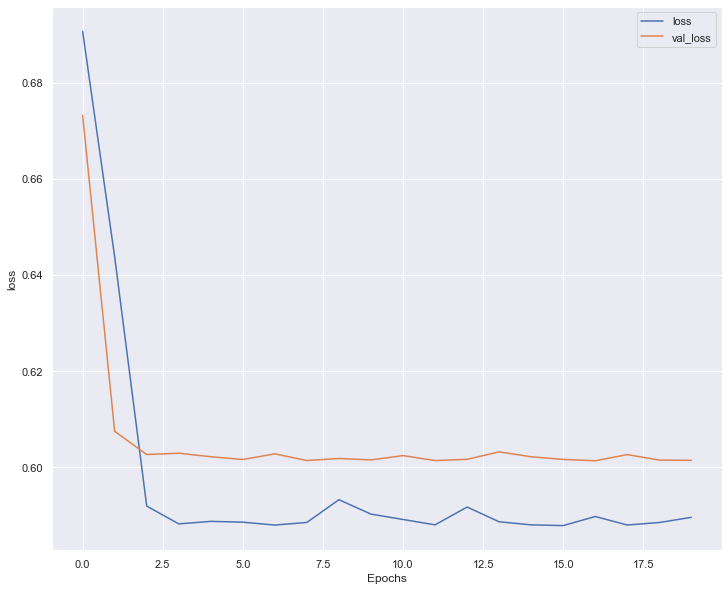

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_362"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5632 (Dense)          (None, 39)                1560      
                                                                 
 dense_5633 (Dense)          (None, 39)                1560      
                                                                 
 dense_5634 (Dense)          (None, 39)                1560      
                                                                 
 dense_5635 (Dense)          (None, 39)                1560      
                                                                 
 dense_5636 (Dense)          (None, 39)                1560      
                                                                 
 dense_5637 (Dense)          (None, 39)                1560      
                                                                 
 dense_5638 (Dense)          (None,

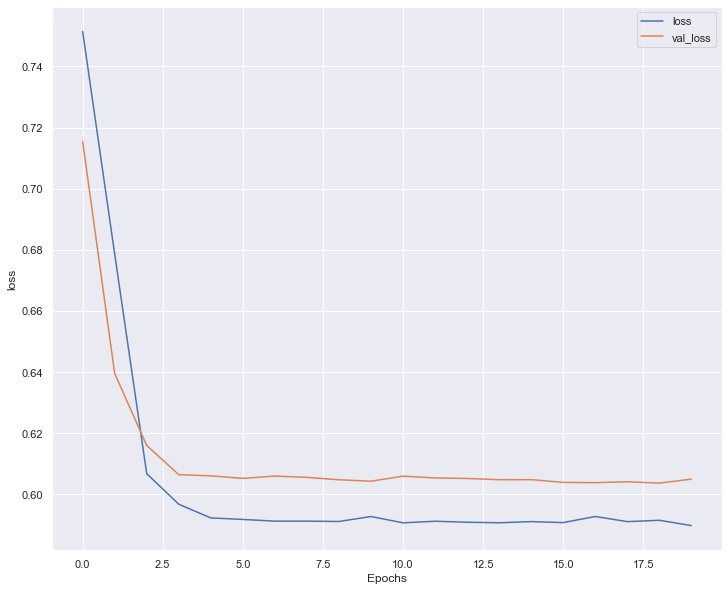

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_363"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5648 (Dense)          (None, 39)                1560      
                                                                 
 dense_5649 (Dense)          (None, 39)                1560      
                                                                 
 dense_5650 (Dense)          (None, 39)                1560      
                                                                 
 dense_5651 (Dense)          (None, 39)                1560      
                                                                 
 dense_5652 (Dense)          (None, 39)                1560      
                                                                 
 dense_5653 (Dense)          (None, 39)                1560      
                                                                 
 dense_5654 (Dense)          (None,

27/27 [==============================] - 0s 3ms/step - loss: 0.5889 - accuracy: 0.7260 - precision: 0.2639 - recall: 0.9630 - val_loss: 0.6009 - val_accuracy: 0.7115 - val_precision: 0.2964 - val_recall: 1.0000
Epoch 27/50
27/27 [==============================] - 0s 3ms/step - loss: 0.5876 - accuracy: 0.7260 - precision: 0.2639 - recall: 0.9630 - val_loss: 0.6022 - val_accuracy: 0.7115 - val_precision: 0.2964 - val_recall: 1.0000
Epoch 28/50
27/27 [==============================] - 0s 3ms/step - loss: 0.5876 - accuracy: 0.7260 - precision: 0.2639 - recall: 0.9630 - val_loss: 0.6024 - val_accuracy: 0.7115 - val_precision: 0.2964 - val_recall: 1.0000
Epoch 29/50
27/27 [==============================] - 0s 3ms/step - loss: 0.5882 - accuracy: 0.7260 - precision: 0.2639 - recall: 0.9630 - val_loss: 0.6018 - val_accuracy: 0.7115 - val_precision: 0.2964 - val_recall: 1.0000
Epoch 30/50
27/27 [==============================] - 0s 4ms/step - loss: 0.5877 - accuracy: 0.7260 - precision: 0.2639 -

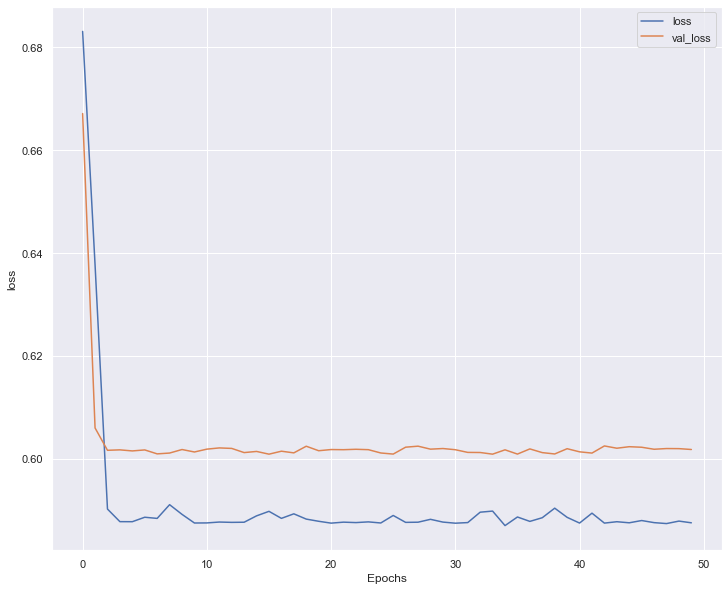

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_364"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5664 (Dense)          (None, 39)                1560      
                                                                 
 dense_5665 (Dense)          (None, 39)                1560      
                                                                 
 dense_5666 (Dense)          (None, 39)                1560      
                                                                 
 dense_5667 (Dense)          (None, 39)                1560      
                                                                 
 dense_5668 (Dense)          (None, 39)                1560      
                                                                 
 dense_5669 (Dense)          (None, 39)                1560      
                                                                 
 dense_5670 (Dense)          (None,

27/27 [==============================] - 0s 3ms/step - loss: 0.5881 - accuracy: 0.7260 - precision: 0.2639 - recall: 0.9630 - val_loss: 0.6031 - val_accuracy: 0.7115 - val_precision: 0.2964 - val_recall: 1.0000
Epoch 27/50
27/27 [==============================] - 0s 3ms/step - loss: 0.5880 - accuracy: 0.7260 - precision: 0.3006 - recall: 1.0000 - val_loss: 0.6019 - val_accuracy: 0.7115 - val_precision: 0.2964 - val_recall: 1.0000
Epoch 28/50
27/27 [==============================] - 0s 3ms/step - loss: 0.5894 - accuracy: 0.7260 - precision: 0.2639 - recall: 0.9630 - val_loss: 0.6014 - val_accuracy: 0.7115 - val_precision: 0.2964 - val_recall: 1.0000
Epoch 29/50
27/27 [==============================] - 0s 3ms/step - loss: 0.5880 - accuracy: 0.7260 - precision: 0.2639 - recall: 0.9630 - val_loss: 0.6027 - val_accuracy: 0.7115 - val_precision: 0.2964 - val_recall: 1.0000
Epoch 30/50
27/27 [==============================] - 0s 3ms/step - loss: 0.5880 - accuracy: 0.7260 - precision: 0.2639 -

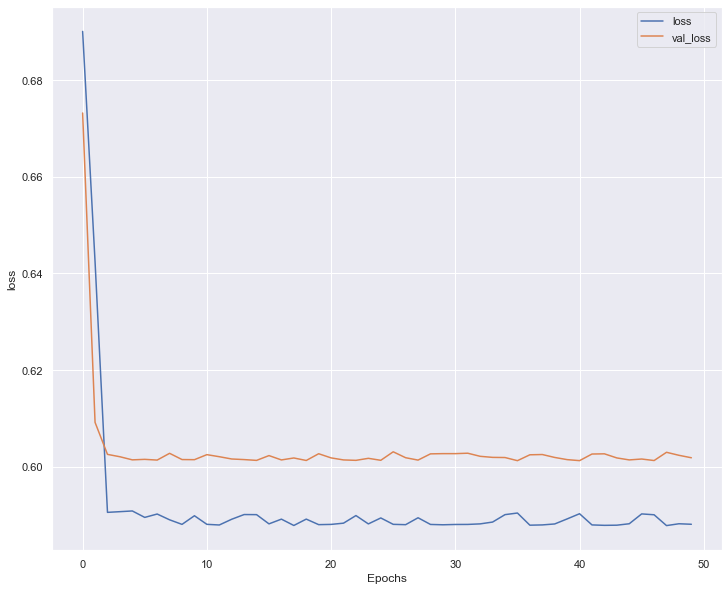

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_365"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5680 (Dense)          (None, 39)                1560      
                                                                 
 dense_5681 (Dense)          (None, 39)                1560      
                                                                 
 dense_5682 (Dense)          (None, 39)                1560      
                                                                 
 dense_5683 (Dense)          (None, 39)                1560      
                                                                 
 dense_5684 (Dense)          (None, 39)                1560      
                                                                 
 dense_5685 (Dense)          (None, 39)                1560      
                                                                 
 dense_5686 (Dense)          (None,

27/27 [==============================] - 0s 4ms/step - loss: 0.5900 - accuracy: 0.7260 - precision: 0.2639 - recall: 0.9630 - val_loss: 0.6045 - val_accuracy: 0.7115 - val_precision: 0.2964 - val_recall: 1.0000
Epoch 27/50
27/27 [==============================] - 0s 3ms/step - loss: 0.5898 - accuracy: 0.7260 - precision: 0.3006 - recall: 1.0000 - val_loss: 0.6038 - val_accuracy: 0.7115 - val_precision: 0.2964 - val_recall: 1.0000
Epoch 28/50
27/27 [==============================] - 0s 3ms/step - loss: 0.5910 - accuracy: 0.7260 - precision: 0.2639 - recall: 0.9630 - val_loss: 0.6032 - val_accuracy: 0.7115 - val_precision: 0.2964 - val_recall: 1.0000
Epoch 29/50
27/27 [==============================] - 0s 3ms/step - loss: 0.5896 - accuracy: 0.7260 - precision: 0.2639 - recall: 0.9630 - val_loss: 0.6044 - val_accuracy: 0.7115 - val_precision: 0.2964 - val_recall: 1.0000
Epoch 30/50
27/27 [==============================] - 0s 3ms/step - loss: 0.5901 - accuracy: 0.7260 - precision: 0.2639 -

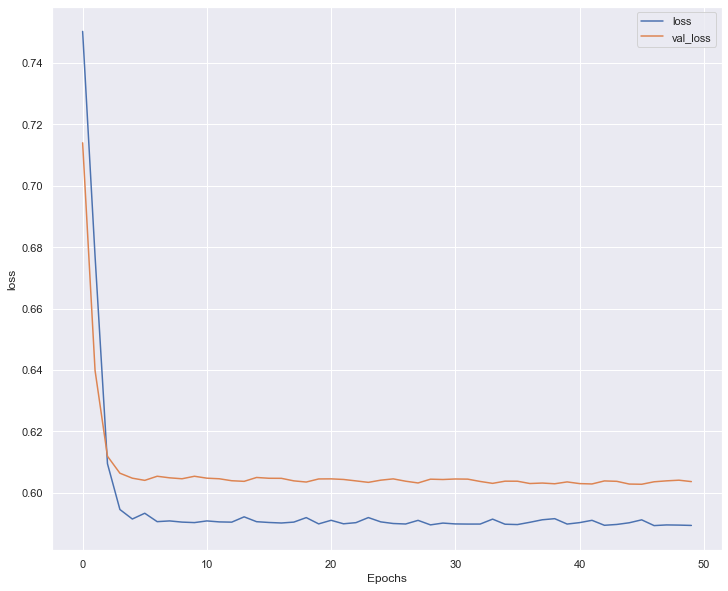

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_366"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5696 (Dense)          (None, 39)                1560      
                                                                 
 dense_5697 (Dense)          (None, 39)                1560      
                                                                 
 dense_5698 (Dense)          (None, 39)                1560      
                                                                 
 dense_5699 (Dense)          (None, 39)                1560      
                                                                 
 dense_5700 (Dense)          (None, 39)                1560      
                                                                 
 dense_5701 (Dense)          (None, 39)                1560      
                                                                 
 dense_5702 (Dense)          (None,

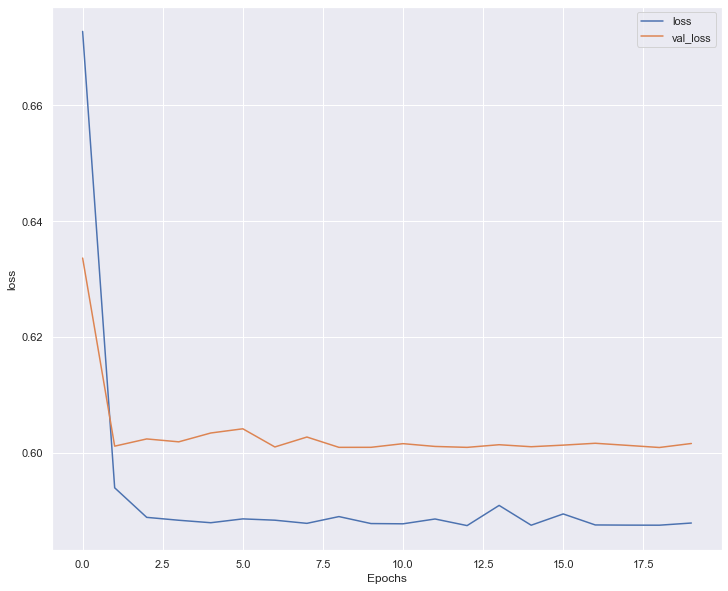

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_367"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5717 (Dense)          (None, 39)                1560      
                                                                 
 dense_5718 (Dense)          (None, 39)                1560      
                                                                 
 dense_5719 (Dense)          (None, 39)                1560      
                                                                 
 dense_5720 (Dense)          (None, 39)                1560      
                                                                 
 dense_5721 (Dense)          (None, 39)                1560      
                                                                 
 dense_5722 (Dense)          (None, 39)                1560      
                                                                 
 dense_5723 (Dense)          (None,

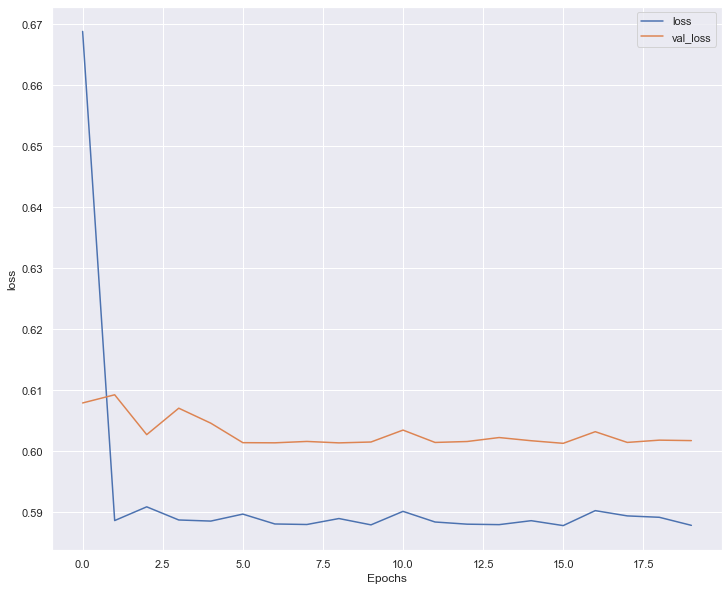

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_368"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5738 (Dense)          (None, 39)                1560      
                                                                 
 dense_5739 (Dense)          (None, 39)                1560      
                                                                 
 dense_5740 (Dense)          (None, 39)                1560      
                                                                 
 dense_5741 (Dense)          (None, 39)                1560      
                                                                 
 dense_5742 (Dense)          (None, 39)                1560      
                                                                 
 dense_5743 (Dense)          (None, 39)                1560      
                                                                 
 dense_5744 (Dense)          (None,

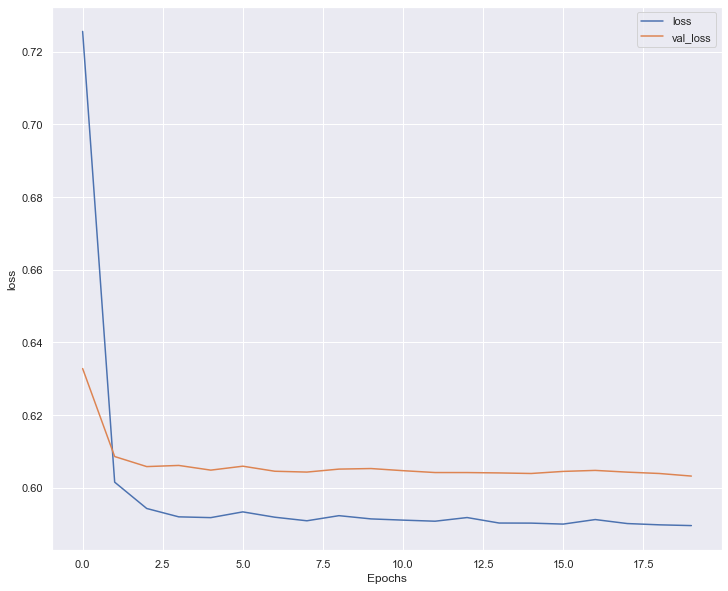

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_369"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5759 (Dense)          (None, 39)                1560      
                                                                 
 dense_5760 (Dense)          (None, 39)                1560      
                                                                 
 dense_5761 (Dense)          (None, 39)                1560      
                                                                 
 dense_5762 (Dense)          (None, 39)                1560      
                                                                 
 dense_5763 (Dense)          (None, 39)                1560      
                                                                 
 dense_5764 (Dense)          (None, 39)                1560      
                                                                 
 dense_5765 (Dense)          (None,

53/53 [==============================] - 0s 3ms/step - loss: 0.5880 - accuracy: 0.7260 - precision: 0.2689 - recall: 0.9811 - val_loss: 0.6018 - val_accuracy: 0.7115 - val_precision: 0.2918 - val_recall: 1.0000
Epoch 24/50
53/53 [==============================] - 0s 3ms/step - loss: 0.5881 - accuracy: 0.7260 - precision: 0.2689 - recall: 0.9811 - val_loss: 0.6031 - val_accuracy: 0.7115 - val_precision: 0.2918 - val_recall: 1.0000
Epoch 25/50
53/53 [==============================] - 0s 3ms/step - loss: 0.5880 - accuracy: 0.7260 - precision: 0.2689 - recall: 0.9811 - val_loss: 0.6025 - val_accuracy: 0.7115 - val_precision: 0.2918 - val_recall: 1.0000
Epoch 26/50
53/53 [==============================] - 0s 3ms/step - loss: 0.5883 - accuracy: 0.7260 - precision: 0.2689 - recall: 0.9811 - val_loss: 0.6012 - val_accuracy: 0.7115 - val_precision: 0.2918 - val_recall: 1.0000
Epoch 27/50
53/53 [==============================] - 0s 3ms/step - loss: 0.5882 - accuracy: 0.7260 - precision: 0.2689 -

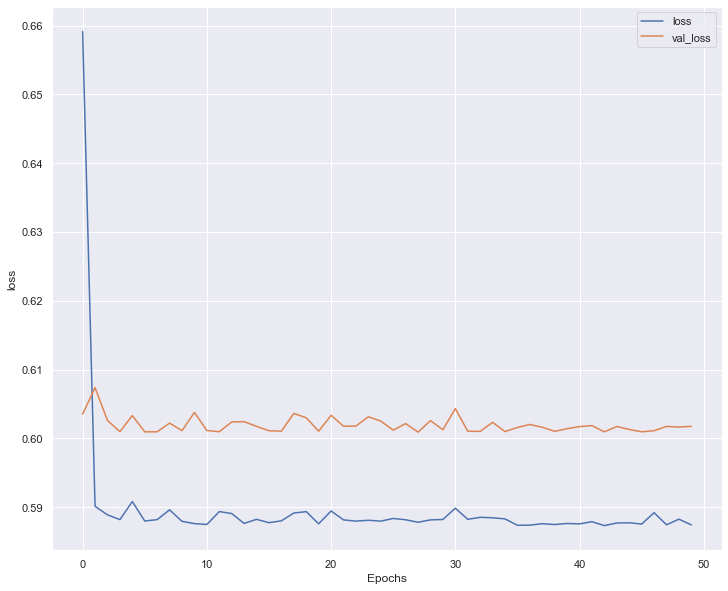

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_370"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5780 (Dense)          (None, 39)                1560      
                                                                 
 dense_5781 (Dense)          (None, 39)                1560      
                                                                 
 dense_5782 (Dense)          (None, 39)                1560      
                                                                 
 dense_5783 (Dense)          (None, 39)                1560      
                                                                 
 dense_5784 (Dense)          (None, 39)                1560      
                                                                 
 dense_5785 (Dense)          (None, 39)                1560      
                                                                 
 dense_5786 (Dense)          (None,

53/53 [==============================] - 0s 3ms/step - loss: 0.5879 - accuracy: 0.7260 - precision: 0.2874 - recall: 1.0000 - val_loss: 0.6026 - val_accuracy: 0.7115 - val_precision: 0.2918 - val_recall: 1.0000
Epoch 24/50
53/53 [==============================] - 0s 3ms/step - loss: 0.5878 - accuracy: 0.7260 - precision: 0.2689 - recall: 0.9811 - val_loss: 0.6015 - val_accuracy: 0.7115 - val_precision: 0.2918 - val_recall: 1.0000
Epoch 25/50
53/53 [==============================] - 0s 3ms/step - loss: 0.5886 - accuracy: 0.7260 - precision: 0.2689 - recall: 0.9811 - val_loss: 0.6018 - val_accuracy: 0.7115 - val_precision: 0.2918 - val_recall: 1.0000
Epoch 26/50
53/53 [==============================] - 0s 3ms/step - loss: 0.5881 - accuracy: 0.7260 - precision: 0.2689 - recall: 0.9811 - val_loss: 0.6019 - val_accuracy: 0.7115 - val_precision: 0.2918 - val_recall: 1.0000
Epoch 27/50
53/53 [==============================] - 0s 4ms/step - loss: 0.5880 - accuracy: 0.7260 - precision: 0.2689 -

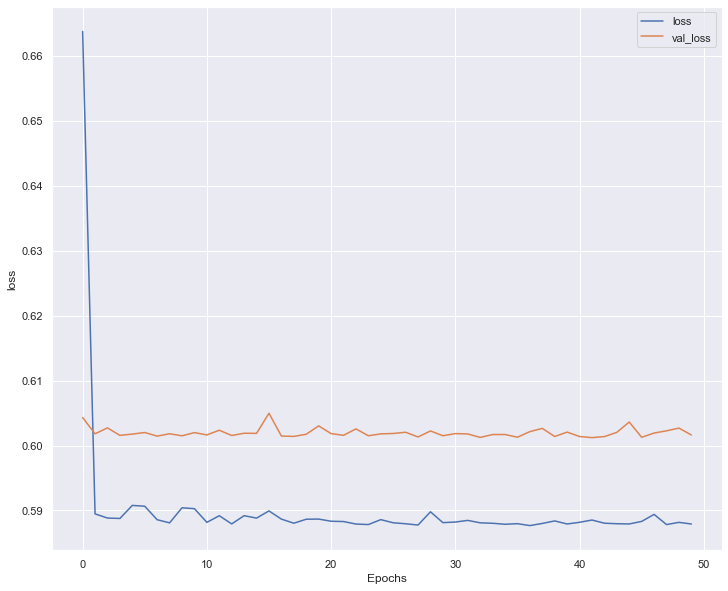

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_371"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5801 (Dense)          (None, 39)                1560      
                                                                 
 dense_5802 (Dense)          (None, 39)                1560      
                                                                 
 dense_5803 (Dense)          (None, 39)                1560      
                                                                 
 dense_5804 (Dense)          (None, 39)                1560      
                                                                 
 dense_5805 (Dense)          (None, 39)                1560      
                                                                 
 dense_5806 (Dense)          (None, 39)                1560      
                                                                 
 dense_5807 (Dense)          (None,

53/53 [==============================] - 0s 3ms/step - loss: 0.5899 - accuracy: 0.7260 - precision: 0.2874 - recall: 1.0000 - val_loss: 0.6031 - val_accuracy: 0.7115 - val_precision: 0.2918 - val_recall: 1.0000
Epoch 24/50
53/53 [==============================] - 0s 3ms/step - loss: 0.5897 - accuracy: 0.7260 - precision: 0.2689 - recall: 0.9811 - val_loss: 0.6033 - val_accuracy: 0.7115 - val_precision: 0.2918 - val_recall: 1.0000
Epoch 25/50
53/53 [==============================] - 0s 3ms/step - loss: 0.5893 - accuracy: 0.7260 - precision: 0.2689 - recall: 0.9811 - val_loss: 0.6032 - val_accuracy: 0.7115 - val_precision: 0.2918 - val_recall: 1.0000
Epoch 26/50
53/53 [==============================] - 0s 3ms/step - loss: 0.5892 - accuracy: 0.7260 - precision: 0.2689 - recall: 0.9811 - val_loss: 0.6031 - val_accuracy: 0.7115 - val_precision: 0.2918 - val_recall: 1.0000
Epoch 27/50
53/53 [==============================] - 0s 3ms/step - loss: 0.5894 - accuracy: 0.7260 - precision: 0.2689 -

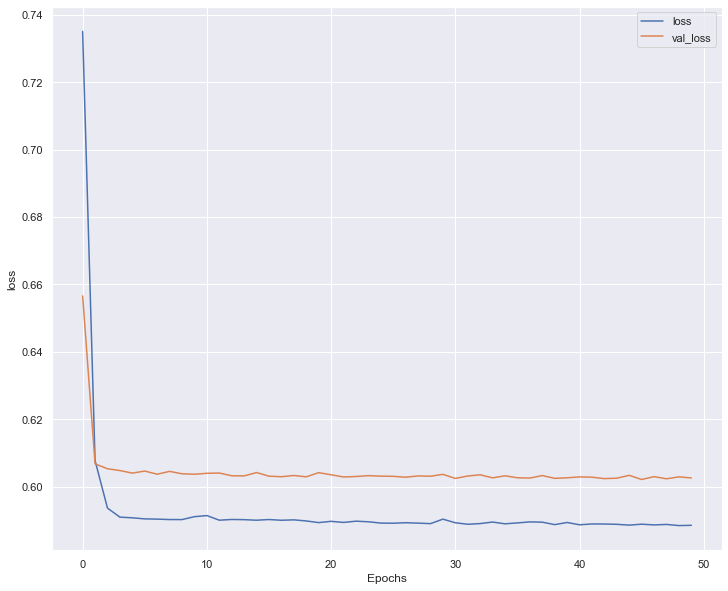

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_372"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5822 (Dense)          (None, 39)                1560      
                                                                 
 dense_5823 (Dense)          (None, 39)                1560      
                                                                 
 dense_5824 (Dense)          (None, 39)                1560      
                                                                 
 dense_5825 (Dense)          (None, 39)                1560      
                                                                 
 dense_5826 (Dense)          (None, 39)                1560      
                                                                 
 dense_5827 (Dense)          (None, 39)                1560      
                                                                 
 dense_5828 (Dense)          (None,

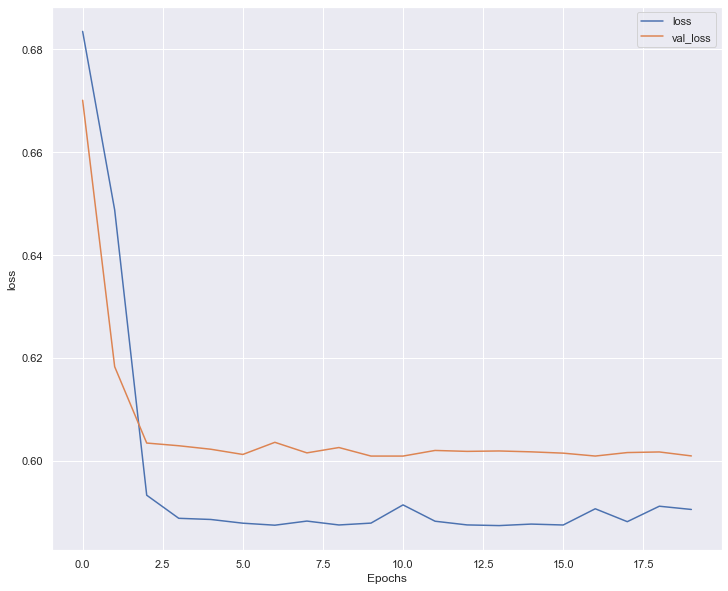

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_373"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5843 (Dense)          (None, 39)                1560      
                                                                 
 dense_5844 (Dense)          (None, 39)                1560      
                                                                 
 dense_5845 (Dense)          (None, 39)                1560      
                                                                 
 dense_5846 (Dense)          (None, 39)                1560      
                                                                 
 dense_5847 (Dense)          (None, 39)                1560      
                                                                 
 dense_5848 (Dense)          (None, 39)                1560      
                                                                 
 dense_5849 (Dense)          (None,

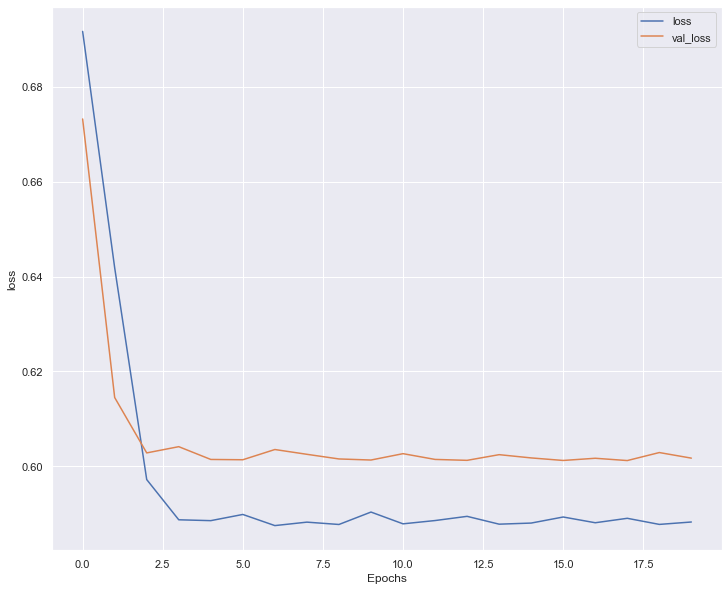

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_374"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5864 (Dense)          (None, 39)                1560      
                                                                 
 dense_5865 (Dense)          (None, 39)                1560      
                                                                 
 dense_5866 (Dense)          (None, 39)                1560      
                                                                 
 dense_5867 (Dense)          (None, 39)                1560      
                                                                 
 dense_5868 (Dense)          (None, 39)                1560      
                                                                 
 dense_5869 (Dense)          (None, 39)                1560      
                                                                 
 dense_5870 (Dense)          (None,

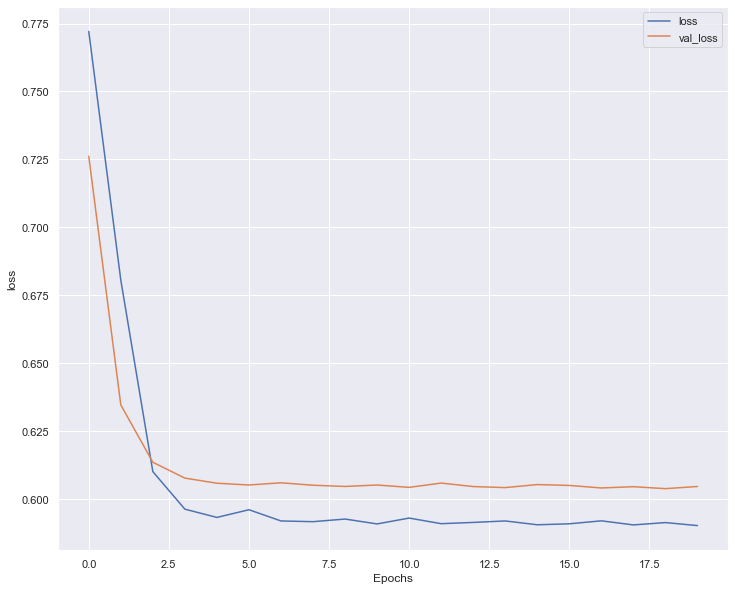

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_375"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5885 (Dense)          (None, 39)                1560      
                                                                 
 dense_5886 (Dense)          (None, 39)                1560      
                                                                 
 dense_5887 (Dense)          (None, 39)                1560      
                                                                 
 dense_5888 (Dense)          (None, 39)                1560      
                                                                 
 dense_5889 (Dense)          (None, 39)                1560      
                                                                 
 dense_5890 (Dense)          (None, 39)                1560      
                                                                 
 dense_5891 (Dense)          (None,

27/27 [==============================] - 0s 4ms/step - loss: 0.5880 - accuracy: 0.7260 - precision: 0.3006 - recall: 1.0000 - val_loss: 0.6013 - val_accuracy: 0.7115 - val_precision: 0.2964 - val_recall: 1.0000
Epoch 24/50
27/27 [==============================] - 0s 4ms/step - loss: 0.5887 - accuracy: 0.7260 - precision: 0.2639 - recall: 0.9630 - val_loss: 0.6009 - val_accuracy: 0.7115 - val_precision: 0.2964 - val_recall: 1.0000
Epoch 25/50
27/27 [==============================] - 0s 4ms/step - loss: 0.5872 - accuracy: 0.7260 - precision: 0.3006 - recall: 1.0000 - val_loss: 0.6014 - val_accuracy: 0.7115 - val_precision: 0.2964 - val_recall: 1.0000
Epoch 26/50
27/27 [==============================] - 0s 4ms/step - loss: 0.5875 - accuracy: 0.7260 - precision: 0.2639 - recall: 0.9630 - val_loss: 0.6009 - val_accuracy: 0.7115 - val_precision: 0.2964 - val_recall: 1.0000
Epoch 27/50
27/27 [==============================] - 0s 4ms/step - loss: 0.5875 - accuracy: 0.7260 - precision: 0.2639 -

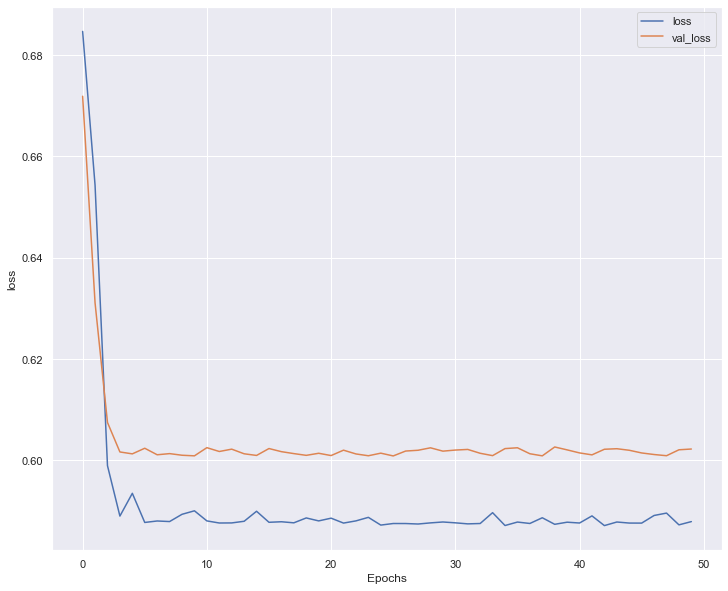

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_376"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5906 (Dense)          (None, 39)                1560      
                                                                 
 dense_5907 (Dense)          (None, 39)                1560      
                                                                 
 dense_5908 (Dense)          (None, 39)                1560      
                                                                 
 dense_5909 (Dense)          (None, 39)                1560      
                                                                 
 dense_5910 (Dense)          (None, 39)                1560      
                                                                 
 dense_5911 (Dense)          (None, 39)                1560      
                                                                 
 dense_5912 (Dense)          (None,

27/27 [==============================] - 0s 4ms/step - loss: 0.5881 - accuracy: 0.7260 - precision: 0.2639 - recall: 0.9630 - val_loss: 0.6019 - val_accuracy: 0.7115 - val_precision: 0.2964 - val_recall: 1.0000
Epoch 24/50
27/27 [==============================] - 0s 4ms/step - loss: 0.5880 - accuracy: 0.7260 - precision: 0.3006 - recall: 1.0000 - val_loss: 0.6013 - val_accuracy: 0.7115 - val_precision: 0.2964 - val_recall: 1.0000
Epoch 25/50
27/27 [==============================] - 0s 4ms/step - loss: 0.5909 - accuracy: 0.7260 - precision: 0.2639 - recall: 0.9630 - val_loss: 0.6014 - val_accuracy: 0.7115 - val_precision: 0.2964 - val_recall: 1.0000
Epoch 26/50
27/27 [==============================] - 0s 4ms/step - loss: 0.5875 - accuracy: 0.7260 - precision: 0.2639 - recall: 0.9630 - val_loss: 0.6032 - val_accuracy: 0.7115 - val_precision: 0.2964 - val_recall: 1.0000
Epoch 27/50
27/27 [==============================] - 0s 4ms/step - loss: 0.5885 - accuracy: 0.7260 - precision: 0.3006 -

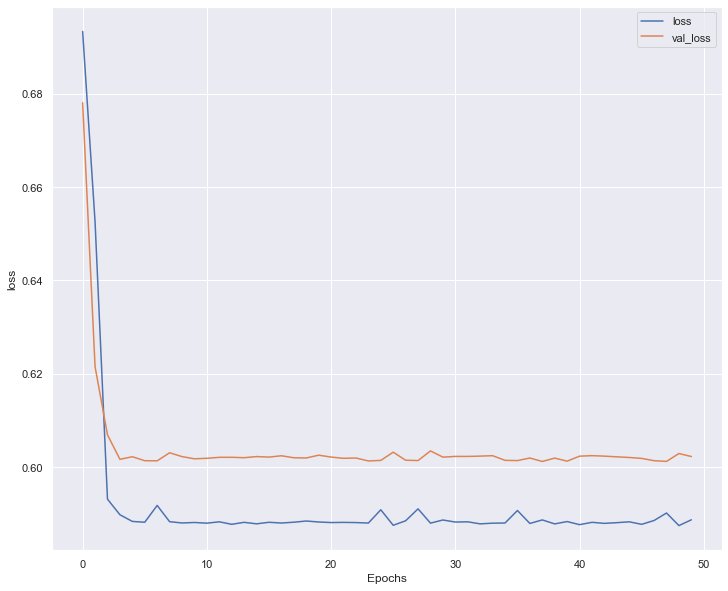

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_377"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5927 (Dense)          (None, 39)                1560      
                                                                 
 dense_5928 (Dense)          (None, 39)                1560      
                                                                 
 dense_5929 (Dense)          (None, 39)                1560      
                                                                 
 dense_5930 (Dense)          (None, 39)                1560      
                                                                 
 dense_5931 (Dense)          (None, 39)                1560      
                                                                 
 dense_5932 (Dense)          (None, 39)                1560      
                                                                 
 dense_5933 (Dense)          (None,

27/27 [==============================] - 0s 4ms/step - loss: 0.5907 - accuracy: 0.7260 - precision: 0.2639 - recall: 0.9630 - val_loss: 0.6049 - val_accuracy: 0.7115 - val_precision: 0.2964 - val_recall: 1.0000
Epoch 24/50
27/27 [==============================] - 0s 4ms/step - loss: 0.5904 - accuracy: 0.7260 - precision: 0.2639 - recall: 0.9630 - val_loss: 0.6051 - val_accuracy: 0.7115 - val_precision: 0.2964 - val_recall: 1.0000
Epoch 25/50
27/27 [==============================] - 0s 4ms/step - loss: 0.5906 - accuracy: 0.7260 - precision: 0.2639 - recall: 0.9630 - val_loss: 0.6056 - val_accuracy: 0.7115 - val_precision: 0.2964 - val_recall: 1.0000
Epoch 26/50
27/27 [==============================] - 0s 4ms/step - loss: 0.5906 - accuracy: 0.7260 - precision: 0.2639 - recall: 0.9630 - val_loss: 0.6047 - val_accuracy: 0.7115 - val_precision: 0.2964 - val_recall: 1.0000
Epoch 27/50
27/27 [==============================] - 0s 4ms/step - loss: 0.5905 - accuracy: 0.7260 - precision: 0.2639 -

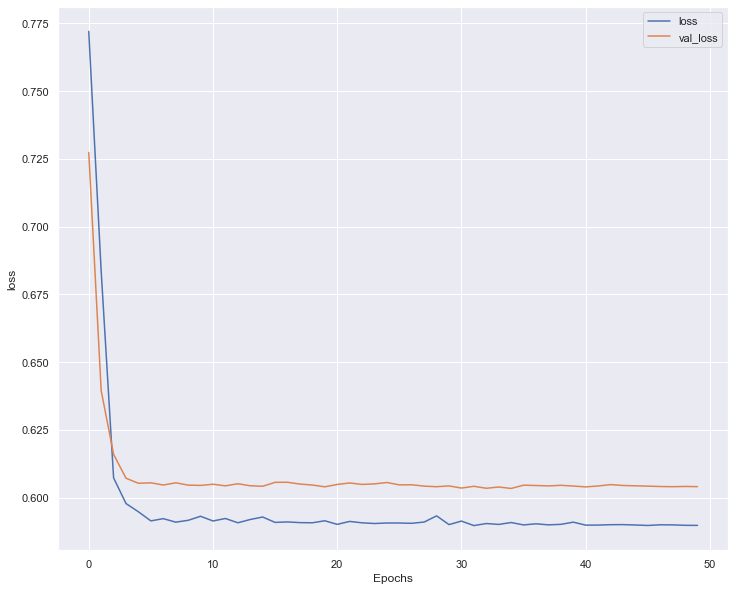

45/45 [==============================] - 0s 1ms/step


In [120]:
param_grid = dict(dense_layers = dense_layers
                    , batch_size = batch_size
                    , epochs = epochs
                   , l1_lambda = l1_lambda
                 )


keys = param_grid.keys()
values = (param_grid[key] for key in keys)
param_grid = [dict(zip(keys, param_grid)) for param_grid in itertools.product(*values)]

print('Proposed ' + str(len(param_grid)) + ' models')

for j in range(0, len(param_grid)):
    
    dense_layers = param_grid[j].get("dense_layers")
    batch_size = param_grid[j].get("batch_size")
    epochs = param_grid[j].get("epochs")
    l1_lambda = param_grid[j].get("l1_lambda")
    
    model = make_model_Lineal_L1(dense_layers = dense_layers
                              , l1_lambda = l1_lambda
                              , verbose = 1)
    print('batch_size :' + str(batch_size))
    
    history = model.fit(train_features,
                        train_labels,
                        batch_size = batch_size,
                        epochs = epochs,
                        validation_data = (val_features, val_labels),
                        verbose = 1)
    
    plot_history_train(history, 'loss')
    
    # Calculate validation metrics
    y_val_pred = model.predict(val_features)
    y_val_pred = np.argmax(y_val_pred, axis=1)
    val_conf_mat = confusion_matrix(val_labels, y_val_pred)
    tn, fp, fn, tp = val_conf_mat.ravel()
    val_sensitivity = tp / (tp + fn)
    val_specificity = tn / (tn + fp)
    val_f1_score = f1_score(val_labels, y_val_pred, average='macro')
    
    # Update results
    val_loss = pd.DataFrame.from_dict(history.history)['val_loss'].iloc[-1]
    val_accuracy = pd.DataFrame.from_dict(history.history)['val_accuracy'].iloc[-1]
    loss = pd.DataFrame.from_dict(history.history)['loss'].iloc[-1]
    accuracy = pd.DataFrame.from_dict(history.history)['accuracy'].iloc[-1]
    param_grid[j].update({"loss": loss})
    param_grid[j].update({"accuracy": accuracy})
    param_grid[j].update({"val_loss": val_loss})
    param_grid[j].update({"val_accuracy": val_accuracy})
    param_grid[j].update({"val_sensitivity": val_sensitivity})
    param_grid[j].update({"val_specificity": val_specificity})
    param_grid[j].update({"val_f1_score": val_f1_score})

results_Lineal_L1 = pd.DataFrame(param_grid)

In [121]:
results_Lineal_L1.sort_values(['val_loss'],ascending = True)

,dense_layers,batch_size,epochs,l1_lambda,loss,accuracy,val_loss,val_accuracy,val_sensitivity,val_specificity,val_f1_score
3,10,64,50,0.000001,0.323026,0.840192,0.324147,0.843838,0.657767,0.919291,0.800925
0,10,64,20,0.000001,0.333151,0.835987,0.338481,0.850140,0.669903,0.923228,0.809117
9,10,128,50,0.000001,0.337461,0.830580,0.345927,0.838936,0.672330,0.906496,0.797814
6,10,128,20,0.000001,0.363317,0.831781,0.370862,0.838936,0.592233,0.938976,0.786044
30,20,128,20,0.000001,0.590496,0.726044,0.600914,0.711485,0.000000,1.000000,0.415712
18,15,128,20,0.000001,0.589927,0.726044,0.600976,0.711485,0.000000,1.000000,0.415712
12,15,64,20,0.000001,0.587954,0.726044,0.601113,0.711485,0.000000,1.000000,0.415712
15,15,64,50,0.000001,0.588516,0.726044,0.601268,0.711485,0.000000,1.000000,0.415712
19,15,128,20,0.000010,0.589600,0.726044,0.601451,0.711485,0.000000,1.000000,0.415712
24,20,64,20,0.000001,0.587835,0.726044,0.601575,0.711485,0.000000,1.000000,0.415712


Gracias a la tabla anterior se puede extraer la información que los mejores hiper parámetros del grid search de la <b>arquitectura lineal con Regularización de Lasso</b> se han conseguido en la <i>3º</i> red neuronal:
* Dense Layers: 10

* Batch Size:64

* Epochs: 50

* L1 λ: 0.001

obteniendo unas métricas bastante favorables en test:

* Loss: 0.324147
				
* Accuracy: 0.843838
				
* Sensitivity: 0.657767

* Specificity: 0.919291

* F1-score: 0.800925

<b>Comparación de los score obtenidos del modelo lineal sin y con Regularización de Lasso</b>

<table>
    
  <tr>
    <th>Modelo</th>
    <th>Loss</th>
    <th>Accuracy</th>
    <th>Sensibilidad</th>
    <th>Especificidad</th>
    <th>F1-Score</th>
  </tr>

  <tr>
    <td>Modelo lineal</td>
    <td>0.3134</td>
    <td>0.8487</td>
    <td>0.7237</td>
    <td>0.8941</td>
    <td>0.8073</td>
  </tr>

  <tr>
    <td>Modelo Lineal con L1</td>
    <td>0.3242</td>
    <td>0.8438</td>
    <td>0.6578</td>
    <td>0.9193</td>
    <td>0.8009</td>
  </tr>
</table>


Los resultados de la comparativa de modelos, que se observa en la tabla anterior, son sonprendes. Cabría esperar que los valores resultantes de la red con Regularización fuesen un poco inferiores, porque eso significaria que el modelo sin regularización estaría sobreajustando (lo que es previsible). Por ejemplo, si se calcula la diferencia de Sensibilidad y Especificidad se obtienen 0.0659 y -0.0252, respectivamente. Estos valores son muy similares como poder rechazar uno de inmediato

Dichas simulitudes se pueden deber a la falta de datos, ya que el Train únicamente tiene 3229 registros. Además en la nota que se ha adjuntado en la sección anterior a la compilación del modelo se indica que se han probado distintos valores de λ y todos estos muy cercanos a 0. Lo que indica que la regularización L1 es bastante débil, lo que significa que el modelo no está demasiado penalizado por las características no importantes. Otra peculariedad de este ajuste de hiper parámetro es que si se aumenta el número un decimal más a lo elegido, la sensibilidad y especificidad toman valores extremos 0 y 1, respectivamente, por lo que el modelo estaría clasificando de forma errónea y su uso no seria válido. 

Por tanto, el uso de un valor de tan bajo no justifica el uso de una red neuronal con regularización de Lasso, por ese motivo, el modelo referente y el que se va a comparar con dos ajustes de hiper parámetros más es el <b>arquitectura lineal</b>.

<b>2 - CAMBIO DE LA ACTIVACIÓN DE LA ÚLTIMA CAPA A SIGMOIDE</b>

En el segundo apartado del cambio de hiper parámetros se va a jugar con la activación de la última capa densa, la cual es la encargada de generar las predicciones del modelo. La importancia de esta capa radica en que su salida determina la calidad de las predicciones del modelo.

En el modelo inicial, make_model_Lineal, se ha utilizado una activación <i>Softmax</i>. Esta se utiliza para transformar las salidas de la última capa de la red neuronal en un vector de probabilidades, de tal manera que la suma de todas las probabilidades sea igual a 1. La función softmax opera en el rango [-inf, +inf], pero transforma las salidas de la última capa en un rango [0, 1]. Cada salida de la capa se convierte en una probabilidad mediante una exponenciación y una normalización por la suma de todas las exponenciaciones.

A continuación se procese a cambiar de activación <i>Softmax</i> a <b>Sigmoide</b>. Esta última se utiliza comúnmente para producir una salida en el rango [0,1], que se puede interpretar como la probabilidad de que una muestra pertenezca a la clase positiva en un problema de clasificación binaria. En este caso, se puede considerar que la salida de la función sigmoide es la probabilidad de que la entrada sea positiva.

La función sigmoide se define matemáticamente como:

<center>f(x) = 1 / (1 + exp(-x))<br>
Donde x es la entrada de la función y exp es la función exponencial.</center>

En un problema de clasificación binaria (que es el caso presente), la capa de salida con función de activación <b>Sigmoide</b> es comúnmente utilizada para producir una salida binaria (0 o 1) en función de un umbral de decisión. Por ejemplo, si la salida de la función sigmoide es mayor que 0.5, se puede considerar que la muestra pertenece a la clase positiva, mientras que si es menor o igual que 0.5, se puede considerar que la muestra pertenece a la clase negativa.

Para poder aplicar la activación <b>Sigmoide</b> es necesario cambiar la arquitectura de <i>make_model_Lineal</i>. Donde ahora la última capa tendrá únicamente un neurona, ya que esta activivación genera la probabilidad de que un registro pertenezca a la clase 1, Victoria del equipo Azul. Además hay que cambiar la función de pérdida de <i>sparse_categorical_crossentropy</i> a <i>binary_crossentropy</i> debido a que se trata de una clasificación binaria mediante la categoriazación de la variable objetivo a one-hot.

Ahora la arquitectura pasa a denominarse <b>make_model_Lineal_Sigmoide.</b>

In [104]:
def make_model_Lineal_Sigmoide(dense_layers = 12
               , dense_dropout = 0.0
               ,epochs=4
               , verbose = True):
    
    # create model
    model = Sequential()
    # Hidden Layers
    #____________________________________________________________________________
    for i in range(0,dense_layers):
            model.add(Dense(units = input_len
                        , input_dim = input_len
                        , kernel_initializer='normal'
                        , activation='relu'))

    #model.add(Dropout(dense_dropout))
        
    # Cost function Layer
    #____________________________________________________________________________
    model.add(Dense(1, activation='sigmoid', kernel_initializer='normal'))
    
    # Compile model
    optimizer = keras.optimizers.Adam(lr=1e-3)
    model.compile(optimizer = optimizer,
                  loss='binary_crossentropy' 
                  ,metrics = ['accuracy',precision, recall])
    if verbose:
        print('dense_layers :' + str(dense_layers))
        print(model.summary())
        
    return model

model = make_model_Lineal_Sigmoide()

dense_layers :12
Model: "sequential_243"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3799 (Dense)          (None, 39)                1560      
                                                                 
 dense_3800 (Dense)          (None, 39)                1560      
                                                                 
 dense_3801 (Dense)          (None, 39)                1560      
                                                                 
 dense_3802 (Dense)          (None, 39)                1560      
                                                                 
 dense_3803 (Dense)          (None, 39)                1560      
                                                                 
 dense_3804 (Dense)          (None, 39)                1560      
                                                                 
 dense_3805 (Dense)          (None,

Se realiza de nuevo un grid search con la arquitectura Lineal pero ahora con la activación de la última capa densa Sigmoidal. Los hiper parámetros <i>batch size</i>, <i>epochs</i>, <i>dense dropout</i> y <i>dense layers</i> tendrán los mismos valores que en el apartado 5, para así hacer la comparativa justa.

In [105]:
batch_size = [64, 128]
epochs = [20,50]
dense_layers = [10, 15, 20]
dense_dropout = [0.0, 0.3]

Proposed 24 models
dense_layers :10
Model: "sequential_244"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3812 (Dense)          (None, 39)                1560      
                                                                 
 dense_3813 (Dense)          (None, 39)                1560      
                                                                 
 dense_3814 (Dense)          (None, 39)                1560      
                                                                 
 dense_3815 (Dense)          (None, 39)                1560      
                                                                 
 dense_3816 (Dense)          (None, 39)                1560      
                                                                 
 dense_3817 (Dense)          (None, 39)                1560      
                                                                 
 dense_3818 (Den

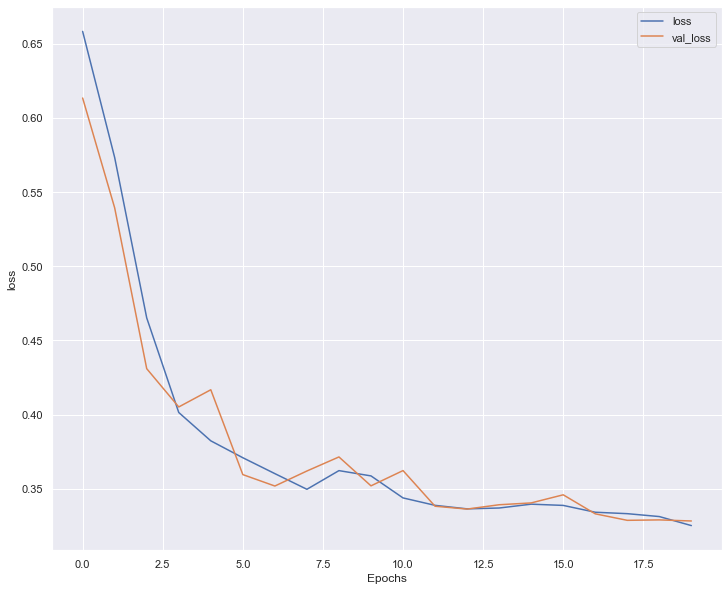

45/45 [==============================] - 0s 2ms/step


dense_layers :10
Model: "sequential_245"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3823 (Dense)          (None, 39)                1560      
                                                                 
 dense_3824 (Dense)          (None, 39)                1560      
                                                                 
 dense_3825 (Dense)          (None, 39)                1560      
                                                                 
 dense_3826 (Dense)          (None, 39)                1560      
                                                                 
 dense_3827 (Dense)          (None, 39)                1560      
                                                                 
 dense_3828 (Dense)          (None, 39)                1560      
                                                                 
 dense_3829 (Dense)          (None,

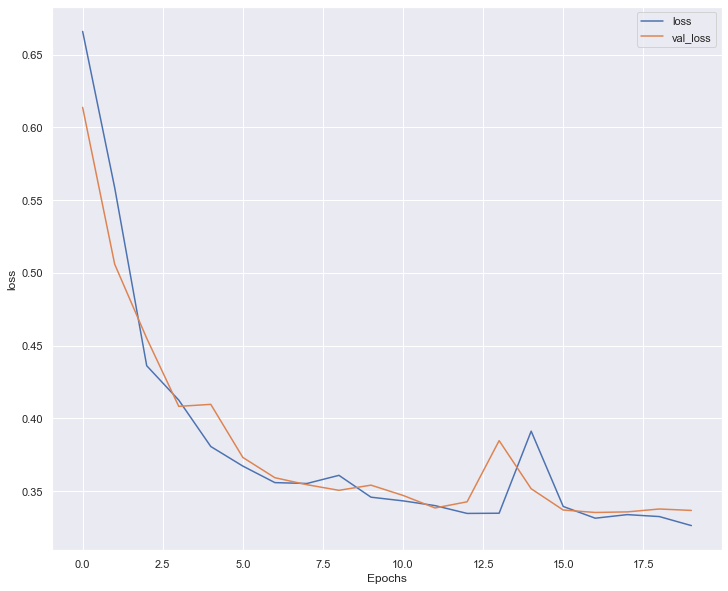

45/45 [==============================] - 0s 2ms/step


dense_layers :10
Model: "sequential_246"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3834 (Dense)          (None, 39)                1560      
                                                                 
 dense_3835 (Dense)          (None, 39)                1560      
                                                                 
 dense_3836 (Dense)          (None, 39)                1560      
                                                                 
 dense_3837 (Dense)          (None, 39)                1560      
                                                                 
 dense_3838 (Dense)          (None, 39)                1560      
                                                                 
 dense_3839 (Dense)          (None, 39)                1560      
                                                                 
 dense_3840 (Dense)          (None,

Epoch 29/50
53/53 [==============================] - 0s 4ms/step - loss: 0.3284 - accuracy: 0.8342 - precision: 0.7158 - recall: 0.6248 - val_loss: 0.3445 - val_accuracy: 0.8424 - val_precision: 0.8007 - val_recall: 0.6237
Epoch 30/50
53/53 [==============================] - 0s 4ms/step - loss: 0.3274 - accuracy: 0.8348 - precision: 0.7064 - recall: 0.6572 - val_loss: 0.3402 - val_accuracy: 0.8382 - val_precision: 0.8206 - val_recall: 0.5792
Epoch 31/50
53/53 [==============================] - 0s 4ms/step - loss: 0.3297 - accuracy: 0.8351 - precision: 0.7232 - recall: 0.6503 - val_loss: 0.3410 - val_accuracy: 0.8305 - val_precision: 0.8138 - val_recall: 0.5516
Epoch 32/50
53/53 [==============================] - 0s 4ms/step - loss: 0.3367 - accuracy: 0.8315 - precision: 0.7283 - recall: 0.6371 - val_loss: 0.3255 - val_accuracy: 0.8431 - val_precision: 0.7536 - val_recall: 0.7075
Epoch 33/50
53/53 [==============================] - 0s 3ms/step - loss: 0.3253 - accuracy: 0.8411 - precisi

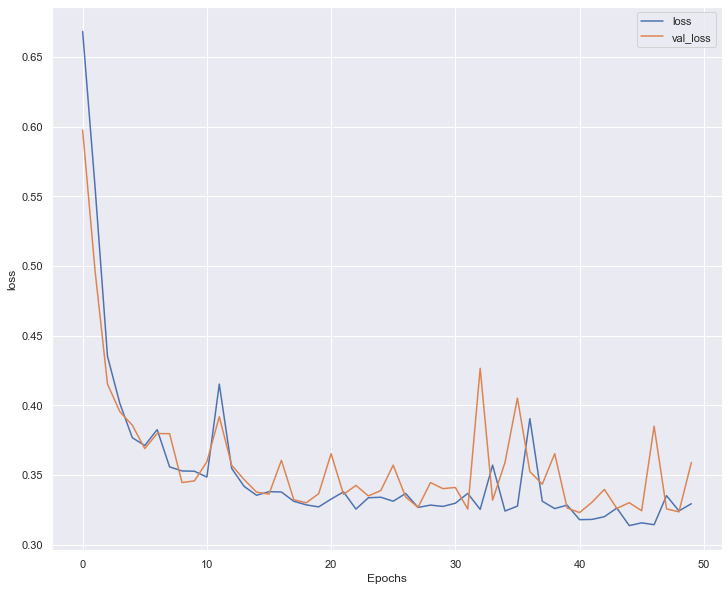

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_247"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3845 (Dense)          (None, 39)                1560      
                                                                 
 dense_3846 (Dense)          (None, 39)                1560      
                                                                 
 dense_3847 (Dense)          (None, 39)                1560      
                                                                 
 dense_3848 (Dense)          (None, 39)                1560      
                                                                 
 dense_3849 (Dense)          (None, 39)                1560      
                                                                 
 dense_3850 (Dense)          (None, 39)                1560      
                                                                 
 dense_3851 (Dense)          (None,

53/53 [==============================] - 0s 3ms/step - loss: 0.3307 - accuracy: 0.8342 - precision: 0.6974 - recall: 0.6783 - val_loss: 0.3274 - val_accuracy: 0.8424 - val_precision: 0.7777 - val_recall: 0.6592
Epoch 30/50
53/53 [==============================] - 0s 3ms/step - loss: 0.3304 - accuracy: 0.8375 - precision: 0.7223 - recall: 0.6623 - val_loss: 0.3243 - val_accuracy: 0.8396 - val_precision: 0.7524 - val_recall: 0.6949
Epoch 31/50
53/53 [==============================] - 0s 3ms/step - loss: 0.3219 - accuracy: 0.8399 - precision: 0.7186 - recall: 0.6496 - val_loss: 0.3342 - val_accuracy: 0.8438 - val_precision: 0.7838 - val_recall: 0.6536
Epoch 32/50
53/53 [==============================] - 0s 3ms/step - loss: 0.3257 - accuracy: 0.8369 - precision: 0.7242 - recall: 0.6731 - val_loss: 0.3258 - val_accuracy: 0.8375 - val_precision: 0.7415 - val_recall: 0.7082
Epoch 33/50
53/53 [==============================] - 0s 3ms/step - loss: 0.3383 - accuracy: 0.8294 - precision: 0.6715 -

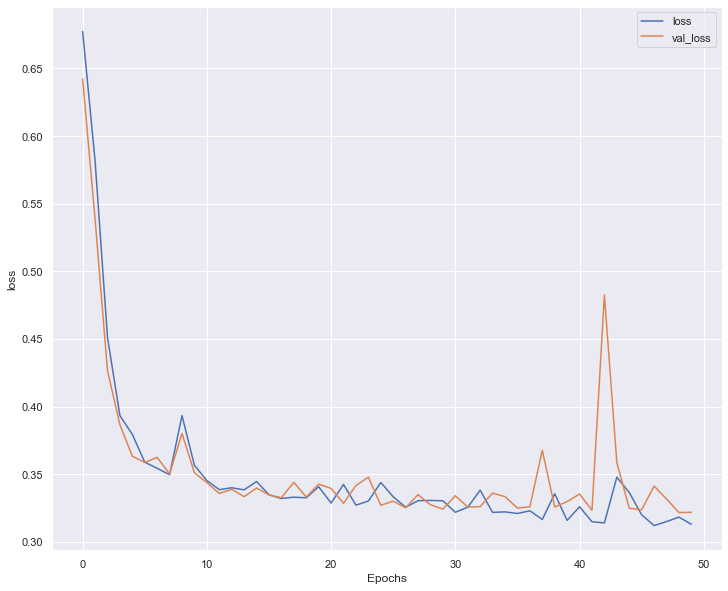

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_248"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3856 (Dense)          (None, 39)                1560      
                                                                 
 dense_3857 (Dense)          (None, 39)                1560      
                                                                 
 dense_3858 (Dense)          (None, 39)                1560      
                                                                 
 dense_3859 (Dense)          (None, 39)                1560      
                                                                 
 dense_3860 (Dense)          (None, 39)                1560      
                                                                 
 dense_3861 (Dense)          (None, 39)                1560      
                                                                 
 dense_3862 (Dense)          (None,

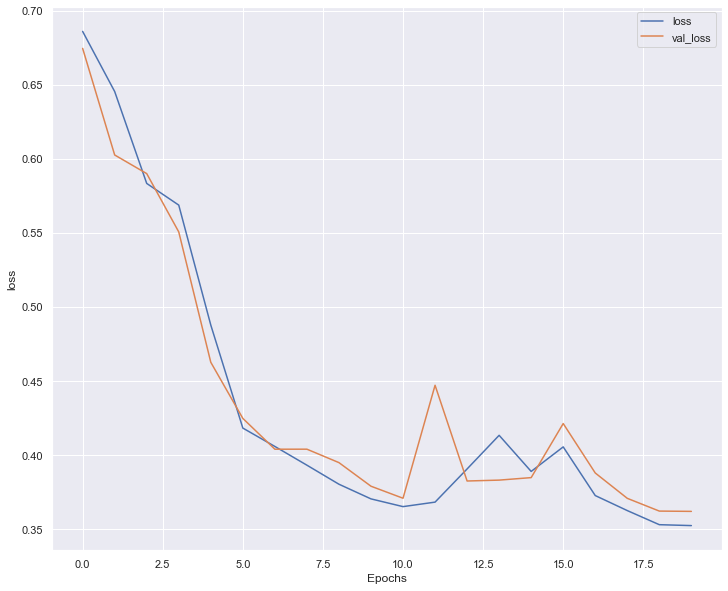

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_249"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3867 (Dense)          (None, 39)                1560      
                                                                 
 dense_3868 (Dense)          (None, 39)                1560      
                                                                 
 dense_3869 (Dense)          (None, 39)                1560      
                                                                 
 dense_3870 (Dense)          (None, 39)                1560      
                                                                 
 dense_3871 (Dense)          (None, 39)                1560      
                                                                 
 dense_3872 (Dense)          (None, 39)                1560      
                                                                 
 dense_3873 (Dense)          (None,

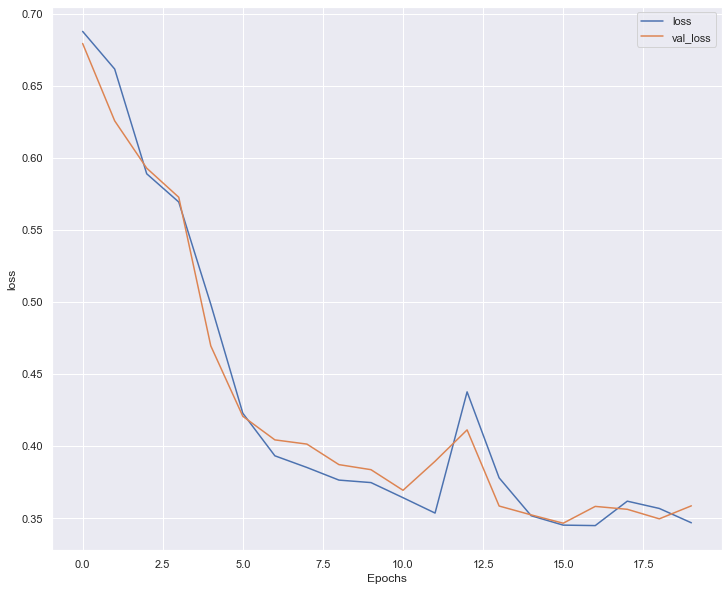

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_250"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3878 (Dense)          (None, 39)                1560      
                                                                 
 dense_3879 (Dense)          (None, 39)                1560      
                                                                 
 dense_3880 (Dense)          (None, 39)                1560      
                                                                 
 dense_3881 (Dense)          (None, 39)                1560      
                                                                 
 dense_3882 (Dense)          (None, 39)                1560      
                                                                 
 dense_3883 (Dense)          (None, 39)                1560      
                                                                 
 dense_3884 (Dense)          (None,

Epoch 29/50
27/27 [==============================] - 0s 3ms/step - loss: 0.3313 - accuracy: 0.8363 - precision: 0.6877 - recall: 0.6369 - val_loss: 0.3491 - val_accuracy: 0.8445 - val_precision: 0.8129 - val_recall: 0.6268
Epoch 30/50
27/27 [==============================] - 0s 3ms/step - loss: 0.3376 - accuracy: 0.8333 - precision: 0.7024 - recall: 0.6107 - val_loss: 0.3563 - val_accuracy: 0.8319 - val_precision: 0.8278 - val_recall: 0.5530
Epoch 31/50
27/27 [==============================] - 0s 3ms/step - loss: 0.3374 - accuracy: 0.8279 - precision: 0.6875 - recall: 0.6210 - val_loss: 0.3500 - val_accuracy: 0.8347 - val_precision: 0.8270 - val_recall: 0.5668
Epoch 32/50
27/27 [==============================] - 0s 3ms/step - loss: 0.3453 - accuracy: 0.8282 - precision: 0.7173 - recall: 0.5649 - val_loss: 0.3361 - val_accuracy: 0.8403 - val_precision: 0.7842 - val_recall: 0.6471
Epoch 33/50
27/27 [==============================] - 0s 3ms/step - loss: 0.3681 - accuracy: 0.8171 - precisi

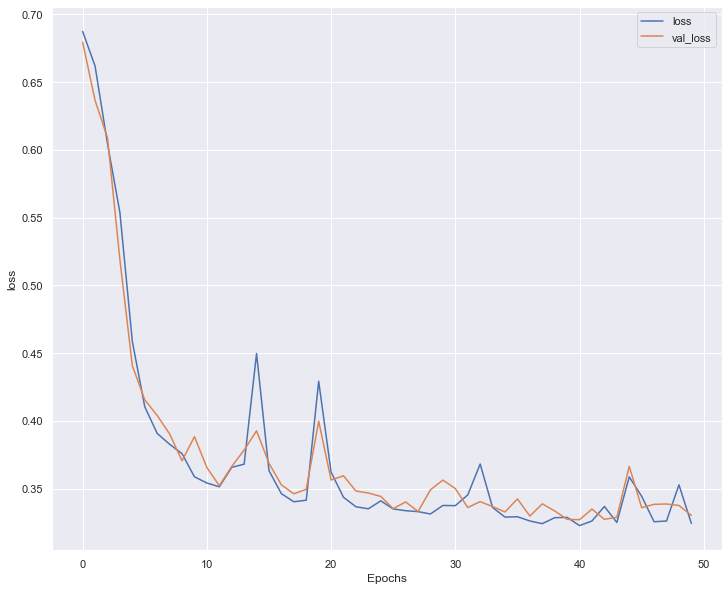

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_251"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3889 (Dense)          (None, 39)                1560      
                                                                 
 dense_3890 (Dense)          (None, 39)                1560      
                                                                 
 dense_3891 (Dense)          (None, 39)                1560      
                                                                 
 dense_3892 (Dense)          (None, 39)                1560      
                                                                 
 dense_3893 (Dense)          (None, 39)                1560      
                                                                 
 dense_3894 (Dense)          (None, 39)                1560      
                                                                 
 dense_3895 (Dense)          (None,

Epoch 29/50
27/27 [==============================] - 0s 3ms/step - loss: 0.3361 - accuracy: 0.8318 - precision: 0.6756 - recall: 0.6523 - val_loss: 0.3367 - val_accuracy: 0.8466 - val_precision: 0.7951 - val_recall: 0.6583
Epoch 30/50
27/27 [==============================] - 0s 3ms/step - loss: 0.3399 - accuracy: 0.8330 - precision: 0.7093 - recall: 0.6021 - val_loss: 0.3393 - val_accuracy: 0.8396 - val_precision: 0.8136 - val_recall: 0.6021
Epoch 31/50
27/27 [==============================] - 0s 3ms/step - loss: 0.3324 - accuracy: 0.8327 - precision: 0.7300 - recall: 0.6622 - val_loss: 0.3338 - val_accuracy: 0.8410 - val_precision: 0.7658 - val_recall: 0.6865
Epoch 32/50
27/27 [==============================] - 0s 3ms/step - loss: 0.3343 - accuracy: 0.8291 - precision: 0.6817 - recall: 0.6368 - val_loss: 0.3355 - val_accuracy: 0.8417 - val_precision: 0.8053 - val_recall: 0.6209
Epoch 33/50
27/27 [==============================] - 0s 3ms/step - loss: 0.3324 - accuracy: 0.8309 - precisi

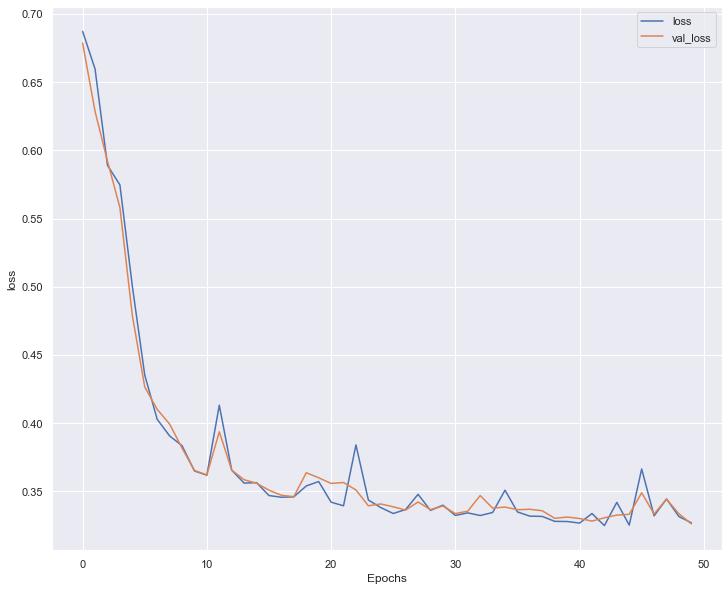

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_252"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3900 (Dense)          (None, 39)                1560      
                                                                 
 dense_3901 (Dense)          (None, 39)                1560      
                                                                 
 dense_3902 (Dense)          (None, 39)                1560      
                                                                 
 dense_3903 (Dense)          (None, 39)                1560      
                                                                 
 dense_3904 (Dense)          (None, 39)                1560      
                                                                 
 dense_3905 (Dense)          (None, 39)                1560      
                                                                 
 dense_3906 (Dense)          (None,

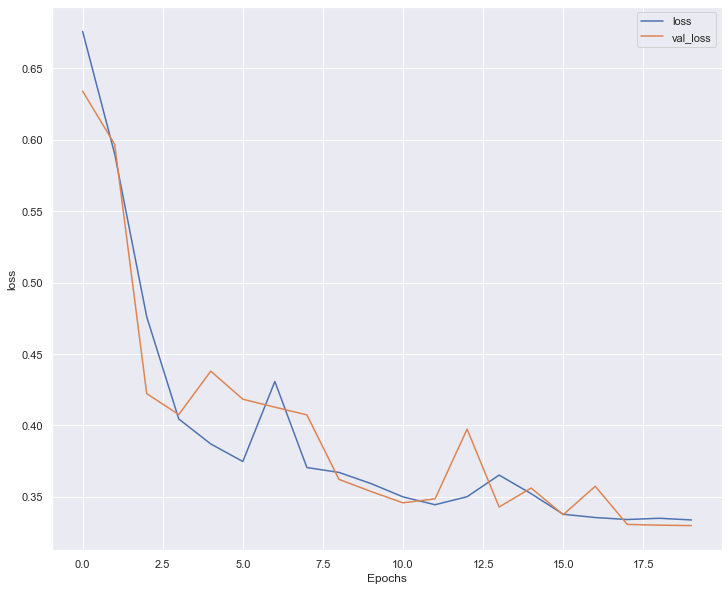

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_253"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3916 (Dense)          (None, 39)                1560      
                                                                 
 dense_3917 (Dense)          (None, 39)                1560      
                                                                 
 dense_3918 (Dense)          (None, 39)                1560      
                                                                 
 dense_3919 (Dense)          (None, 39)                1560      
                                                                 
 dense_3920 (Dense)          (None, 39)                1560      
                                                                 
 dense_3921 (Dense)          (None, 39)                1560      
                                                                 
 dense_3922 (Dense)          (None,

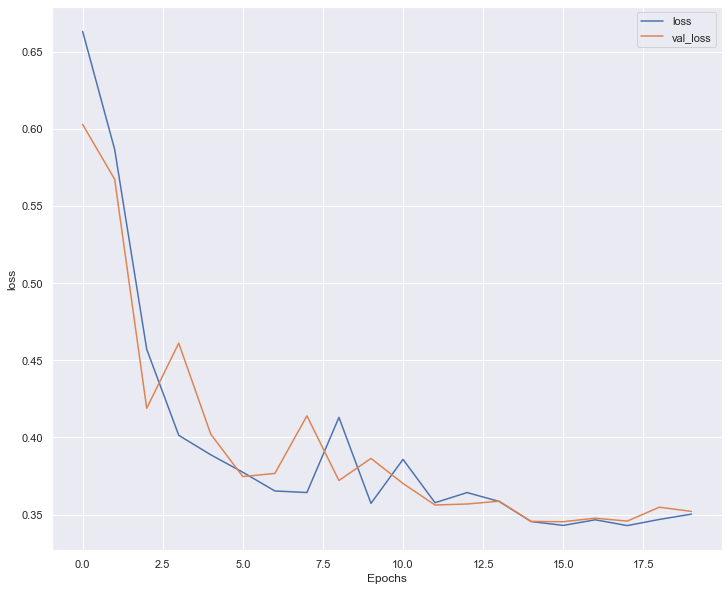

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_254"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3932 (Dense)          (None, 39)                1560      
                                                                 
 dense_3933 (Dense)          (None, 39)                1560      
                                                                 
 dense_3934 (Dense)          (None, 39)                1560      
                                                                 
 dense_3935 (Dense)          (None, 39)                1560      
                                                                 
 dense_3936 (Dense)          (None, 39)                1560      
                                                                 
 dense_3937 (Dense)          (None, 39)                1560      
                                                                 
 dense_3938 (Dense)          (None,

Epoch 26/50
53/53 [==============================] - 0s 3ms/step - loss: 0.3777 - accuracy: 0.8017 - precision: 0.6779 - recall: 0.6431 - val_loss: 0.3717 - val_accuracy: 0.8396 - val_precision: 0.8088 - val_recall: 0.6008
Epoch 27/50
53/53 [==============================] - 0s 3ms/step - loss: 0.3409 - accuracy: 0.8318 - precision: 0.7077 - recall: 0.7103 - val_loss: 0.3337 - val_accuracy: 0.8417 - val_precision: 0.7922 - val_recall: 0.6320
Epoch 28/50
53/53 [==============================] - 0s 3ms/step - loss: 0.3285 - accuracy: 0.8372 - precision: 0.7138 - recall: 0.6504 - val_loss: 0.3285 - val_accuracy: 0.8340 - val_precision: 0.7203 - val_recall: 0.7336
Epoch 29/50
53/53 [==============================] - 0s 3ms/step - loss: 0.3325 - accuracy: 0.8348 - precision: 0.6788 - recall: 0.7136 - val_loss: 0.3368 - val_accuracy: 0.8312 - val_precision: 0.6826 - val_recall: 0.8084
Epoch 30/50
53/53 [==============================] - 0s 3ms/step - loss: 0.3226 - accuracy: 0.8390 - precisi

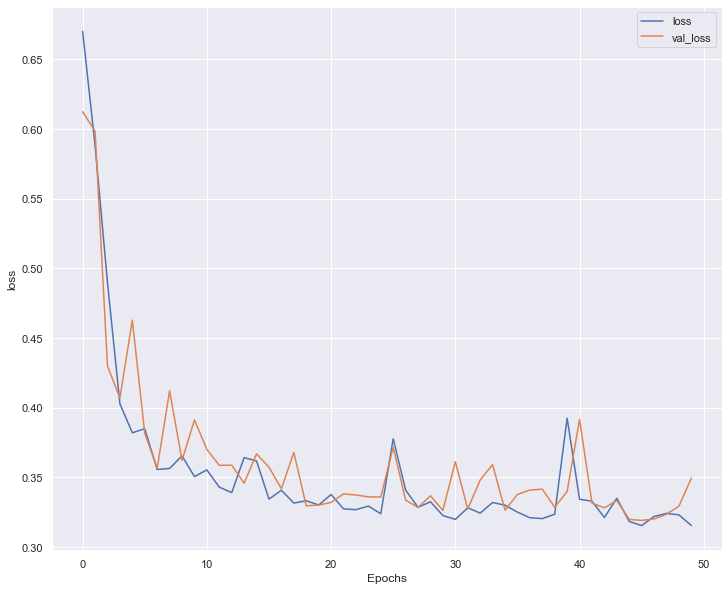

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_255"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3948 (Dense)          (None, 39)                1560      
                                                                 
 dense_3949 (Dense)          (None, 39)                1560      
                                                                 
 dense_3950 (Dense)          (None, 39)                1560      
                                                                 
 dense_3951 (Dense)          (None, 39)                1560      
                                                                 
 dense_3952 (Dense)          (None, 39)                1560      
                                                                 
 dense_3953 (Dense)          (None, 39)                1560      
                                                                 
 dense_3954 (Dense)          (None,

Epoch 26/50
53/53 [==============================] - 0s 3ms/step - loss: 0.3376 - accuracy: 0.8330 - precision: 0.7030 - recall: 0.6836 - val_loss: 0.3634 - val_accuracy: 0.8417 - val_precision: 0.8205 - val_recall: 0.5949
Epoch 27/50
53/53 [==============================] - 0s 3ms/step - loss: 0.3386 - accuracy: 0.8285 - precision: 0.6918 - recall: 0.6416 - val_loss: 0.3680 - val_accuracy: 0.8200 - val_precision: 0.8637 - val_recall: 0.4567
Epoch 28/50
53/53 [==============================] - 0s 3ms/step - loss: 0.3454 - accuracy: 0.8279 - precision: 0.7117 - recall: 0.5894 - val_loss: 0.3419 - val_accuracy: 0.8431 - val_precision: 0.8059 - val_recall: 0.6175
Epoch 29/50
53/53 [==============================] - 0s 3ms/step - loss: 0.3414 - accuracy: 0.8234 - precision: 0.7213 - recall: 0.5785 - val_loss: 0.3362 - val_accuracy: 0.8375 - val_precision: 0.7347 - val_recall: 0.7259
Epoch 30/50
53/53 [==============================] - 0s 3ms/step - loss: 0.3326 - accuracy: 0.8309 - precisi

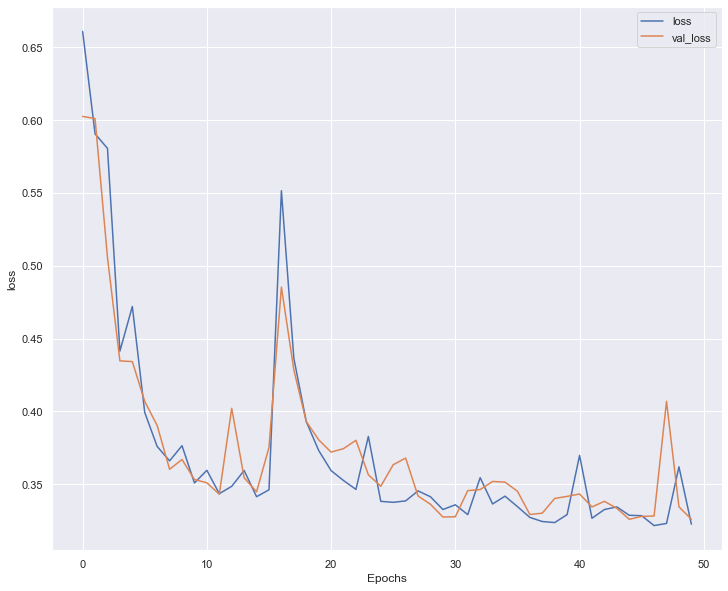

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_256"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3964 (Dense)          (None, 39)                1560      
                                                                 
 dense_3965 (Dense)          (None, 39)                1560      
                                                                 
 dense_3966 (Dense)          (None, 39)                1560      
                                                                 
 dense_3967 (Dense)          (None, 39)                1560      
                                                                 
 dense_3968 (Dense)          (None, 39)                1560      
                                                                 
 dense_3969 (Dense)          (None, 39)                1560      
                                                                 
 dense_3970 (Dense)          (None,

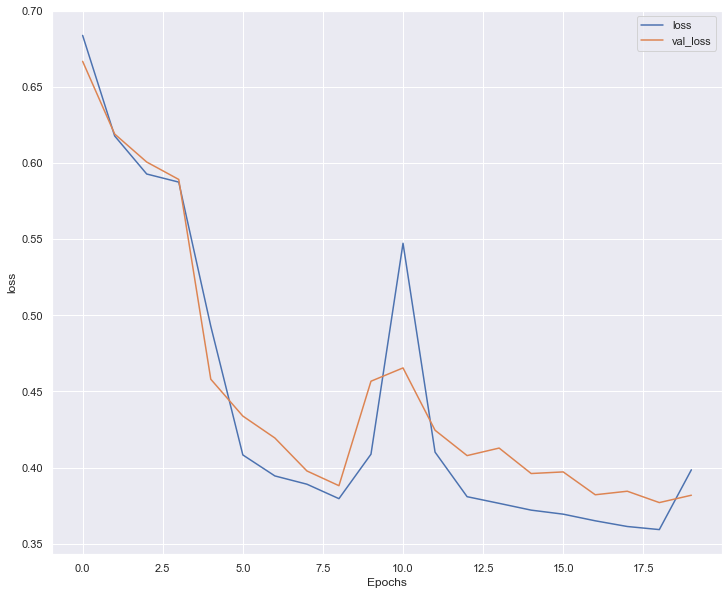

45/45 [==============================] - 0s 2ms/step


dense_layers :15
Model: "sequential_257"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3980 (Dense)          (None, 39)                1560      
                                                                 
 dense_3981 (Dense)          (None, 39)                1560      
                                                                 
 dense_3982 (Dense)          (None, 39)                1560      
                                                                 
 dense_3983 (Dense)          (None, 39)                1560      
                                                                 
 dense_3984 (Dense)          (None, 39)                1560      
                                                                 
 dense_3985 (Dense)          (None, 39)                1560      
                                                                 
 dense_3986 (Dense)          (None,

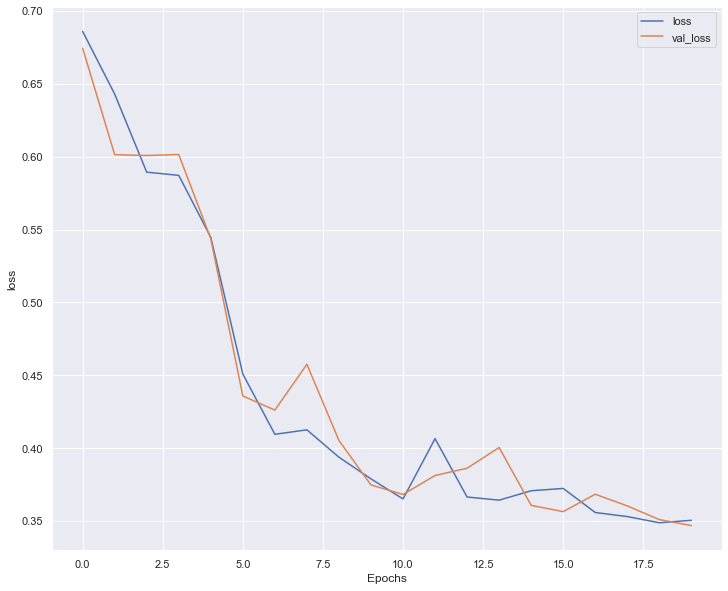

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_258"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3996 (Dense)          (None, 39)                1560      
                                                                 
 dense_3997 (Dense)          (None, 39)                1560      
                                                                 
 dense_3998 (Dense)          (None, 39)                1560      
                                                                 
 dense_3999 (Dense)          (None, 39)                1560      
                                                                 
 dense_4000 (Dense)          (None, 39)                1560      
                                                                 
 dense_4001 (Dense)          (None, 39)                1560      
                                                                 
 dense_4002 (Dense)          (None,

27/27 [==============================] - 0s 3ms/step - loss: 0.3587 - accuracy: 0.8204 - precision: 0.7226 - recall: 0.4881 - val_loss: 0.3588 - val_accuracy: 0.8396 - val_precision: 0.8173 - val_recall: 0.5962
Epoch 26/50
27/27 [==============================] - 0s 4ms/step - loss: 0.3575 - accuracy: 0.8249 - precision: 0.6997 - recall: 0.6006 - val_loss: 0.3463 - val_accuracy: 0.8424 - val_precision: 0.8006 - val_recall: 0.6298
Epoch 27/50
27/27 [==============================] - 0s 3ms/step - loss: 0.3442 - accuracy: 0.8333 - precision: 0.6890 - recall: 0.6363 - val_loss: 0.3487 - val_accuracy: 0.8382 - val_precision: 0.7576 - val_recall: 0.6871
Epoch 28/50
27/27 [==============================] - 0s 3ms/step - loss: 0.3400 - accuracy: 0.8354 - precision: 0.7278 - recall: 0.6886 - val_loss: 0.4290 - val_accuracy: 0.7815 - val_precision: 0.5883 - val_recall: 0.8951
Epoch 29/50
27/27 [==============================] - 0s 3ms/step - loss: 0.5636 - accuracy: 0.5764 - precision: 0.3799 -

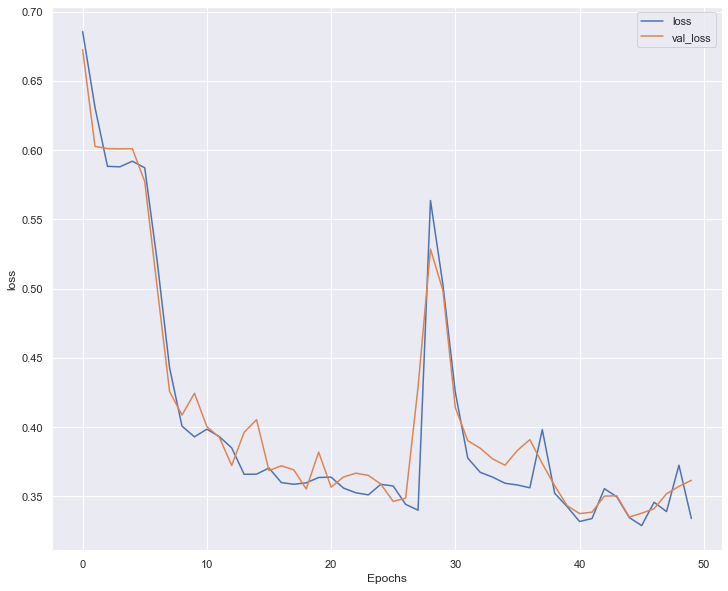

45/45 [==============================] - 0s 1ms/step


dense_layers :15
Model: "sequential_259"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4012 (Dense)          (None, 39)                1560      
                                                                 
 dense_4013 (Dense)          (None, 39)                1560      
                                                                 
 dense_4014 (Dense)          (None, 39)                1560      
                                                                 
 dense_4015 (Dense)          (None, 39)                1560      
                                                                 
 dense_4016 (Dense)          (None, 39)                1560      
                                                                 
 dense_4017 (Dense)          (None, 39)                1560      
                                                                 
 dense_4018 (Dense)          (None,

Epoch 26/50
27/27 [==============================] - 0s 3ms/step - loss: 0.3500 - accuracy: 0.8282 - precision: 0.7302 - recall: 0.6391 - val_loss: 0.4060 - val_accuracy: 0.7976 - val_precision: 0.9091 - val_recall: 0.3487
Epoch 27/50
27/27 [==============================] - 0s 3ms/step - loss: 0.3494 - accuracy: 0.8195 - precision: 0.7862 - recall: 0.5087 - val_loss: 0.3691 - val_accuracy: 0.8326 - val_precision: 0.7135 - val_recall: 0.7692
Epoch 28/50
27/27 [==============================] - 0s 3ms/step - loss: 0.3511 - accuracy: 0.8288 - precision: 0.7029 - recall: 0.5961 - val_loss: 0.3499 - val_accuracy: 0.8403 - val_precision: 0.7670 - val_recall: 0.6760
Epoch 29/50
27/27 [==============================] - 0s 3ms/step - loss: 0.4972 - accuracy: 0.7191 - precision: 0.2951 - recall: 0.4978 - val_loss: 0.4077 - val_accuracy: 0.7115 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 30/50
27/27 [==============================] - 0s 3ms/step - loss: 0.4594 - accuracy: 0.7260 -

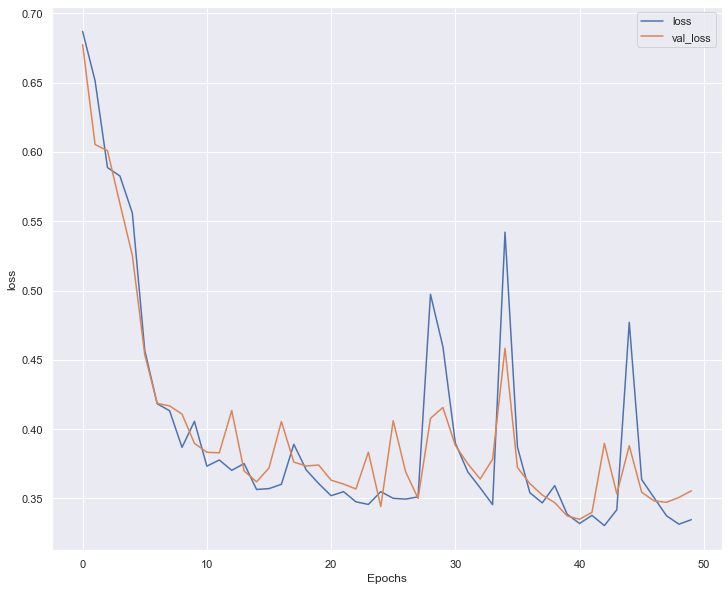

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_260"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4028 (Dense)          (None, 39)                1560      
                                                                 
 dense_4029 (Dense)          (None, 39)                1560      
                                                                 
 dense_4030 (Dense)          (None, 39)                1560      
                                                                 
 dense_4031 (Dense)          (None, 39)                1560      
                                                                 
 dense_4032 (Dense)          (None, 39)                1560      
                                                                 
 dense_4033 (Dense)          (None, 39)                1560      
                                                                 
 dense_4034 (Dense)          (None,

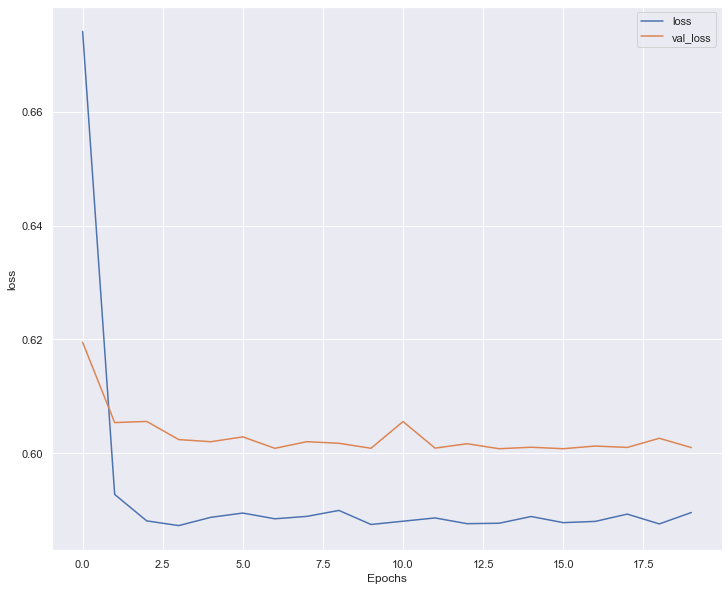

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_261"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4049 (Dense)          (None, 39)                1560      
                                                                 
 dense_4050 (Dense)          (None, 39)                1560      
                                                                 
 dense_4051 (Dense)          (None, 39)                1560      
                                                                 
 dense_4052 (Dense)          (None, 39)                1560      
                                                                 
 dense_4053 (Dense)          (None, 39)                1560      
                                                                 
 dense_4054 (Dense)          (None, 39)                1560      
                                                                 
 dense_4055 (Dense)          (None,

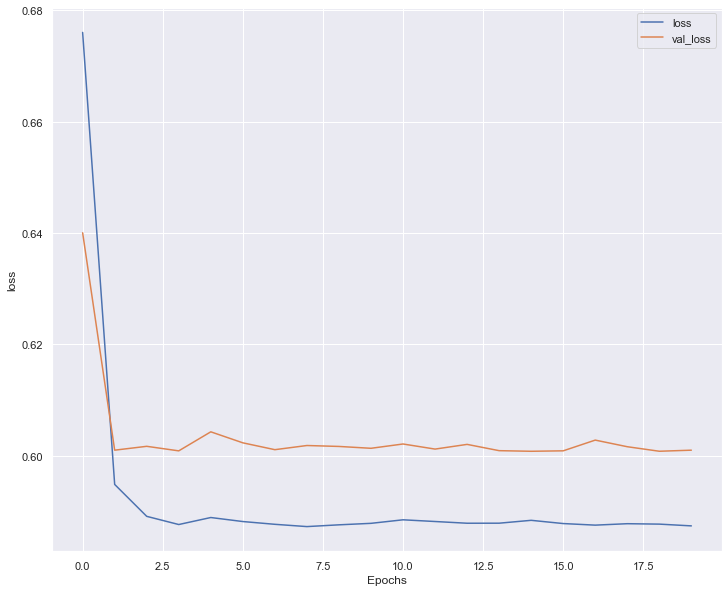

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_262"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4070 (Dense)          (None, 39)                1560      
                                                                 
 dense_4071 (Dense)          (None, 39)                1560      
                                                                 
 dense_4072 (Dense)          (None, 39)                1560      
                                                                 
 dense_4073 (Dense)          (None, 39)                1560      
                                                                 
 dense_4074 (Dense)          (None, 39)                1560      
                                                                 
 dense_4075 (Dense)          (None, 39)                1560      
                                                                 
 dense_4076 (Dense)          (None,

Epoch 22/50
53/53 [==============================] - 0s 3ms/step - loss: 0.5899 - accuracy: 0.7260 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 0.6010 - val_accuracy: 0.7115 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 23/50
53/53 [==============================] - 0s 3ms/step - loss: 0.5890 - accuracy: 0.7260 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 0.6018 - val_accuracy: 0.7115 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 24/50
53/53 [==============================] - 0s 3ms/step - loss: 0.5885 - accuracy: 0.7260 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 0.6013 - val_accuracy: 0.7115 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 25/50
53/53 [==============================] - 0s 3ms/step - loss: 0.5893 - accuracy: 0.7260 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 0.6008 - val_accuracy: 0.7115 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 26/50
53/53 [=========================

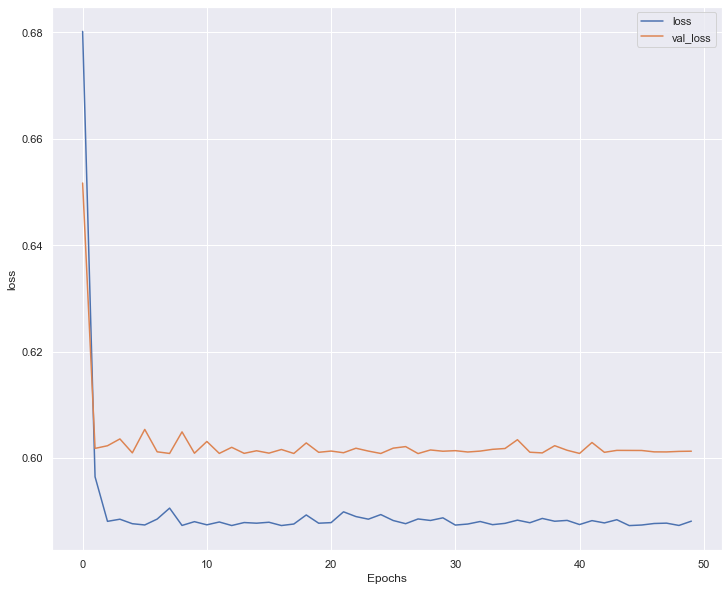

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_263"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4091 (Dense)          (None, 39)                1560      
                                                                 
 dense_4092 (Dense)          (None, 39)                1560      
                                                                 
 dense_4093 (Dense)          (None, 39)                1560      
                                                                 
 dense_4094 (Dense)          (None, 39)                1560      
                                                                 
 dense_4095 (Dense)          (None, 39)                1560      
                                                                 
 dense_4096 (Dense)          (None, 39)                1560      
                                                                 
 dense_4097 (Dense)          (None,

Epoch 22/50
53/53 [==============================] - 0s 3ms/step - loss: 0.5882 - accuracy: 0.7260 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 0.6043 - val_accuracy: 0.7115 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 23/50
53/53 [==============================] - 0s 3ms/step - loss: 0.5884 - accuracy: 0.7260 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 0.6009 - val_accuracy: 0.7115 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 24/50
53/53 [==============================] - 0s 3ms/step - loss: 0.5881 - accuracy: 0.7260 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 0.6010 - val_accuracy: 0.7115 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 25/50
53/53 [==============================] - 0s 3ms/step - loss: 0.5890 - accuracy: 0.7260 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 0.6014 - val_accuracy: 0.7115 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 26/50
53/53 [=========================

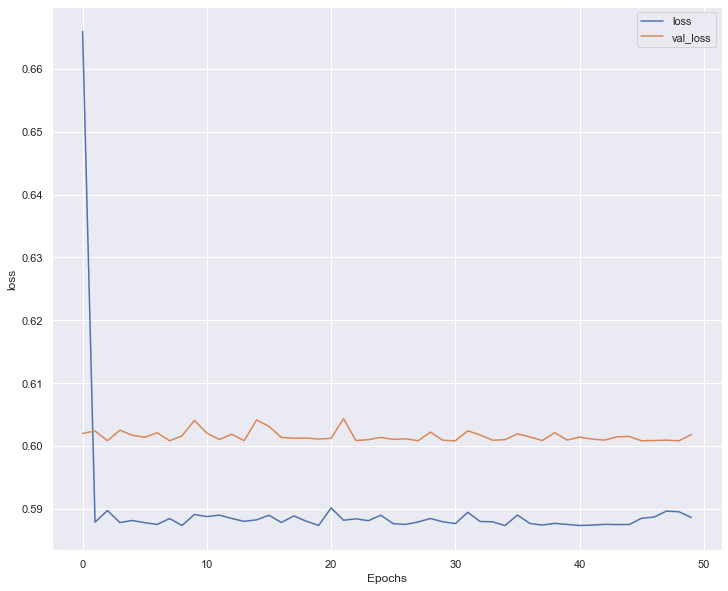

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_264"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4112 (Dense)          (None, 39)                1560      
                                                                 
 dense_4113 (Dense)          (None, 39)                1560      
                                                                 
 dense_4114 (Dense)          (None, 39)                1560      
                                                                 
 dense_4115 (Dense)          (None, 39)                1560      
                                                                 
 dense_4116 (Dense)          (None, 39)                1560      
                                                                 
 dense_4117 (Dense)          (None, 39)                1560      
                                                                 
 dense_4118 (Dense)          (None,

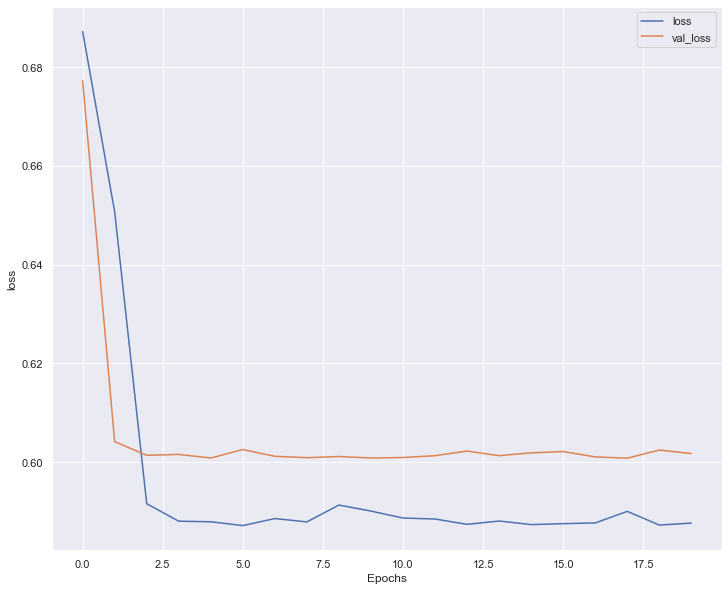

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_265"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4133 (Dense)          (None, 39)                1560      
                                                                 
 dense_4134 (Dense)          (None, 39)                1560      
                                                                 
 dense_4135 (Dense)          (None, 39)                1560      
                                                                 
 dense_4136 (Dense)          (None, 39)                1560      
                                                                 
 dense_4137 (Dense)          (None, 39)                1560      
                                                                 
 dense_4138 (Dense)          (None, 39)                1560      
                                                                 
 dense_4139 (Dense)          (None,

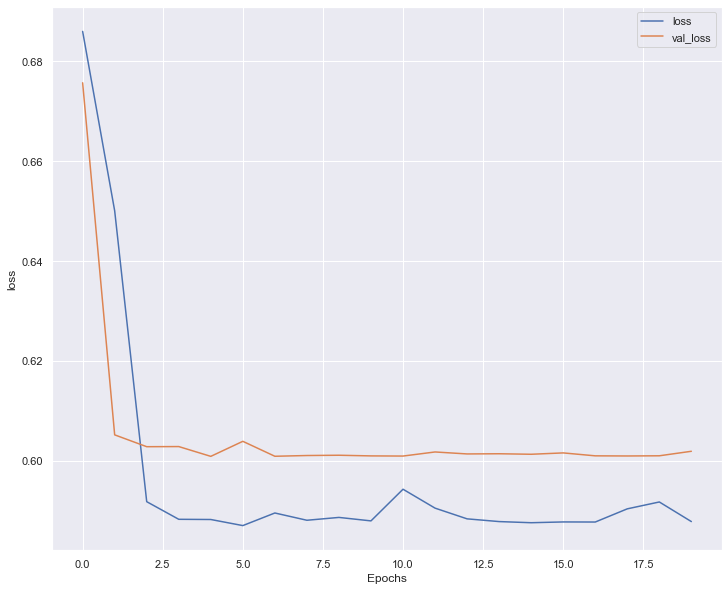

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_266"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4154 (Dense)          (None, 39)                1560      
                                                                 
 dense_4155 (Dense)          (None, 39)                1560      
                                                                 
 dense_4156 (Dense)          (None, 39)                1560      
                                                                 
 dense_4157 (Dense)          (None, 39)                1560      
                                                                 
 dense_4158 (Dense)          (None, 39)                1560      
                                                                 
 dense_4159 (Dense)          (None, 39)                1560      
                                                                 
 dense_4160 (Dense)          (None,

Epoch 22/50
27/27 [==============================] - 0s 4ms/step - loss: 0.5880 - accuracy: 0.7260 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 0.6022 - val_accuracy: 0.7115 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 23/50
27/27 [==============================] - 0s 4ms/step - loss: 0.5877 - accuracy: 0.7260 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 0.6009 - val_accuracy: 0.7115 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 24/50
27/27 [==============================] - 0s 4ms/step - loss: 0.5918 - accuracy: 0.7260 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 0.6016 - val_accuracy: 0.7115 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 25/50
27/27 [==============================] - 0s 4ms/step - loss: 0.5883 - accuracy: 0.7260 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 0.6030 - val_accuracy: 0.7115 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 26/50
27/27 [=========================

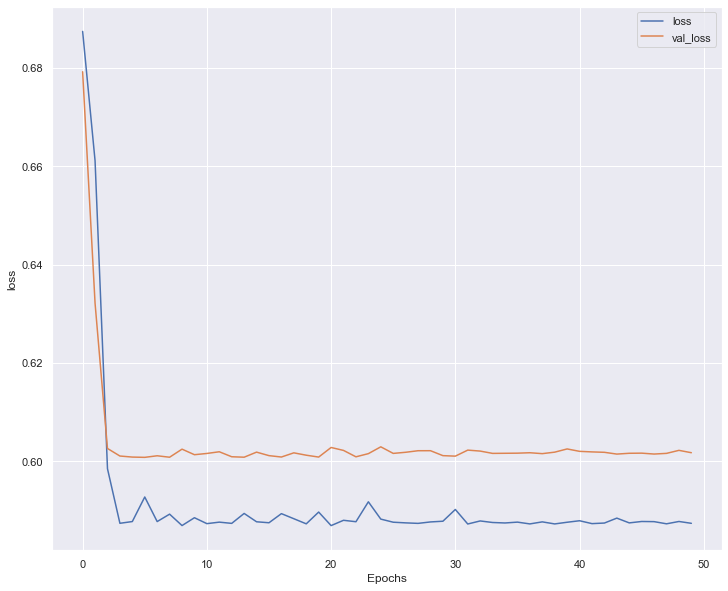

45/45 [==============================] - 0s 1ms/step


dense_layers :20
Model: "sequential_267"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4175 (Dense)          (None, 39)                1560      
                                                                 
 dense_4176 (Dense)          (None, 39)                1560      
                                                                 
 dense_4177 (Dense)          (None, 39)                1560      
                                                                 
 dense_4178 (Dense)          (None, 39)                1560      
                                                                 
 dense_4179 (Dense)          (None, 39)                1560      
                                                                 
 dense_4180 (Dense)          (None, 39)                1560      
                                                                 
 dense_4181 (Dense)          (None,

Epoch 22/50
27/27 [==============================] - 0s 4ms/step - loss: 0.5883 - accuracy: 0.7260 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 0.6016 - val_accuracy: 0.7115 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 23/50
27/27 [==============================] - 0s 4ms/step - loss: 0.5879 - accuracy: 0.7260 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 0.6009 - val_accuracy: 0.7115 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 24/50
27/27 [==============================] - 0s 4ms/step - loss: 0.5914 - accuracy: 0.7260 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 0.6008 - val_accuracy: 0.7115 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 25/50
27/27 [==============================] - 0s 4ms/step - loss: 0.5870 - accuracy: 0.7260 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 0.6015 - val_accuracy: 0.7115 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 26/50
27/27 [=========================

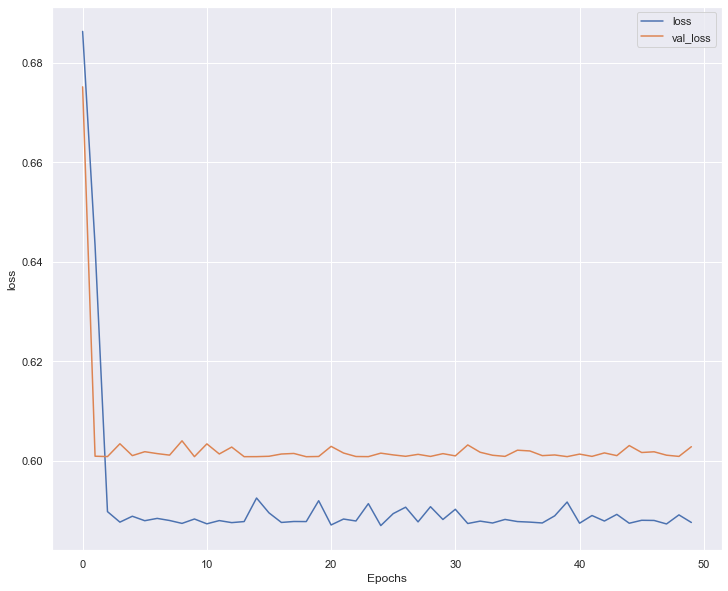

45/45 [==============================] - 0s 1ms/step


In [106]:
param_grid = dict(dense_layers = dense_layers
                    , batch_size = batch_size
                    , epochs = epochs
                   , dense_dropout = dense_dropout
                 )

keys = param_grid.keys()
values = (param_grid[key] for key in keys)
param_grid = [dict(zip(keys, param_grid)) for param_grid in itertools.product(*values)]

print('Proposed ' + str(len(param_grid)) + ' models')

for j in range(0, len(param_grid)):
    
    dense_layers = param_grid[j].get("dense_layers")
    batch_size = param_grid[j].get("batch_size")
    epochs = param_grid[j].get("epochs")
    dense_dropout = param_grid[j].get("dense_dropout")
    
    model = make_model_Lineal_Sigmoide(dense_layers = dense_layers
                   , dense_dropout = dense_dropout
                   , verbose = 1)
    print('batch_size :' + str(batch_size))
    
    history = model.fit(train_features,
                        train_labels,
                        batch_size = batch_size,
                        epochs = epochs,
                        validation_data = (val_features, val_labels), 
                        verbose = 1)
    
    plot_history_train(history, 'loss')
    
    # Calculate validation metrics
    y_val_pred = model.predict(val_features)
    y_val_pred = np.round(y_val_pred)
    val_conf_mat = confusion_matrix(val_labels, y_val_pred)
    tn, fp, fn, tp = val_conf_mat.ravel()
    val_sensitivity = tp / (tp + fn)
    val_specificity = tn / (tn + fp)
    val_f1_score = f1_score(val_labels, y_val_pred, average='macro')
    
    # Update results
    val_loss = pd.DataFrame.from_dict(history.history)['val_loss'].iloc[-1]
    val_accuracy = pd.DataFrame.from_dict(history.history)['val_accuracy'].iloc[-1]
    loss = pd.DataFrame.from_dict(history.history)['loss'].iloc[-1]
    accuracy = pd.DataFrame.from_dict(history.history)['accuracy'].iloc[-1]
    param_grid[j].update({"loss": loss})
    param_grid[j].update({"accuracy": accuracy})
    param_grid[j].update({"val_loss": val_loss})
    param_grid[j].update({"val_accuracy": val_accuracy})
    param_grid[j].update({"val_sensitivity": val_sensitivity})
    param_grid[j].update({"val_specificity": val_specificity})
    param_grid[j].update({"val_f1_score": val_f1_score})

results_Lineal_Sigmoide = pd.DataFrame(param_grid)

In [107]:
results_Lineal_Sigmoide.sort_values(['val_loss'],ascending = True)

,dense_layers,batch_size,epochs,dense_dropout,loss,accuracy,val_loss,val_accuracy,val_sensitivity,val_specificity,val_f1_score
3,10,64,50,0.3,0.313073,0.848002,0.321933,0.841737,0.750000,0.878937,0.809951
11,15,64,50,0.3,0.322568,0.843497,0.325987,0.841036,0.711165,0.893701,0.804838
7,10,128,50,0.3,0.327005,0.836287,0.326251,0.841036,0.716019,0.891732,0.805413
0,10,64,20,0.0,0.325251,0.838390,0.328358,0.832633,0.723301,0.876969,0.797757
8,15,64,20,0.0,0.333849,0.833584,0.329898,0.841036,0.716019,0.891732,0.805413
6,10,128,50,0.0,0.324294,0.841394,0.330231,0.838235,0.674757,0.904528,0.797416
1,10,64,20,0.3,0.326256,0.836888,0.336686,0.837535,0.584951,0.939961,0.783380
13,15,128,20,0.3,0.350457,0.825473,0.346826,0.842437,0.614078,0.935039,0.793160
10,15,64,50,0.0,0.315492,0.844097,0.349554,0.836835,0.558252,0.949803,0.778030
9,15,64,20,0.3,0.350272,0.828177,0.352059,0.838936,0.740291,0.878937,0.806052


Gracias a la tabla anterior se puede extraer la información que los mejores hiper parámetros del grid search de la <b>arquitectura lineal utilizando la activación Sigmoide</b> se han conseguido en la <i>3º</i> red neuronal:
* Dense Layers: 10

* Batch Size: 64

* Epochs: 50

* Dense Dropout: 30%

obteniendo unas métricas bastante favorables en test:

* Loss: 0.321933
				
* Accuracy: 0.841737
				
* Sensitivity: 0.750000

* Specificity: 0.878937

* F1-score: 0.809951

<b>Comparación de los score obtenidos del modelo lineal con activación Softmax y Sigmoide</b>

<table>
    
  <tr>
    <th>Modelo</th>
    <th>Loss</th>
    <th>Accuracy</th>
    <th>Sensibilidad</th>
    <th>Especificidad</th>
    <th>F1-Score</th>
  </tr>

  <tr>
    <td>Modelo lineal - Softmax</td>
    <td>0.3134</td>
    <td>0.8487</td>
    <td>0.7237</td>
    <td>0.8941</td>
    <td>0.8073</td>
  </tr>

  <tr>
    <td>Modelo Lineal - Sigmoide</td>
    <td>0.3219</td>
    <td>0.8417</td>
    <td>0.7500</td>
    <td>0.8789</td>
    <td>0.8099</td>
  </tr>
</table>


Esta comparación es extramadamente similar, como cabría esperar. La justificación de esta es para averiguar si realmente los artículos y documentación de internet tiene razón y/o coherencia. Estos indican que cuando se trata de una clasificación binaria la activación <i>Sigmoide</i> con la función de pérdida <i>binary_crossentropy</i> aporta mejores resultados. Mediante el conjunto de datos utilizado, se puede observar que las diferencias entre las métricas son de pocos decimales, por lo que en esta casuística no habría uno mejor que otro.

La elección del modelo óptimo será el <b>Modelo Lineal con activación en la última capa Softmax</b>. Esta decisión es totalmente subjetiva*.

*Nota: El Data Scientist encargado de realizar el presente proyecto le gusta más el output que saca la activación softmax ya que por cada categoria en la variable objetivo te indica la probabilidad de pertenecer a dicha clase.

<b>3 - MODIFICACIÓN DE BATCH SIZE Y DISMINUCIÓN DEL NÚMERO DE CAPAS DENSAS</b>

En la última sección de modificaciones para optimizar la red neuronal se ha decido cambiar los hiper parámetros <i>batch size</i> y <i>dense layers</i>.

El <i>batch size</i> es un parámetro que determina el número de muestras de entrenamiento que se utilizarán en una iteración del algoritmo de optimización durante el entrenamiento del modelo. Un valor de este más grande significa que la red recibirá más datos de entrenamiento en cada iteración, lo que puede acelerar el proceso de entrenamiento, pero puede requerir más memoria del sistema. Por otro lado, un <i>batch size</i> más pequeño puede ser más lento, pero puede ser beneficioso para el aprendizaje, ya que el modelo se actualiza más veces y ve más variabilidad en los datos.

Debido a la poca cantidad de datos que se poseen utilizar valores elevados de este hiper parámetro puede provocar un sobreajuste en los datos. Es por eso, que en el presente apartado se van a reducir en <i>16</i> y <i>32</i>. Realizando este cambio se espera que el modelo generaliza mejor y conseguir por lo menos unos resultados similares e incluso mejores respecto al modelo lineal referente.

El otro hiper parámetros que se modifican son el número de <i>capas densas</i> en la que cada neurona de la capa está conectada a todas las neuronas de la capa anterior. Esto significa que cada entrada se multiplica por un peso y se suma a un sesgo para producir una salida. La operación matemática que se realiza en una capa densa se llama multiplicación de matriz-vector.

Mediante la elección de nuevos valores en las <i>capas densas</i>, concretamente, <i>5</i>,<i>7</i> y <i>10</i>, se pretende conseguir un menor efecto de un sobreajuste en los datos y mejorar el gradiente de retropropagación y evitar que se desvanezca o explote. Esto puede conducir a una mejor capacidad del modelo para aprender patrones relevantes en los datos.

En esta sección se utilizará la función make_model_Lineal ya que la arquitectura es la misma, lo único que cambia son los valores de los hiper parámetros.

En el código siguiente se muestra los hiper parámetros actuales (izquierda) y los que sean utilizado anteriormente (derecha). Estos valores han sido puestos al "azar" por el Data Scientist encargado del presente proyecto, puediendo ser estos menores o incluso un poco más elevados.

In [165]:
#HIPER PARÁMETROS ACTUALES   # HIPER PARÁMETROS ANTERIORES 
                             #  
batch_size = [16,32]         #   batch_size = [64, 128]
epochs = [20,50]             #   epochs = [20,50]
dense_layers = [5,7,10]      #   dense_layers = [10, 15, 20]
dense_dropout = [0.0,0.3]    #   dense_dropout = [0.0, 0.3]

Proposed 24 models
dense_layers :5
Model: "sequential_791"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10743 (Dense)         (None, 39)                1560      
                                                                 
 dense_10744 (Dense)         (None, 39)                1560      
                                                                 
 dense_10745 (Dense)         (None, 39)                1560      
                                                                 
 dense_10746 (Dense)         (None, 39)                1560      
                                                                 
 dense_10747 (Dense)         (None, 39)                1560      
                                                                 
 dense_10748 (Dense)         (None, 2)                 80        
                                                                 
Total params: 7,8

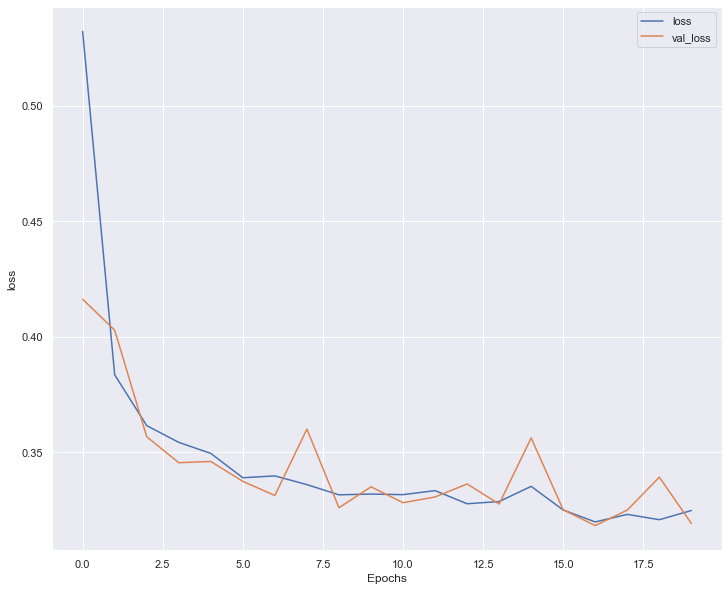

45/45 [==============================] - 0s 1ms/step


dense_layers :5
Model: "sequential_792"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10749 (Dense)         (None, 39)                1560      
                                                                 
 dense_10750 (Dense)         (None, 39)                1560      
                                                                 
 dense_10751 (Dense)         (None, 39)                1560      
                                                                 
 dense_10752 (Dense)         (None, 39)                1560      
                                                                 
 dense_10753 (Dense)         (None, 39)                1560      
                                                                 
 dense_10754 (Dense)         (None, 2)                 80        
                                                                 
Total params: 7,880
Trainable params

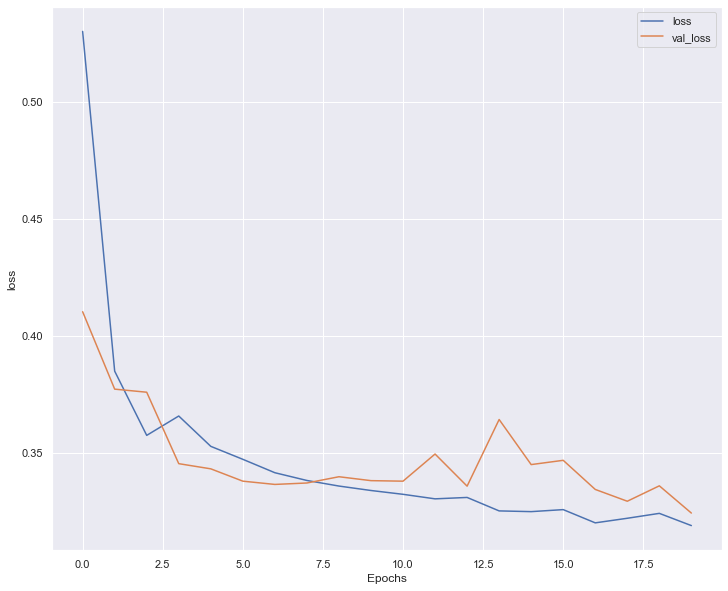

45/45 [==============================] - 0s 1ms/step


dense_layers :5
Model: "sequential_793"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10755 (Dense)         (None, 39)                1560      
                                                                 
 dense_10756 (Dense)         (None, 39)                1560      
                                                                 
 dense_10757 (Dense)         (None, 39)                1560      
                                                                 
 dense_10758 (Dense)         (None, 39)                1560      
                                                                 
 dense_10759 (Dense)         (None, 39)                1560      
                                                                 
 dense_10760 (Dense)         (None, 2)                 80        
                                                                 
Total params: 7,880
Trainable params

Epoch 32/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3152 - accuracy: 0.8375 - precision: 0.2727 - recall: 0.9809 - val_loss: 0.3227 - val_accuracy: 0.8396 - val_precision: 0.2924 - val_recall: 1.0000
Epoch 33/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3110 - accuracy: 0.8471 - precision: 0.2727 - recall: 0.9856 - val_loss: 0.3135 - val_accuracy: 0.8424 - val_precision: 0.2924 - val_recall: 1.0000
Epoch 34/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3138 - accuracy: 0.8438 - precision: 0.2772 - recall: 1.0000 - val_loss: 0.3153 - val_accuracy: 0.8424 - val_precision: 0.2924 - val_recall: 1.0000
Epoch 35/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3096 - accuracy: 0.8438 - precision: 0.2772 - recall: 0.9856 - val_loss: 0.3262 - val_accuracy: 0.8354 - val_precision: 0.2924 - val_recall: 1.0000
Epoch 36/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3073 - accuracy: 0.8435

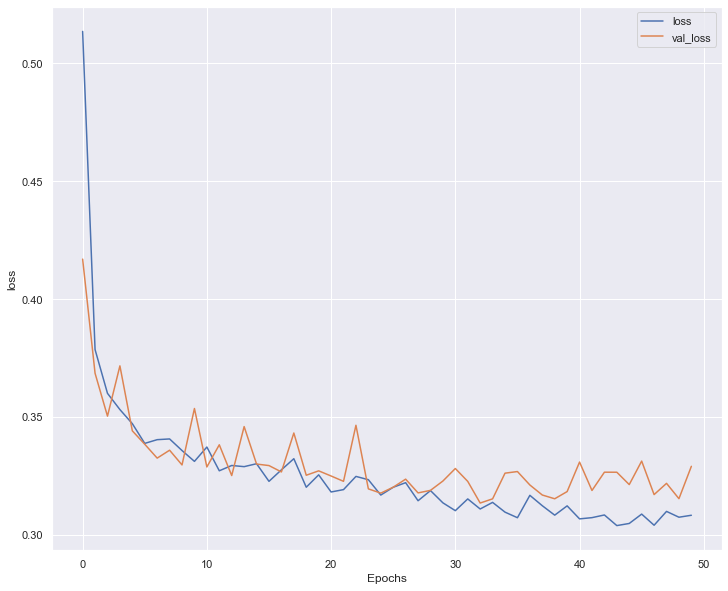

45/45 [==============================] - 0s 1ms/step


dense_layers :5
Model: "sequential_794"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10761 (Dense)         (None, 39)                1560      
                                                                 
 dense_10762 (Dense)         (None, 39)                1560      
                                                                 
 dense_10763 (Dense)         (None, 39)                1560      
                                                                 
 dense_10764 (Dense)         (None, 39)                1560      
                                                                 
 dense_10765 (Dense)         (None, 39)                1560      
                                                                 
 dense_10766 (Dense)         (None, 2)                 80        
                                                                 
Total params: 7,880
Trainable params

Epoch 32/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3179 - accuracy: 0.8426 - precision: 0.2727 - recall: 0.9952 - val_loss: 0.3170 - val_accuracy: 0.8438 - val_precision: 0.2924 - val_recall: 1.0000
Epoch 33/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3172 - accuracy: 0.8411 - precision: 0.2727 - recall: 0.9904 - val_loss: 0.3274 - val_accuracy: 0.8438 - val_precision: 0.2924 - val_recall: 1.0000
Epoch 34/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3148 - accuracy: 0.8414 - precision: 0.2727 - recall: 0.9856 - val_loss: 0.3225 - val_accuracy: 0.8417 - val_precision: 0.2924 - val_recall: 1.0000
Epoch 35/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3159 - accuracy: 0.8405 - precision: 0.2727 - recall: 0.9952 - val_loss: 0.3197 - val_accuracy: 0.8382 - val_precision: 0.2924 - val_recall: 1.0000
Epoch 36/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3166 - accuracy: 0.8381

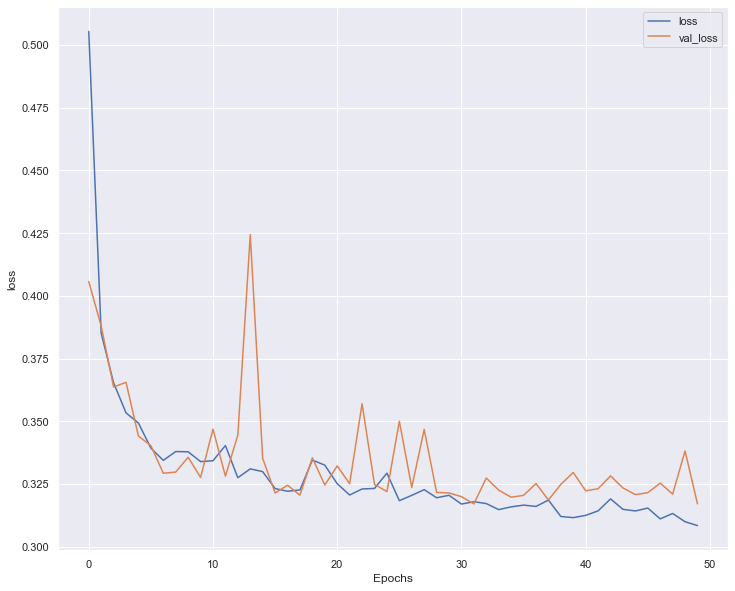

45/45 [==============================] - 0s 1ms/step


dense_layers :5
Model: "sequential_795"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10767 (Dense)         (None, 39)                1560      
                                                                 
 dense_10768 (Dense)         (None, 39)                1560      
                                                                 
 dense_10769 (Dense)         (None, 39)                1560      
                                                                 
 dense_10770 (Dense)         (None, 39)                1560      
                                                                 
 dense_10771 (Dense)         (None, 39)                1560      
                                                                 
 dense_10772 (Dense)         (None, 2)                 80        
                                                                 
Total params: 7,880
Trainable params

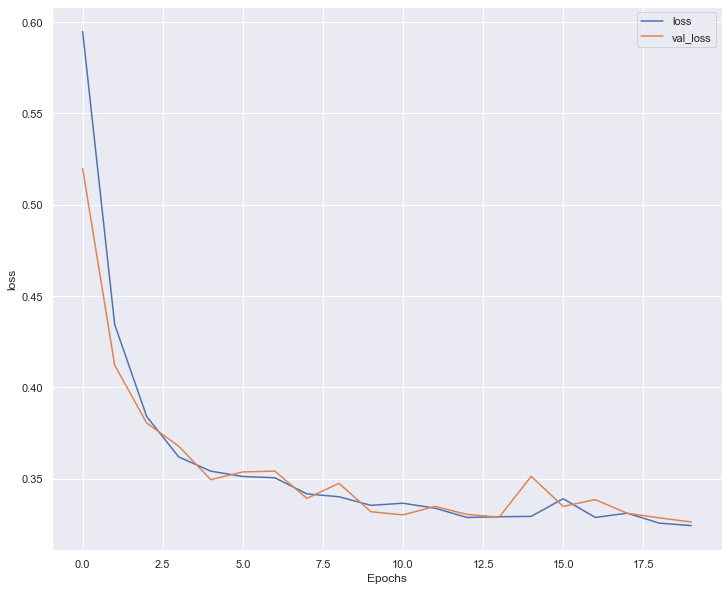

45/45 [==============================] - 0s 1ms/step


dense_layers :5
Model: "sequential_796"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10773 (Dense)         (None, 39)                1560      
                                                                 
 dense_10774 (Dense)         (None, 39)                1560      
                                                                 
 dense_10775 (Dense)         (None, 39)                1560      
                                                                 
 dense_10776 (Dense)         (None, 39)                1560      
                                                                 
 dense_10777 (Dense)         (None, 39)                1560      
                                                                 
 dense_10778 (Dense)         (None, 2)                 80        
                                                                 
Total params: 7,880
Trainable params

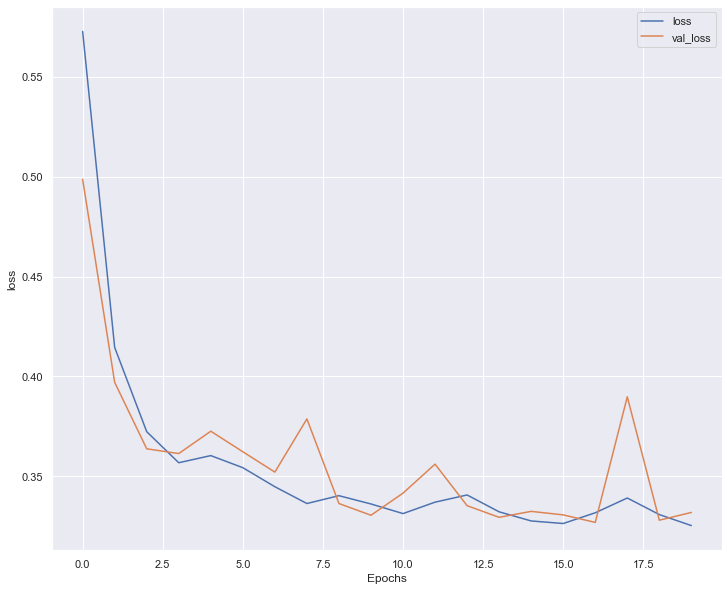

45/45 [==============================] - 0s 992us/step


dense_layers :5
Model: "sequential_797"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10779 (Dense)         (None, 39)                1560      
                                                                 
 dense_10780 (Dense)         (None, 39)                1560      
                                                                 
 dense_10781 (Dense)         (None, 39)                1560      
                                                                 
 dense_10782 (Dense)         (None, 39)                1560      
                                                                 
 dense_10783 (Dense)         (None, 39)                1560      
                                                                 
 dense_10784 (Dense)         (None, 2)                 80        
                                                                 
Total params: 7,880
Trainable params

Epoch 32/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3210 - accuracy: 0.8387 - precision: 0.2714 - recall: 0.9905 - val_loss: 0.3204 - val_accuracy: 0.8431 - val_precision: 0.2894 - val_recall: 1.0000
Epoch 33/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3179 - accuracy: 0.8381 - precision: 0.2714 - recall: 0.9905 - val_loss: 0.3196 - val_accuracy: 0.8438 - val_precision: 0.2894 - val_recall: 1.0000
Epoch 34/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3175 - accuracy: 0.8396 - precision: 0.2714 - recall: 0.9905 - val_loss: 0.3461 - val_accuracy: 0.8396 - val_precision: 0.2894 - val_recall: 1.0000
Epoch 35/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3152 - accuracy: 0.8432 - precision: 0.2714 - recall: 0.9905 - val_loss: 0.3278 - val_accuracy: 0.8466 - val_precision: 0.2894 - val_recall: 1.0000
Epoch 36/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3156 - accuracy: 0.8453

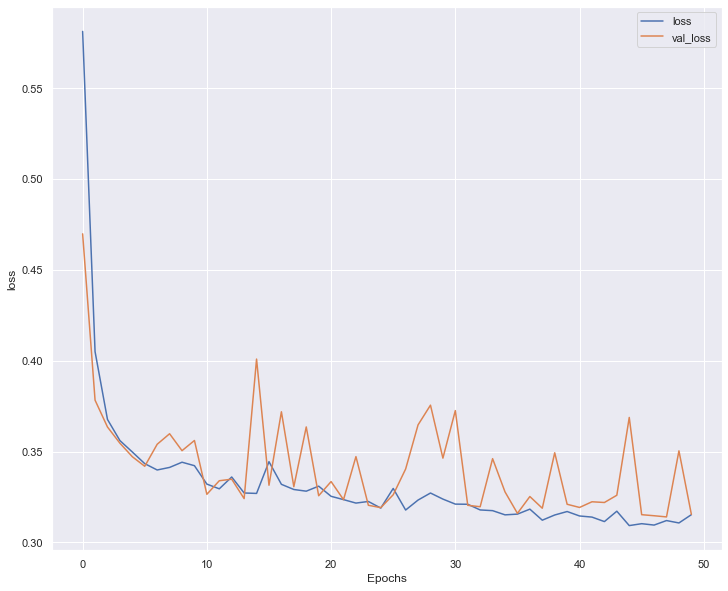

45/45 [==============================] - 0s 1ms/step


dense_layers :5
Model: "sequential_798"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10785 (Dense)         (None, 39)                1560      
                                                                 
 dense_10786 (Dense)         (None, 39)                1560      
                                                                 
 dense_10787 (Dense)         (None, 39)                1560      
                                                                 
 dense_10788 (Dense)         (None, 39)                1560      
                                                                 
 dense_10789 (Dense)         (None, 39)                1560      
                                                                 
 dense_10790 (Dense)         (None, 2)                 80        
                                                                 
Total params: 7,880
Trainable params

Epoch 32/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3213 - accuracy: 0.8405 - precision: 0.2807 - recall: 1.0000 - val_loss: 0.3602 - val_accuracy: 0.8158 - val_precision: 0.2894 - val_recall: 1.0000
Epoch 33/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3300 - accuracy: 0.8309 - precision: 0.2714 - recall: 0.9905 - val_loss: 0.3861 - val_accuracy: 0.8228 - val_precision: 0.2894 - val_recall: 1.0000
Epoch 34/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3224 - accuracy: 0.8339 - precision: 0.2714 - recall: 0.9905 - val_loss: 0.3480 - val_accuracy: 0.8396 - val_precision: 0.2894 - val_recall: 1.0000
Epoch 35/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3163 - accuracy: 0.8441 - precision: 0.2807 - recall: 1.0000 - val_loss: 0.3249 - val_accuracy: 0.8417 - val_precision: 0.2894 - val_recall: 1.0000
Epoch 36/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3179 - accuracy: 0.8363

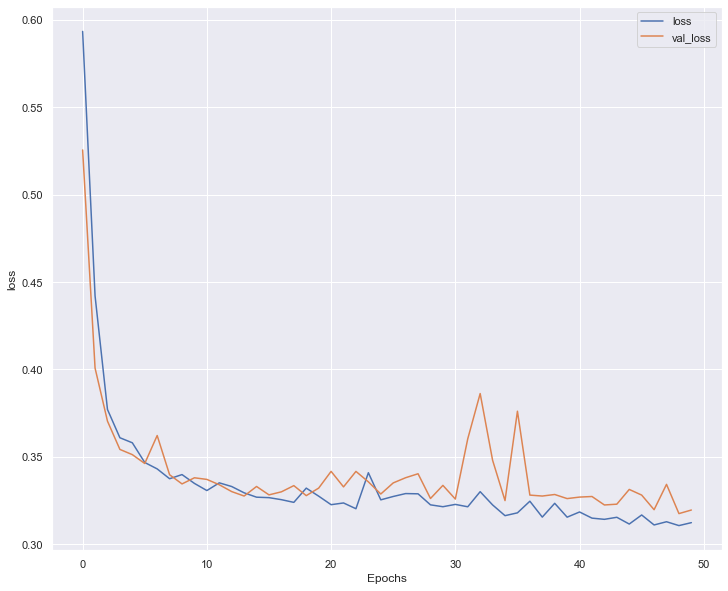

45/45 [==============================] - 0s 1ms/step


dense_layers :7
Model: "sequential_799"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10791 (Dense)         (None, 39)                1560      
                                                                 
 dense_10792 (Dense)         (None, 39)                1560      
                                                                 
 dense_10793 (Dense)         (None, 39)                1560      
                                                                 
 dense_10794 (Dense)         (None, 39)                1560      
                                                                 
 dense_10795 (Dense)         (None, 39)                1560      
                                                                 
 dense_10796 (Dense)         (None, 39)                1560      
                                                                 
 dense_10797 (Dense)         (None, 

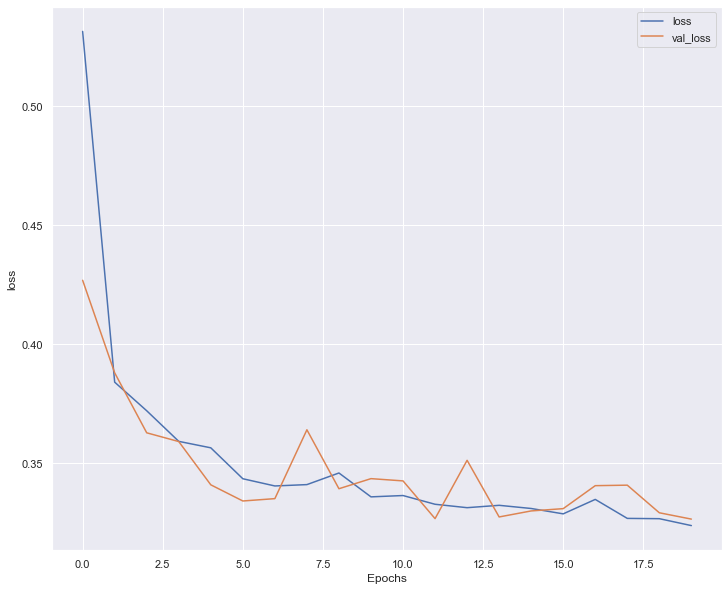

45/45 [==============================] - 0s 1ms/step


dense_layers :7
Model: "sequential_800"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10799 (Dense)         (None, 39)                1560      
                                                                 
 dense_10800 (Dense)         (None, 39)                1560      
                                                                 
 dense_10801 (Dense)         (None, 39)                1560      
                                                                 
 dense_10802 (Dense)         (None, 39)                1560      
                                                                 
 dense_10803 (Dense)         (None, 39)                1560      
                                                                 
 dense_10804 (Dense)         (None, 39)                1560      
                                                                 
 dense_10805 (Dense)         (None, 

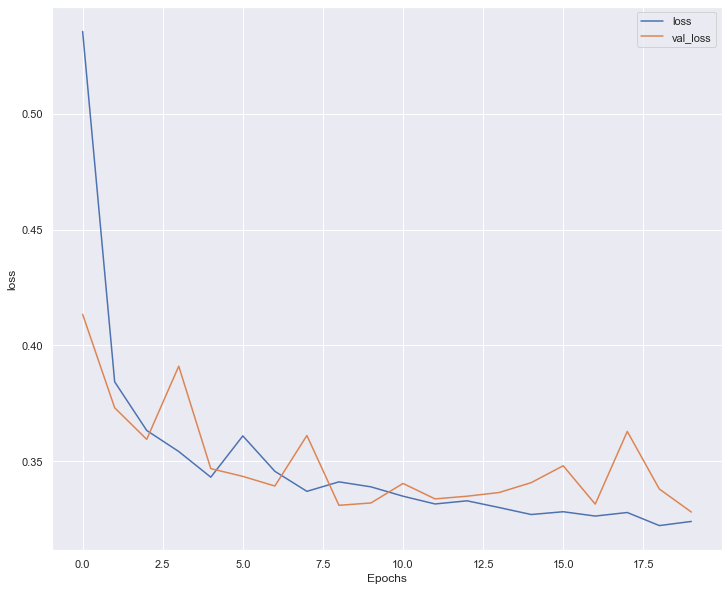

45/45 [==============================] - 0s 1ms/step


dense_layers :7
Model: "sequential_801"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10807 (Dense)         (None, 39)                1560      
                                                                 
 dense_10808 (Dense)         (None, 39)                1560      
                                                                 
 dense_10809 (Dense)         (None, 39)                1560      
                                                                 
 dense_10810 (Dense)         (None, 39)                1560      
                                                                 
 dense_10811 (Dense)         (None, 39)                1560      
                                                                 
 dense_10812 (Dense)         (None, 39)                1560      
                                                                 
 dense_10813 (Dense)         (None, 

Epoch 31/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3200 - accuracy: 0.8423 - precision: 0.2772 - recall: 0.9904 - val_loss: 0.3394 - val_accuracy: 0.8403 - val_precision: 0.2924 - val_recall: 1.0000
Epoch 32/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3202 - accuracy: 0.8414 - precision: 0.2772 - recall: 1.0000 - val_loss: 0.3246 - val_accuracy: 0.8410 - val_precision: 0.2924 - val_recall: 1.0000
Epoch 33/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3210 - accuracy: 0.8432 - precision: 0.2727 - recall: 0.9904 - val_loss: 0.3197 - val_accuracy: 0.8452 - val_precision: 0.2924 - val_recall: 1.0000
Epoch 34/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3168 - accuracy: 0.8420 - precision: 0.2727 - recall: 0.9665 - val_loss: 0.3220 - val_accuracy: 0.8410 - val_precision: 0.2924 - val_recall: 1.0000
Epoch 35/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3136 - accuracy: 0.8456

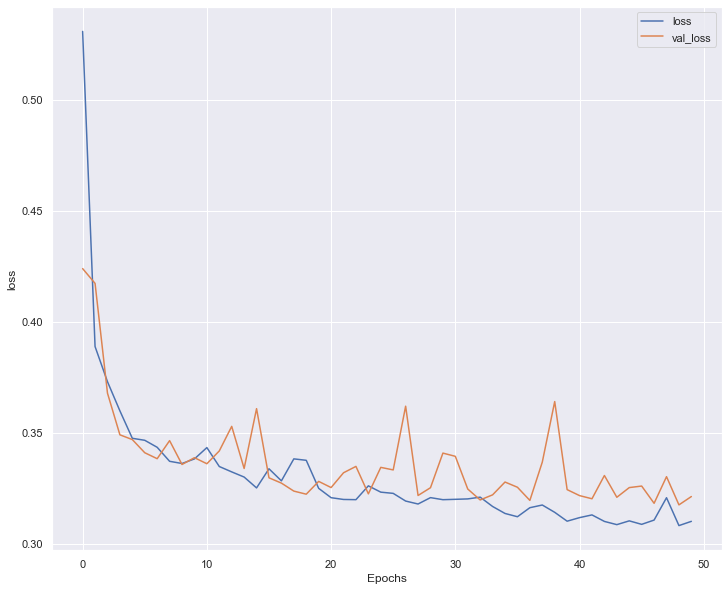

45/45 [==============================] - 0s 1ms/step


dense_layers :7
Model: "sequential_802"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10815 (Dense)         (None, 39)                1560      
                                                                 
 dense_10816 (Dense)         (None, 39)                1560      
                                                                 
 dense_10817 (Dense)         (None, 39)                1560      
                                                                 
 dense_10818 (Dense)         (None, 39)                1560      
                                                                 
 dense_10819 (Dense)         (None, 39)                1560      
                                                                 
 dense_10820 (Dense)         (None, 39)                1560      
                                                                 
 dense_10821 (Dense)         (None, 

Epoch 31/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3203 - accuracy: 0.8363 - precision: 0.2727 - recall: 0.9952 - val_loss: 0.3237 - val_accuracy: 0.8473 - val_precision: 0.2924 - val_recall: 1.0000
Epoch 32/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3183 - accuracy: 0.8408 - precision: 0.2727 - recall: 0.9904 - val_loss: 0.3226 - val_accuracy: 0.8361 - val_precision: 0.2924 - val_recall: 1.0000
Epoch 33/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3215 - accuracy: 0.8360 - precision: 0.2772 - recall: 1.0000 - val_loss: 0.3181 - val_accuracy: 0.8403 - val_precision: 0.2924 - val_recall: 1.0000
Epoch 34/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3156 - accuracy: 0.8387 - precision: 0.2727 - recall: 0.9904 - val_loss: 0.3212 - val_accuracy: 0.8466 - val_precision: 0.2924 - val_recall: 1.0000
Epoch 35/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3155 - accuracy: 0.8423

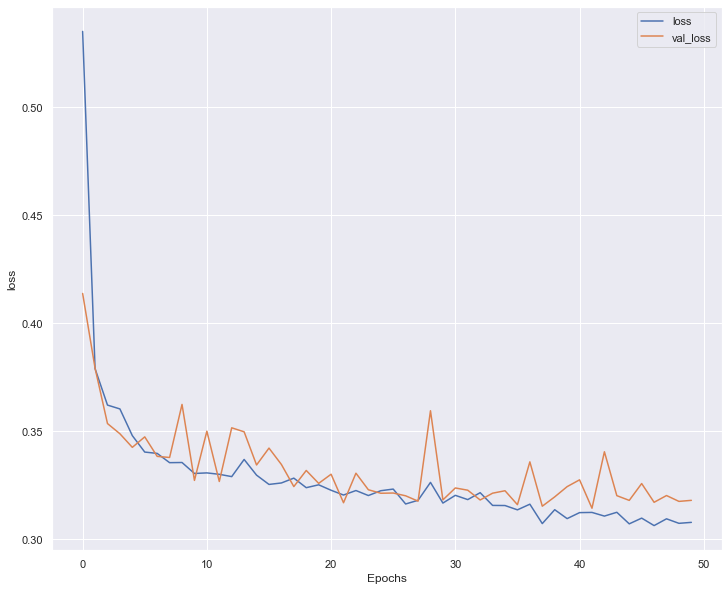

45/45 [==============================] - 0s 1ms/step


dense_layers :7
Model: "sequential_803"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10823 (Dense)         (None, 39)                1560      
                                                                 
 dense_10824 (Dense)         (None, 39)                1560      
                                                                 
 dense_10825 (Dense)         (None, 39)                1560      
                                                                 
 dense_10826 (Dense)         (None, 39)                1560      
                                                                 
 dense_10827 (Dense)         (None, 39)                1560      
                                                                 
 dense_10828 (Dense)         (None, 39)                1560      
                                                                 
 dense_10829 (Dense)         (None, 

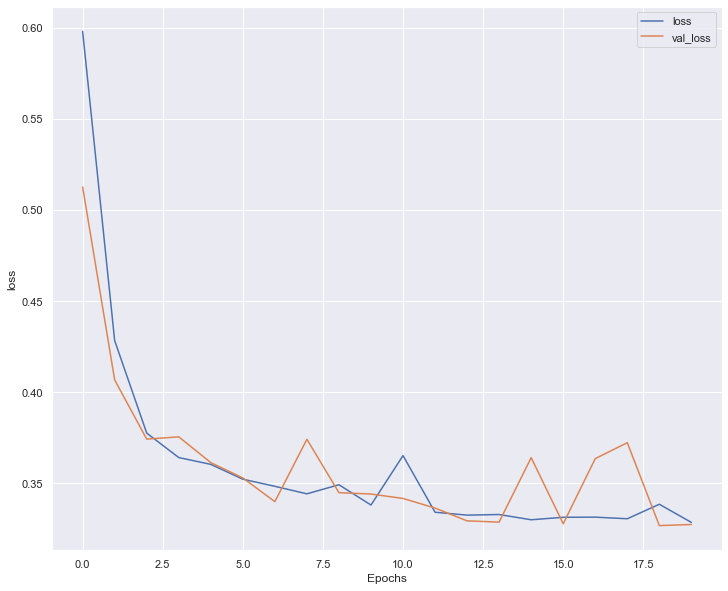

45/45 [==============================] - 0s 1ms/step


dense_layers :7
Model: "sequential_804"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10831 (Dense)         (None, 39)                1560      
                                                                 
 dense_10832 (Dense)         (None, 39)                1560      
                                                                 
 dense_10833 (Dense)         (None, 39)                1560      
                                                                 
 dense_10834 (Dense)         (None, 39)                1560      
                                                                 
 dense_10835 (Dense)         (None, 39)                1560      
                                                                 
 dense_10836 (Dense)         (None, 39)                1560      
                                                                 
 dense_10837 (Dense)         (None, 

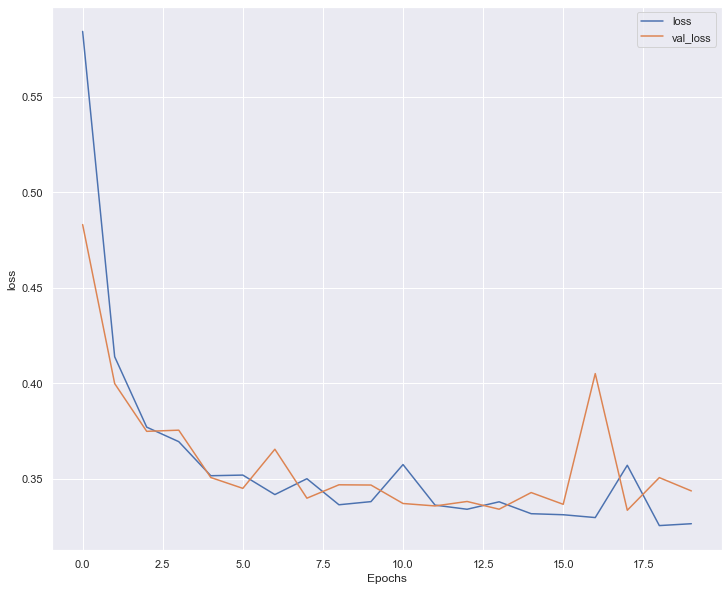

45/45 [==============================] - 0s 995us/step


dense_layers :7
Model: "sequential_805"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10839 (Dense)         (None, 39)                1560      
                                                                 
 dense_10840 (Dense)         (None, 39)                1560      
                                                                 
 dense_10841 (Dense)         (None, 39)                1560      
                                                                 
 dense_10842 (Dense)         (None, 39)                1560      
                                                                 
 dense_10843 (Dense)         (None, 39)                1560      
                                                                 
 dense_10844 (Dense)         (None, 39)                1560      
                                                                 
 dense_10845 (Dense)         (None, 

Epoch 31/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3232 - accuracy: 0.8429 - precision: 0.2714 - recall: 0.9905 - val_loss: 0.3311 - val_accuracy: 0.8368 - val_precision: 0.2894 - val_recall: 1.0000
Epoch 32/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3159 - accuracy: 0.8435 - precision: 0.2807 - recall: 1.0000 - val_loss: 0.3238 - val_accuracy: 0.8417 - val_precision: 0.2894 - val_recall: 1.0000
Epoch 33/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3142 - accuracy: 0.8441 - precision: 0.2714 - recall: 0.9905 - val_loss: 0.3247 - val_accuracy: 0.8459 - val_precision: 0.2894 - val_recall: 1.0000
Epoch 34/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3144 - accuracy: 0.8462 - precision: 0.2714 - recall: 0.9905 - val_loss: 0.3405 - val_accuracy: 0.8270 - val_precision: 0.2894 - val_recall: 1.0000
Epoch 35/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3148 - accuracy: 0.8369

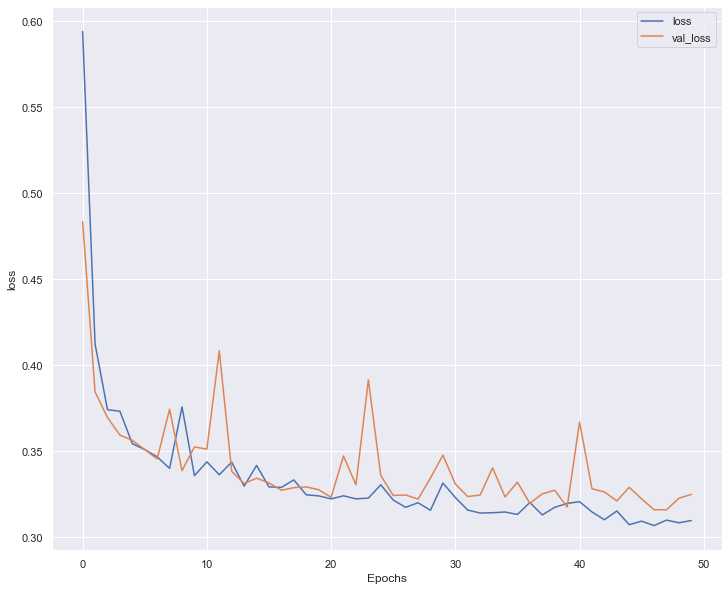

45/45 [==============================] - 0s 1ms/step


dense_layers :7
Model: "sequential_806"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10847 (Dense)         (None, 39)                1560      
                                                                 
 dense_10848 (Dense)         (None, 39)                1560      
                                                                 
 dense_10849 (Dense)         (None, 39)                1560      
                                                                 
 dense_10850 (Dense)         (None, 39)                1560      
                                                                 
 dense_10851 (Dense)         (None, 39)                1560      
                                                                 
 dense_10852 (Dense)         (None, 39)                1560      
                                                                 
 dense_10853 (Dense)         (None, 

Epoch 31/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3206 - accuracy: 0.8447 - precision: 0.2807 - recall: 1.0000 - val_loss: 0.3256 - val_accuracy: 0.8347 - val_precision: 0.2894 - val_recall: 1.0000
Epoch 32/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3212 - accuracy: 0.8432 - precision: 0.2714 - recall: 0.9905 - val_loss: 0.3288 - val_accuracy: 0.8354 - val_precision: 0.2894 - val_recall: 1.0000
Epoch 33/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3250 - accuracy: 0.8357 - precision: 0.2714 - recall: 0.9905 - val_loss: 0.3307 - val_accuracy: 0.8382 - val_precision: 0.2894 - val_recall: 1.0000
Epoch 34/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3256 - accuracy: 0.8360 - precision: 0.2714 - recall: 0.9905 - val_loss: 0.3289 - val_accuracy: 0.8431 - val_precision: 0.2894 - val_recall: 1.0000
Epoch 35/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3167 - accuracy: 0.8450

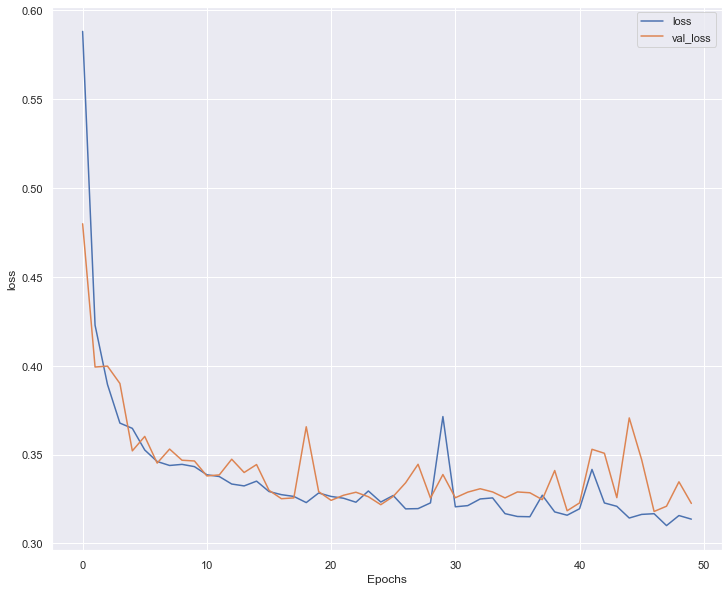

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_807"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10855 (Dense)         (None, 39)                1560      
                                                                 
 dense_10856 (Dense)         (None, 39)                1560      
                                                                 
 dense_10857 (Dense)         (None, 39)                1560      
                                                                 
 dense_10858 (Dense)         (None, 39)                1560      
                                                                 
 dense_10859 (Dense)         (None, 39)                1560      
                                                                 
 dense_10860 (Dense)         (None, 39)                1560      
                                                                 
 dense_10861 (Dense)         (None,

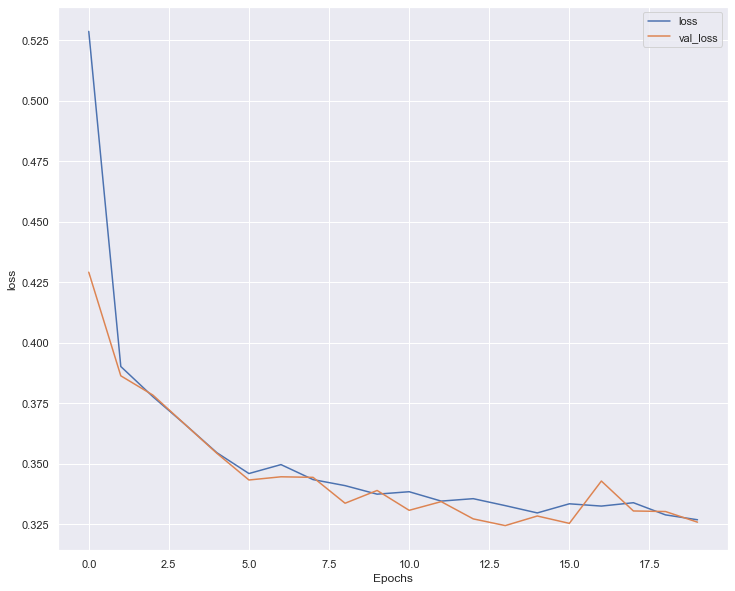

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_808"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10866 (Dense)         (None, 39)                1560      
                                                                 
 dense_10867 (Dense)         (None, 39)                1560      
                                                                 
 dense_10868 (Dense)         (None, 39)                1560      
                                                                 
 dense_10869 (Dense)         (None, 39)                1560      
                                                                 
 dense_10870 (Dense)         (None, 39)                1560      
                                                                 
 dense_10871 (Dense)         (None, 39)                1560      
                                                                 
 dense_10872 (Dense)         (None,

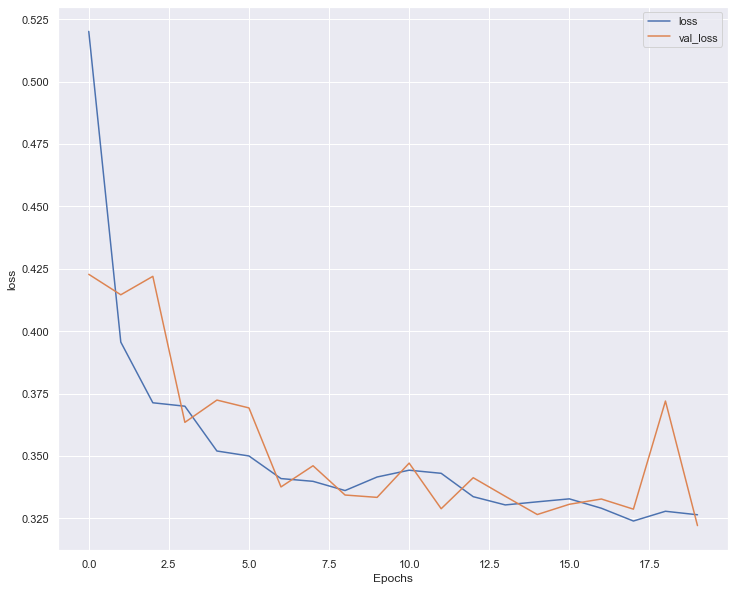

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_809"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10877 (Dense)         (None, 39)                1560      
                                                                 
 dense_10878 (Dense)         (None, 39)                1560      
                                                                 
 dense_10879 (Dense)         (None, 39)                1560      
                                                                 
 dense_10880 (Dense)         (None, 39)                1560      
                                                                 
 dense_10881 (Dense)         (None, 39)                1560      
                                                                 
 dense_10882 (Dense)         (None, 39)                1560      
                                                                 
 dense_10883 (Dense)         (None,

Epoch 29/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3178 - accuracy: 0.8405 - precision: 0.2772 - recall: 0.9904 - val_loss: 0.3286 - val_accuracy: 0.8410 - val_precision: 0.2924 - val_recall: 1.0000
Epoch 30/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3176 - accuracy: 0.8408 - precision: 0.2772 - recall: 1.0000 - val_loss: 0.3316 - val_accuracy: 0.8312 - val_precision: 0.2924 - val_recall: 1.0000
Epoch 31/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3224 - accuracy: 0.8396 - precision: 0.2727 - recall: 0.9952 - val_loss: 0.3215 - val_accuracy: 0.8445 - val_precision: 0.2924 - val_recall: 1.0000
Epoch 32/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3191 - accuracy: 0.8420 - precision: 0.2772 - recall: 0.9904 - val_loss: 0.3198 - val_accuracy: 0.8445 - val_precision: 0.2924 - val_recall: 1.0000
Epoch 33/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3149 - accuracy: 0.8426

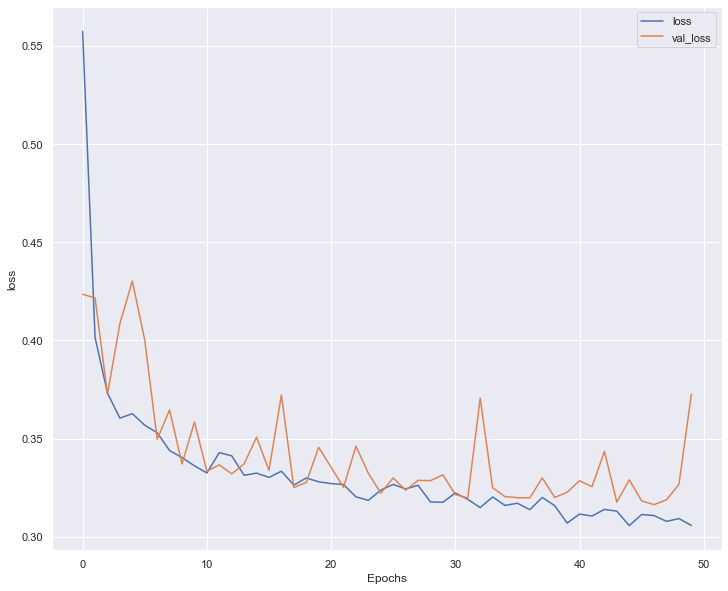

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_810"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10888 (Dense)         (None, 39)                1560      
                                                                 
 dense_10889 (Dense)         (None, 39)                1560      
                                                                 
 dense_10890 (Dense)         (None, 39)                1560      
                                                                 
 dense_10891 (Dense)         (None, 39)                1560      
                                                                 
 dense_10892 (Dense)         (None, 39)                1560      
                                                                 
 dense_10893 (Dense)         (None, 39)                1560      
                                                                 
 dense_10894 (Dense)         (None,

Epoch 29/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3180 - accuracy: 0.8414 - precision: 0.2727 - recall: 0.9856 - val_loss: 0.3413 - val_accuracy: 0.8459 - val_precision: 0.2924 - val_recall: 1.0000
Epoch 30/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3184 - accuracy: 0.8453 - precision: 0.2727 - recall: 0.9904 - val_loss: 0.3475 - val_accuracy: 0.8319 - val_precision: 0.2924 - val_recall: 1.0000
Epoch 31/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3150 - accuracy: 0.8474 - precision: 0.2772 - recall: 0.9952 - val_loss: 0.3229 - val_accuracy: 0.8424 - val_precision: 0.2924 - val_recall: 1.0000
Epoch 32/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3216 - accuracy: 0.8405 - precision: 0.2727 - recall: 0.9952 - val_loss: 0.3227 - val_accuracy: 0.8459 - val_precision: 0.2924 - val_recall: 1.0000
Epoch 33/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3146 - accuracy: 0.8462

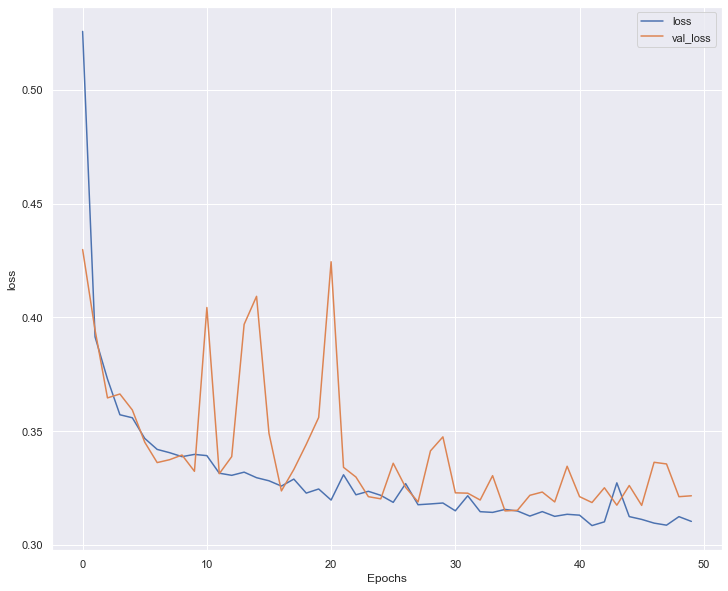

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_811"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10899 (Dense)         (None, 39)                1560      
                                                                 
 dense_10900 (Dense)         (None, 39)                1560      
                                                                 
 dense_10901 (Dense)         (None, 39)                1560      
                                                                 
 dense_10902 (Dense)         (None, 39)                1560      
                                                                 
 dense_10903 (Dense)         (None, 39)                1560      
                                                                 
 dense_10904 (Dense)         (None, 39)                1560      
                                                                 
 dense_10905 (Dense)         (None,

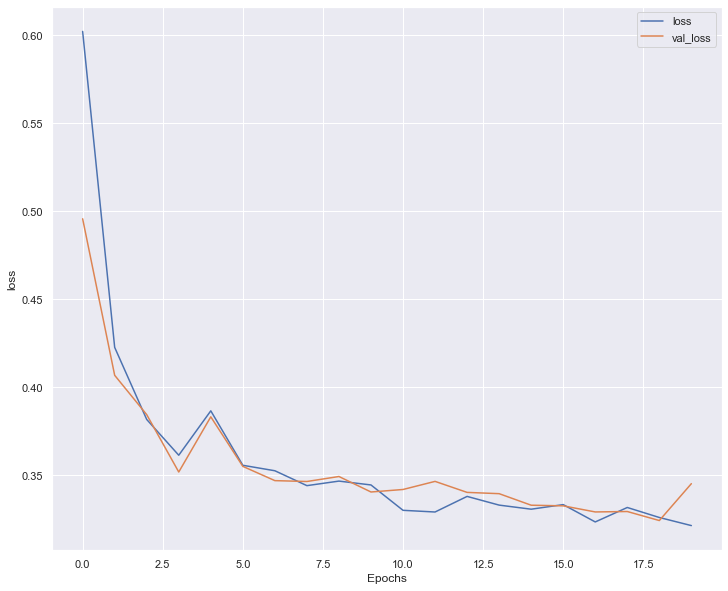

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_812"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10910 (Dense)         (None, 39)                1560      
                                                                 
 dense_10911 (Dense)         (None, 39)                1560      
                                                                 
 dense_10912 (Dense)         (None, 39)                1560      
                                                                 
 dense_10913 (Dense)         (None, 39)                1560      
                                                                 
 dense_10914 (Dense)         (None, 39)                1560      
                                                                 
 dense_10915 (Dense)         (None, 39)                1560      
                                                                 
 dense_10916 (Dense)         (None,

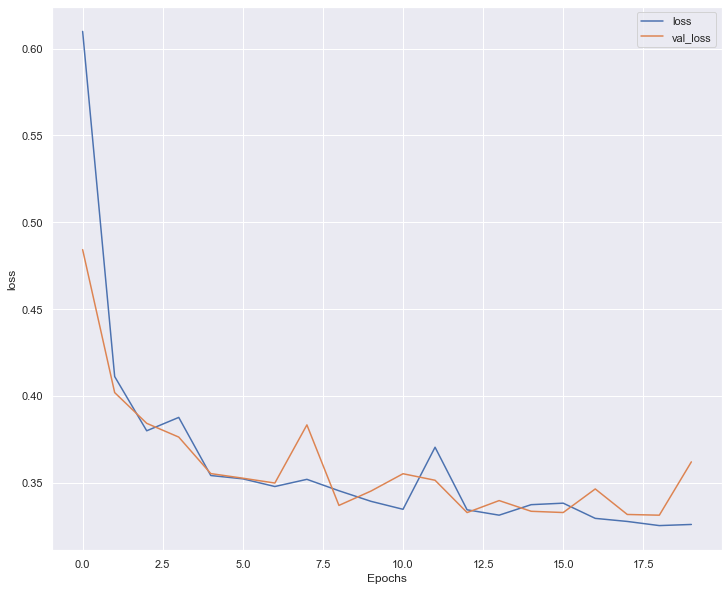

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_813"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10921 (Dense)         (None, 39)                1560      
                                                                 
 dense_10922 (Dense)         (None, 39)                1560      
                                                                 
 dense_10923 (Dense)         (None, 39)                1560      
                                                                 
 dense_10924 (Dense)         (None, 39)                1560      
                                                                 
 dense_10925 (Dense)         (None, 39)                1560      
                                                                 
 dense_10926 (Dense)         (None, 39)                1560      
                                                                 
 dense_10927 (Dense)         (None,

Epoch 29/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3262 - accuracy: 0.8369 - precision: 0.2714 - recall: 0.9905 - val_loss: 0.3279 - val_accuracy: 0.8375 - val_precision: 0.2894 - val_recall: 1.0000
Epoch 30/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3200 - accuracy: 0.8435 - precision: 0.2714 - recall: 0.9905 - val_loss: 0.3234 - val_accuracy: 0.8396 - val_precision: 0.2894 - val_recall: 1.0000
Epoch 31/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3171 - accuracy: 0.8384 - precision: 0.2714 - recall: 0.9905 - val_loss: 0.3458 - val_accuracy: 0.8396 - val_precision: 0.2894 - val_recall: 1.0000
Epoch 32/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3208 - accuracy: 0.8402 - precision: 0.2714 - recall: 0.9905 - val_loss: 0.3201 - val_accuracy: 0.8382 - val_precision: 0.2894 - val_recall: 1.0000
Epoch 33/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3193 - accuracy: 0.8375

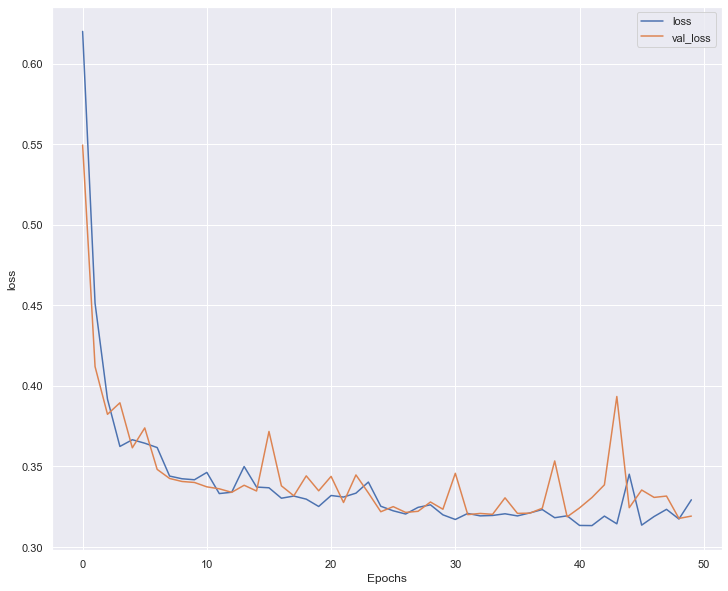

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_814"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10932 (Dense)         (None, 39)                1560      
                                                                 
 dense_10933 (Dense)         (None, 39)                1560      
                                                                 
 dense_10934 (Dense)         (None, 39)                1560      
                                                                 
 dense_10935 (Dense)         (None, 39)                1560      
                                                                 
 dense_10936 (Dense)         (None, 39)                1560      
                                                                 
 dense_10937 (Dense)         (None, 39)                1560      
                                                                 
 dense_10938 (Dense)         (None,

Epoch 29/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3244 - accuracy: 0.8357 - precision: 0.2714 - recall: 0.9905 - val_loss: 0.3374 - val_accuracy: 0.8347 - val_precision: 0.2894 - val_recall: 1.0000
Epoch 30/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3224 - accuracy: 0.8417 - precision: 0.2714 - recall: 0.9905 - val_loss: 0.3226 - val_accuracy: 0.8382 - val_precision: 0.2894 - val_recall: 1.0000
Epoch 31/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3203 - accuracy: 0.8402 - precision: 0.2807 - recall: 1.0000 - val_loss: 0.3263 - val_accuracy: 0.8445 - val_precision: 0.2894 - val_recall: 1.0000
Epoch 32/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3229 - accuracy: 0.8405 - precision: 0.2807 - recall: 1.0000 - val_loss: 0.3240 - val_accuracy: 0.8431 - val_precision: 0.2894 - val_recall: 1.0000
Epoch 33/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3193 - accuracy: 0.8438

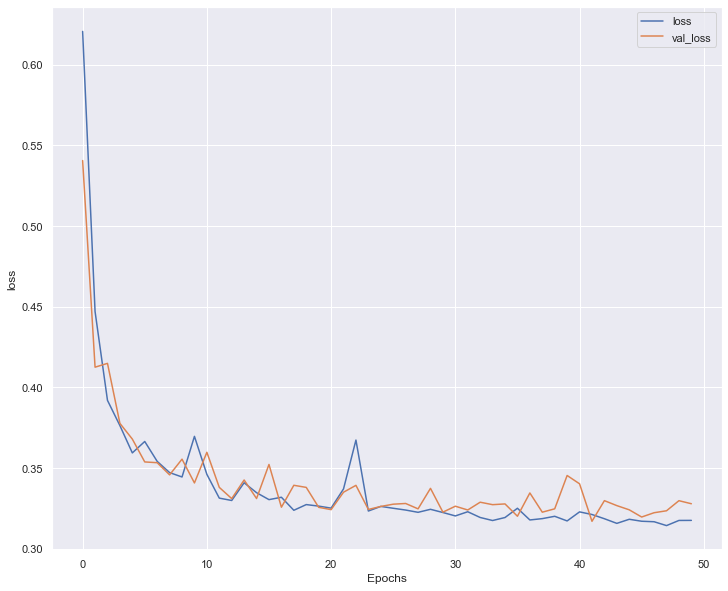

45/45 [==============================] - 0s 1ms/step


In [166]:
param_grid = dict(dense_layers = dense_layers
                    , batch_size = batch_size
                    , epochs = epochs
                   , dense_dropout = dense_dropout
                 )

keys = param_grid.keys()
values = (param_grid[key] for key in keys)
param_grid = [dict(zip(keys, param_grid)) for param_grid in itertools.product(*values)]

print('Proposed ' + str(len(param_grid)) + ' models')

for j in range(0, len(param_grid)):
    
    dense_layers = param_grid[j].get("dense_layers")
    batch_size = param_grid[j].get("batch_size")
    epochs = param_grid[j].get("epochs")
    dense_dropout = param_grid[j].get("dense_dropout")
    
    model = make_model_Lineal(dense_layers = dense_layers
                   , dense_dropout = dense_dropout
                   , verbose = 1)
    print('batch_size :' + str(batch_size))
    
    history = model.fit(train_features,
                        train_labels,
                        batch_size = batch_size,
                        epochs = epochs,
                        validation_data = (val_features, val_labels), 
                        verbose = 1)
    
    plot_history_train(history, 'loss')
    
    # Calculate validation metrics
    y_val_pred = model.predict(val_features)
    y_val_pred = np.argmax(y_val_pred, axis=1)
    val_conf_mat = confusion_matrix(val_labels, y_val_pred)
    tn, fp, fn, tp = val_conf_mat.ravel()
    val_sensitivity = tp / (tp + fn)
    val_specificity = tn / (tn + fp)
    val_f1_score = f1_score(val_labels, y_val_pred, average='macro')
    
    # Update results
    val_loss = pd.DataFrame.from_dict(history.history)['val_loss'].iloc[-1]
    val_accuracy = pd.DataFrame.from_dict(history.history)['val_accuracy'].iloc[-1]
    loss = pd.DataFrame.from_dict(history.history)['loss'].iloc[-1]
    accuracy = pd.DataFrame.from_dict(history.history)['accuracy'].iloc[-1]
    param_grid[j].update({"loss": loss})
    param_grid[j].update({"accuracy": accuracy})
    param_grid[j].update({"val_loss": val_loss})
    param_grid[j].update({"val_accuracy": val_accuracy})
    param_grid[j].update({"val_sensitivity": val_sensitivity})
    param_grid[j].update({"val_specificity": val_specificity})
    param_grid[j].update({"val_f1_score": val_f1_score})

results_Lineal_Ajuste= pd.DataFrame(param_grid)

In [167]:
results_Lineal_Ajuste.sort_values(['val_loss'],ascending = True)

,dense_layers,batch_size,epochs,dense_dropout,loss,accuracy,val_loss,val_accuracy,val_sensitivity,val_specificity,val_f1_score
6,5,32,50,0.0,0.315286,0.839892,0.315480,0.840336,0.703883,0.895669,0.803247
3,5,16,50,0.3,0.308401,0.848002,0.317069,0.845238,0.730583,0.891732,0.811382
11,7,16,50,0.3,0.307728,0.843797,0.317930,0.840336,0.645631,0.919291,0.795611
22,10,32,50,0.0,0.329306,0.841093,0.319186,0.843137,0.686893,0.906496,0.804017
0,5,16,20,0.0,0.324793,0.837789,0.319226,0.842437,0.747573,0.880906,0.810399
7,5,32,50,0.3,0.312251,0.838090,0.319481,0.845238,0.711165,0.899606,0.809144
10,7,16,50,0.0,0.310070,0.846500,0.321245,0.844538,0.740291,0.886811,0.811745
19,10,16,50,0.3,0.310323,0.847702,0.321585,0.839636,0.716019,0.889764,0.803985
17,10,16,20,0.3,0.326443,0.839291,0.322110,0.846639,0.662621,0.921260,0.804495
15,7,32,50,0.3,0.313616,0.843196,0.322466,0.841737,0.677184,0.908465,0.801331


Gracias a la tabla anterior se puede extraer la información que los mejores hiper parámetros del grid search de la <b>arquitectura lineal modificando los valores de batch size y dense layers a la baja</b> se han conseguido en la <i>6º</i> red neuronal:
* Dense Layers: 5

* Batch Size: 32

* Epochs: 50

* Dense Dropout: 0%

obteniendo unas métricas bastante favorables en test:

* Loss: 0.317069
				
* Accuracy: 0.845238
				
* Sensitivity: 0.730583

* Specificity: 0.891732

* F1-score: 0.811382

<b>Comparación de los score obtenidos del modelo lineal referentes y disminuyendo los valores de los hiper parámetros: batch size y dense layers.</b>

<table>
    
  <tr>
    <th>Modelo</th>
    <th>Loss</th>
    <th>Accuracy</th>
    <th>Sensibilidad</th>
    <th>Especificidad</th>
    <th>F1-Score</th>
  </tr>

  <tr>
    <td>Modelo lineal</td>
    <td>0.3134</td>
    <td>0.8487</td>
    <td>0.7237</td>
    <td>0.8941</td>
    <td>0.8073</td>
  </tr>
    
  <tr>
    <td>Modelo Lineal - Disminuyendo hiper parámetros</td>
    <td>0.3171</td>
    <td>0.8452</td>
    <td>0.7306</td>
    <td>0.8917</td>
    <td>0.8114</td>
  </tr>
</table>


Esta comparación es extramadamente similar, como cabría esperar. Disminuyendo el número de capas densas y los valores del tamaño del lote, se consigue igual el modelo más complejo e incluso se mejora la Sensibilidad, por lo que muy buena señal.

Se ha creado un modelo más simple y versátil, obtiendo los mismos score que un modelo complejo, por lo que la decisión está clara. Se han cumplido las expectativas.

La elección del modelo óptimo será el <b>Modelo Lineal aplicando una disminución de los hiper parámetros</b>. Esta decisión es totalmente subjetiva.

<b>Conclusión</b>

Una vez, comparados los resultados con la arquitectura lineal de base y las modificaciones realizadas en la regularización, función de activación y pérdida y disminución de hiper parámetros: batch size y dense layers, se puede concluir que el modelo óptimi cuyo resultados son los mejores extraidos tiene la siguiente arquitectura:

* Dense Layers: 5

* Batch Size: 32

* Epochs: 50

* Dense Dropout: 0%

obteniendo unas métricas bastante favorables en test:

* Loss: 0.317069
				
* Accuracy: 0.845238
				
* Sensitivity: 0.730583

* Specificity: 0.891732

* F1-score: 0.811382

<center><b>8 - REALIZAR UNA SELECCIÓN DE VARIABLES Y APLICAR LA RED NEURONAL ÓPTIMA ANTERIOR Y COMPARAR LOS RESULTADOS</b></center>

Como se vio en la matriz de correlaciones del apartado 1, existen variables que están altamente correlacionadas como es el caso de <i>RedGoldDiff</i> y <i>BlueTotalGold</i>, entre otras muchas. Es por ese motivo que se van a aplicar dos técnicas distintas de selección de variables para ve si se consigue mejorar el rendimiento y las score del modelo lineal con <i>5</i> capas densas, <i>32</i> de batch size, <i>0%</i> de drop out y <i>50</i> épocas.


1 - <b>VIF (Variance Inflation Factor)</b> es una métrica utilizada en el análisis de regresión para evaluar la multicolinealidad entre variables predictoras. Se calcula para cada variable predictora en un modelo de regresión lineal y mide cuánto se infla la varianza del coeficiente de regresión debido a la correlación con otras variables predictoras. Un VIF mayor a 1 indica una correlación positiva entre la variable y otras variables predictoras, y valores muy altos (por ejemplo, superiores a 5 o 10) pueden indicar una alta multicolinealidad.

2 - <b>Random Forest</b> es un algoritmo de aprendizaje automático que se basa en la idea de combinar múltiples árboles de decisión para realizar predicciones más precisas y robustas. Este utiliza un enfoque de "ensemble" (conjunto) de árboles de decisión, donde cada árbol se entrena de forma independiente en una muestra aleatoria del conjunto de datos. Cada árbol se entrena utilizando una técnica llamada "bagging" (ensacado), que implica muestrear aleatoriamente los datos con reemplazo para crear múltiples conjuntos de datos de entrenamiento.

Se ha elegido este modelo de machine learning ya que realiza un manejo automático de la importancia de las variables: proporciona una medida de la importancia relativa de cada variable en el modelo. Esto se basa en la capacidad predictiva de las variables al realizar divisiones en los árboles de decisión y la reducción de la impureza en el conjunto de datos.

<center><b>Preparación de los datos originales para aplicar las técnicas de selección de variables</b></center>

<b>Lectura de datos</b>

In [168]:
df= pd.read_csv('/Users/raulartiguesfemenia/Desktop/Deep Learning/Entrega1/high_diamond_ranked_10min.csv')
df.head(5)

,gameId,blueWins,blueWardsPlaced,blueWardsDestroyed,blueFirstBlood,blueKills,blueDeaths,blueAssists,blueEliteMonsters,blueDragons,...,redTowersDestroyed,redTotalGold,redAvgLevel,redTotalExperience,redTotalMinionsKilled,redTotalJungleMinionsKilled,redGoldDiff,redExperienceDiff,redCSPerMin,redGoldPerMin
0,4519157822,0,28,2,1,9,6,11,0,0,...,0,16567,6.8,17047,197,55,-643,8,19.7,1656.7
1,4523371949,0,12,1,0,5,5,5,0,0,...,1,17620,6.8,17438,240,52,2908,1173,24.0,1762.0
2,4521474530,0,15,0,0,7,11,4,1,1,...,0,17285,6.8,17254,203,28,1172,1033,20.3,1728.5
3,4524384067,0,43,1,0,4,5,5,1,0,...,0,16478,7.0,17961,235,47,1321,7,23.5,1647.8
4,4436033771,0,75,4,0,6,6,6,0,0,...,0,17404,7.0,18313,225,67,1004,-230,22.5,1740.4


<b>Cambio del nombre de la variable objetivo</b>

In [169]:
df = df.rename(columns={'blueWins': 'Target'})

<b>Eliminación de valores atípicos</b>

In [170]:
new_df = df.copy()

for col in new_df.columns[2:]:
    outlier_idx = get_outlier(df=new_df, column=col, weight=1.5)
    
    new_df.drop(outlier_idx, axis=0, inplace=True)

print('Removed outliers: %d' % (df.shape[0] - new_df.shape[0]))

Removed outliers: 3082


In [171]:
print(df.shape)
print(new_df.shape)

(9879, 40)
(6797, 40)


<center><b>VIF (VARIANCE INFLATION FACTOR)</b></center>

In [173]:
# Crear una matriz de variables predictoras
X = new_df.drop('Target', axis=1)  # Excluir la variable objetivo si está presente

# Agregar una constante para estimar el intercepto en el modelo de regresión
X = sm.add_constant(X)

# Calcular los valores de VIF
vif = pd.DataFrame()
vif["Variable"] = X.columns
vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Mostrar los resultados
print(vif)

divide by zero encountered in double_scalars


                        Variable       VIF
0                          const       inf
1                         gameId  1.010089
2                blueWardsPlaced  1.031292
3             blueWardsDestroyed  1.068006
4                 blueFirstBlood       inf
5                      blueKills       inf
6                     blueDeaths       inf
7                    blueAssists  3.568440
8              blueEliteMonsters       inf
9                    blueDragons       inf
10                   blueHeralds       inf
11           blueTowersDestroyed  1.256250
12                 blueTotalGold       inf
13                  blueAvgLevel  5.135810
14           blueTotalExperience       inf
15        blueTotalMinionsKilled       inf
16  blueTotalJungleMinionsKilled  1.824963
17                  blueGoldDiff       inf
18            blueExperienceDiff       inf
19                  blueCSPerMin       inf
20                blueGoldPerMin       inf
21                redWardsPlaced  1.044512
22         

Cuando se obtiene valores infinitos para el VIF de ciertas variables, es un indicio de alta multicolinealidad. Esto significa que existe una fuerte correlación lineal perfecta o casi perfecta entre esas variables y otras en el conjunto de datos.

En el contexto del cálculo del VIF, si una variable tiene una correlación perfecta con otras variables predictoras, el denominador en la fórmula del VIF se aproxima a cero, lo que resulta en un valor de VIF infinito.

Según se observa en el cálculo de VIF habría que eliminar <i>27</i> de un total de 40, es decir, el 67.5% de atributos se eliminarian si alfinal se decide aplicar esta técnica como la definitiva para la toma de decisión de selección de variables.

<center><b>RANDOM FOREST</b></center>

In [174]:
# Dividir los datos en variables predictoras y variable objetivo
X = new_df.drop('Target', axis=1)  # Variables predictoras
y = new_df['Target']  # Variable objetivo

# Crear el modelo de Random Forest
rf = RandomForestRegressor()

# Ajustar el modelo a los datos
rf.fit(X, y)

# Obtener la importancia de las variables
importances = rf.feature_importances_

# Crear un DataFrame para visualizar la importancia de las variables
feature_importances = pd.DataFrame({'Variable': X.columns, 'Importancia': importances})
feature_importances = feature_importances.sort_values('Importancia', ascending=False)

# Mostrar los resultados
print(feature_importances)

                        Variable  Importancia
16                  blueGoldDiff     0.134516
35                   redGoldDiff     0.120100
9                    blueHeralds     0.080215
20                redWardsPlaced     0.079328
1                blueWardsPlaced     0.077781
28                    redHeralds     0.049054
0                         gameId     0.035927
32            redTotalExperience     0.032098
13           blueTotalExperience     0.030033
15  blueTotalJungleMinionsKilled     0.026929
36             redExperienceDiff     0.026721
17            blueExperienceDiff     0.025727
34   redTotalJungleMinionsKilled     0.024355
6                    blueAssists     0.021526
33         redTotalMinionsKilled     0.017705
30                  redTotalGold     0.016865
37                   redCSPerMin     0.016858
25                    redAssists     0.016551
38                 redGoldPerMin     0.016345
18                  blueCSPerMin     0.015582
2             blueWardsDestroyed  

A continuación se imprimen aquellas variables que tienen un peso de <b>importancia mayor a 0.02</b>*

*Nota: El Data Scientist considera que un atributo con una importancia mayor a 0.02 es significativa por lo que se seleccionará para el conjunto de datos

In [181]:
# Filtrar las variables con importancia superior a 0.02
important_variables = feature_importances[feature_importances['Importancia'] > 0.02]

# Crear un nuevo DataFrame con las variables y su importancia
variables_importance = important_variables[['Variable', 'Importancia']].copy()

# Mostrar el nuevo DataFrame
print(variables_importance)

                        Variable  Importancia
16                  blueGoldDiff     0.134516
35                   redGoldDiff     0.120100
9                    blueHeralds     0.080215
20                redWardsPlaced     0.079328
1                blueWardsPlaced     0.077781
28                    redHeralds     0.049054
0                         gameId     0.035927
32            redTotalExperience     0.032098
13           blueTotalExperience     0.030033
15  blueTotalJungleMinionsKilled     0.026929
36             redExperienceDiff     0.026721
17            blueExperienceDiff     0.025727
34   redTotalJungleMinionsKilled     0.024355
6                    blueAssists     0.021526


Las variables que identifica <b>Random Forest</b> como importantes tienen sentido desde un punto de vista de negocio, ya que la gran mayoria son las diferencias entre distintas métricas del juego <i>LOL</i> respecto el equipo Azul y Rojo.

Las dos variables más significativas en el conjunto de datos original son: <i>blueGoldDiff</i> y <i>redGoldDiff</i>, es decir, las diferencias entre los dos equipos.

<b>Conclusión</b>

A la hora de comparar los resultados de la importancia de las variables predictoras, se tiene un claro vencedor. <b>Random Forest</b> aporta mayor información y mejores resultados que <b>VIF</b> desde el punto de vista de negocio, obteniendo 14 variables predictoras como significativas e importantes para clasificar las victorias del equipo Azul y Rojo, etiquetandose en 0 y 1, respectivamente.

<b>Creación del nuevo data set</b>

In [184]:
# Seleccionar las columnas deseadas del dataset original
selected_columns = ['Target', 'blueGoldDiff', 'redGoldDiff', 'blueHeralds',
                    'redWardsPlaced', 'blueWardsPlaced', 'redHeralds', 'gameId',
                    'redTotalExperience', 'blueTotalExperience', 'blueTotalJungleMinionsKilled',
                    'redExperienceDiff', 'blueExperienceDiff', 'redTotalJungleMinionsKilled',
                    'blueAssists']

# Crear el nuevo dataset
new_dataset = new_df[selected_columns].copy()
print("Las columnas del nuevo data frame son:", new_dataset.columns)
print("El nuevo dimensionamiento del conjunto de datos es:", new_dataset.shape)

Las columnas del nuevo data frame son: Index(['Target', 'blueGoldDiff', 'redGoldDiff', 'blueHeralds',
       'redWardsPlaced', 'blueWardsPlaced', 'redHeralds', 'gameId',
       'redTotalExperience', 'blueTotalExperience',
       'blueTotalJungleMinionsKilled', 'redExperienceDiff',
       'blueExperienceDiff', 'redTotalJungleMinionsKilled', 'blueAssists'],
      dtype='object')
El nuevo dimensionamiento del conjunto de datos es: (6797, 15)


<b>Estandarización de las variables predictoras del nuevo conjunto de datos</b>

In [185]:
scaler_dict = {}
# data normalization
for col_name in new_dataset.columns.difference(['Target']):
    if(new_dataset[col_name].dtype == 'int64') or (new_dataset[col_name].dtype == 'float64'):
        print(col_name + ' ' + str(new_dataset[col_name].dtype))
        scaler = MinMaxScaler(feature_range=(0, 1))
        scaler = scaler.fit(new_dataset[col_name].values.reshape(-1, 1))
        new_dataset[col_name] = scaler.transform(new_dataset[col_name].values.reshape(-1, 1))
        scaler_dict[col_name] = scaler
scaler_dict

blueAssists int64
blueExperienceDiff int64
blueGoldDiff int64
blueHeralds int64
blueTotalExperience int64
blueTotalJungleMinionsKilled int64
blueWardsPlaced int64
gameId int64
redExperienceDiff int64
redGoldDiff int64
redHeralds int64
redTotalExperience int64
redTotalJungleMinionsKilled int64
redWardsPlaced int64


{'blueAssists': MinMaxScaler(),
 'blueExperienceDiff': MinMaxScaler(),
 'blueGoldDiff': MinMaxScaler(),
 'blueHeralds': MinMaxScaler(),
 'blueTotalExperience': MinMaxScaler(),
 'blueTotalJungleMinionsKilled': MinMaxScaler(),
 'blueWardsPlaced': MinMaxScaler(),
 'gameId': MinMaxScaler(),
 'redExperienceDiff': MinMaxScaler(),
 'redGoldDiff': MinMaxScaler(),
 'redHeralds': MinMaxScaler(),
 'redTotalExperience': MinMaxScaler(),
 'redTotalJungleMinionsKilled': MinMaxScaler(),
 'redWardsPlaced': MinMaxScaler()}

<b>Creación del cojunto de datos Train, Test y Validación</b>

In [187]:
# parametrization
test_size = 0.3
val_size = 0.3
epochs = 200
batch_size = 512

In [188]:
new_dataset= new_dataset.sample(frac=1)
train_df, test_df = train_test_split(new_dataset
                                     , test_size = test_size, random_state=0)
train_df, val_df = train_test_split(train_df
                                    , test_size = val_size, random_state=0)

# Form np arrays of labels and features.
train_features = np.array(train_df[train_df.columns.difference(['Target'])])
val_features = np.array(val_df[val_df.columns.difference(['Target'])])
test_features = np.array(test_df[test_df.columns.difference(['Target'])])

train_labels = np.array(train_df[['Target']])
val_labels = np.array(val_df[['Target']])
test_labels = np.array(test_df[['Target']])

input_len = train_features.shape[1]

shap_test_df = test_df.copy(deep = True)

In [189]:
print("La longitud del Train es:", len(train_features),"registros")
print("La longitud de la Validación es:", len(val_features),"registros")
print("La longitud del Test es:", len(test_features),"registros")

La longitud del Train es: 3329 registros
La longitud de la Validación es: 1428 registros
La longitud del Test es: 2040 registros


<center><b>RED NEURONAL LINEAL CON LA IMPLEMENTACIÓN DE REDUCCIÓN DE LA DIMENSIONALIDAD</b></center>

A continuación se va a utilizar la misma arquitectura de la red neuronal que en el caso anterior, <b>make_model_Lineal</b> y con <b>los mismos hiper parámetros</b> que se han elegido como los óptimos.

In [223]:
batch_size = [16,32]
epochs = [20,50]
dense_layers = [5,7,10]
dense_dropout = [0.0,0.3]

Proposed 24 models
dense_layers :5
Model: "sequential_1055"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_12943 (Dense)         (None, 14)                210       
                                                                 
 dense_12944 (Dense)         (None, 14)                210       
                                                                 
 dense_12945 (Dense)         (None, 14)                210       
                                                                 
 dense_12946 (Dense)         (None, 14)                210       
                                                                 
 dense_12947 (Dense)         (None, 14)                210       
                                                                 
 dense_12948 (Dense)         (None, 2)                 30        
                                                                 
Total params: 1,

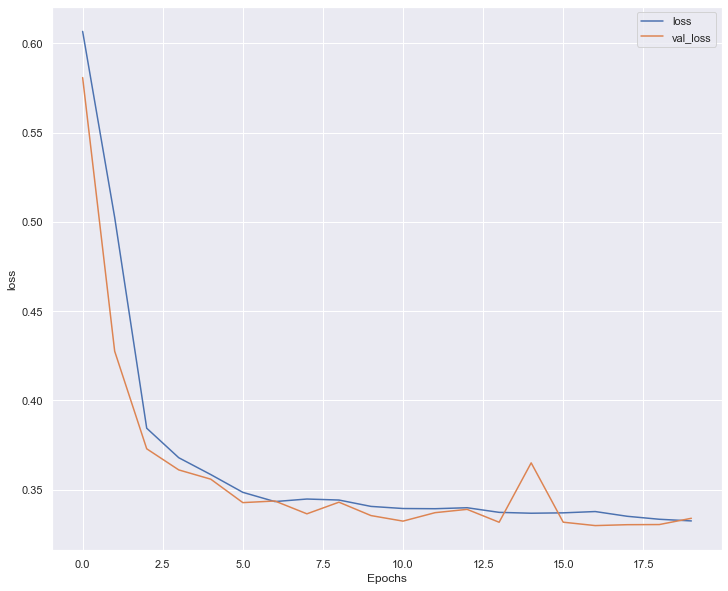

45/45 [==============================] - 0s 1ms/step


dense_layers :5
Model: "sequential_1056"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_12949 (Dense)         (None, 14)                210       
                                                                 
 dense_12950 (Dense)         (None, 14)                210       
                                                                 
 dense_12951 (Dense)         (None, 14)                210       
                                                                 
 dense_12952 (Dense)         (None, 14)                210       
                                                                 
 dense_12953 (Dense)         (None, 14)                210       
                                                                 
 dense_12954 (Dense)         (None, 2)                 30        
                                                                 
Total params: 1,080
Trainable param

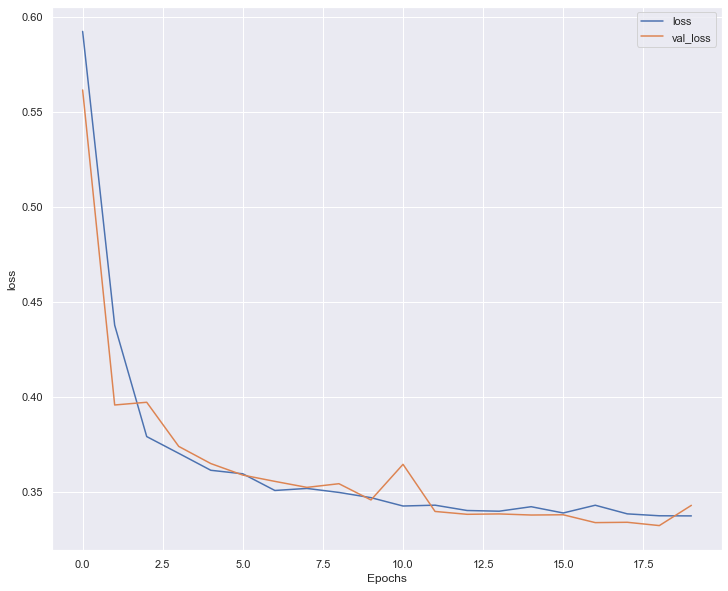

45/45 [==============================] - 0s 1ms/step


dense_layers :5
Model: "sequential_1057"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_12955 (Dense)         (None, 14)                210       
                                                                 
 dense_12956 (Dense)         (None, 14)                210       
                                                                 
 dense_12957 (Dense)         (None, 14)                210       
                                                                 
 dense_12958 (Dense)         (None, 14)                210       
                                                                 
 dense_12959 (Dense)         (None, 14)                210       
                                                                 
 dense_12960 (Dense)         (None, 2)                 30        
                                                                 
Total params: 1,080
Trainable param

Epoch 32/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3342 - accuracy: 0.8333 - precision: 0.2685 - recall: 0.9856 - val_loss: 0.3295 - val_accuracy: 0.8431 - val_precision: 0.2972 - val_recall: 0.9889
Epoch 33/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3344 - accuracy: 0.8303 - precision: 0.2685 - recall: 0.9856 - val_loss: 0.3296 - val_accuracy: 0.8417 - val_precision: 0.2972 - val_recall: 0.9889
Epoch 34/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3332 - accuracy: 0.8336 - precision: 0.2685 - recall: 0.9952 - val_loss: 0.3334 - val_accuracy: 0.8354 - val_precision: 0.2972 - val_recall: 0.9889
Epoch 35/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3339 - accuracy: 0.8351 - precision: 0.2730 - recall: 1.0000 - val_loss: 0.3278 - val_accuracy: 0.8452 - val_precision: 0.2972 - val_recall: 0.9889
Epoch 36/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3345 - accuracy: 0.8303

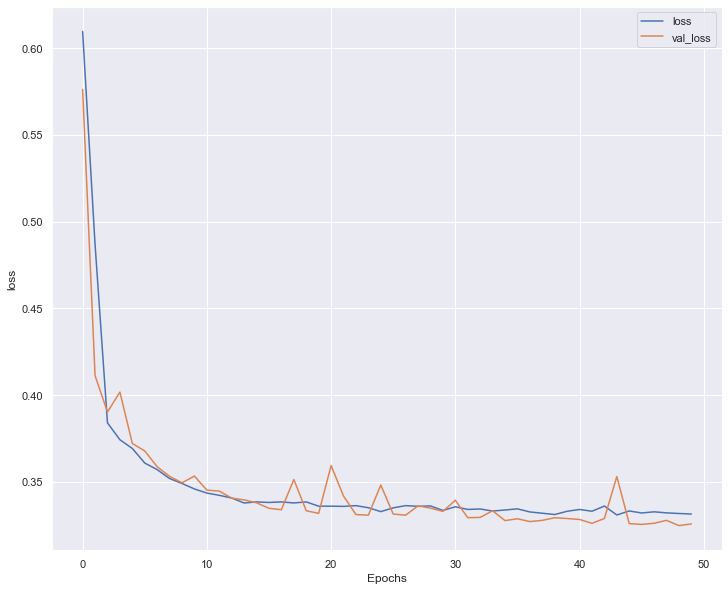

45/45 [==============================] - 0s 1ms/step


dense_layers :5
Model: "sequential_1058"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_12961 (Dense)         (None, 14)                210       
                                                                 
 dense_12962 (Dense)         (None, 14)                210       
                                                                 
 dense_12963 (Dense)         (None, 14)                210       
                                                                 
 dense_12964 (Dense)         (None, 14)                210       
                                                                 
 dense_12965 (Dense)         (None, 14)                210       
                                                                 
 dense_12966 (Dense)         (None, 2)                 30        
                                                                 
Total params: 1,080
Trainable param

Epoch 32/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3339 - accuracy: 0.8357 - precision: 0.2685 - recall: 0.9856 - val_loss: 0.3401 - val_accuracy: 0.8305 - val_precision: 0.2972 - val_recall: 0.9889
Epoch 33/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3351 - accuracy: 0.8321 - precision: 0.2730 - recall: 1.0000 - val_loss: 0.3288 - val_accuracy: 0.8445 - val_precision: 0.2972 - val_recall: 0.9889
Epoch 34/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3335 - accuracy: 0.8297 - precision: 0.2685 - recall: 0.9904 - val_loss: 0.3293 - val_accuracy: 0.8431 - val_precision: 0.2972 - val_recall: 0.9889
Epoch 35/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3352 - accuracy: 0.8249 - precision: 0.2685 - recall: 0.9856 - val_loss: 0.3414 - val_accuracy: 0.8340 - val_precision: 0.2972 - val_recall: 0.9889
Epoch 36/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3340 - accuracy: 0.8297

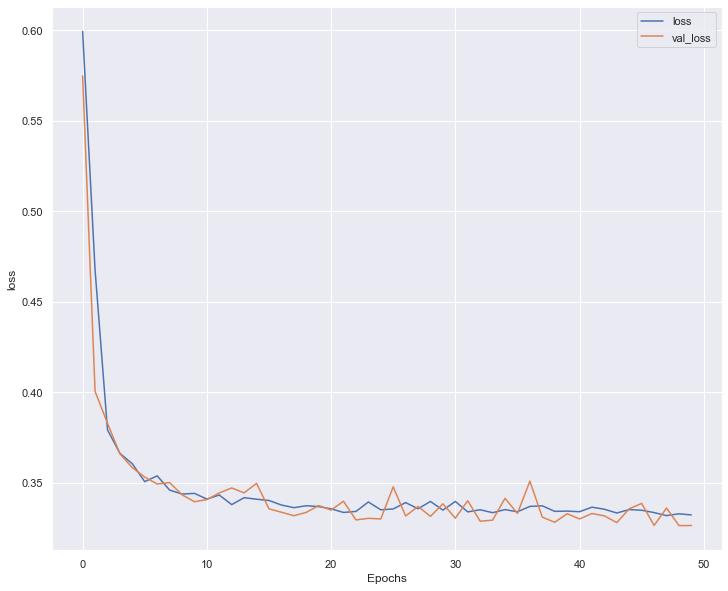

45/45 [==============================] - 0s 1ms/step


dense_layers :5
Model: "sequential_1059"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_12967 (Dense)         (None, 14)                210       
                                                                 
 dense_12968 (Dense)         (None, 14)                210       
                                                                 
 dense_12969 (Dense)         (None, 14)                210       
                                                                 
 dense_12970 (Dense)         (None, 14)                210       
                                                                 
 dense_12971 (Dense)         (None, 14)                210       
                                                                 
 dense_12972 (Dense)         (None, 2)                 30        
                                                                 
Total params: 1,080
Trainable param

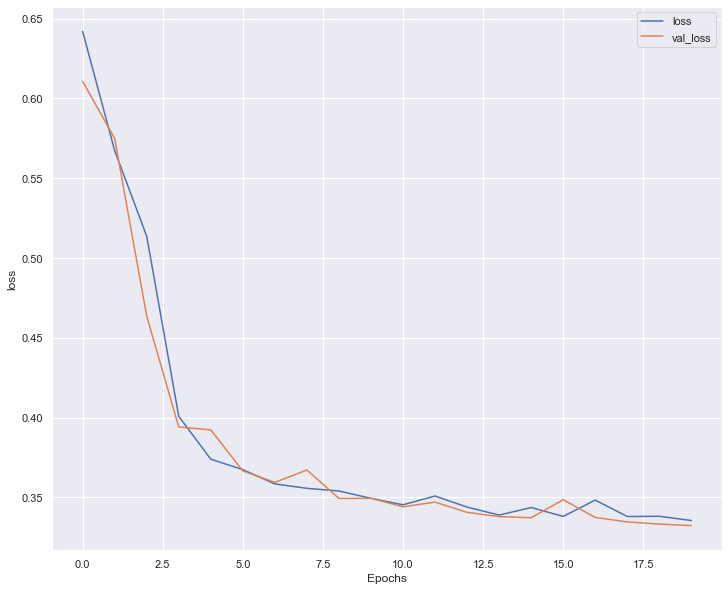

45/45 [==============================] - 0s 1ms/step


dense_layers :5
Model: "sequential_1060"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_12973 (Dense)         (None, 14)                210       
                                                                 
 dense_12974 (Dense)         (None, 14)                210       
                                                                 
 dense_12975 (Dense)         (None, 14)                210       
                                                                 
 dense_12976 (Dense)         (None, 14)                210       
                                                                 
 dense_12977 (Dense)         (None, 14)                210       
                                                                 
 dense_12978 (Dense)         (None, 2)                 30        
                                                                 
Total params: 1,080
Trainable param

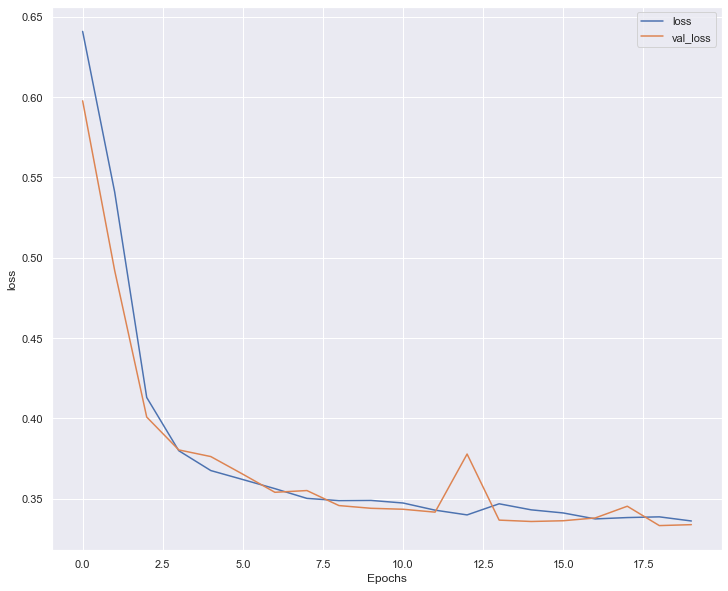

45/45 [==============================] - 0s 1ms/step


dense_layers :5
Model: "sequential_1061"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_12979 (Dense)         (None, 14)                210       
                                                                 
 dense_12980 (Dense)         (None, 14)                210       
                                                                 
 dense_12981 (Dense)         (None, 14)                210       
                                                                 
 dense_12982 (Dense)         (None, 14)                210       
                                                                 
 dense_12983 (Dense)         (None, 14)                210       
                                                                 
 dense_12984 (Dense)         (None, 2)                 30        
                                                                 
Total params: 1,080
Trainable param

Epoch 32/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3377 - accuracy: 0.8324 - precision: 0.2673 - recall: 0.9905 - val_loss: 0.3329 - val_accuracy: 0.8424 - val_precision: 0.2951 - val_recall: 1.0000
Epoch 33/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3347 - accuracy: 0.8285 - precision: 0.2673 - recall: 0.9905 - val_loss: 0.3335 - val_accuracy: 0.8375 - val_precision: 0.2951 - val_recall: 1.0000
Epoch 34/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3362 - accuracy: 0.8309 - precision: 0.2673 - recall: 0.9905 - val_loss: 0.3407 - val_accuracy: 0.8354 - val_precision: 0.2951 - val_recall: 1.0000
Epoch 35/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3343 - accuracy: 0.8381 - precision: 0.2765 - recall: 1.0000 - val_loss: 0.3347 - val_accuracy: 0.8389 - val_precision: 0.2951 - val_recall: 1.0000
Epoch 36/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3394 - accuracy: 0.8306

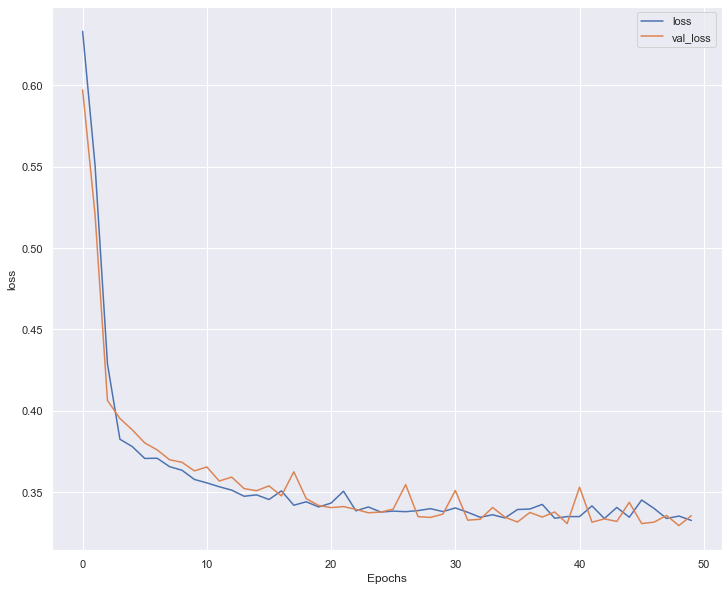

45/45 [==============================] - 0s 1ms/step


dense_layers :5
Model: "sequential_1062"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_12985 (Dense)         (None, 14)                210       
                                                                 
 dense_12986 (Dense)         (None, 14)                210       
                                                                 
 dense_12987 (Dense)         (None, 14)                210       
                                                                 
 dense_12988 (Dense)         (None, 14)                210       
                                                                 
 dense_12989 (Dense)         (None, 14)                210       
                                                                 
 dense_12990 (Dense)         (None, 2)                 30        
                                                                 
Total params: 1,080
Trainable param

Epoch 32/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3338 - accuracy: 0.8330 - precision: 0.2673 - recall: 0.9905 - val_loss: 0.3288 - val_accuracy: 0.8403 - val_precision: 0.2951 - val_recall: 1.0000
Epoch 33/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3326 - accuracy: 0.8300 - precision: 0.2673 - recall: 0.9905 - val_loss: 0.3298 - val_accuracy: 0.8403 - val_precision: 0.2951 - val_recall: 1.0000
Epoch 34/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3347 - accuracy: 0.8339 - precision: 0.2673 - recall: 0.9905 - val_loss: 0.3736 - val_accuracy: 0.8165 - val_precision: 0.2951 - val_recall: 1.0000
Epoch 35/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3387 - accuracy: 0.8312 - precision: 0.2765 - recall: 1.0000 - val_loss: 0.3291 - val_accuracy: 0.8438 - val_precision: 0.2951 - val_recall: 1.0000
Epoch 36/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3345 - accuracy: 0.8351

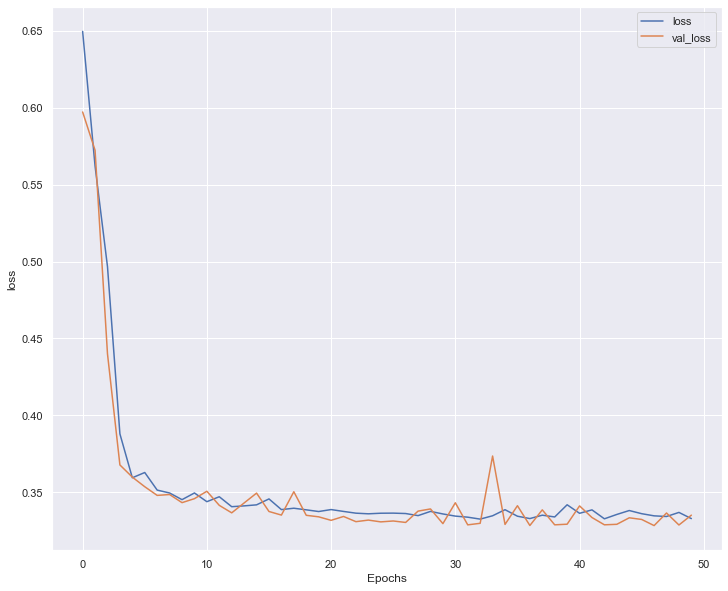

45/45 [==============================] - 0s 1ms/step


dense_layers :7
Model: "sequential_1063"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_12991 (Dense)         (None, 14)                210       
                                                                 
 dense_12992 (Dense)         (None, 14)                210       
                                                                 
 dense_12993 (Dense)         (None, 14)                210       
                                                                 
 dense_12994 (Dense)         (None, 14)                210       
                                                                 
 dense_12995 (Dense)         (None, 14)                210       
                                                                 
 dense_12996 (Dense)         (None, 14)                210       
                                                                 
 dense_12997 (Dense)         (None,

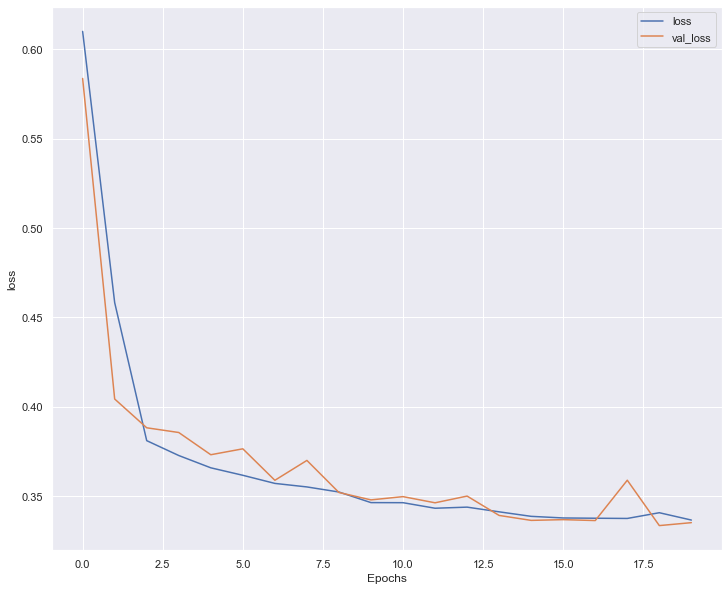

45/45 [==============================] - 0s 1ms/step


dense_layers :7
Model: "sequential_1064"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_12999 (Dense)         (None, 14)                210       
                                                                 
 dense_13000 (Dense)         (None, 14)                210       
                                                                 
 dense_13001 (Dense)         (None, 14)                210       
                                                                 
 dense_13002 (Dense)         (None, 14)                210       
                                                                 
 dense_13003 (Dense)         (None, 14)                210       
                                                                 
 dense_13004 (Dense)         (None, 14)                210       
                                                                 
 dense_13005 (Dense)         (None,

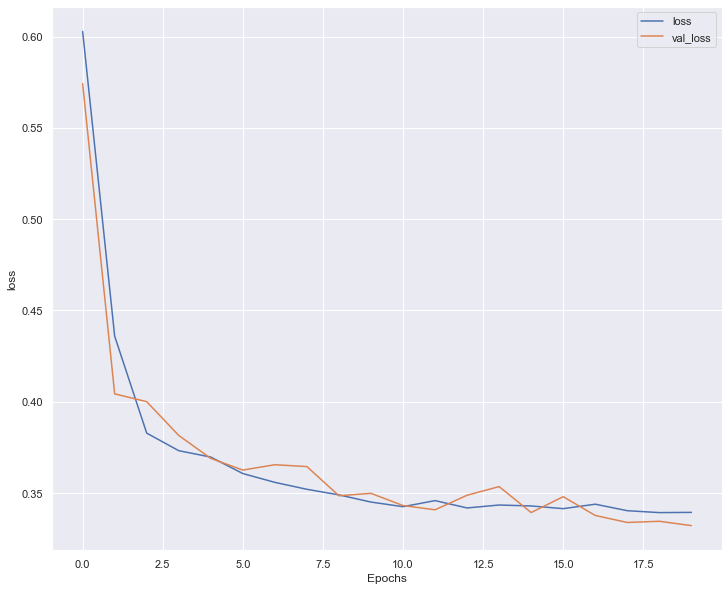

45/45 [==============================] - 0s 970us/step


dense_layers :7
Model: "sequential_1065"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_13007 (Dense)         (None, 14)                210       
                                                                 
 dense_13008 (Dense)         (None, 14)                210       
                                                                 
 dense_13009 (Dense)         (None, 14)                210       
                                                                 
 dense_13010 (Dense)         (None, 14)                210       
                                                                 
 dense_13011 (Dense)         (None, 14)                210       
                                                                 
 dense_13012 (Dense)         (None, 14)                210       
                                                                 
 dense_13013 (Dense)         (None,

Epoch 31/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3325 - accuracy: 0.8309 - precision: 0.2685 - recall: 0.9904 - val_loss: 0.3244 - val_accuracy: 0.8375 - val_precision: 0.2972 - val_recall: 0.9889
Epoch 32/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3299 - accuracy: 0.8399 - precision: 0.2685 - recall: 0.9904 - val_loss: 0.3250 - val_accuracy: 0.8410 - val_precision: 0.2972 - val_recall: 0.9889
Epoch 33/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3280 - accuracy: 0.8351 - precision: 0.2685 - recall: 0.9904 - val_loss: 0.3217 - val_accuracy: 0.8473 - val_precision: 0.2972 - val_recall: 0.9889
Epoch 34/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3272 - accuracy: 0.8369 - precision: 0.2685 - recall: 0.9904 - val_loss: 0.3240 - val_accuracy: 0.8424 - val_precision: 0.2972 - val_recall: 0.9889
Epoch 35/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3294 - accuracy: 0.8321

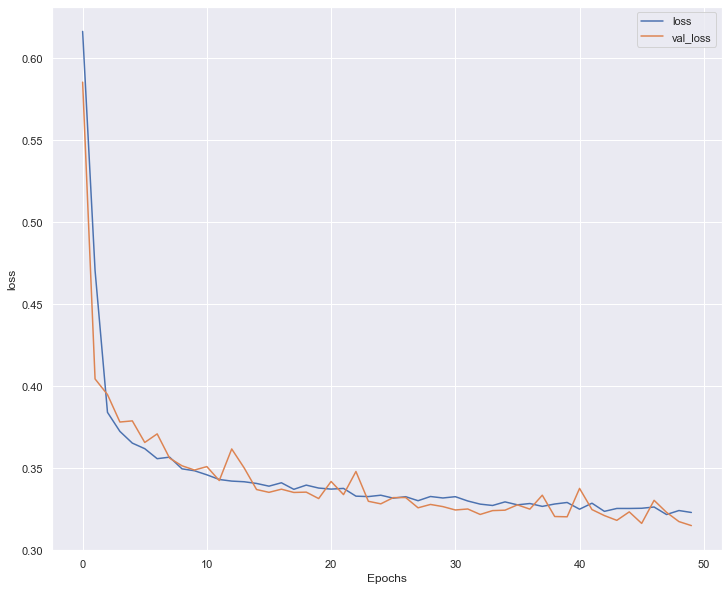

45/45 [==============================] - 0s 1ms/step


dense_layers :7
Model: "sequential_1066"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_13015 (Dense)         (None, 14)                210       
                                                                 
 dense_13016 (Dense)         (None, 14)                210       
                                                                 
 dense_13017 (Dense)         (None, 14)                210       
                                                                 
 dense_13018 (Dense)         (None, 14)                210       
                                                                 
 dense_13019 (Dense)         (None, 14)                210       
                                                                 
 dense_13020 (Dense)         (None, 14)                210       
                                                                 
 dense_13021 (Dense)         (None,

Epoch 31/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3348 - accuracy: 0.8276 - precision: 0.2685 - recall: 0.9952 - val_loss: 0.3282 - val_accuracy: 0.8375 - val_precision: 0.2972 - val_recall: 0.9889
Epoch 32/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3324 - accuracy: 0.8321 - precision: 0.2685 - recall: 0.9856 - val_loss: 0.3298 - val_accuracy: 0.8368 - val_precision: 0.2972 - val_recall: 0.9889
Epoch 33/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3318 - accuracy: 0.8351 - precision: 0.2685 - recall: 0.9856 - val_loss: 0.3281 - val_accuracy: 0.8410 - val_precision: 0.2972 - val_recall: 0.9889
Epoch 34/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3329 - accuracy: 0.8360 - precision: 0.2730 - recall: 1.0000 - val_loss: 0.3275 - val_accuracy: 0.8431 - val_precision: 0.2972 - val_recall: 0.9889
Epoch 35/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3363 - accuracy: 0.8303

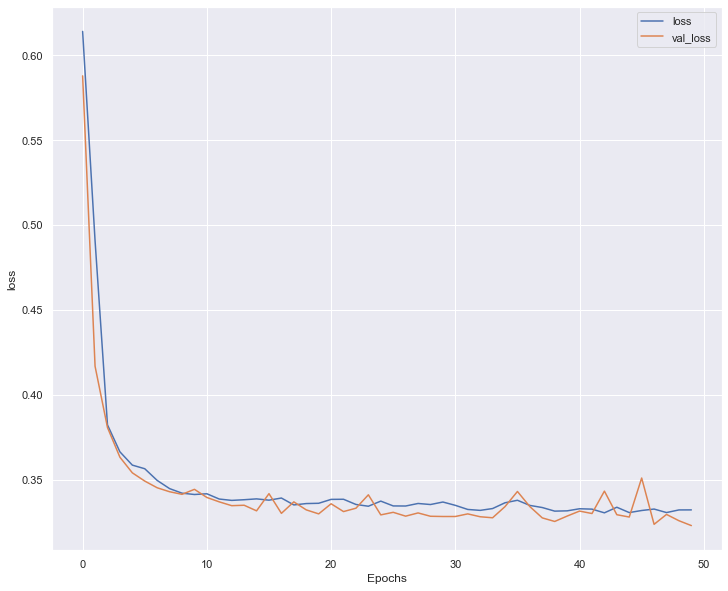

45/45 [==============================] - 0s 1ms/step


dense_layers :7
Model: "sequential_1067"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_13023 (Dense)         (None, 14)                210       
                                                                 
 dense_13024 (Dense)         (None, 14)                210       
                                                                 
 dense_13025 (Dense)         (None, 14)                210       
                                                                 
 dense_13026 (Dense)         (None, 14)                210       
                                                                 
 dense_13027 (Dense)         (None, 14)                210       
                                                                 
 dense_13028 (Dense)         (None, 14)                210       
                                                                 
 dense_13029 (Dense)         (None,

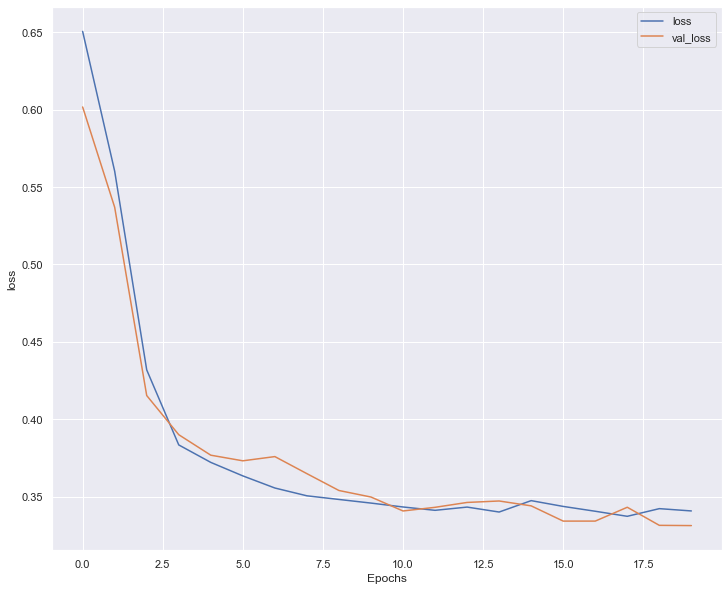

45/45 [==============================] - 0s 1ms/step


dense_layers :7
Model: "sequential_1068"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_13031 (Dense)         (None, 14)                210       
                                                                 
 dense_13032 (Dense)         (None, 14)                210       
                                                                 
 dense_13033 (Dense)         (None, 14)                210       
                                                                 
 dense_13034 (Dense)         (None, 14)                210       
                                                                 
 dense_13035 (Dense)         (None, 14)                210       
                                                                 
 dense_13036 (Dense)         (None, 14)                210       
                                                                 
 dense_13037 (Dense)         (None,

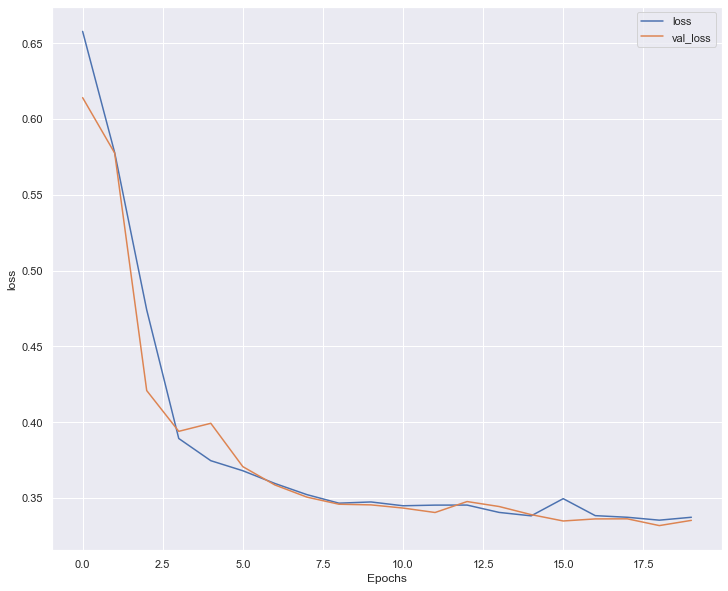

45/45 [==============================] - 0s 1ms/step


dense_layers :7
Model: "sequential_1069"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_13039 (Dense)         (None, 14)                210       
                                                                 
 dense_13040 (Dense)         (None, 14)                210       
                                                                 
 dense_13041 (Dense)         (None, 14)                210       
                                                                 
 dense_13042 (Dense)         (None, 14)                210       
                                                                 
 dense_13043 (Dense)         (None, 14)                210       
                                                                 
 dense_13044 (Dense)         (None, 14)                210       
                                                                 
 dense_13045 (Dense)         (None,

Epoch 31/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3350 - accuracy: 0.8297 - precision: 0.2673 - recall: 0.9905 - val_loss: 0.3297 - val_accuracy: 0.8403 - val_precision: 0.2951 - val_recall: 1.0000
Epoch 32/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3338 - accuracy: 0.8294 - precision: 0.2673 - recall: 0.9905 - val_loss: 0.3374 - val_accuracy: 0.8354 - val_precision: 0.2951 - val_recall: 1.0000
Epoch 33/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3416 - accuracy: 0.8279 - precision: 0.2673 - recall: 0.9905 - val_loss: 0.3455 - val_accuracy: 0.8291 - val_precision: 0.2951 - val_recall: 1.0000
Epoch 34/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3337 - accuracy: 0.8360 - precision: 0.2673 - recall: 0.9905 - val_loss: 0.3298 - val_accuracy: 0.8396 - val_precision: 0.2951 - val_recall: 1.0000
Epoch 35/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3346 - accuracy: 0.8351

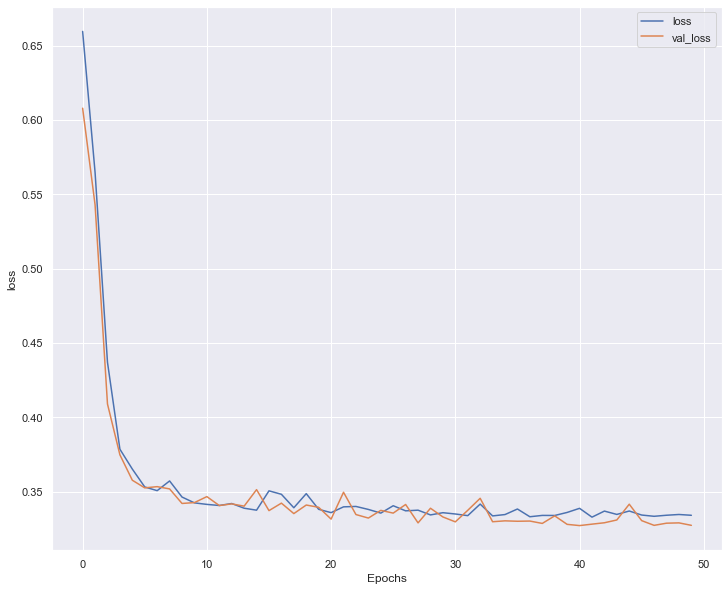

45/45 [==============================] - 0s 936us/step


dense_layers :7
Model: "sequential_1070"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_13047 (Dense)         (None, 14)                210       
                                                                 
 dense_13048 (Dense)         (None, 14)                210       
                                                                 
 dense_13049 (Dense)         (None, 14)                210       
                                                                 
 dense_13050 (Dense)         (None, 14)                210       
                                                                 
 dense_13051 (Dense)         (None, 14)                210       
                                                                 
 dense_13052 (Dense)         (None, 14)                210       
                                                                 
 dense_13053 (Dense)         (None,

Epoch 31/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3364 - accuracy: 0.8327 - precision: 0.2673 - recall: 0.9905 - val_loss: 0.3267 - val_accuracy: 0.8403 - val_precision: 0.2951 - val_recall: 1.0000
Epoch 32/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3359 - accuracy: 0.8321 - precision: 0.2673 - recall: 0.9905 - val_loss: 0.3315 - val_accuracy: 0.8396 - val_precision: 0.2951 - val_recall: 1.0000
Epoch 33/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3344 - accuracy: 0.8339 - precision: 0.2673 - recall: 0.9905 - val_loss: 0.3567 - val_accuracy: 0.8235 - val_precision: 0.2951 - val_recall: 1.0000
Epoch 34/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3370 - accuracy: 0.8288 - precision: 0.2673 - recall: 0.9905 - val_loss: 0.3270 - val_accuracy: 0.8424 - val_precision: 0.2951 - val_recall: 1.0000
Epoch 35/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3367 - accuracy: 0.8321

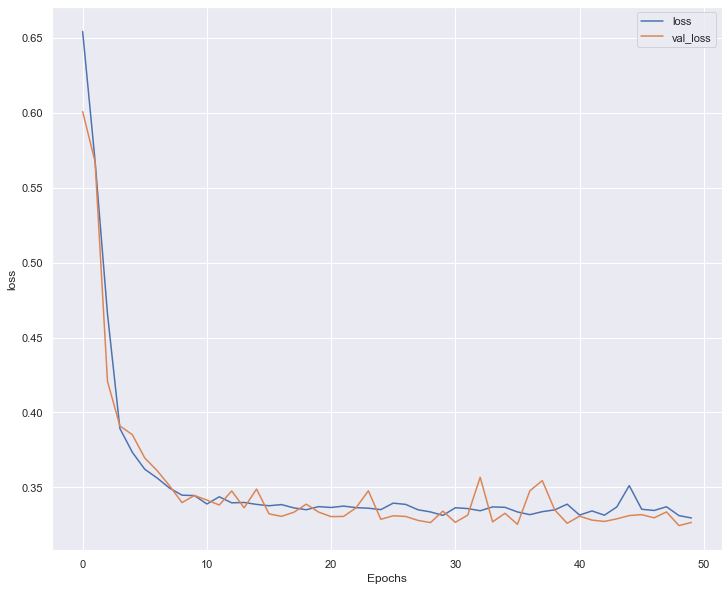

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_1071"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_13055 (Dense)         (None, 14)                210       
                                                                 
 dense_13056 (Dense)         (None, 14)                210       
                                                                 
 dense_13057 (Dense)         (None, 14)                210       
                                                                 
 dense_13058 (Dense)         (None, 14)                210       
                                                                 
 dense_13059 (Dense)         (None, 14)                210       
                                                                 
 dense_13060 (Dense)         (None, 14)                210       
                                                                 
 dense_13061 (Dense)         (None

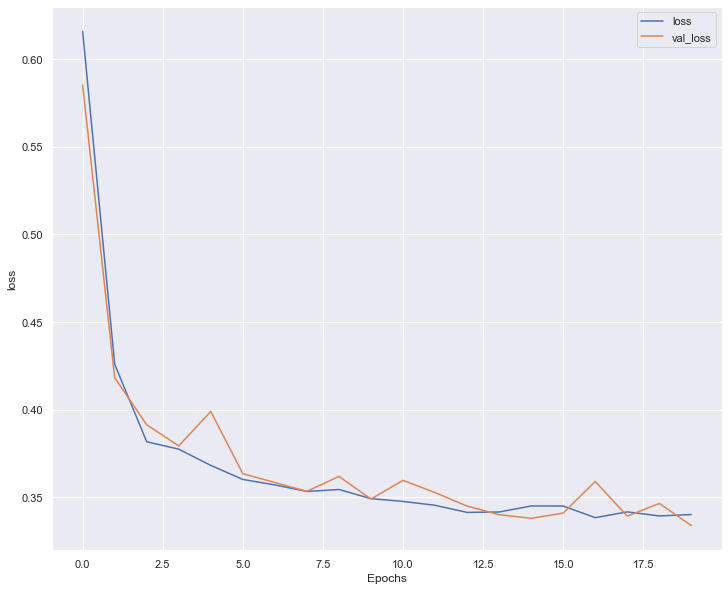

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_1072"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_13066 (Dense)         (None, 14)                210       
                                                                 
 dense_13067 (Dense)         (None, 14)                210       
                                                                 
 dense_13068 (Dense)         (None, 14)                210       
                                                                 
 dense_13069 (Dense)         (None, 14)                210       
                                                                 
 dense_13070 (Dense)         (None, 14)                210       
                                                                 
 dense_13071 (Dense)         (None, 14)                210       
                                                                 
 dense_13072 (Dense)         (None

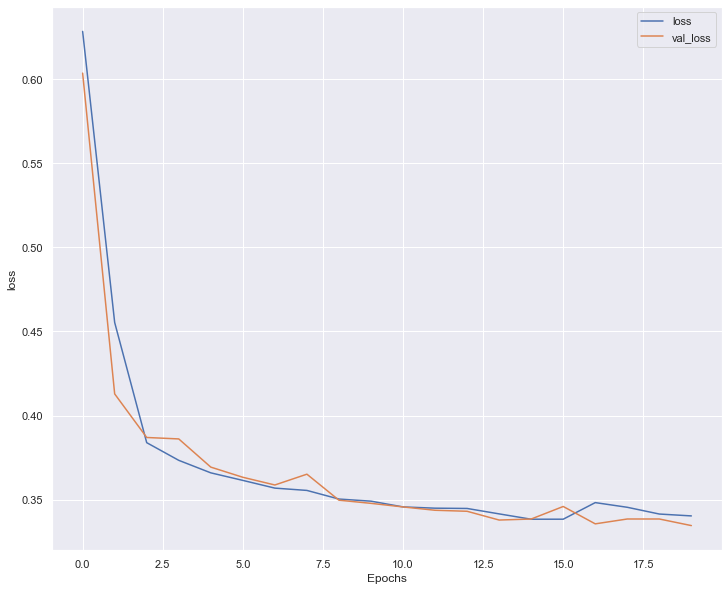

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_1073"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_13077 (Dense)         (None, 14)                210       
                                                                 
 dense_13078 (Dense)         (None, 14)                210       
                                                                 
 dense_13079 (Dense)         (None, 14)                210       
                                                                 
 dense_13080 (Dense)         (None, 14)                210       
                                                                 
 dense_13081 (Dense)         (None, 14)                210       
                                                                 
 dense_13082 (Dense)         (None, 14)                210       
                                                                 
 dense_13083 (Dense)         (None

Epoch 29/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3353 - accuracy: 0.8363 - precision: 0.2685 - recall: 0.9856 - val_loss: 0.3368 - val_accuracy: 0.8340 - val_precision: 0.2972 - val_recall: 0.9889
Epoch 30/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3370 - accuracy: 0.8267 - precision: 0.2685 - recall: 0.9952 - val_loss: 0.3408 - val_accuracy: 0.8333 - val_precision: 0.2972 - val_recall: 0.9889
Epoch 31/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3371 - accuracy: 0.8333 - precision: 0.2685 - recall: 0.9904 - val_loss: 0.3546 - val_accuracy: 0.8242 - val_precision: 0.2972 - val_recall: 0.9889
Epoch 32/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3378 - accuracy: 0.8306 - precision: 0.2685 - recall: 0.9904 - val_loss: 0.3412 - val_accuracy: 0.8326 - val_precision: 0.2972 - val_recall: 0.9889
Epoch 33/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3362 - accuracy: 0.8291

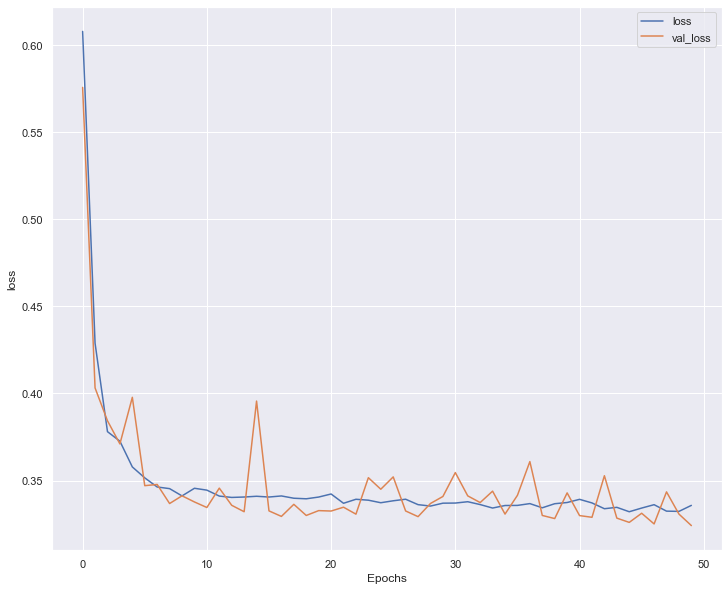

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_1074"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_13088 (Dense)         (None, 14)                210       
                                                                 
 dense_13089 (Dense)         (None, 14)                210       
                                                                 
 dense_13090 (Dense)         (None, 14)                210       
                                                                 
 dense_13091 (Dense)         (None, 14)                210       
                                                                 
 dense_13092 (Dense)         (None, 14)                210       
                                                                 
 dense_13093 (Dense)         (None, 14)                210       
                                                                 
 dense_13094 (Dense)         (None

Epoch 29/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3351 - accuracy: 0.8315 - precision: 0.2685 - recall: 0.9904 - val_loss: 0.3342 - val_accuracy: 0.8375 - val_precision: 0.2972 - val_recall: 0.9889
Epoch 30/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3353 - accuracy: 0.8291 - precision: 0.2730 - recall: 1.0000 - val_loss: 0.3267 - val_accuracy: 0.8445 - val_precision: 0.2972 - val_recall: 0.9889
Epoch 31/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3357 - accuracy: 0.8318 - precision: 0.2730 - recall: 0.9904 - val_loss: 0.3272 - val_accuracy: 0.8431 - val_precision: 0.2972 - val_recall: 0.9889
Epoch 32/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3386 - accuracy: 0.8300 - precision: 0.2685 - recall: 0.9809 - val_loss: 0.3282 - val_accuracy: 0.8445 - val_precision: 0.2972 - val_recall: 0.9889
Epoch 33/50
209/209 [==============================] - 0s 2ms/step - loss: 0.3355 - accuracy: 0.8303

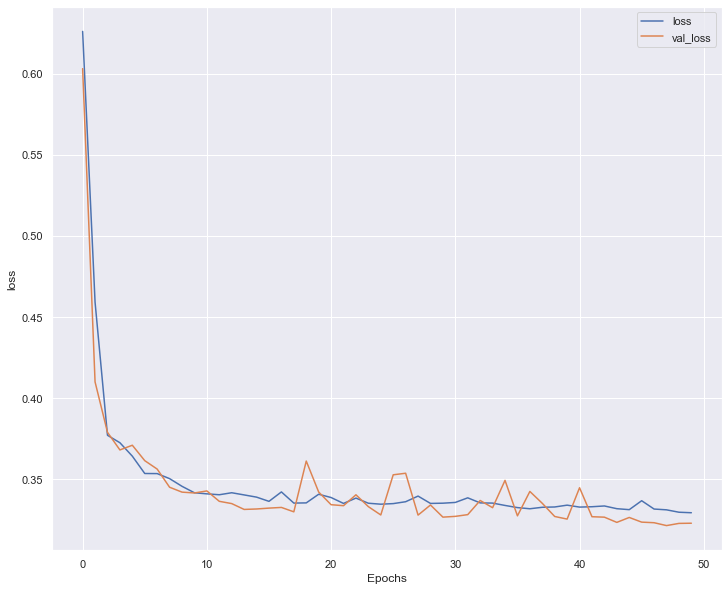

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_1075"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_13099 (Dense)         (None, 14)                210       
                                                                 
 dense_13100 (Dense)         (None, 14)                210       
                                                                 
 dense_13101 (Dense)         (None, 14)                210       
                                                                 
 dense_13102 (Dense)         (None, 14)                210       
                                                                 
 dense_13103 (Dense)         (None, 14)                210       
                                                                 
 dense_13104 (Dense)         (None, 14)                210       
                                                                 
 dense_13105 (Dense)         (None

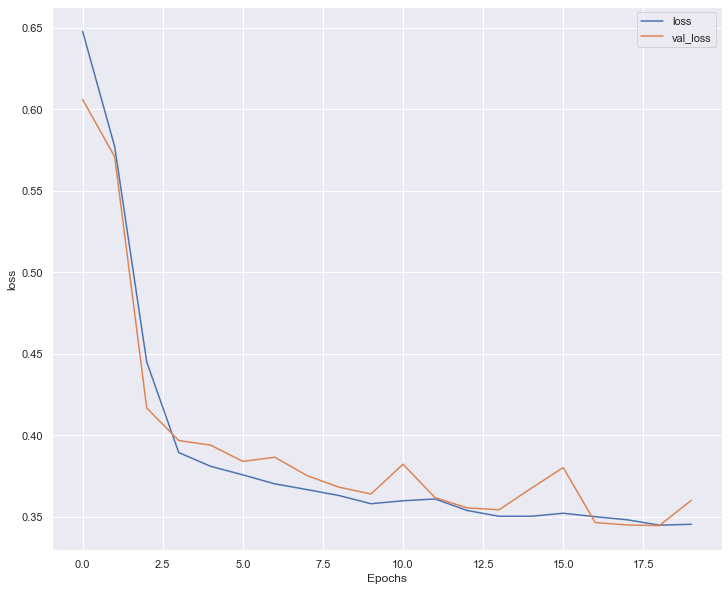

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_1076"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_13110 (Dense)         (None, 14)                210       
                                                                 
 dense_13111 (Dense)         (None, 14)                210       
                                                                 
 dense_13112 (Dense)         (None, 14)                210       
                                                                 
 dense_13113 (Dense)         (None, 14)                210       
                                                                 
 dense_13114 (Dense)         (None, 14)                210       
                                                                 
 dense_13115 (Dense)         (None, 14)                210       
                                                                 
 dense_13116 (Dense)         (None

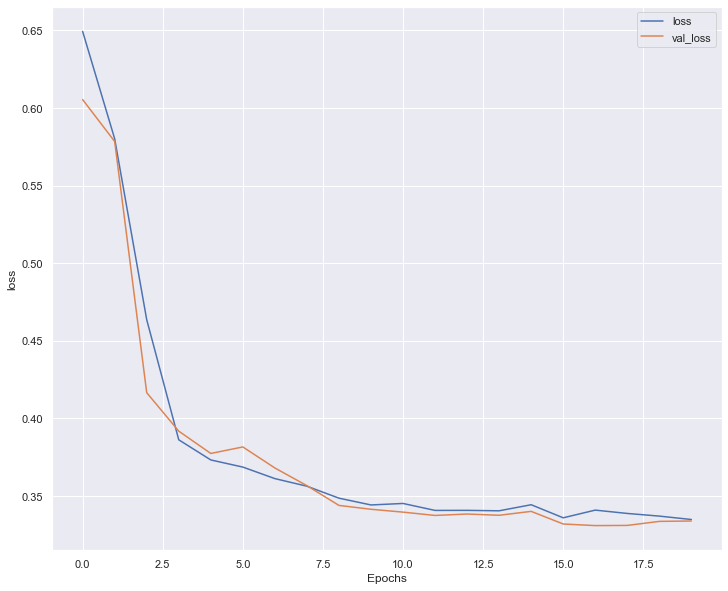

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_1077"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_13121 (Dense)         (None, 14)                210       
                                                                 
 dense_13122 (Dense)         (None, 14)                210       
                                                                 
 dense_13123 (Dense)         (None, 14)                210       
                                                                 
 dense_13124 (Dense)         (None, 14)                210       
                                                                 
 dense_13125 (Dense)         (None, 14)                210       
                                                                 
 dense_13126 (Dense)         (None, 14)                210       
                                                                 
 dense_13127 (Dense)         (None

Epoch 29/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3393 - accuracy: 0.8339 - precision: 0.2765 - recall: 1.0000 - val_loss: 0.3447 - val_accuracy: 0.8284 - val_precision: 0.2951 - val_recall: 1.0000
Epoch 30/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3393 - accuracy: 0.8264 - precision: 0.2673 - recall: 0.9905 - val_loss: 0.3327 - val_accuracy: 0.8410 - val_precision: 0.2951 - val_recall: 1.0000
Epoch 31/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3358 - accuracy: 0.8303 - precision: 0.2673 - recall: 0.9905 - val_loss: 0.3333 - val_accuracy: 0.8382 - val_precision: 0.2951 - val_recall: 1.0000
Epoch 32/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3348 - accuracy: 0.8318 - precision: 0.2765 - recall: 1.0000 - val_loss: 0.3325 - val_accuracy: 0.8438 - val_precision: 0.2951 - val_recall: 1.0000
Epoch 33/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3384 - accuracy: 0.8300

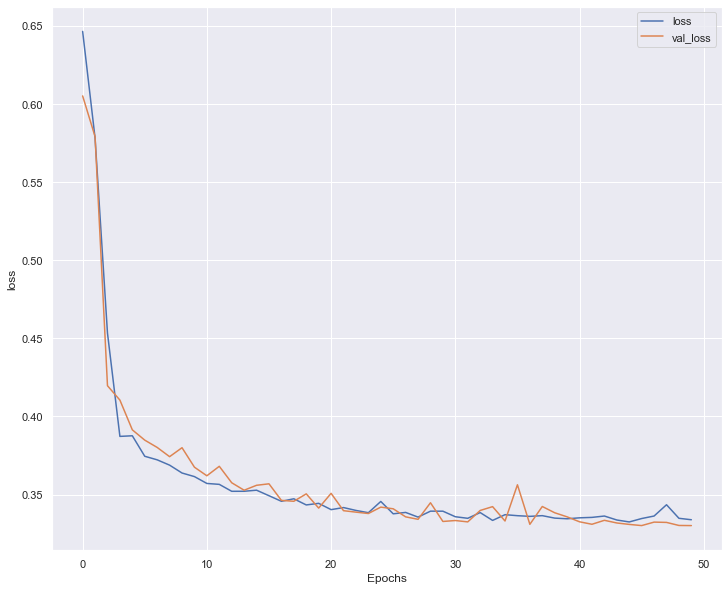

45/45 [==============================] - 0s 1ms/step


dense_layers :10
Model: "sequential_1078"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_13132 (Dense)         (None, 14)                210       
                                                                 
 dense_13133 (Dense)         (None, 14)                210       
                                                                 
 dense_13134 (Dense)         (None, 14)                210       
                                                                 
 dense_13135 (Dense)         (None, 14)                210       
                                                                 
 dense_13136 (Dense)         (None, 14)                210       
                                                                 
 dense_13137 (Dense)         (None, 14)                210       
                                                                 
 dense_13138 (Dense)         (None

Epoch 29/50
105/105 [==============================] - 0s 2ms/step - loss: 0.3371 - accuracy: 0.8312 - precision: 0.2673 - recall: 0.9905 - val_loss: 0.3299 - val_accuracy: 0.8438 - val_precision: 0.2951 - val_recall: 1.0000
Epoch 30/50
105/105 [==============================] - 0s 3ms/step - loss: 0.3325 - accuracy: 0.8333 - precision: 0.2673 - recall: 0.9905 - val_loss: 0.3398 - val_accuracy: 0.8403 - val_precision: 0.2951 - val_recall: 1.0000
Epoch 31/50
105/105 [==============================] - 0s 3ms/step - loss: 0.3363 - accuracy: 0.8303 - precision: 0.2673 - recall: 0.9905 - val_loss: 0.3346 - val_accuracy: 0.8396 - val_precision: 0.2951 - val_recall: 1.0000
Epoch 32/50
105/105 [==============================] - 0s 3ms/step - loss: 0.3364 - accuracy: 0.8345 - precision: 0.2673 - recall: 0.9905 - val_loss: 0.3304 - val_accuracy: 0.8417 - val_precision: 0.2951 - val_recall: 1.0000
Epoch 33/50
105/105 [==============================] - 0s 3ms/step - loss: 0.3343 - accuracy: 0.8360

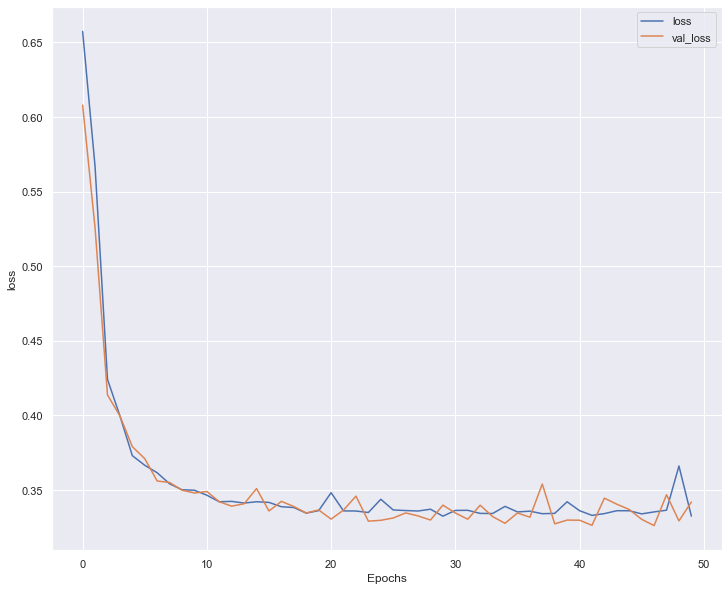

45/45 [==============================] - 0s 957us/step


In [224]:
param_grid = dict(dense_layers = dense_layers
                    , batch_size = batch_size
                    , epochs = epochs
                   , dense_dropout = dense_dropout
                 )

keys = param_grid.keys()
values = (param_grid[key] for key in keys)
param_grid = [dict(zip(keys, param_grid)) for param_grid in itertools.product(*values)]

print('Proposed ' + str(len(param_grid)) + ' models')

for j in range(0, len(param_grid)):
    
    dense_layers = param_grid[j].get("dense_layers")
    batch_size = param_grid[j].get("batch_size")
    epochs = param_grid[j].get("epochs")
    dense_dropout = param_grid[j].get("dense_dropout")
    
    model = make_model_Lineal(dense_layers = dense_layers
                   , dense_dropout = dense_dropout
                   , verbose = 1)
    print('batch_size :' + str(batch_size))
    
    history = model.fit(train_features,
                        train_labels,
                        batch_size = batch_size,
                        epochs = epochs,
                        validation_data = (val_features, val_labels), 
                        verbose = 1)
    
    plot_history_train(history, 'loss')
    
    # Calculate validation metrics
    y_val_pred = model.predict(val_features)
    y_val_pred = np.argmax(y_val_pred, axis=1)
    val_conf_mat = confusion_matrix(val_labels, y_val_pred)
    tn, fp, fn, tp = val_conf_mat.ravel()
    val_sensitivity = tp / (tp + fn)
    val_specificity = tn / (tn + fp)
    val_f1_score = f1_score(val_labels, y_val_pred, average='macro')
    
    # Update results
    val_loss = pd.DataFrame.from_dict(history.history)['val_loss'].iloc[-1]
    val_accuracy = pd.DataFrame.from_dict(history.history)['val_accuracy'].iloc[-1]
    loss = pd.DataFrame.from_dict(history.history)['loss'].iloc[-1]
    accuracy = pd.DataFrame.from_dict(history.history)['accuracy'].iloc[-1]
    param_grid[j].update({"loss": loss})
    param_grid[j].update({"accuracy": accuracy})
    param_grid[j].update({"val_loss": val_loss})
    param_grid[j].update({"val_accuracy": val_accuracy})
    param_grid[j].update({"val_sensitivity": val_sensitivity})
    param_grid[j].update({"val_specificity": val_specificity})
    param_grid[j].update({"val_f1_score": val_f1_score})

results_Lineal_Reducido= pd.DataFrame(param_grid)

In [225]:
results_Lineal_Reducido.sort_values(['val_loss'],ascending = True)

,dense_layers,batch_size,epochs,dense_dropout,loss,accuracy,val_loss,val_accuracy,val_sensitivity,val_specificity,val_f1_score
10,7,16,50,0.0,0.322901,0.839892,0.314897,0.846639,0.747017,0.888008,0.815964
11,7,16,50,0.3,0.332111,0.831181,0.322862,0.840336,0.668258,0.911794,0.800204
19,10,16,50,0.3,0.329401,0.833884,0.322944,0.843838,0.689737,0.907830,0.806541
18,10,16,50,0.0,0.335716,0.829078,0.324107,0.845238,0.727924,0.893954,0.812460
2,5,16,50,0.0,0.331529,0.832682,0.325829,0.845938,0.701671,0.905847,0.810150
3,5,16,50,0.3,0.332229,0.833584,0.326371,0.842437,0.744630,0.883053,0.811437
15,7,32,50,0.3,0.329591,0.836287,0.326609,0.838936,0.639618,0.921705,0.794846
14,7,32,50,0.0,0.334087,0.831781,0.327331,0.843137,0.713604,0.896928,0.808683
22,10,32,50,0.0,0.333843,0.834184,0.330103,0.845238,0.715990,0.898910,0.811108
12,7,32,20,0.0,0.340843,0.832082,0.331381,0.837535,0.682578,0.901883,0.799191


Gracias a la tabla anterior se puede extraer la información que los mejores hiper parámetros del grid search de la <b>arquitectura lineal óptima aplicando selección de variables</b> se han conseguido en la <i>10º</i> red neuronal:
* Dense Layers: 7

* Batch Size: 16

* Epochs: 50

* Dense Dropout: 0%

obteniendo unas métricas bastante favorables en test:
				
* Loss: 0.314897
				
* Accuracy: 0.846639
				
* Sensitivity: 0.747017

* Specificity: 0.888008

* F1-score: 0.815964

<b>Comparación de los score obtenidos del modelo lineal óptima SIN selección de variables y CON selección de variables.</b>

<table>
    
  <tr>
    <th>Modelo</th>
    <th>Loss</th>
    <th>Accuracy</th>
    <th>Sensibilidad</th>
    <th>Especificidad</th>
    <th>F1-Score</th>
  </tr>

  <tr>
    <td>Modelo lineal SIN selección de variables</td>
    <td>0.3171</td>
    <td>0.8452</td>
    <td>0.7306</td>
    <td>0.8917</td>
    <td>0.8114</td>
  </tr>

  <tr>
    <td>Modelo lineal CON selección de variables</td>
    <td>0.3149</td>
    <td>0.8467</td>
    <td>0.7471</td>
    <td>0.8880</td>
    <td>0.8159</td>
  </tr>
</table>


Esta comparación es extramadamente similar, como cabría esperar. Disminuyendo el número de variables predicotoras, se consigue igualar el modelo más complejo e incluso se mejora la Sensibilidad, por lo que es muy buena señal.

Se ha creado un modelo más simple y versátil ya que el dimensionamiento de conjunto de datos ha pasado de <i>39</i> a <i>14</i>, obtiendo los mismos score que un modelo un poco más complejo, por lo que la decisión está clara. Se han cumplido las expectativas.

La elección del modelo final será el <b>Modelo Lineal aplicando una reducción de variables predicotras</b>. Esta decisión es totalmente subjetiva.

<center><b>9 - CONCLUSIÓN Y ELECCIÓN DE LA RED NEURONAL ÓPTIMA</b></center>

En esta sección se presentan las conclusiones finales del proyecto. El objetivo es probar distintas arquitecturas de redes neuronales y ajustar hiper parámetros para conseguir el mejor rendimiento y optimizar las score obtenidas para la clasificación e indentifiación de las victorias en el <i>LOL</i> del equipo Azul y Rojo, etiquetados como 0 y 1, respectivamente.

Para conseguir el objetivo, se han creado 3 tipos de arquitecturas: <b>modelo lineal</b>, <i>modelo en forma de limón</i> y <i>modelo decreciente</i>, siendo la primera la considera como la óptima. Seguidamente, se prueban una seria de hiper parámetros para conseguir mejores rendimientos mediante la técnica <i>grid search</i>. En esta sección, se concluyó que la mejor modificación fue la de disminuir los valores de <b>batch size</b> y <b>dense layers</b> respecto al modelo referente. Además se probarón la inserción de <i>regularización de Lasso</i>, un cambio de la función de activación de la última capa densa a <i>sigmoid</i> y modificación de función de pérdida <i>binary_crossentropy</i>.

<center><b>Arquitectura Óptima de la Red Neuronal</b></center>

![Arquitectura Óptima de la Red Neuronal](https://www.cognex.com/library/media/blogs/deep-learning-blogs/2019/deep-learning-neural-networks.jfif?sc_lang=es-ar&hash=BC8D25449612AD2B64CF3F42852C01A4)



Una vez elegida la arquitectura y ajuste de hiper parámetros óptimos, se aplicó técnicas en reducción de variables para conseguir score más elevadas. El primer modelo fue el cálculo de <i>VIF</i> obtiendo unos resultados desfavorables en cuenta a la visión de negocio. Por otra parte, se aplicó <b>Random Forest</b> resultando ser la mejor técnica de reducción de variables ya que su output tiene todo el sentido del mundo en un punto de vista del <i>LOL</i>. Los atributos significativos resultantes son los siguientes, los cuales se orden de mayor importancia a menor:

* blueGoldDiff
* redGoldDiff
* blueHeralds
* redWardsPlaced
* blueWardsPlaced
* redHeralds
* gameId
* redTotalExperience
* blueTotalExperience
* blueTotalJungleMinionsKilled
* redExperienceDiff
* blueExperienceDiff
* redTotalJungleMinionsKilled
* blueAssists  

Posteriormente a la reducción del dimensionamiento del conjuto de datos, se entrena una red neuronal con las misma arquitectura (<i>Lineal</i>) y los mismos hiper parámetros mediante la técnica de grid search (<i>batch size</i>:16, 32; <i>epochs</i>: 20, 50; <i>dense layers</i>: 5, 7, 10; <i>dense dropout</i>: 0.0, 0.3). 
Se obtienen mejores resultados utilizando el conjunto de datos que se le ha aplicado una reducción de la dimensionalidad, por lo que se elige como modelo óptimo y final del presente proyecto.

<b>CARACTERÍSTICAS Y MÉTRICAS DE LA RED NEURONAL ÓPTIMA</b>

La mejor red neuronal probada en el presente proyecto ha sido aquella que utiliza un conjunto de datos que se les ha aplicado una <b>técnica de selección de variables</b>, concretamente <b>Random Forest</b>, reduciendo el número de variables en un 65%, quedándose con 14 atributos predictores.

Además, la estructura óptima del modelo es una <b>Arquitectura Lineal</b>, es decir, que tiene el mismo número de neuronas en las capas densas excepto la última, como es evidente. 

Los mejores valores de los hiper parámetros que se han hallado son los siguientes:

* <i>Función de pérdida</i>: <b>Sparse Categorical Crossentropy</b>

* <i>Función de activación de las capas densas intermedias</i>: <b>ReLu</b>

* <i>Función de activación de la última capa densa</i>: <b>Softmax</b>

* <i>Regularización</i>: <b>No</b>

* <i>Optimizador</i>: <b>Adam</b>

* <i>Batch Size</i>: <b>16</b>

* <i>Epochs</i>: <b>50</b>

* <i>Dense Layers</i>: <b>7</b>

* <i>Dense Dropout</i>: <b>0%</b>

obteniendo unas métricas:
* <i>Loss</i>: <b>31.49%</b>

* <i>Accuracy</i>: <b>84.66%</b>

* <i>Sensitivity</i>: <b>74.71%</b>

* <i>Specificity</i>: <b>88.80%</b>

* <i>F1-score</i>: <b>81.59%</b>